# Master's Thesis Model – Heat Pump & Buffer Tank Optimization

**Title:** The Influence of Dynamic Electricity Prices on the Sizing of Heat Pumps and Buffer Storage Tanks  
**Author:** Mitulkumar Ghanshyambhai Makwana  
**Program:** M.Eng Smart Energy Systems, Hochschule Ansbach  
**Year:** 2025  
**Model Setup:**  
- Heat Pump Size: 3 kW  
- Buffer Storage: 750 L  

This model uses real electricity price data and household heat demand to simulate system operation and determine cost-optimal control and sizing.

# 1. Load Data

## This section loads required libraries, heating demand, and electricity price data from CSV files.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import RegularGridInterpolator
from scipy.optimize import minimize

# Load Data
yearly_file = "YearHourly.csv"
spot_price_file = "Spotmarktpreis.csv"

# Load and preprocess Yearly Heating Data
yearly_data = pd.read_csv(yearly_file)
yearly_data.columns = ["Time", "Tout", "Qhouse"]
yearly_data["Time"] = pd.to_datetime(yearly_data["Time"])
yearly_data.set_index("Time", inplace=True)

yearly_data["Tout"] = pd.to_numeric(yearly_data["Tout"], errors="coerce")
yearly_data["Qhouse"] = pd.to_numeric(yearly_data["Qhouse"], errors="coerce")
yearly_data = yearly_data.dropna()

yearly_data = yearly_data[~yearly_data.index.duplicated(keep="first")]
yearly_data = yearly_data.iloc[:8760]

# Load and preprocess Spot Market Price Data
spot_price_data = pd.read_csv(spot_price_file, delimiter=";", decimal=",")
spot_price_data["Datetime"] = pd.to_datetime(
    spot_price_data["Datum"] + " " + spot_price_data["von"], dayfirst=True
)
spot_price_data["Spot_Price"] = (
    spot_price_data["Spotmarktpreis in ct/kWh"].astype(float) / 100
)
spot_price_data.set_index("Datetime", inplace=True)
spot_price_data = spot_price_data[~spot_price_data.index.duplicated(keep="first")]
spot_price_data = spot_price_data.reindex(yearly_data.index, method="ffill")

# Merge data
yearly_data = yearly_data.join(spot_price_data, how="left")
yearly_data["Price_el"] = yearly_data["Spot_Price"].ffill()

# Final verification
print(f"Total rows in yearly_data: {len(yearly_data)}")
print(yearly_data.head())

Total rows in yearly_data: 8760
                         Tout    Qhouse       Datum    von Zeitzone von  \
Time                                                                      
2023-01-01 00:00:00  9.063347  0.082094  01.01.2023  00:00          CET   
2023-01-01 01:00:00  9.139694  0.190115  01.01.2023  01:00          CET   
2023-01-01 02:00:00  8.650153  0.079032  01.01.2023  02:00          CET   
2023-01-01 03:00:00  8.456556  0.081025  01.01.2023  03:00          CET   
2023-01-01 04:00:00  8.297778  2.680690  01.01.2023  04:00          CET   

                       bis Zeitzone bis  Spotmarktpreis in ct/kWh  Spot_Price  \
Time                                                                            
2023-01-01 00:00:00  01:00          CET                    -0.517    -0.00517   
2023-01-01 01:00:00  02:00          CET                    -0.107    -0.00107   
2023-01-01 02:00:00  03:00          CET                    -0.147    -0.00147   
2023-01-01 03:00:00  04:00          C

# 2. Hear Pump & Buffer Tank Parameter

In [2]:
# Heat Pump Parameters
buffer_tank_size = 750  # liters
hourly_heat_loss_rate = 0.002
Tinit = 35  # Initial buffer temperature (°C)
Tamb = 20  # Ambient temperature (°C)
Pel = 3  # Heat pump nominal electric power (kW)
dT = 2  # Temperature hysteresis (°C)
cp = 4.2  # Specific heat capacity of water (kJ/kg·K)
buffer_heat_capacity = buffer_tank_size * cp / 3600  # Convert to kWh/°C

# Heating Curve for Flow Temperature Calculation
heatingcurve_slope = -0.235
heatingcurve_offset = 24.82
spread_temp = 7

# 3. CoP Interpolation
Interpolates CoP based on flow temperature profile.

Check CoP: Tbuffer = 37°C, Tout = 0°C, CoP = 3.40
Check CoP: Tbuffer = 55°C, Tout = 25°C, CoP = 4.00
Check CoP: Tbuffer = 30°C, Tout = -25°C, CoP = 2.75


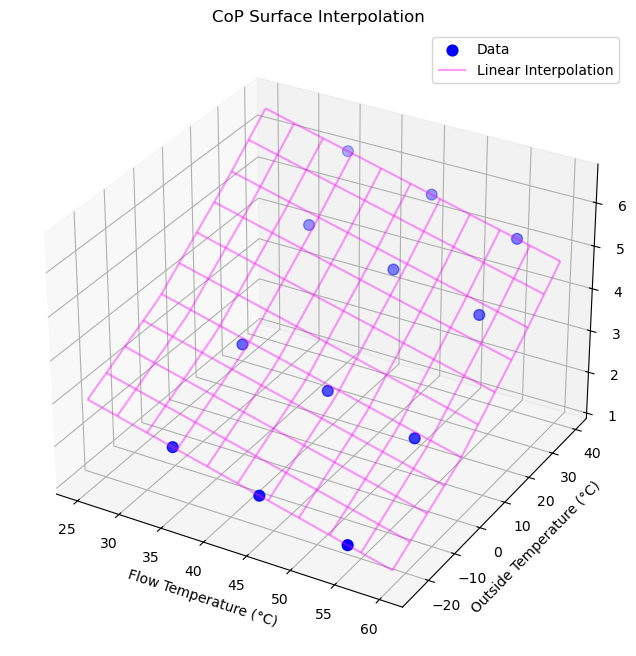

In [3]:
# Heat Pump Coefficient of Performance (CoP) Interpolation
cop_data = {
    "Temp_out": [-25, 0, 25, 40],
    "COP(35)": [2.5, 3.5, 5.0, 6.0],
    "COP(45)": [2.0, 3.0, 4.5, 5.5],
    "COP(55)": [1.5, 2.5, 4.0, 5.0]
}
temp_out = np.array(cop_data["Temp_out"])
temp_flow = np.array([35, 45, 55])
cop_values = np.array([cop_data["COP(35)"], cop_data["COP(45)"], cop_data["COP(55)"]])

cop_interp = RegularGridInterpolator((temp_flow, temp_out), cop_values, method='linear', bounds_error=False, fill_value=None)

# Function to validate interpolated CoP values
# Function to validate interpolated CoP values
def check_cop(Tflow, Tout):
    Tbuffer = Tflow  # Use Tbuffer instead of recalculated Tflow
    cop_value = cop_interp((Tbuffer, Tout))
    print(f"Check CoP: Tbuffer = {Tbuffer}°C, Tout = {Tout}°C, CoP = {cop_value:.2f}")
    assert cop_value > 0, "CoP should be positive."
    assert cop_value < 10, "CoP should be within a reasonable range."

# Perform some validation checks
check_cop(37, 0)    # Example: Buffer 37°C, Outside 0°C
check_cop(55, 25)   # Example: Buffer 55°C, Outside 25°C
check_cop(30, -25)  # Example: Buffer 30°C, Outside -25°C

# Generate 3D CoP Surface Plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(projection="3d")

# Meshgrid for data points
xg, yg = np.meshgrid(temp_flow, temp_out, indexing="ij")
ax.scatter(xg.ravel(), yg.ravel(), cop_values.ravel(), s=60, color="blue", label="Data")

# Interpolation Surface
xx = np.linspace(25, 60, 31)  # Flow temperature range
yy = np.linspace(-25, 40, 31)  # Outside temperature range
X, Y = np.meshgrid(xx, yy, indexing="ij")
Z = cop_interp((X, Y))  # Interpolated CoP values

# Plot interpolation surface
ax.plot_wireframe(X, Y, Z, rstride=3, cstride=3, alpha=0.4, color="magenta", label="Linear Interpolation")

# Add labels and legend
ax.set_xlabel("Flow Temperature (°C)")
ax.set_ylabel("Outside Temperature (°C)")
ax.set_zlabel("CoP")
ax.set_title("CoP Surface Interpolation")
ax.legend()

plt.show()

# 4. Buffer Temp Update With Loss

In [4]:
def update_buffer_temperature_with_loss(Tbuffer, Qnet, timestep):
    delta_Q = (Qnet - (Tbuffer - Tamb) * hourly_heat_loss_rate) * timestep
    delta_T = delta_Q / buffer_heat_capacity
    return Tbuffer + delta_T

# 5. Heatpump Simulation

In [5]:
def hp_sim(x, Tbuffer, Tout, Tflow, Qhouse, p):
    Qproduced = np.zeros_like(x)
    Tbuffer_ret = np.zeros_like(x)
    Qadd = 0
    Qadd_el = 0
    real_cost = 0
    penalty_cost = 0

    for hour in range(24):
        CoP = cop_interp((Tbuffer, Tout[hour]))
        Php = Pel * CoP * x[hour]

        Qnet = Php - Qhouse[hour]
        Tbuffer += Qnet / buffer_heat_capacity

        if Tbuffer < Tflow[hour]:
            Qadd = (Tflow[hour] - Tbuffer) * buffer_heat_capacity
            Qadd_el = Qadd / cop_interp((Tflow[hour], Tout[hour]))
            
        Tbuffer = update_buffer_temperature_with_loss(Tbuffer, Qadd, 1)
        real_cost += (Pel * x[hour] + Qadd_el) * (p[hour] + 0.16)
        penalty_cost += 0.1 * Qadd_el

        Tbuffer_ret[hour] = Tbuffer 
        Qproduced[hour] = Php + Qadd

    costs = real_cost + penalty_cost
    return costs, real_cost, penalty_cost, Tbuffer_ret, Qproduced

# 6. Cost Function

In [6]:
def hp_costs(x, Tbuffer, Tout, Tflow, Qhouse, p):
    _, costs, _, _, _ = hp_sim(x, Tbuffer, Tout, Tflow, Qhouse, p)
    return costs

# 7. Optimization Loop
Uses SLSQP solver to minize operational costs.


Day 1/365
Initial Guess Cost: €0.48
Optimized Daily Cost: €0.42
Total Heat Consumed (Qconsumption): 13.10 kWh
Total Heat Produced (Qproduction): 9.31 kWh
Buffer Tank Temperature at End of Day: 30.08°C
Optimized Dispatch: [0.00263632 0.00609751 0.00255557 0.00262857 0.08719778 0.04262233
 0.12980964 0.0100012  0.02684015 0.06311236 0.02373883 0.01813238
 0.02032839 0.02143053 0.02097391 0.0093963  0.0031216  0.00213565
 0.00215812 0.00212923 0.00207082 0.00208735 0.00263084 0.0076303 ]


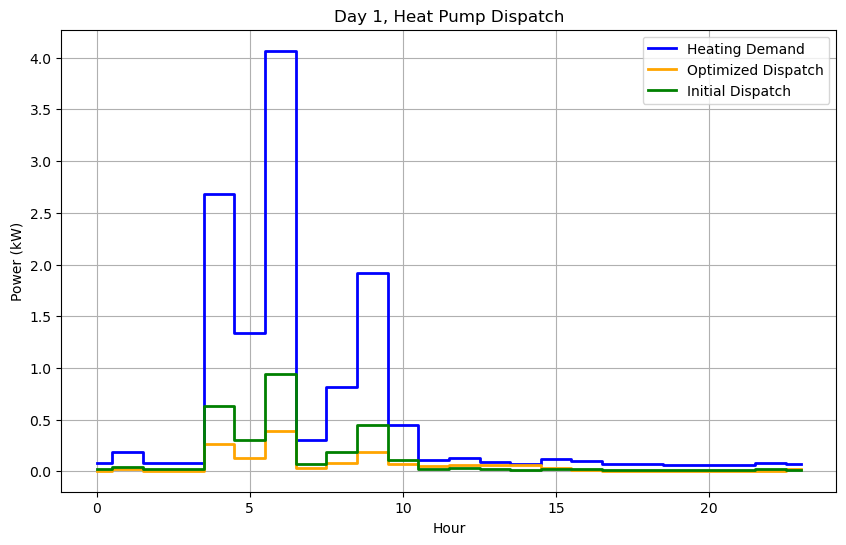


Day 2/365
Initial Guess Cost: €0.10
Optimized Daily Cost: €0.08
Total Heat Consumed (Qconsumption): 0.60 kWh
Total Heat Produced (Qproduction): 1.09 kWh
Buffer Tank Temperature at End of Day: 30.08°C
Optimized Dispatch: [0.00701938 0.00419148 0.00332023 0.00298439 0.00256805 0.00417657
 0.00234167 0.00203816 0.00535959 0.00204129 0.00206872 0.00208199
 0.00212161 0.00230142 0.0023291  0.00182173 0.00142849 0.00138172
 0.00138852 0.00147392 0.00136757 0.00070968 0.00084188 0.00106324]


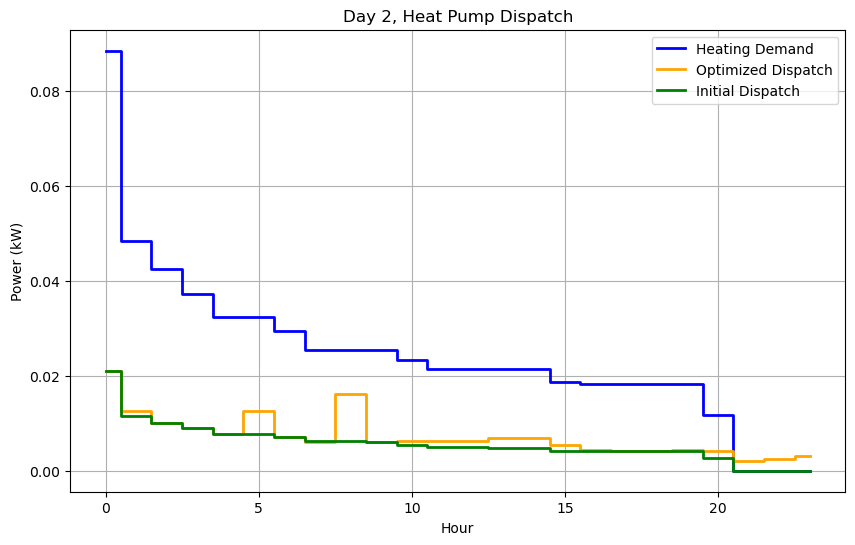


Day 3/365
Initial Guess Cost: €1.86
Optimized Daily Cost: €1.90
Total Heat Consumed (Qconsumption): 21.80 kWh
Total Heat Produced (Qproduction): 23.80 kWh
Buffer Tank Temperature at End of Day: 31.76°C
Optimized Dispatch: [6.93690690e-03 6.98608894e-03 2.97832472e-01 2.37277572e-02
 1.09095516e-02 1.06526127e-02 3.53506057e-01 2.58414158e-02
 1.33795454e-02 4.35434000e-03 3.12456484e-03 2.78143610e-03
 2.84836424e-03 4.41548253e-03 4.97264550e-03 3.20001979e-03
 3.70824061e-01 3.26379345e-02 3.35840709e-01 1.47270224e-02
 8.04158534e-03 2.52413589e-01 1.07801441e-01 1.19903156e-04]


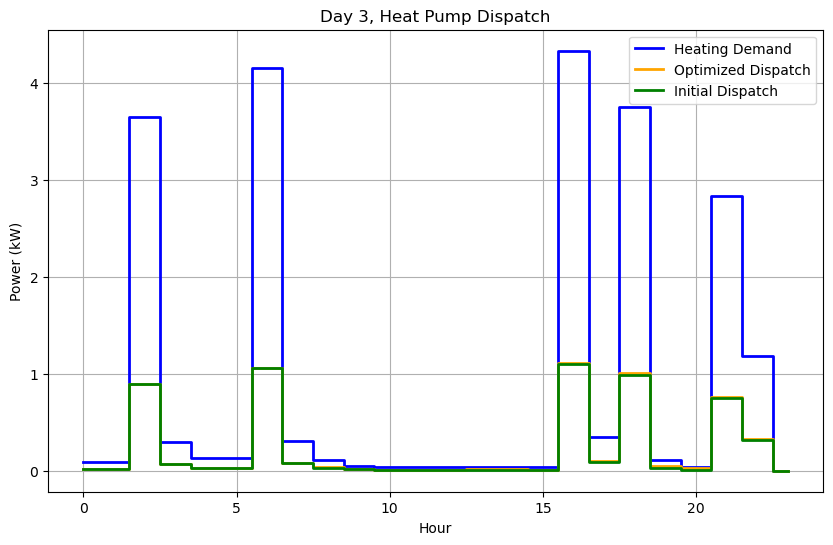


Day 4/365
Initial Guess Cost: €3.56
Optimized Daily Cost: €3.50
Total Heat Consumed (Qconsumption): 62.90 kWh
Total Heat Produced (Qproduction): 61.90 kWh
Buffer Tank Temperature at End of Day: 30.01°C
Optimized Dispatch: [0.27298962 0.13505177 0.00385874 0.00383164 0.35503298 0.02521856
 0.00223077 0.00221194 0.00218026 0.00214654 0.00209245 0.00205228
 0.00202039 0.61193087 0.71154352 0.79368437 0.52710112 0.45211323
 0.17168178 0.34758606 0.36935468 0.09591615 0.05993358 0.016576  ]


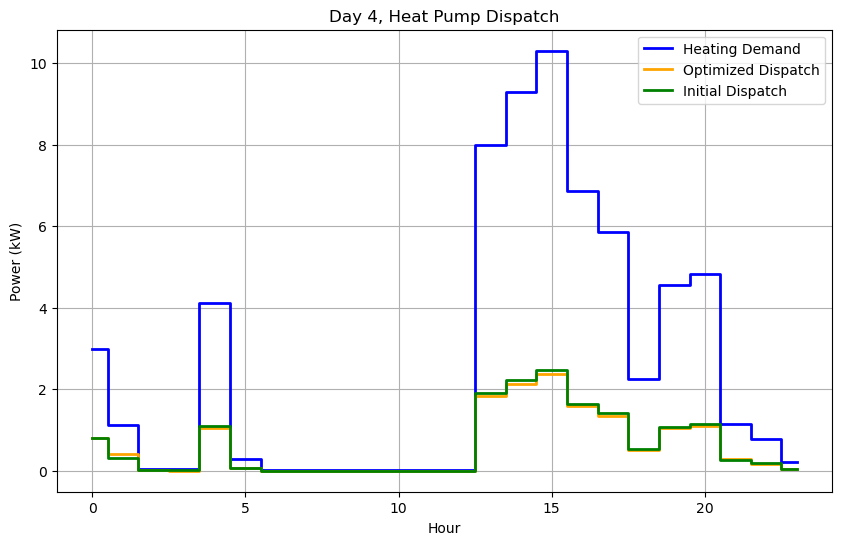


Day 5/365
Initial Guess Cost: €3.09
Optimized Daily Cost: €3.09
Total Heat Consumed (Qconsumption): 44.60 kWh
Total Heat Produced (Qproduction): 45.39 kWh
Buffer Tank Temperature at End of Day: 30.35°C
Optimized Dispatch: [0.00703787 0.02032268 0.00819261 0.00939858 0.17560671 0.24439395
 0.24323653 0.2563729  0.04148972 0.30110642 0.31472223 0.2068694
 0.15245279 0.17867584 0.18277622 0.06206286 0.1974488  0.22817473
 0.20613228 0.18339351 0.12059079 0.18627944 0.0169208  0.00513416]


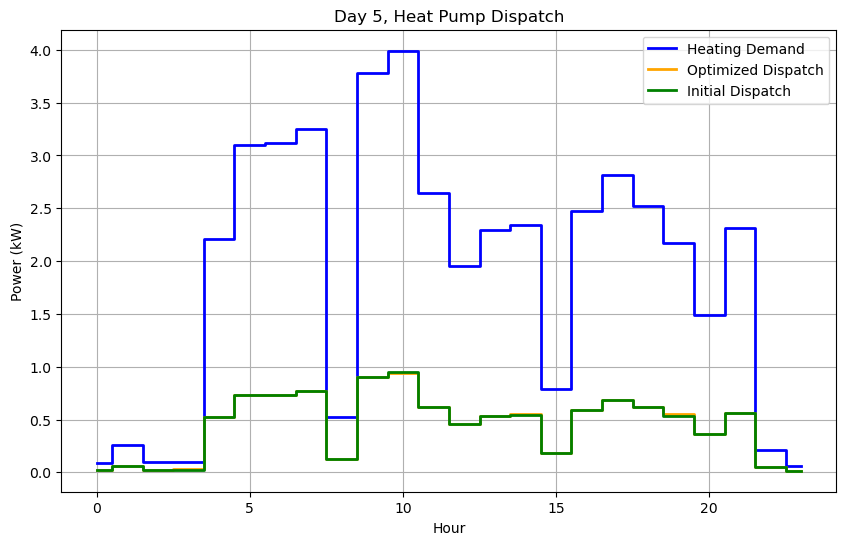


Day 6/365
Initial Guess Cost: €2.08
Optimized Daily Cost: €1.99
Total Heat Consumed (Qconsumption): 29.20 kWh
Total Heat Produced (Qproduction): 29.81 kWh
Buffer Tank Temperature at End of Day: 30.47°C
Optimized Dispatch: [0.02220047 0.02805105 0.01530384 0.08371355 0.1189551  0.20550948
 0.4268681  0.19805907 0.13424478 0.16446309 0.03102116 0.01590709
 0.01508407 0.0184304  0.04957911 0.04565059 0.25487485 0.0265144
 0.15524015 0.12263778 0.01429096 0.16868174 0.05482174 0.00705726]


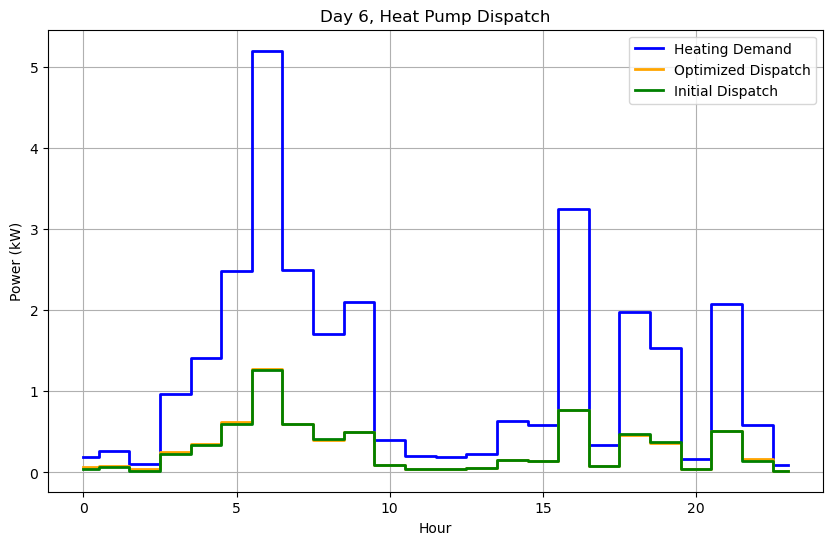


Day 7/365
Initial Guess Cost: €2.23
Optimized Daily Cost: €2.26
Total Heat Consumed (Qconsumption): 34.70 kWh
Total Heat Produced (Qproduction): 36.08 kWh
Buffer Tank Temperature at End of Day: 31.47°C
Optimized Dispatch: [6.58085926e-03 8.98963769e-03 5.95992144e-03 6.62494060e-03
 2.00786573e-02 2.96074904e-01 1.29060098e-01 2.60187927e-01
 3.40703965e-02 1.95750164e-01 2.96890734e-02 2.10936989e-01
 1.72108383e-02 5.18531814e-02 1.72289772e-01 8.68320128e-02
 1.96795293e-01 1.94364697e-01 2.13152626e-01 7.68692378e-02
 1.85198320e-01 2.60068739e-01 2.21537467e-01 2.09151472e-06]


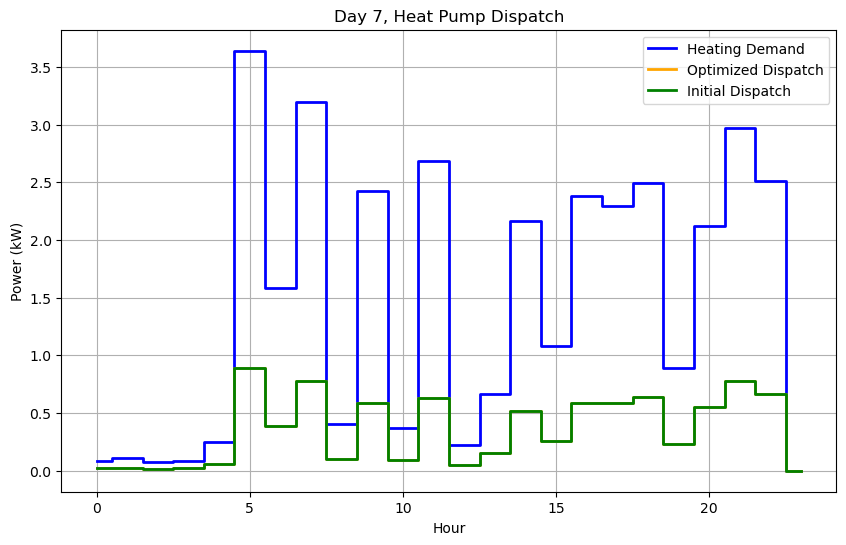


Day 8/365
Initial Guess Cost: €2.10
Optimized Daily Cost: €2.02
Total Heat Consumed (Qconsumption): 34.50 kWh
Total Heat Produced (Qproduction): 34.44 kWh
Buffer Tank Temperature at End of Day: 30.78°C
Optimized Dispatch: [0.00674367 0.03592098 0.0183952  0.00423044 0.37698163 0.29348834
 0.2355001  0.15480214 0.09544795 0.01501647 0.21484894 0.22102879
 0.15615553 0.01742887 0.01808383 0.2573376  0.10582764 0.16870796
 0.24158081 0.03348478 0.01999598 0.19899746 0.04495874 0.00810479]


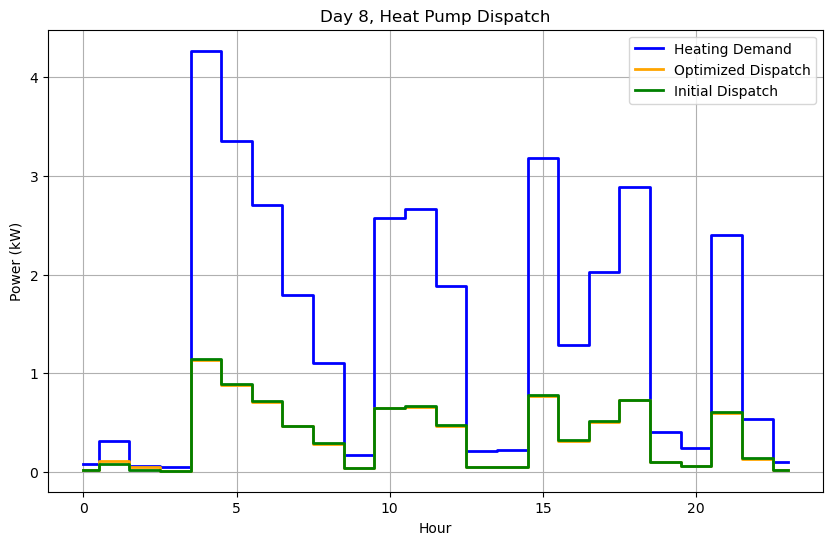


Day 9/365
Initial Guess Cost: €2.88
Optimized Daily Cost: €2.71
Total Heat Consumed (Qconsumption): 37.00 kWh
Total Heat Produced (Qproduction): 38.02 kWh
Buffer Tank Temperature at End of Day: 31.17°C
Optimized Dispatch: [5.93348811e-03 1.77453965e-02 1.00000000e+00 3.91981304e-02
 2.00601595e-01 4.14695275e-01 4.65358508e-03 9.35586148e-18
 3.48596481e-18 6.40176602e-18 1.41313271e-01 4.86157608e-18
 2.80641570e-18 3.24561963e-01 2.53399844e-03 2.78419036e-01
 5.72713255e-02 2.17360973e-01 2.73952334e-02 1.02512823e-01
 2.26019499e-01 2.72199075e-02 5.42566087e-03 1.16532250e-02]


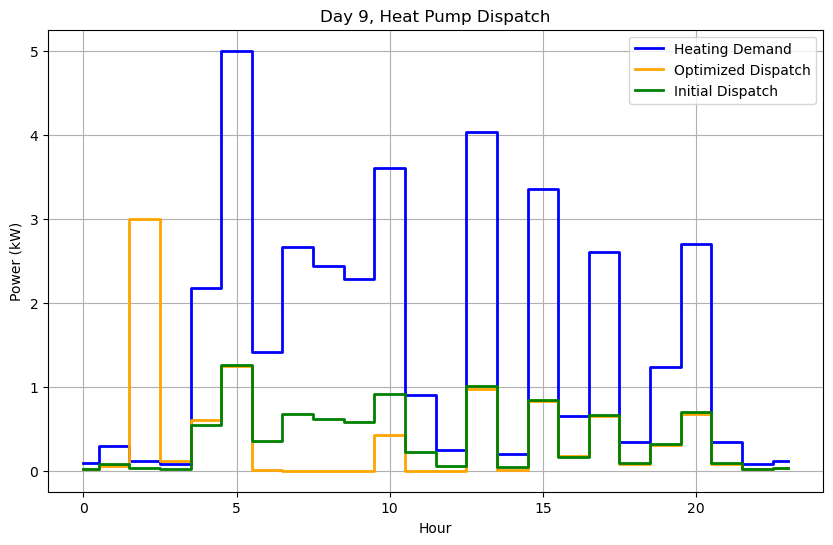


Day 10/365
Initial Guess Cost: €3.70
Optimized Daily Cost: €3.70
Total Heat Consumed (Qconsumption): 46.90 kWh
Total Heat Produced (Qproduction): 47.90 kWh
Buffer Tank Temperature at End of Day: 31.69°C
Optimized Dispatch: [0.00756162 0.01363797 0.14265174 0.09592292 0.15724569 0.3123733
 0.26866317 0.40474279 0.34761955 0.0476028  0.24078494 0.05551406
 0.2446717  0.02506677 0.33760753 0.09440388 0.28425603 0.16177213
 0.30762415 0.27514525 0.04981084 0.18247715 0.02051583 0.00484121]


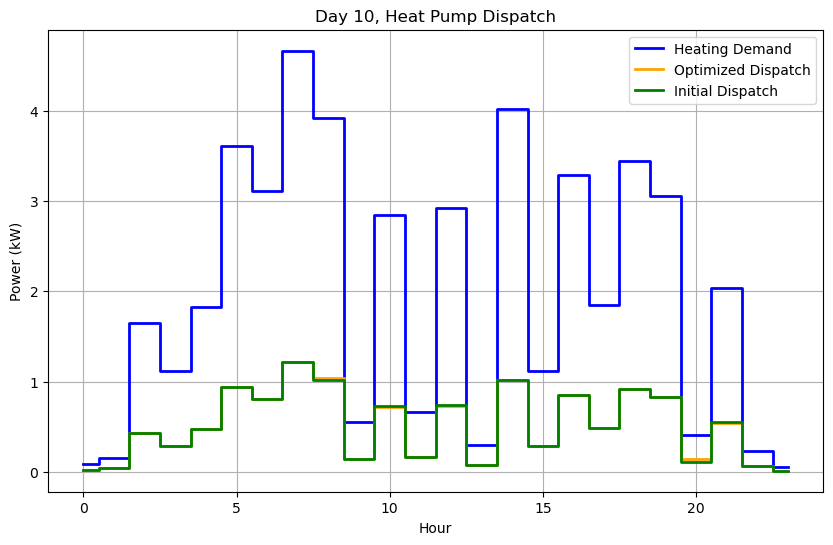


Day 11/365
Initial Guess Cost: €2.20
Optimized Daily Cost: €2.16
Total Heat Consumed (Qconsumption): 35.40 kWh
Total Heat Produced (Qproduction): 34.99 kWh
Buffer Tank Temperature at End of Day: 30.61°C
Optimized Dispatch: [0.00953387 0.01777425 0.01886064 0.02087294 0.22919738 0.46536294
 0.13479264 0.23629731 0.2697417  0.05222641 0.01123904 0.05386035
 0.20022782 0.01614449 0.02547998 0.18872159 0.08193507 0.28330948
 0.03424539 0.24708047 0.09729131 0.14277981 0.06887215 0.01406544]


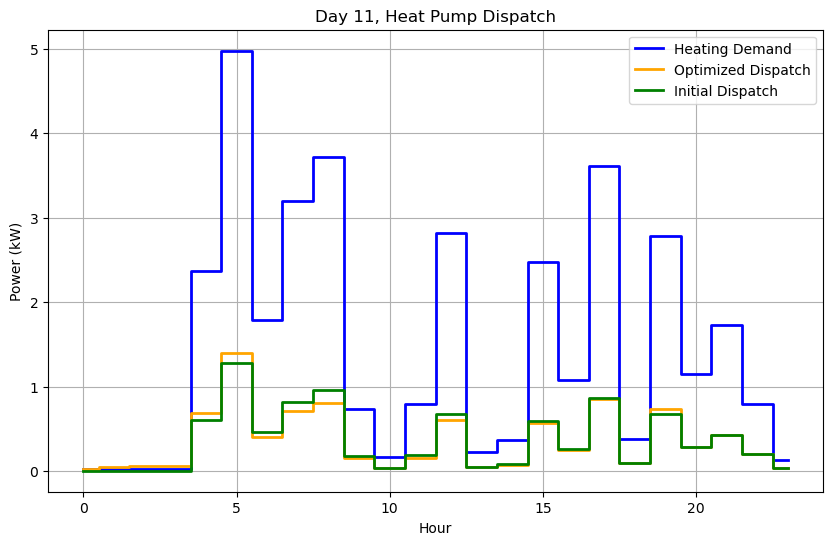


Day 12/365
Initial Guess Cost: €2.21
Optimized Daily Cost: €2.05
Total Heat Consumed (Qconsumption): 35.80 kWh
Total Heat Produced (Qproduction): 35.87 kWh
Buffer Tank Temperature at End of Day: 30.12°C
Optimized Dispatch: [0.01523146 0.01296424 0.00893651 0.05596925 0.44860062 0.24244341
 0.19605281 0.08932332 0.40994461 0.02299844 0.01717967 0.05429036
 0.22977456 0.02324047 0.26109978 0.02280332 0.20618524 0.0756975
 0.0295283  0.27281415 0.0190798  0.11154822 0.07978821 0.01083421]


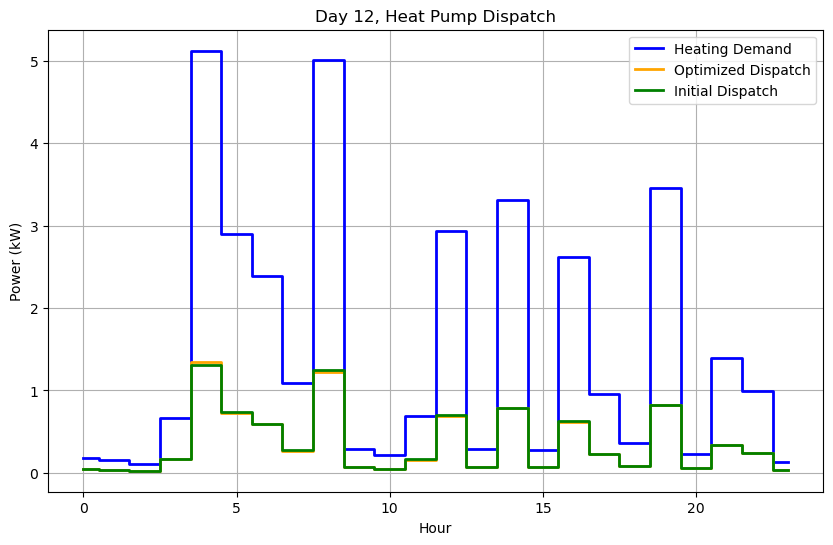


Day 13/365
Initial Guess Cost: €2.75
Optimized Daily Cost: €2.68
Total Heat Consumed (Qconsumption): 43.50 kWh
Total Heat Produced (Qproduction): 44.73 kWh
Buffer Tank Temperature at End of Day: 30.94°C
Optimized Dispatch: [0.0505391  0.0071343  0.00679921 0.03754802 0.00895942 0.27215606
 0.3153025  0.11917911 0.13679544 0.0166266  0.24241407 0.2459053
 0.01197623 0.29827586 0.10553103 0.19852957 0.1368969  0.2257333
 0.15139466 0.53682241 0.03382506 0.18351147 0.06925049 0.0520095 ]


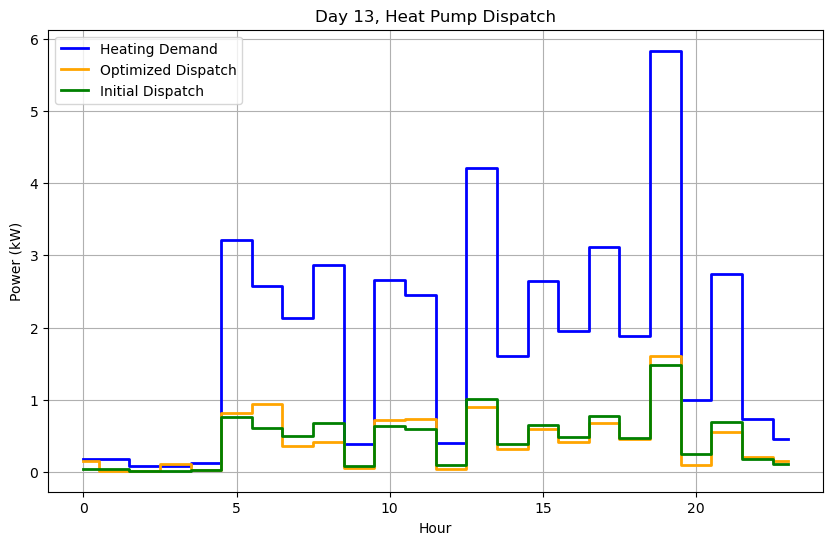


Day 14/365
Initial Guess Cost: €2.23
Optimized Daily Cost: €2.22
Total Heat Consumed (Qconsumption): 43.90 kWh
Total Heat Produced (Qproduction): 44.42 kWh
Buffer Tank Temperature at End of Day: 30.92°C
Optimized Dispatch: [0.01581417 0.01536867 0.2140224  0.05135536 0.02711319 0.29521582
 0.46253972 0.3325835  0.24371046 0.24438345 0.09184988 0.09001122
 0.20488173 0.02036966 0.11346178 0.13090132 0.18235606 0.13855521
 0.10710894 0.21163672 0.14285484 0.19000978 0.19181172 0.03106133]


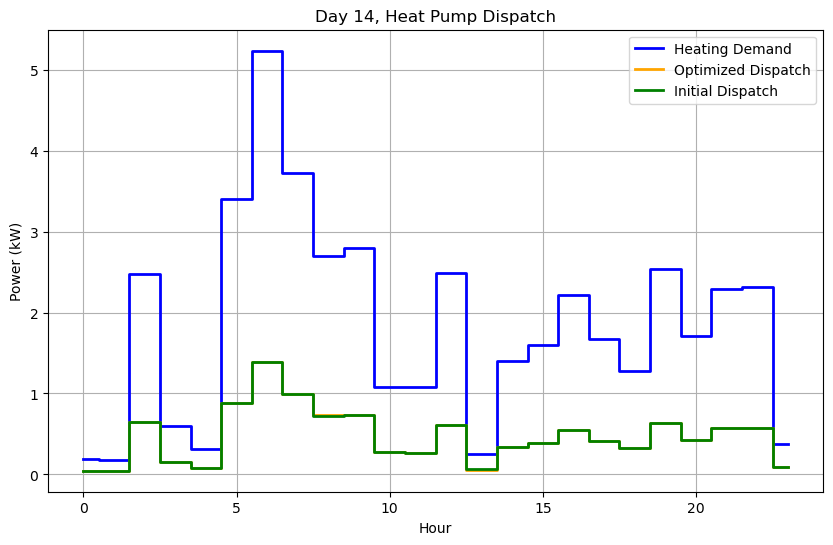


Day 15/365
Initial Guess Cost: €2.00
Optimized Daily Cost: €2.11
Total Heat Consumed (Qconsumption): 44.40 kWh
Total Heat Produced (Qproduction): 45.95 kWh
Buffer Tank Temperature at End of Day: 32.10°C
Optimized Dispatch: [1.78523550e-12 6.84953374e-12 6.91331154e-11 1.78592131e-11
 1.62094913e-01 1.81490915e-01 1.64858458e-01 2.52360921e-01
 1.25480724e-01 1.02121584e-09 2.38101767e-01 2.84389079e-01
 2.39176366e-01 2.77394242e-01 1.81870834e-01 1.86158434e-01
 2.88168330e-02 1.77205746e-01 4.17218918e-01 2.02733972e-01
 2.01942260e-01 9.38267376e-02 9.85944881e-02 1.91416034e-02]


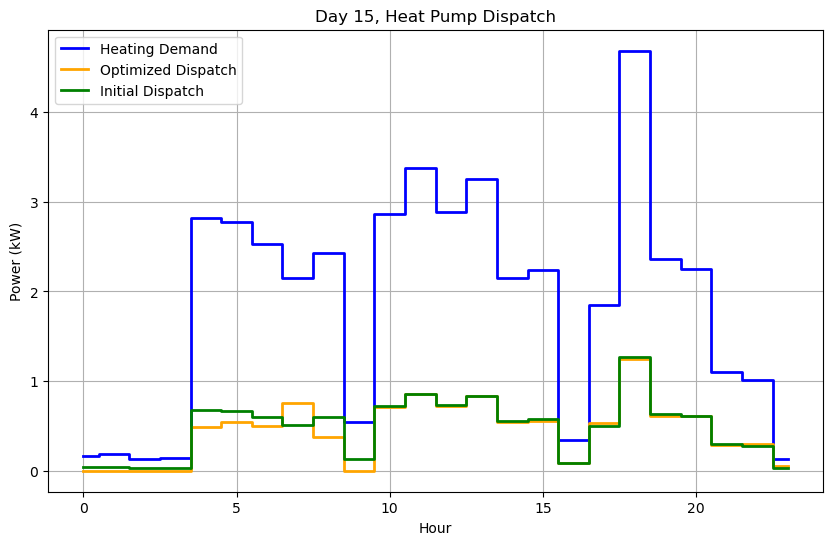


Day 16/365
Initial Guess Cost: €4.16
Optimized Daily Cost: €4.05
Total Heat Consumed (Qconsumption): 50.60 kWh
Total Heat Produced (Qproduction): 50.59 kWh
Buffer Tank Temperature at End of Day: 31.44°C
Optimized Dispatch: [0.02761523 0.2300649  0.04402214 0.00562255 0.5235059  0.54349448
 0.30519291 0.53392293 0.22182799 0.18075706 0.01886489 0.01315558
 0.15621202 0.19131531 0.20381873 0.07258362 0.25470767 0.35849736
 0.14404218 0.19600947 0.04870262 0.1544326  0.05226383 0.02206493]


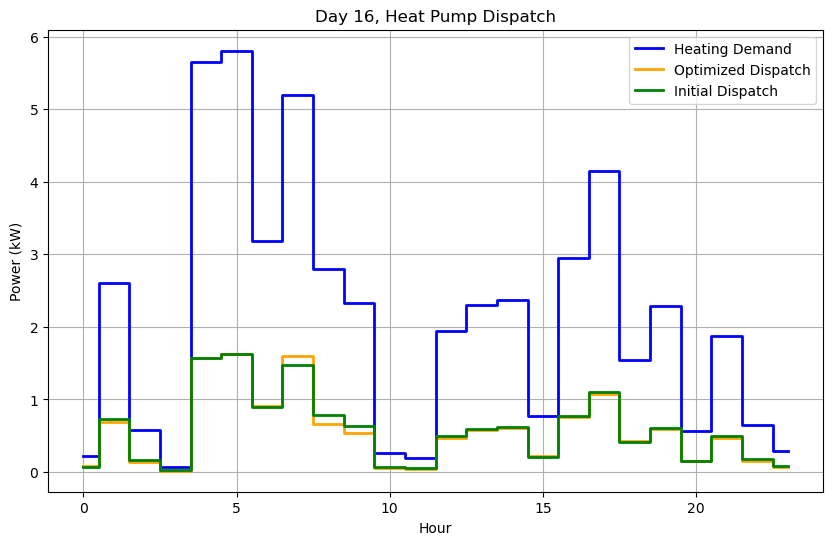


Day 17/365
Initial Guess Cost: €4.36
Optimized Daily Cost: €4.37
Total Heat Consumed (Qconsumption): 52.00 kWh
Total Heat Produced (Qproduction): 53.15 kWh
Buffer Tank Temperature at End of Day: 32.09°C
Optimized Dispatch: [0.01643907 0.01805388 0.22867024 0.22481858 0.28071076 0.52856276
 0.34705709 0.47583594 0.36181557 0.12309856 0.32839742 0.02692515
 0.09907384 0.09859855 0.19128994 0.18908941 0.1161155  0.41711617
 0.23072746 0.20352644 0.19812134 0.02240206 0.05259962 0.03103595]


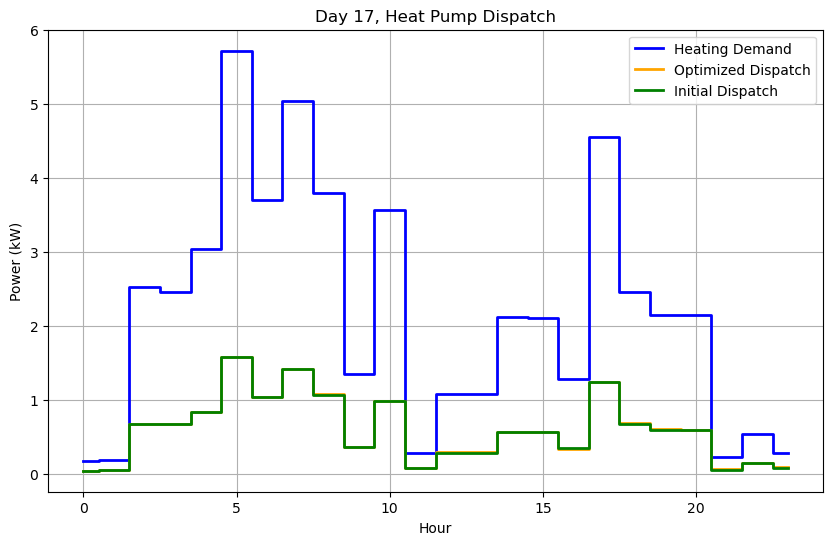


Day 18/365
Initial Guess Cost: €5.05
Optimized Daily Cost: €5.06
Total Heat Consumed (Qconsumption): 57.10 kWh
Total Heat Produced (Qproduction): 58.43 kWh
Buffer Tank Temperature at End of Day: 32.95°C
Optimized Dispatch: [0.00464917 0.01215235 0.19215394 0.19712566 0.25811424 0.49782521
 0.43426758 0.36536217 0.17708092 0.32898722 0.21005972 0.24736214
 0.18685754 0.33332352 0.08022757 0.25204295 0.28884814 0.16543419
 0.29216571 0.29552972 0.21480514 0.19020686 0.07217485 0.00266473]


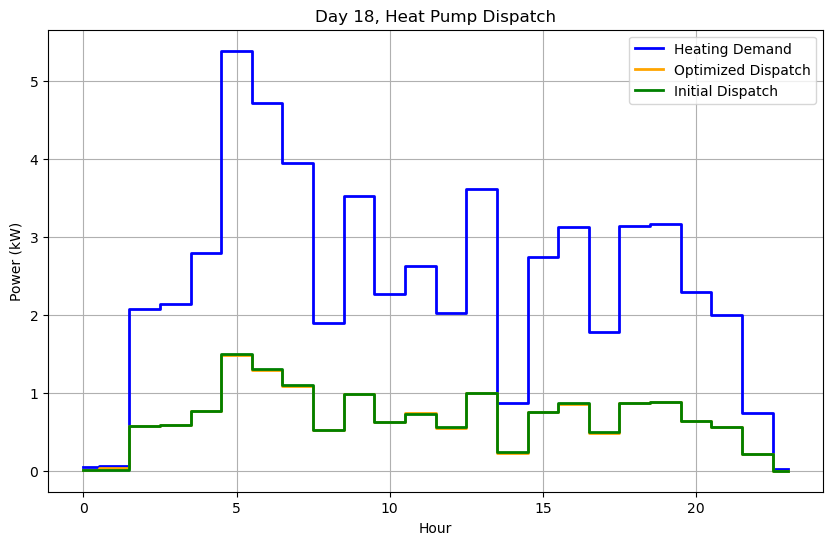


Day 19/365
Initial Guess Cost: €5.50
Optimized Daily Cost: €5.46
Total Heat Consumed (Qconsumption): 59.70 kWh
Total Heat Produced (Qproduction): 59.76 kWh
Buffer Tank Temperature at End of Day: 32.32°C
Optimized Dispatch: [0.01725165 0.20755143 0.06250619 0.19735931 0.47941765 0.62226766
 0.36777147 0.24401117 0.22930573 0.21338751 0.03896754 0.16696174
 0.03059694 0.25417301 0.29241278 0.21371738 0.24288477 0.3632239
 0.26182178 0.42779508 0.23949842 0.22010773 0.05765106 0.02405263]


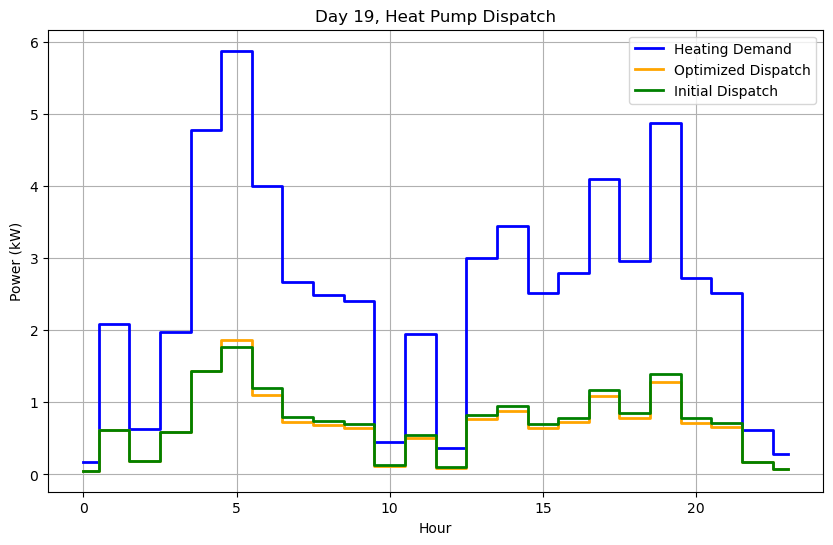


Day 20/365
Initial Guess Cost: €6.10
Optimized Daily Cost: €6.14
Total Heat Consumed (Qconsumption): 60.70 kWh
Total Heat Produced (Qproduction): 61.93 kWh
Buffer Tank Temperature at End of Day: 33.05°C
Optimized Dispatch: [0.00370655 0.0042356  0.20833228 0.04210378 0.28521995 0.20020452
 0.59873453 0.50547643 0.2124274  0.21789455 0.3086114  0.16932017
 0.11143518 0.33377991 0.38781062 0.19641103 0.16898588 0.43000706
 0.33892605 0.3392376  0.23495677 0.26965266 0.07267125 0.03342755]


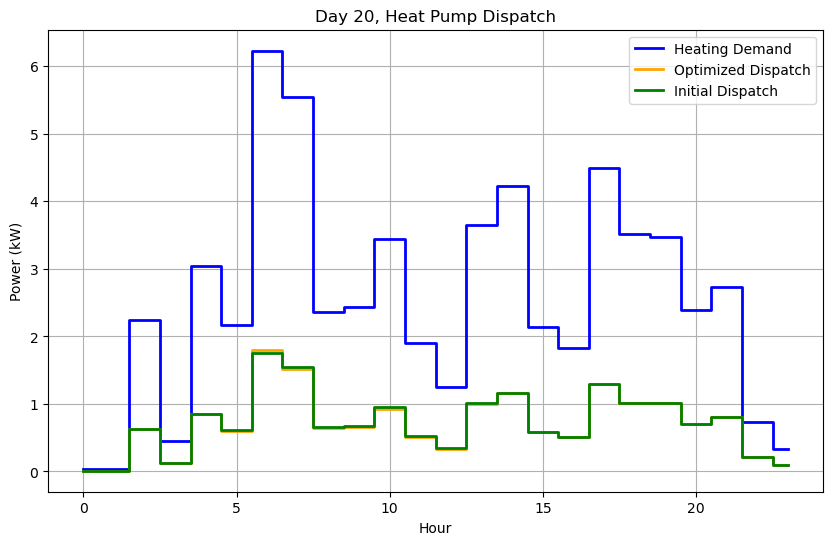


Day 21/365
Initial Guess Cost: €5.98
Optimized Daily Cost: €7.46
Total Heat Consumed (Qconsumption): 64.40 kWh
Total Heat Produced (Qproduction): 64.38 kWh
Buffer Tank Temperature at End of Day: 32.48°C
Optimized Dispatch: [0.00265148 0.         0.         0.         0.         0.03643825
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22538694 0.         0.         0.
 0.         0.         0.         0.         0.         0.02329394]


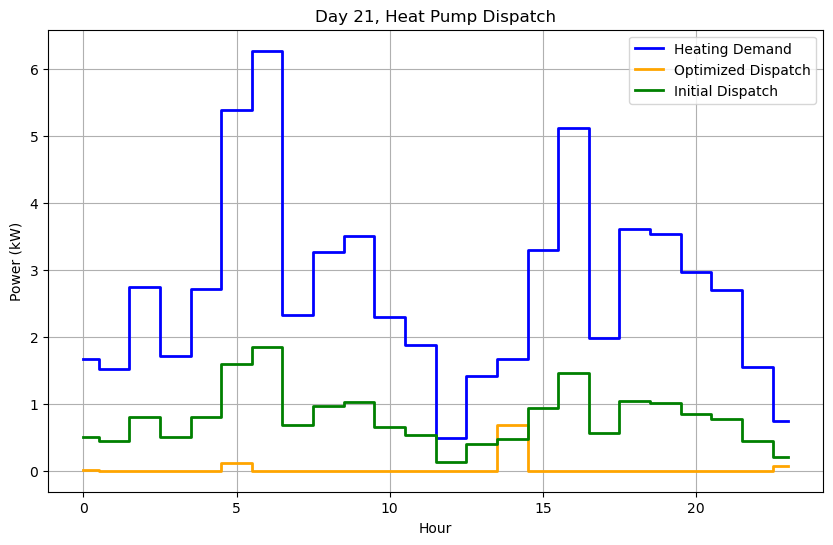


Day 22/365
Initial Guess Cost: €4.41
Optimized Daily Cost: €4.41
Total Heat Consumed (Qconsumption): 50.20 kWh
Total Heat Produced (Qproduction): 50.53 kWh
Buffer Tank Temperature at End of Day: 32.19°C
Optimized Dispatch: [0.01789633 0.03090903 0.20957831 0.10005026 0.43988033 0.40176326
 0.29852204 0.30895215 0.19566842 0.35371359 0.22618094 0.04831328
 0.02462386 0.21429302 0.11175729 0.13934515 0.22966966 0.29468586
 0.36330208 0.15790053 0.31195095 0.10510043 0.08753312 0.01586032]


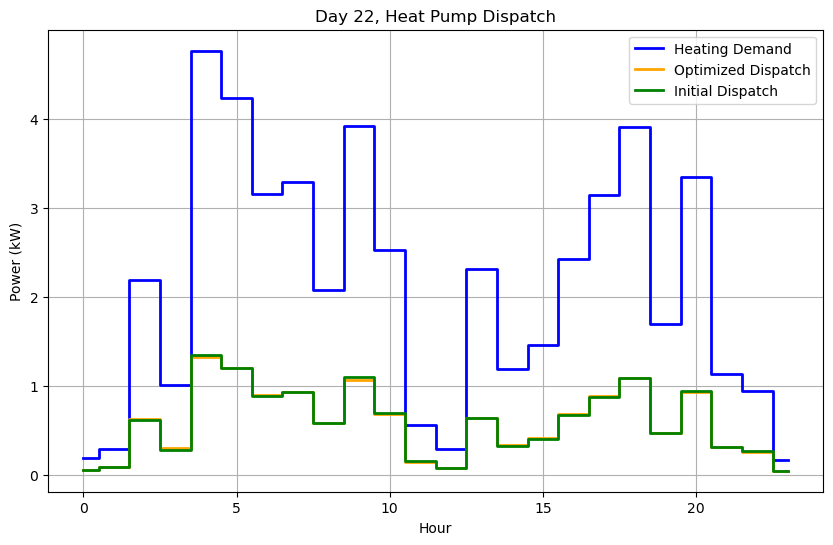


Day 23/365
Initial Guess Cost: €5.14
Optimized Daily Cost: €5.13
Total Heat Consumed (Qconsumption): 49.30 kWh
Total Heat Produced (Qproduction): 49.82 kWh
Buffer Tank Temperature at End of Day: 32.12°C
Optimized Dispatch: [7.52414102e-03 9.57677109e-03 1.02217185e-02 2.53713163e-01
 2.37160132e-01 4.08870251e-01 3.91741213e-01 3.44945946e-01
 1.51318951e-01 3.82936681e-01 2.25776271e-01 7.54561697e-02
 3.79204882e-01 4.12880423e-02 2.69802007e-01 3.03254891e-01
 1.23475652e-01 2.13521301e-01 1.11343429e-01 2.64178721e-01
 1.19614871e-01 1.98757335e-01 6.94629475e-03 2.61946591e-12]


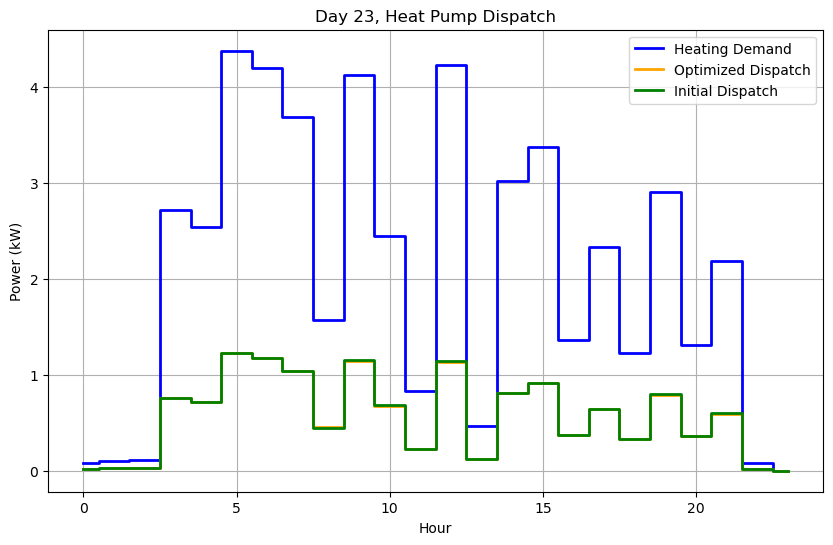


Day 24/365
Initial Guess Cost: €5.35
Optimized Daily Cost: €5.36
Total Heat Consumed (Qconsumption): 52.90 kWh
Total Heat Produced (Qproduction): 53.27 kWh
Buffer Tank Temperature at End of Day: 31.89°C
Optimized Dispatch: [0.01611249 0.02315046 0.17083003 0.13969285 0.25531033 0.4295312
 0.30980165 0.39189804 0.2549829  0.23771443 0.29486673 0.10949059
 0.05959656 0.39364545 0.04648352 0.26971438 0.31391383 0.29337573
 0.06875811 0.18399913 0.27906681 0.23359038 0.03384589 0.00106589]


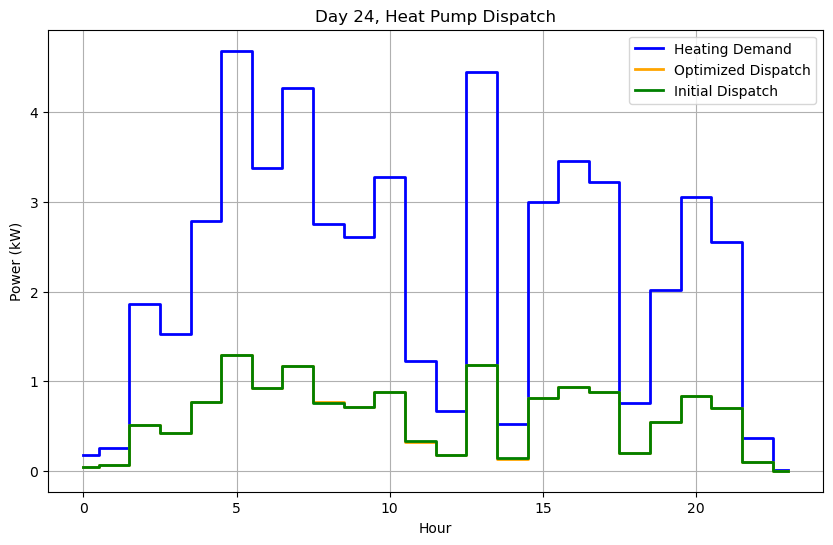


Day 25/365
Initial Guess Cost: €4.94
Optimized Daily Cost: €5.07
Total Heat Consumed (Qconsumption): 50.40 kWh
Total Heat Produced (Qproduction): 51.18 kWh
Buffer Tank Temperature at End of Day: 32.13°C
Optimized Dispatch: [0.00449499 0.00648987 0.04856167 0.2259345  0.25084553 0.35313655
 0.32010344 0.41478304 0.28922945 0.22290627 0.14289793 0.25869497
 0.08672113 0.36780892 0.05521122 0.20297116 0.1947941  0.05553165
 0.28388753 0.22737336 0.07751434 0.16433869 0.02445159 0.00569673]


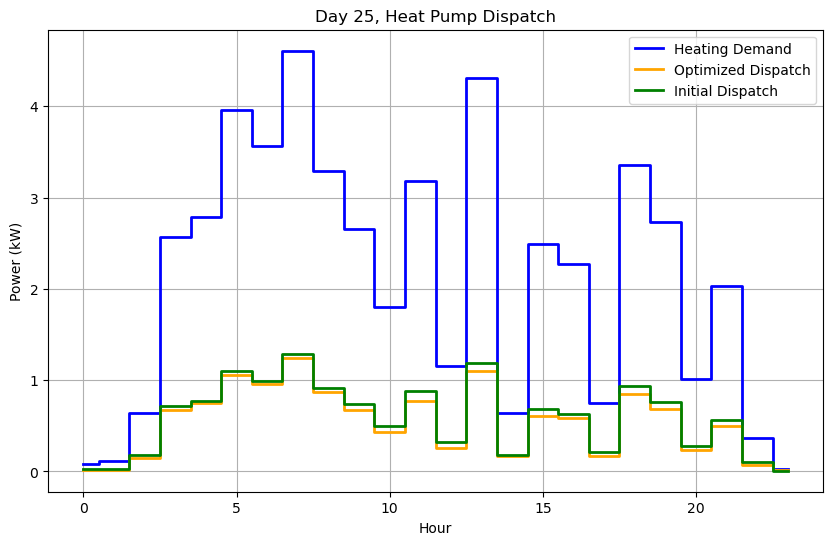


Day 26/365
Initial Guess Cost: €5.51
Optimized Daily Cost: €5.60
Total Heat Consumed (Qconsumption): 58.00 kWh
Total Heat Produced (Qproduction): 58.99 kWh
Buffer Tank Temperature at End of Day: 32.59°C
Optimized Dispatch: [0.00947109 0.02275249 0.19938957 0.0105946  0.50144101 0.35687406
 0.39842916 0.43397128 0.27513784 0.13832683 0.27416371 0.10978707
 0.26327227 0.36279984 0.26585044 0.09224918 0.32509919 0.16480435
 0.40074199 0.14975603 0.22153675 0.22469153 0.02525364 0.00610462]


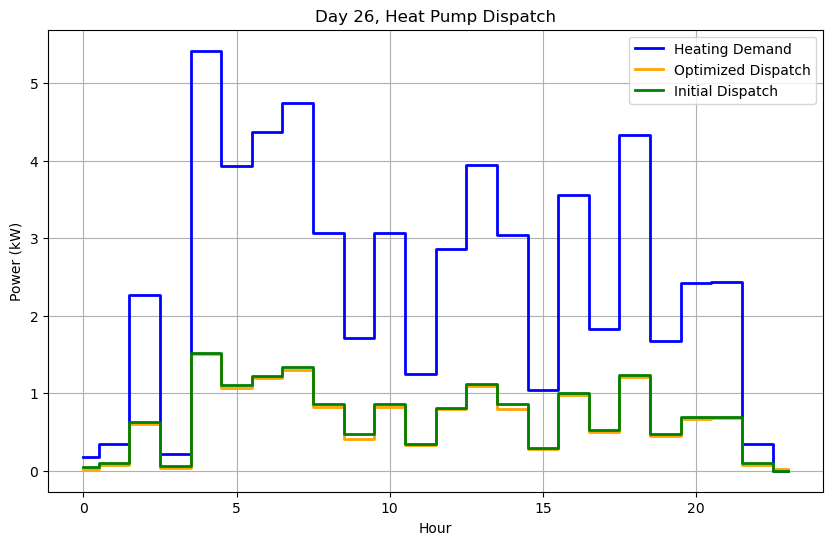


Day 27/365
Initial Guess Cost: €6.35
Optimized Daily Cost: €6.31
Total Heat Consumed (Qconsumption): 65.40 kWh
Total Heat Produced (Qproduction): 65.74 kWh
Buffer Tank Temperature at End of Day: 32.30°C
Optimized Dispatch: [0.00780288 0.12964428 0.15582339 0.15874108 0.1617131  0.12592058
 0.36698122 0.61117003 0.50546846 0.36129282 0.09933632 0.27830094
 0.24371399 0.09448178 0.30582803 0.38005845 0.43057411 0.43070507
 0.27601505 0.39665888 0.16603047 0.20342909 0.18881424 0.08904781]


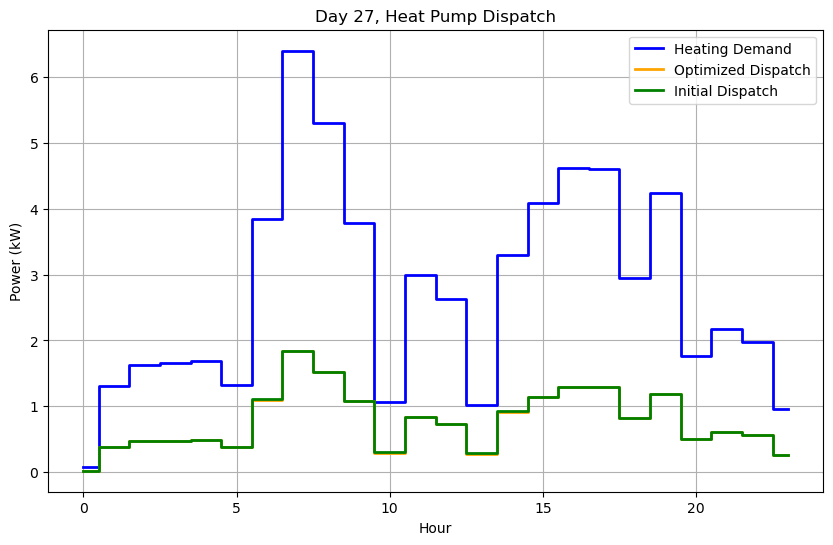


Day 28/365
Initial Guess Cost: €5.87
Optimized Daily Cost: €5.90
Total Heat Consumed (Qconsumption): 67.50 kWh
Total Heat Produced (Qproduction): 68.36 kWh
Buffer Tank Temperature at End of Day: 32.61°C
Optimized Dispatch: [0.00404698 0.00404139 0.09973599 0.18159225 0.20121329 0.21701677
 0.55945997 0.33264048 0.18532876 0.41930196 0.41332704 0.21020554
 0.18648877 0.35160686 0.3109523  0.12136411 0.48471999 0.14123916
 0.26633401 0.6160905  0.19251724 0.33909504 0.3739905  0.06299954]


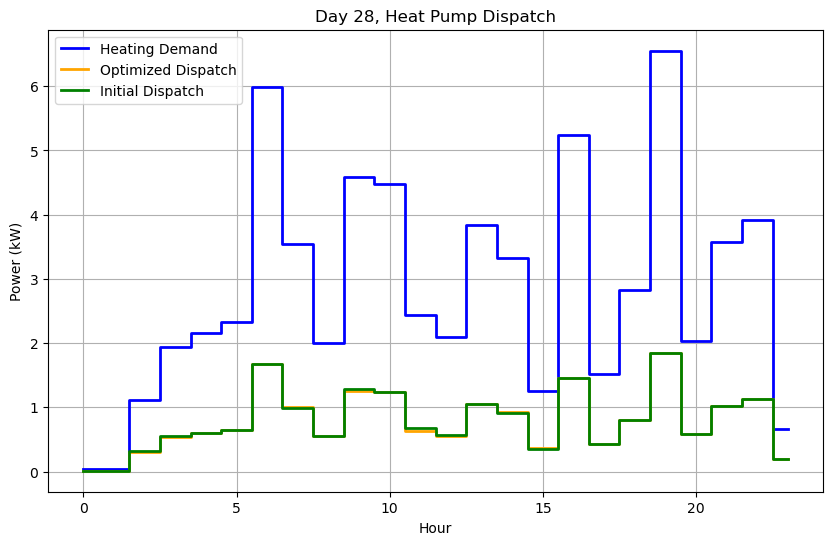


Day 29/365
Initial Guess Cost: €4.87
Optimized Daily Cost: €4.89
Total Heat Consumed (Qconsumption): 57.50 kWh
Total Heat Produced (Qproduction): 58.39 kWh
Buffer Tank Temperature at End of Day: 32.94°C
Optimized Dispatch: [0.01323683 0.00521739 0.209902   0.05516304 0.46977764 0.41299583
 0.45176446 0.33986714 0.19009668 0.52912577 0.30387718 0.0913107
 0.18058677 0.08605855 0.20120851 0.14186752 0.16066903 0.26556424
 0.35128795 0.40097716 0.33384806 0.20460353 0.11485248 0.02183578]


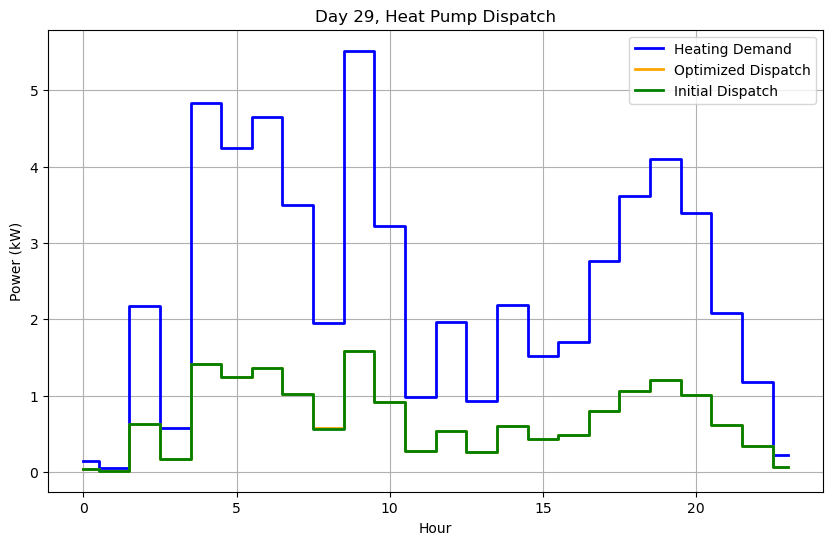


Day 30/365
Initial Guess Cost: €4.11
Optimized Daily Cost: €4.19
Total Heat Consumed (Qconsumption): 62.30 kWh
Total Heat Produced (Qproduction): 61.77 kWh
Buffer Tank Temperature at End of Day: 31.68°C
Optimized Dispatch: [2.24486244e-01 1.10638454e-01 2.55637348e-01 3.99422613e-02
 4.73250043e-01 3.31742914e-01 4.37093654e-02 4.74913568e-01
 6.34884241e-01 4.55921935e-01 1.60717315e-01 1.90576207e-01
 2.99996628e-01 9.82862461e-02 2.72822089e-01 2.00154989e-01
 1.87381013e-01 2.66203795e-01 2.35707760e-01 1.90849007e-01
 1.48070676e-01 6.90626188e-02 1.24352895e-02 6.19394327e-04]


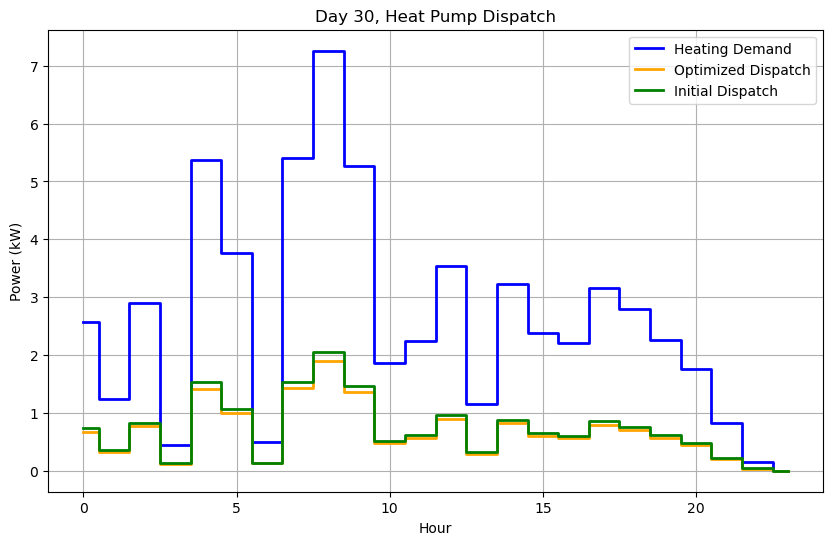


Day 31/365
Initial Guess Cost: €5.03
Optimized Daily Cost: €5.00
Total Heat Consumed (Qconsumption): 62.80 kWh
Total Heat Produced (Qproduction): 63.15 kWh
Buffer Tank Temperature at End of Day: 31.45°C
Optimized Dispatch: [0.21855729 0.08452305 0.21178256 0.20790887 0.02982294 0.66219109
 0.43536466 0.47578569 0.34747611 0.22483192 0.39412661 0.01712525
 0.23774457 0.18273971 0.2262147  0.11539165 0.24681902 0.22917452
 0.26085268 0.12905377 0.14802974 0.19390548 0.03317566 0.02253622]


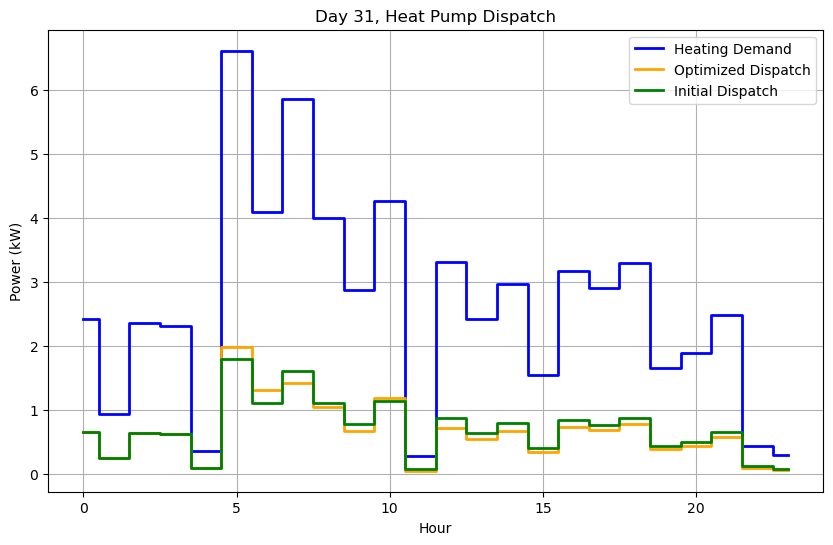


Day 32/365
Initial Guess Cost: €3.62
Optimized Daily Cost: €3.57
Total Heat Consumed (Qconsumption): 53.00 kWh
Total Heat Produced (Qproduction): 53.22 kWh
Buffer Tank Temperature at End of Day: 31.08°C
Optimized Dispatch: [0.05174609 0.19848626 0.11805154 0.25656114 0.27343123 0.28916817
 0.17790506 0.2934334  0.64459298 0.31534575 0.03061478 0.22128983
 0.16788571 0.06328362 0.29749409 0.04169826 0.27355322 0.06507332
 0.26322852 0.1334065  0.15824203 0.17576652 0.06714735 0.01999576]


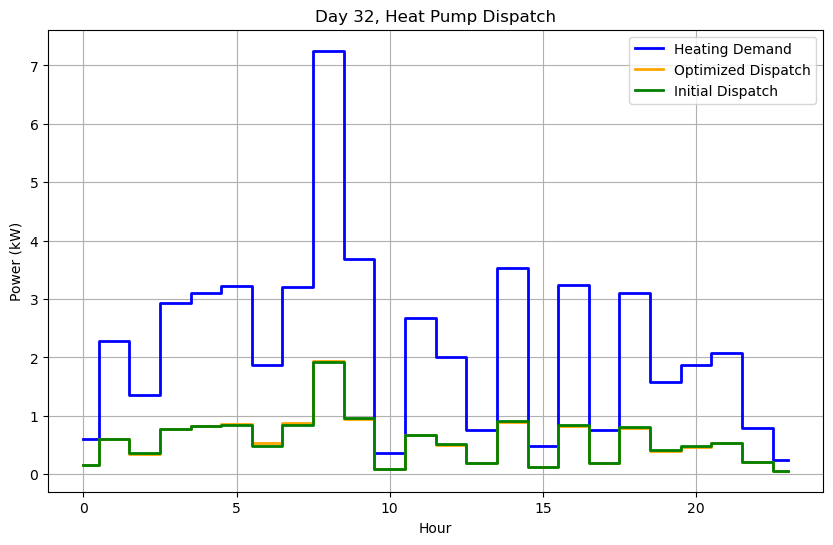


Day 33/365
Initial Guess Cost: €4.06
Optimized Daily Cost: €4.06
Total Heat Consumed (Qconsumption): 51.90 kWh
Total Heat Produced (Qproduction): 52.36 kWh
Buffer Tank Temperature at End of Day: 31.00°C
Optimized Dispatch: [0.02286856 0.2828576  0.06205725 0.09975369 0.38492494 0.33050747
 0.27187842 0.27938048 0.1787925  0.26713493 0.43353319 0.07332446
 0.29768865 0.02771048 0.16509073 0.10464548 0.14715266 0.23737797
 0.5088671  0.06726957 0.13340509 0.03545692 0.01903658 0.01201904]


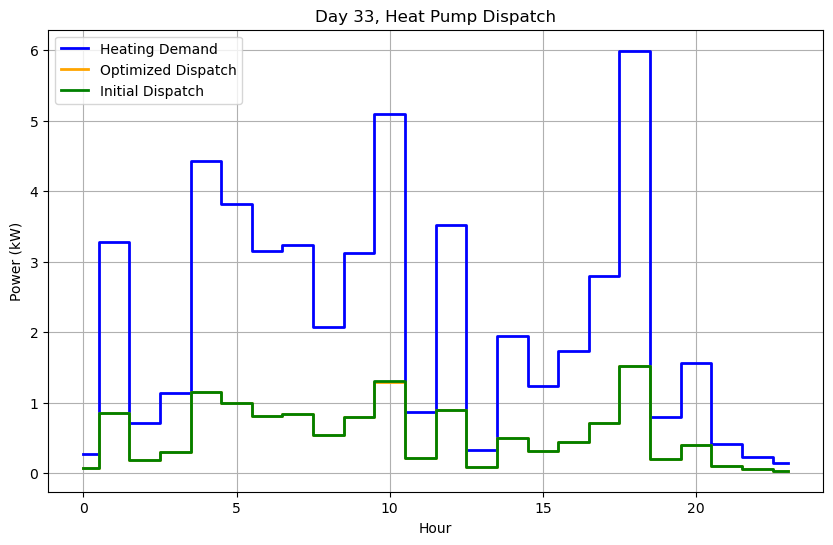


Day 34/365
Initial Guess Cost: €3.33
Optimized Daily Cost: €3.34
Total Heat Consumed (Qconsumption): 49.80 kWh
Total Heat Produced (Qproduction): 50.04 kWh
Buffer Tank Temperature at End of Day: 30.68°C
Optimized Dispatch: [0.01596231 0.0201134  0.10758778 0.0898284  0.06116177 0.39055653
 0.39941703 0.11879831 0.41853643 0.37506241 0.16963426 0.11250438
 0.24657842 0.22765422 0.12078447 0.09942835 0.16416164 0.18486417
 0.16924877 0.21145045 0.16345434 0.14526978 0.14785977 0.03891143]


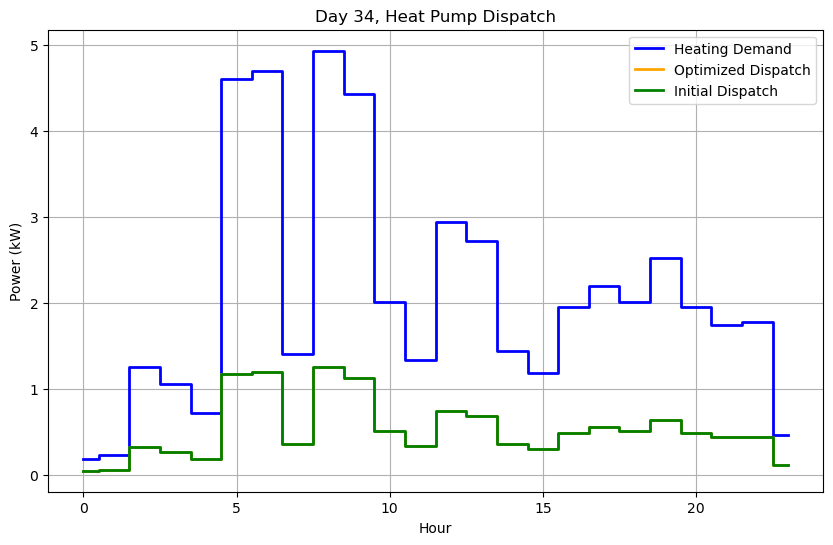


Day 35/365
Initial Guess Cost: €3.09
Optimized Daily Cost: €2.99
Total Heat Consumed (Qconsumption): 33.40 kWh
Total Heat Produced (Qproduction): 35.67 kWh
Buffer Tank Temperature at End of Day: 32.60°C
Optimized Dispatch: [0.02189135 0.02303867 0.00937793 0.10432796 0.16180442 0.1854966
 0.29138538 0.57867039 0.38779    0.15008219 0.01262182 0.00582654
 0.03401077 0.170686   0.07840946 0.05104532 0.01213752 0.00141332
 0.00391662 0.30933311 0.03025847 0.34769481 0.06933781 0.00061136]


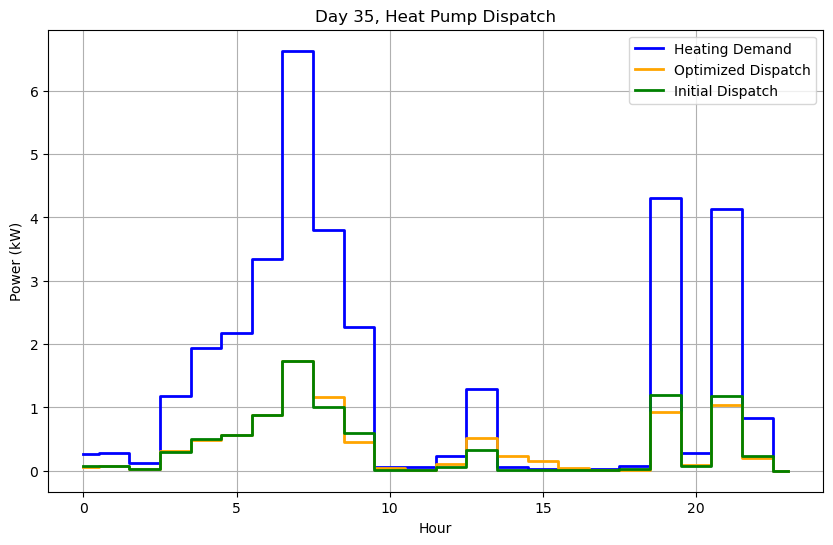


Day 36/365
Initial Guess Cost: €5.92
Optimized Daily Cost: €5.92
Total Heat Consumed (Qconsumption): 70.60 kWh
Total Heat Produced (Qproduction): 70.84 kWh
Buffer Tank Temperature at End of Day: 32.18°C
Optimized Dispatch: [0.42432509 0.09221933 0.10437552 0.3612462  0.02392912 0.45270719
 0.03092513 0.00614573 0.38390035 0.04731999 0.00516042 0.00500899
 0.00496525 0.04659329 0.63993048 0.65802656 0.69333122 0.26789253
 0.59447899 0.35632309 0.67556329 0.62841182 0.05343244 0.00111086]


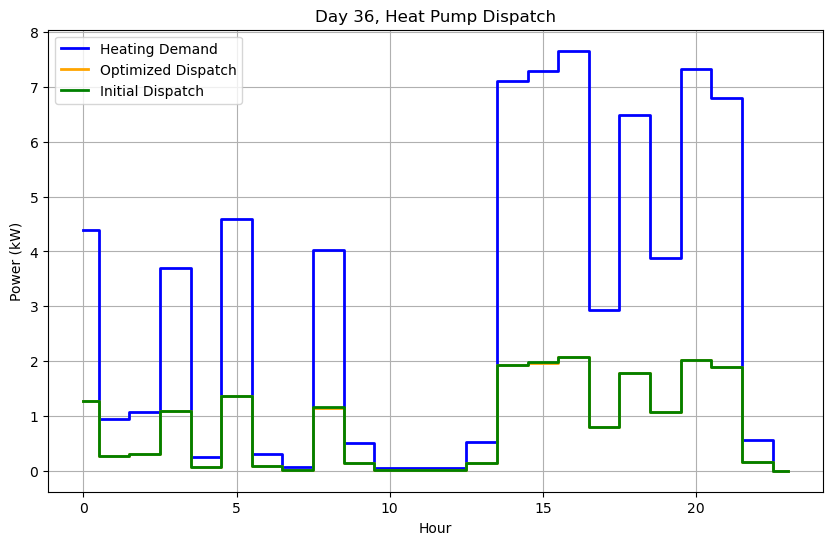


Day 37/365
Initial Guess Cost: €5.19
Optimized Daily Cost: €5.15
Total Heat Consumed (Qconsumption): 54.00 kWh
Total Heat Produced (Qproduction): 55.09 kWh
Buffer Tank Temperature at End of Day: 32.75°C
Optimized Dispatch: [0.15536578 0.16439328 0.26153402 0.21796223 0.3702074  0.39415471
 0.43118402 0.06464589 0.14393126 0.17770211 0.27909704 0.10160239
 0.0171638  0.20873675 0.21693253 0.31035504 0.3201956  0.28160895
 0.348825   0.17989989 0.10961078 0.24764093 0.0494929  0.01431534]


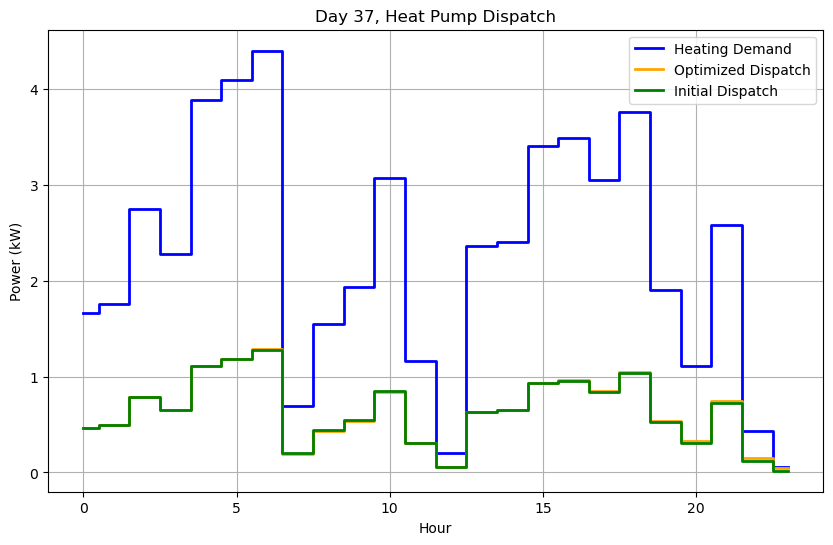


Day 38/365
Initial Guess Cost: €6.54
Optimized Daily Cost: €6.44
Total Heat Consumed (Qconsumption): 62.40 kWh
Total Heat Produced (Qproduction): 63.32 kWh
Buffer Tank Temperature at End of Day: 33.10°C
Optimized Dispatch: [0.31281393 0.17636288 0.29728176 0.36605161 0.22638526 0.72598572
 0.51743245 0.53350736 0.51591546 0.31192032 0.02109438 0.1567309
 0.06467527 0.10778279 0.15714432 0.11002731 0.15581233 0.22887385
 0.23394565 0.23337631 0.11596337 0.24740099 0.0449402  0.04993051]


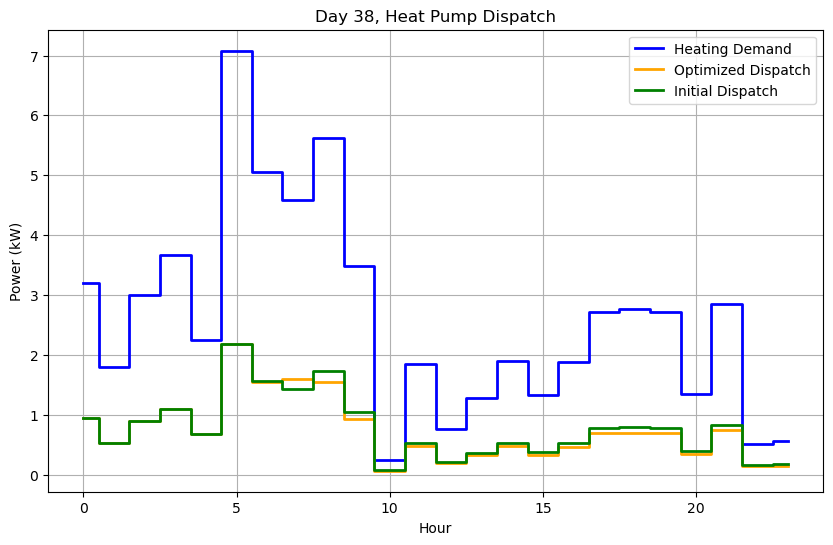


Day 39/365
Initial Guess Cost: €5.34
Optimized Daily Cost: €5.24
Total Heat Consumed (Qconsumption): 53.10 kWh
Total Heat Produced (Qproduction): 53.98 kWh
Buffer Tank Temperature at End of Day: 33.39°C
Optimized Dispatch: [2.46128613e-01 2.71438394e-01 7.92921371e-02 2.59260807e-01
 4.65360076e-01 4.62824667e-01 4.66411840e-01 2.74480932e-01
 2.55715632e-01 2.75742974e-01 2.27145167e-01 1.10357390e-01
 1.94291281e-01 2.71171124e-02 3.76939387e-02 1.74633044e-02
 1.23557638e-02 6.49114545e-03 1.45522229e-02 6.03590595e-01
 3.67457884e-01 3.15152415e-01 4.63627062e-02 4.64015592e-05]


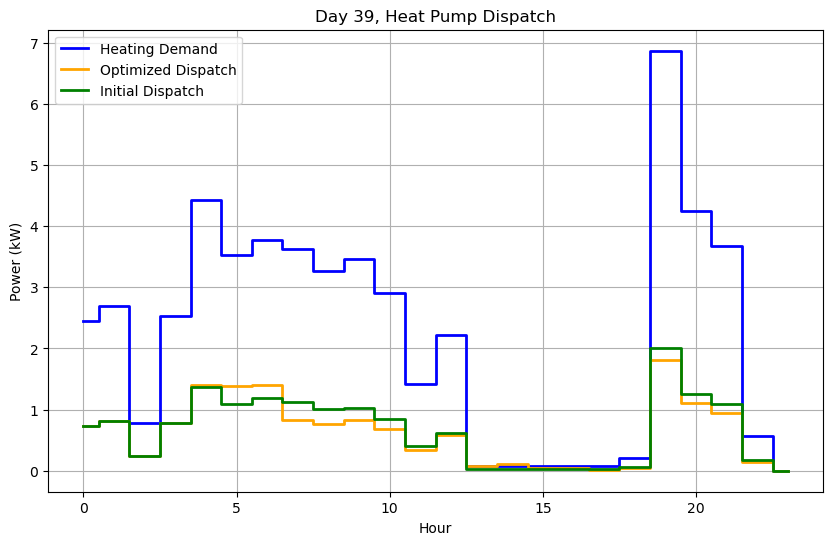


Day 40/365
Initial Guess Cost: €5.34
Optimized Daily Cost: €5.35
Total Heat Consumed (Qconsumption): 58.60 kWh
Total Heat Produced (Qproduction): 59.28 kWh
Buffer Tank Temperature at End of Day: 33.43°C
Optimized Dispatch: [0.24445109 0.11769072 0.39989506 0.07838447 0.52046001 0.50318232
 0.12965757 0.52808771 0.58981828 0.15777112 0.30690659 0.20316887
 0.04074075 0.2343057  0.0502686  0.21277511 0.04165798 0.20439901
 0.31203455 0.27587857 0.33428854 0.3088891  0.07471527 0.03119263]


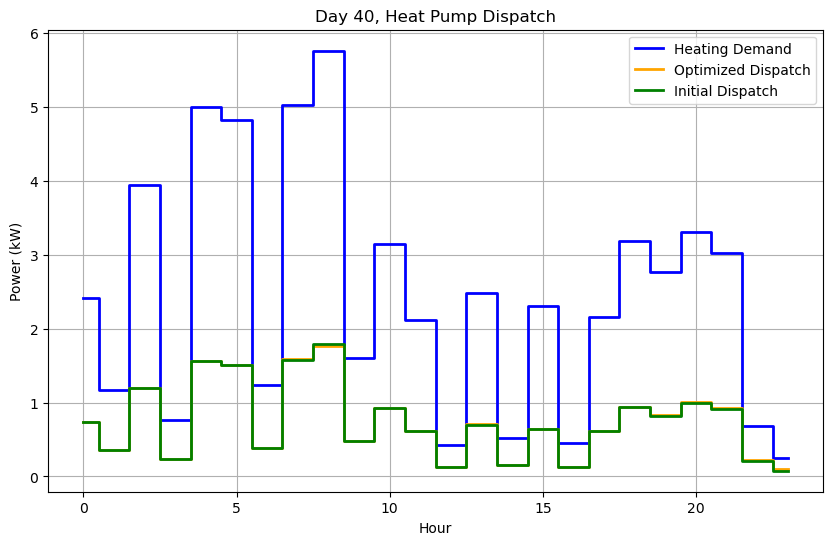


Day 41/365
Initial Guess Cost: €5.35
Optimized Daily Cost: €5.20
Total Heat Consumed (Qconsumption): 60.20 kWh
Total Heat Produced (Qproduction): 60.35 kWh
Buffer Tank Temperature at End of Day: 32.89°C
Optimized Dispatch: [0.32748588 0.1851688  0.31187564 0.30531125 0.08484934 0.31196891
 0.44347472 0.32754798 0.52060751 0.20670649 0.37113634 0.0960136
 0.00983407 0.20111463 0.04605995 0.21026152 0.14354131 0.1388441
 0.27102264 0.25236261 0.27405325 0.31573123 0.30480923 0.07838188]


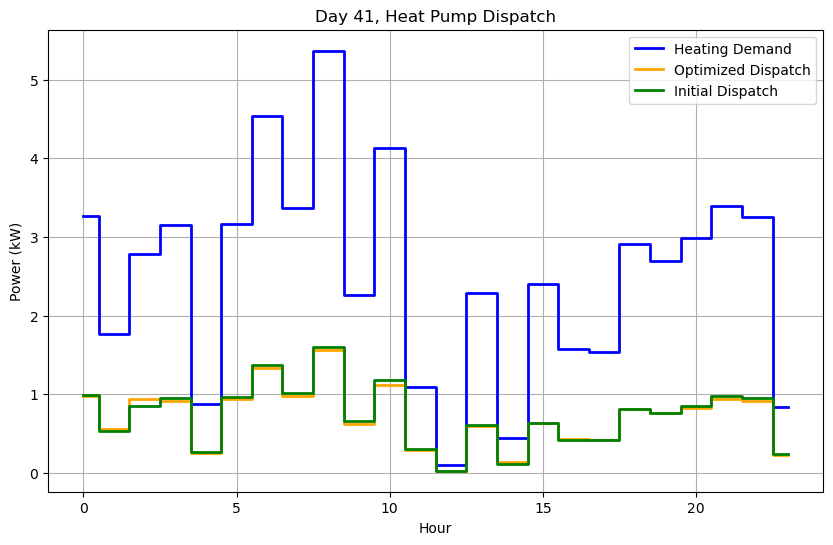


Day 42/365
Initial Guess Cost: €3.48
Optimized Daily Cost: €3.79
Total Heat Consumed (Qconsumption): 48.30 kWh
Total Heat Produced (Qproduction): 47.50 kWh
Buffer Tank Temperature at End of Day: 31.37°C
Optimized Dispatch: [0.03090472 0.13753981 0.06139106 0.00843263 0.10330872 0.11432229
 0.33969541 0.20785336 0.15208526 0.20922292 0.02417642 0.00776229
 0.14549293 0.06626188 0.11282726 0.11786636 0.17046629 0.22163163
 0.18743281 0.14423998 0.21978689 0.16194556 0.0383073  0.00594575]


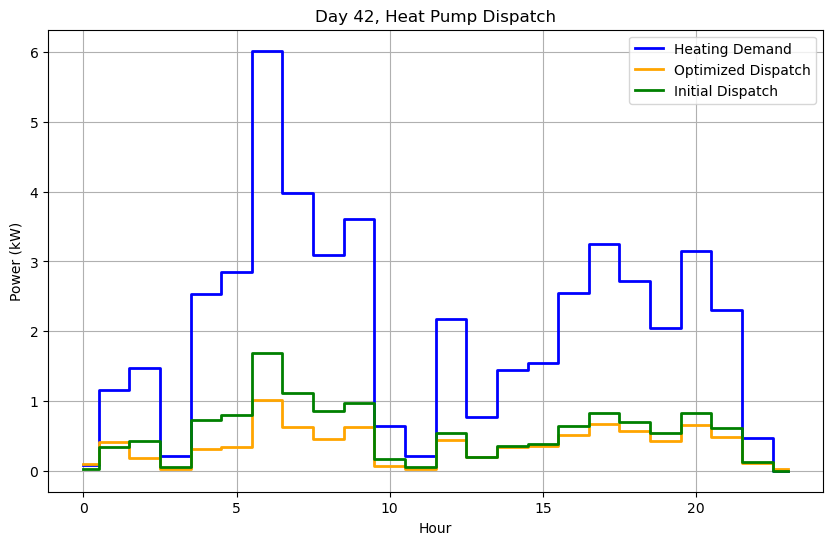


Day 43/365
Initial Guess Cost: €3.10
Optimized Daily Cost: €3.10
Total Heat Consumed (Qconsumption): 39.80 kWh
Total Heat Produced (Qproduction): 40.71 kWh
Buffer Tank Temperature at End of Day: 31.78°C
Optimized Dispatch: [7.12465089e-02 2.67212694e-02 7.54336851e-03 8.42044775e-03
 3.65952547e-01 2.93491032e-01 3.27636694e-01 3.54375684e-01
 2.72612880e-01 9.32378718e-02 9.51314459e-03 3.27173807e-02
 1.74876969e-01 6.78632541e-02 6.90420164e-02 2.19625678e-01
 2.07695440e-01 4.35408429e-02 8.96393074e-02 1.53533517e-01
 3.71997207e-01 1.80873478e-01 5.87221736e-02 5.03251787e-05]


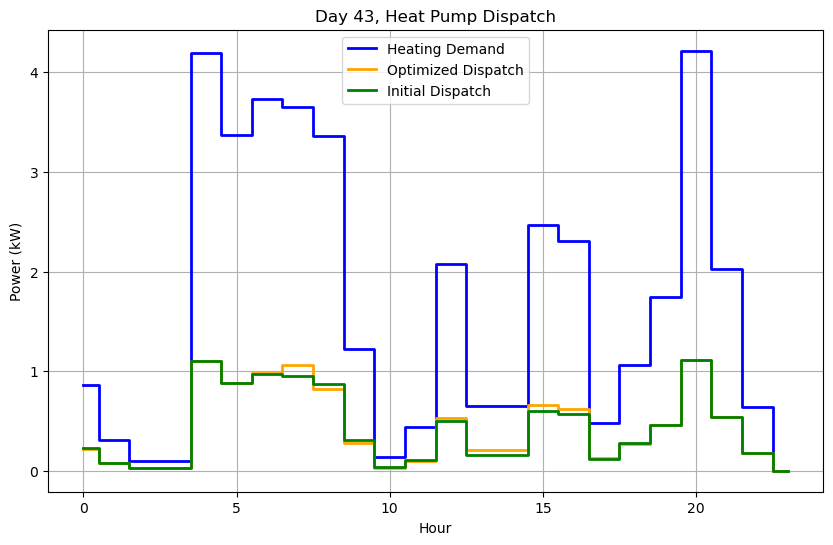


Day 44/365
Initial Guess Cost: €4.15
Optimized Daily Cost: €3.92
Total Heat Consumed (Qconsumption): 41.10 kWh
Total Heat Produced (Qproduction): 41.67 kWh
Buffer Tank Temperature at End of Day: 31.77°C
Optimized Dispatch: [1.96931985e-03 2.06131461e-03 2.05977401e-03 8.21937208e-02
 3.68189661e-01 3.17646757e-01 3.90412583e-01 3.51909178e-01
 2.26668755e-01 5.51697853e-01 1.92067511e-01 2.01431304e-01
 1.65036511e-02 8.69383292e-03 1.08707576e-02 1.34341752e-01
 3.38475666e-02 1.82959094e-01 1.29674509e-01 8.88071709e-02
 1.25410620e-01 1.15875417e-01 3.13371417e-03 1.39746727e-14]


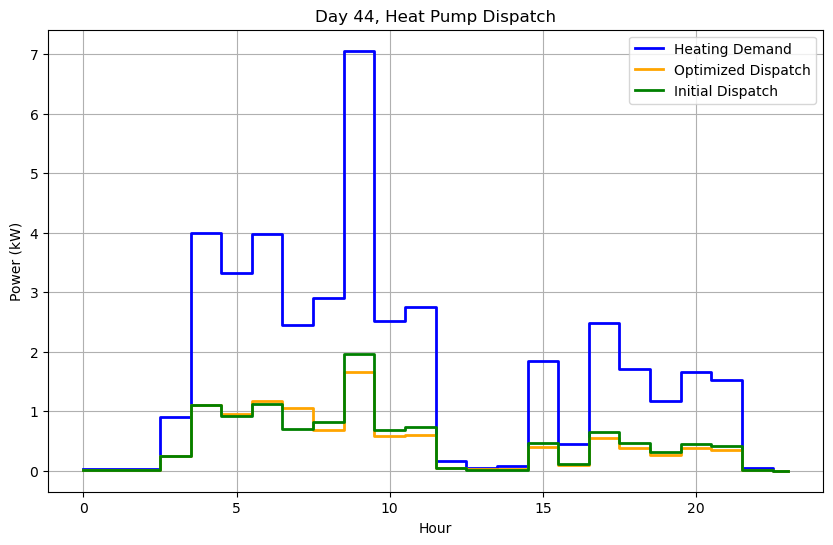


Day 45/365
Initial Guess Cost: €3.43
Optimized Daily Cost: €3.44
Total Heat Consumed (Qconsumption): 38.20 kWh
Total Heat Produced (Qproduction): 38.93 kWh
Buffer Tank Temperature at End of Day: 31.96°C
Optimized Dispatch: [2.41530425e-03 2.41812286e-03 2.42717638e-03 1.24356543e-01
 2.96340737e-01 2.22533403e-01 2.06210080e-01 3.60258371e-01
 4.44124437e-01 1.51576141e-01 1.78729526e-01 2.12013218e-02
 2.26808163e-01 1.88572160e-01 6.89495431e-02 4.18856073e-02
 8.94148506e-02 2.20952801e-01 1.91788686e-01 7.27853770e-02
 1.98221495e-01 6.13390831e-02 7.93521892e-02 5.73012638e-05]


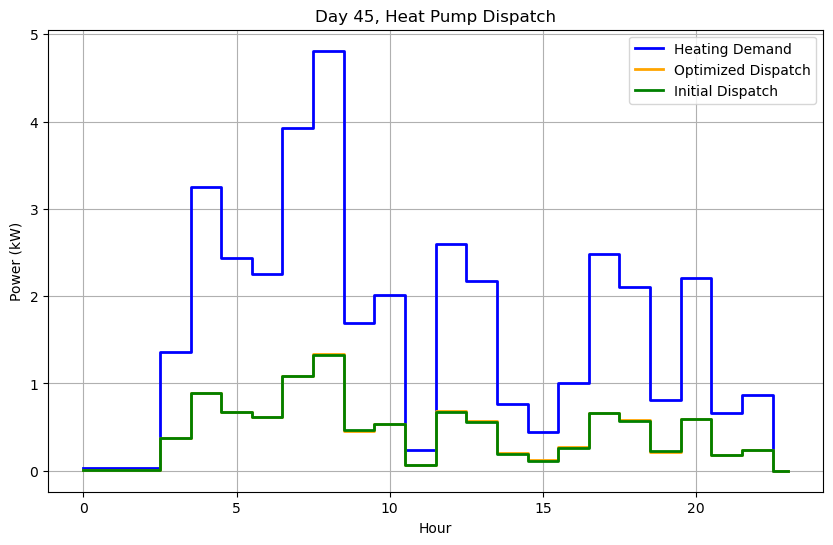


Day 46/365
Initial Guess Cost: €4.62
Optimized Daily Cost: €4.63
Total Heat Consumed (Qconsumption): 52.70 kWh
Total Heat Produced (Qproduction): 53.63 kWh
Buffer Tank Temperature at End of Day: 32.35°C
Optimized Dispatch: [0.01724592 0.28379888 0.16942002 0.27128404 0.33200686 0.61239355
 0.0973451  0.520583   0.27175737 0.26560935 0.22917576 0.25456023
 0.01668135 0.01131598 0.11969296 0.08229809 0.22822621 0.19044631
 0.12213903 0.18071711 0.30043164 0.27723    0.04088765 0.0140058 ]


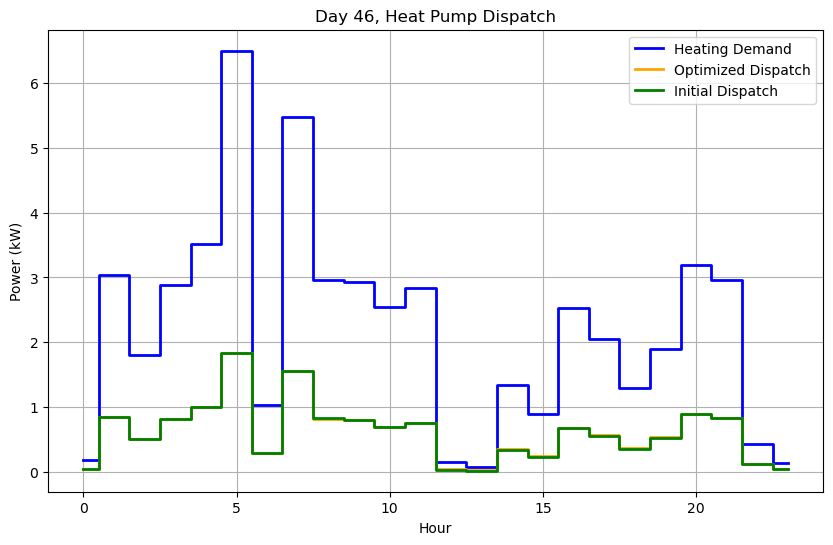


Day 47/365
Initial Guess Cost: €3.11
Optimized Daily Cost: €3.11
Total Heat Consumed (Qconsumption): 37.10 kWh
Total Heat Produced (Qproduction): 37.37 kWh
Buffer Tank Temperature at End of Day: 31.97°C
Optimized Dispatch: [0.01754797 0.27129563 0.03153438 0.19052433 0.38289859 0.57837264
 0.3039528  0.40281057 0.1475506  0.206942   0.01348757 0.13284198
 0.06354819 0.00959905 0.01723192 0.01184427 0.01563042 0.15304774
 0.15711671 0.04825277 0.13247144 0.07910935 0.02725738 0.01119853]


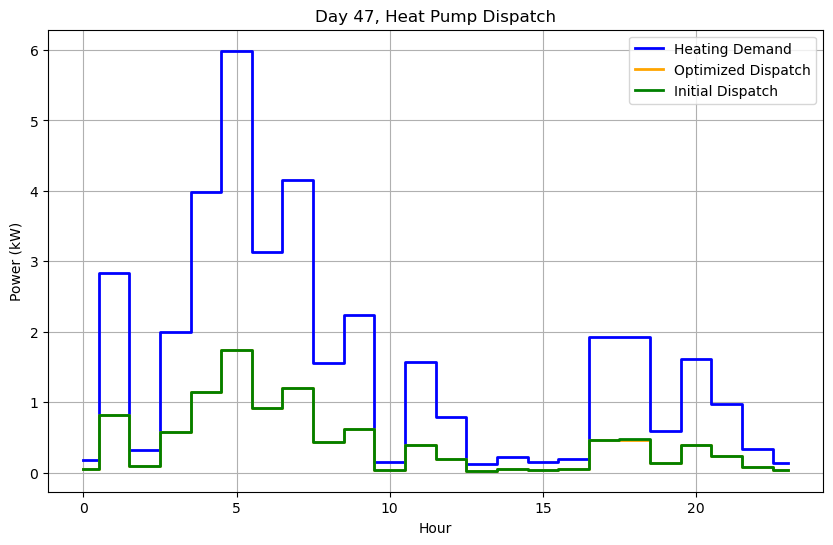


Day 48/365
Initial Guess Cost: €1.52
Optimized Daily Cost: €1.46
Total Heat Consumed (Qconsumption): 25.80 kWh
Total Heat Produced (Qproduction): 24.30 kWh
Buffer Tank Temperature at End of Day: 29.70°C
Optimized Dispatch: [0.00543917 0.01769848 0.00588816 0.00520605 0.00883513 0.1778151
 0.20382049 0.32130438 0.02744505 0.13689315 0.00814461 0.01405979
 0.21756846 0.04467849 0.02471382 0.13800874 0.05579752 0.02775005
 0.11728804 0.06211946 0.01796116 0.13066606 0.02014344 0.00585873]


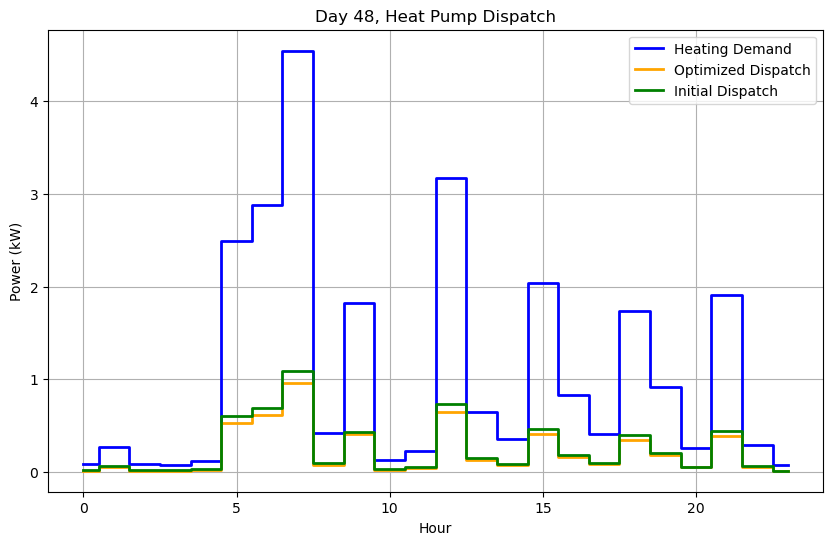


Day 49/365
Initial Guess Cost: €0.59
Optimized Daily Cost: €0.59
Total Heat Consumed (Qconsumption): 9.40 kWh
Total Heat Produced (Qproduction): 10.28 kWh
Buffer Tank Temperature at End of Day: 30.15°C
Optimized Dispatch: [0.02117906 0.00617224 0.00669265 0.00848628 0.00832007 0.20155958
 0.21847143 0.15753171 0.01188415 0.01851119 0.0130272  0.01354245
 0.01467365 0.01565812 0.0152308  0.01052047 0.00844917 0.00635018
 0.00527151 0.00504809 0.00473916 0.00389978 0.00358426 0.00205491]


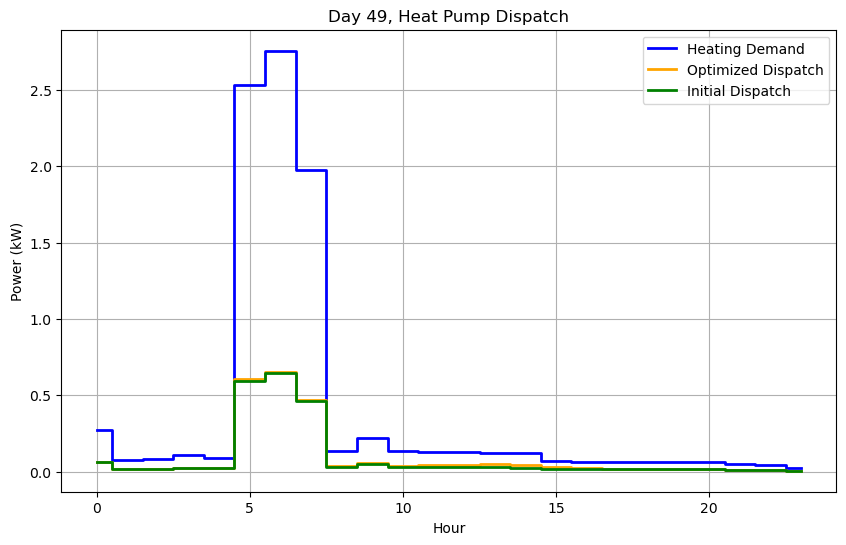


Day 50/365
Initial Guess Cost: €0.86
Optimized Daily Cost: €0.86
Total Heat Consumed (Qconsumption): 11.90 kWh
Total Heat Produced (Qproduction): 12.68 kWh
Buffer Tank Temperature at End of Day: 30.47°C
Optimized Dispatch: [0.0033529  0.00335855 0.00242134 0.00179493 0.00180316 0.00180434
 0.0490574  0.23504117 0.0153081  0.00578328 0.005152   0.00366921
 0.00244048 0.00246317 0.00262874 0.2121417  0.08085746 0.01065045
 0.00208    0.00208163 0.00208334 0.00908281 0.2955525  0.01442205]


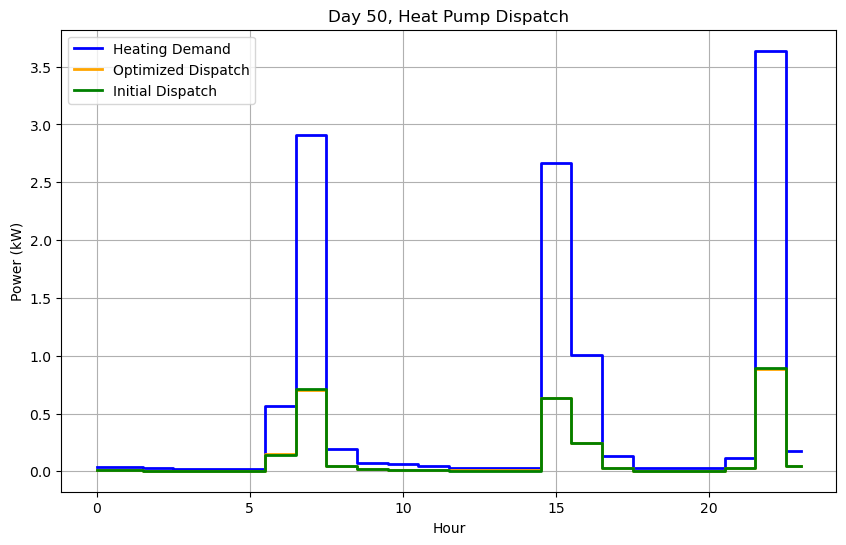


Day 51/365
Initial Guess Cost: €1.01
Optimized Daily Cost: €0.92
Total Heat Consumed (Qconsumption): 15.60 kWh
Total Heat Produced (Qproduction): 16.44 kWh
Buffer Tank Temperature at End of Day: 30.79°C
Optimized Dispatch: [0.02079079 0.03583415 0.39231525 0.0084691  0.00821573 0.09614722
 0.10808268 0.00802873 0.00088719 0.00141581 0.00675592 0.04645165
 0.05361537 0.06062714 0.03138725 0.01582644 0.00649382 0.00376731
 0.00386766 0.18870094 0.00963738 0.0073604  0.16049403 0.03278348]


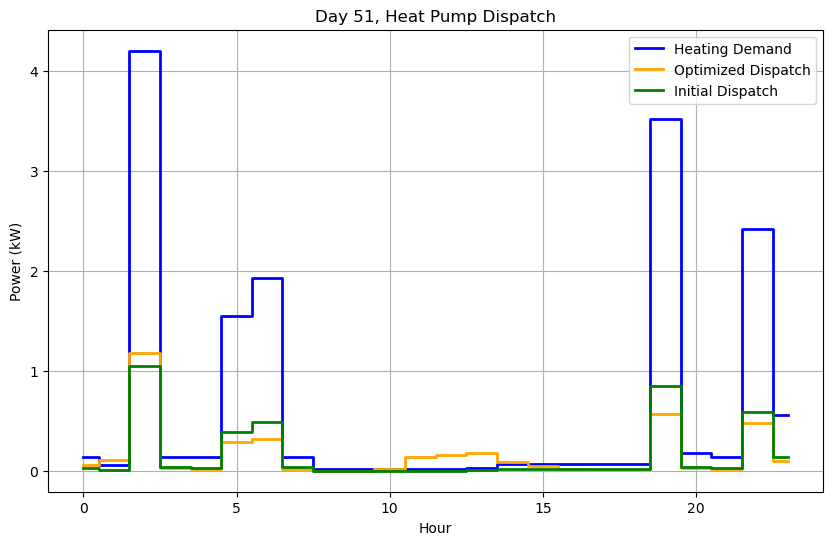


Day 52/365
Initial Guess Cost: €1.47
Optimized Daily Cost: €1.37
Total Heat Consumed (Qconsumption): 18.70 kWh
Total Heat Produced (Qproduction): 19.83 kWh
Buffer Tank Temperature at End of Day: 31.47°C
Optimized Dispatch: [0.02932004 0.37863217 0.03147452 0.01961111 0.28159456 0.0366381
 0.01617861 0.01376643 0.25191597 0.00990862 0.00706834 0.00465097
 0.00190062 0.00189649 0.00190143 0.00206196 0.00336865 0.00343263
 0.00353097 0.00356857 0.21237064 0.01428161 0.00943537 0.22238709]


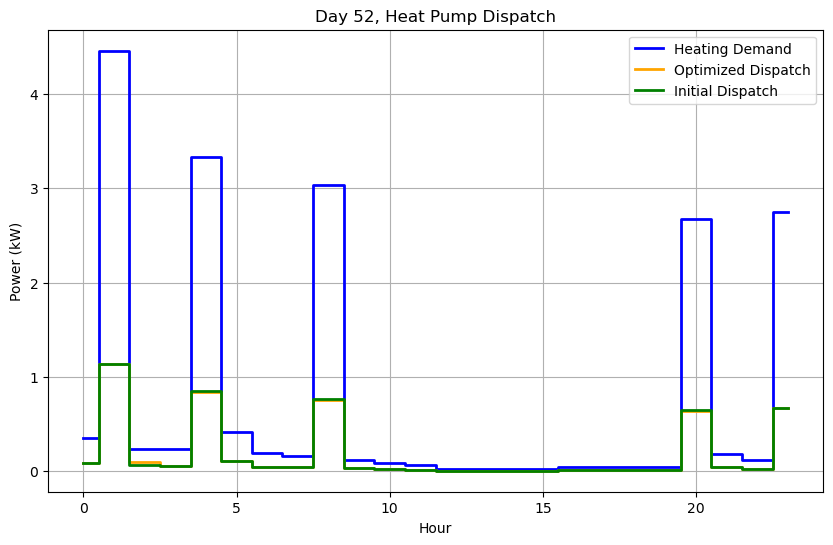


Day 53/365
Initial Guess Cost: €1.06
Optimized Daily Cost: €1.04
Total Heat Consumed (Qconsumption): 13.60 kWh
Total Heat Produced (Qproduction): 12.97 kWh
Buffer Tank Temperature at End of Day: 30.15°C
Optimized Dispatch: [8.35499714e-03 3.42164247e-11 2.57120780e-01 1.47496955e-01
 6.24116931e-02 3.71616923e-01 6.93383852e-03 5.37769453e-11
 2.69940346e-11 3.26414475e-11 3.85082551e-11 4.52541866e-06
 8.11193468e-06 1.36143308e-05 1.33591151e-05 4.84908691e-06
 2.41308561e-06 8.03954693e-11 8.64148268e-11 9.70334814e-11
 1.08106555e-10 2.44091700e-03 6.03899487e-15 5.47180611e-08]


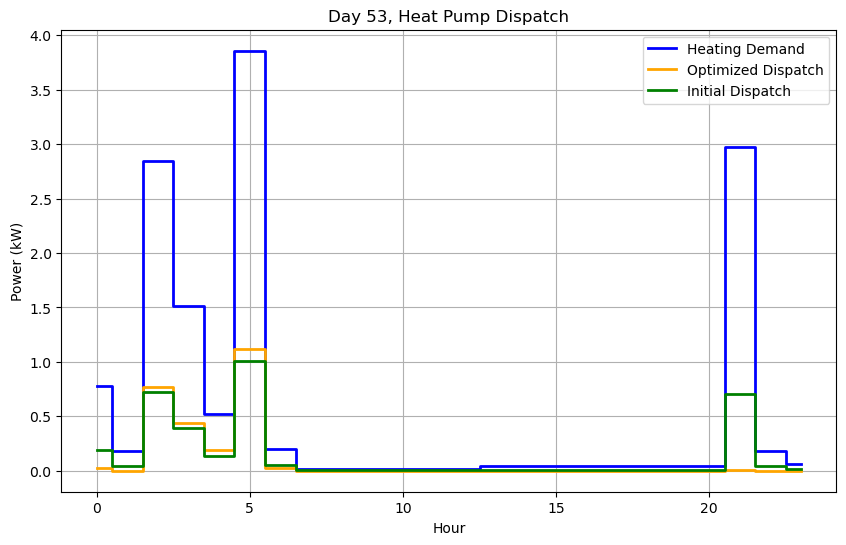


Day 54/365
Initial Guess Cost: €1.19
Optimized Daily Cost: €1.19
Total Heat Consumed (Qconsumption): 15.60 kWh
Total Heat Produced (Qproduction): 16.25 kWh
Buffer Tank Temperature at End of Day: 30.32°C
Optimized Dispatch: [0.02162715 0.24916024 0.02872778 0.01134134 0.10773208 0.21570641
 0.01250329 0.0014947  0.0014728  0.00144743 0.00166261 0.00205378
 0.00365766 0.00428477 0.00445888 0.0045835  0.00447022 0.2548075
 0.02706584 0.01411272 0.01273256 0.26276166 0.02069033 0.00435534]


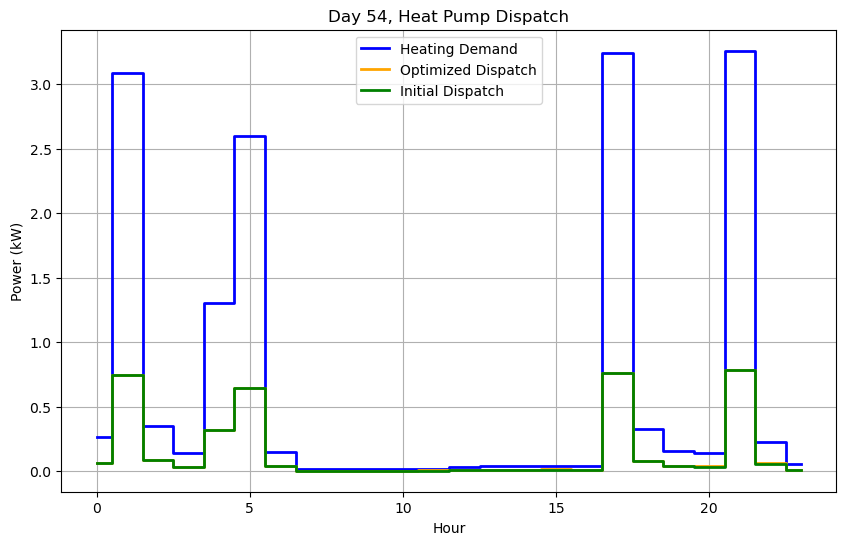


Day 55/365
Initial Guess Cost: €2.18
Optimized Daily Cost: €2.21
Total Heat Consumed (Qconsumption): 30.00 kWh
Total Heat Produced (Qproduction): 31.50 kWh
Buffer Tank Temperature at End of Day: 31.46°C
Optimized Dispatch: [0.09665869 0.19736937 0.00884925 0.04329647 0.2843808  0.01478079
 0.00759555 0.0113756  0.33285411 0.01631122 0.00705552 0.0025944
 0.0026873  0.00335139 0.00412519 0.00346217 0.19823291 0.08600022
 0.29690655 0.02912888 0.11064098 0.29459238 0.31903103 0.14029083]


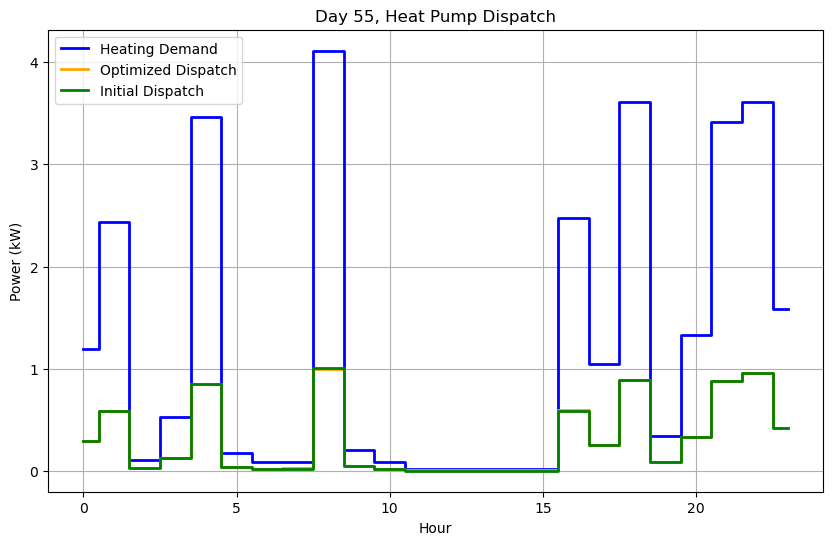


Day 56/365
Initial Guess Cost: €6.08
Optimized Daily Cost: €6.10
Total Heat Consumed (Qconsumption): 86.90 kWh
Total Heat Produced (Qproduction): 88.31 kWh
Buffer Tank Temperature at End of Day: 32.43°C
Optimized Dispatch: [0.00707193 0.33277332 0.0378437  0.16427032 0.29274378 0.00706233
 0.25866986 0.12577663 0.00605647 0.00596879 0.01451086 0.09037065
 0.57815426 0.68139893 0.70155139 0.69149686 0.41908514 0.61941191
 0.61088356 0.75306192 0.63732392 0.37783662 0.33300046 0.10429947]


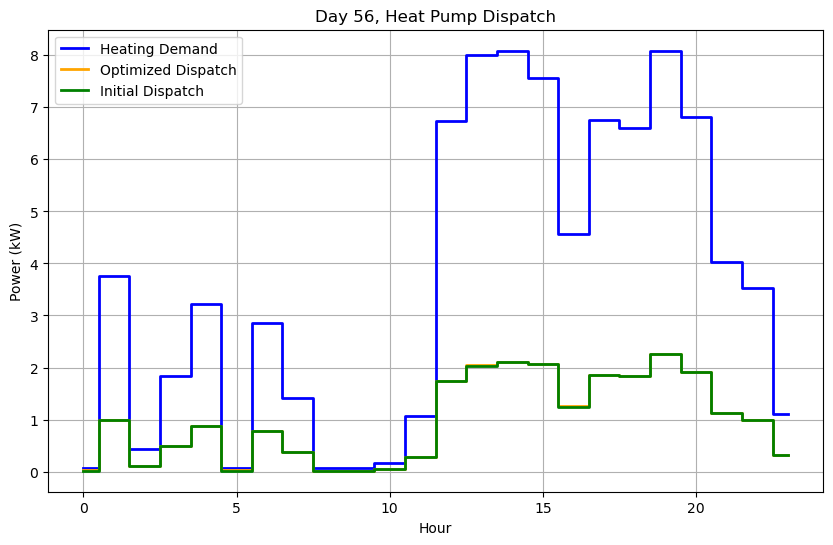


Day 57/365
Initial Guess Cost: €4.87
Optimized Daily Cost: €4.83
Total Heat Consumed (Qconsumption): 61.90 kWh
Total Heat Produced (Qproduction): 62.89 kWh
Buffer Tank Temperature at End of Day: 32.87°C
Optimized Dispatch: [0.01609399 0.33432386 0.20943389 0.21566198 0.43027868 0.32900686
 0.30239727 0.4150311  0.28838365 0.68165128 0.13213606 0.32483763
 0.13725375 0.25620546 0.30713374 0.15647417 0.20031076 0.23649072
 0.25709284 0.0443906  0.2323661  0.24785232 0.10349249 0.06867316]


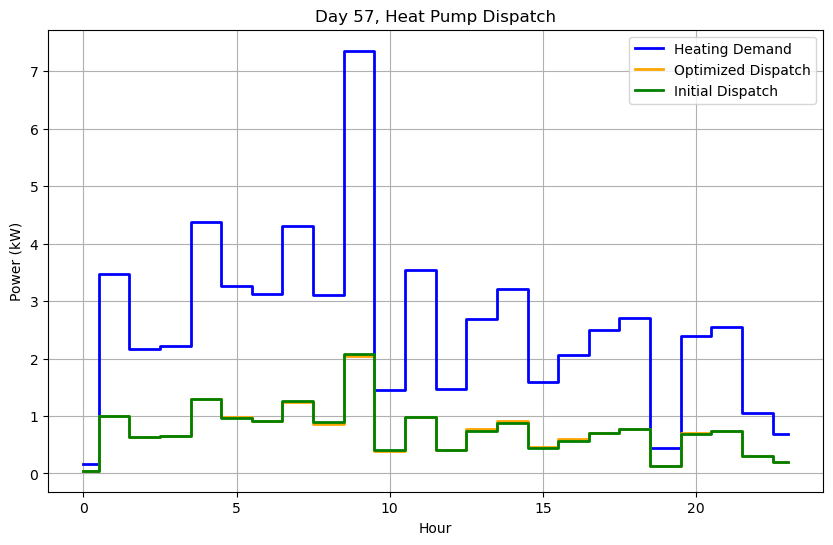


Day 58/365
Initial Guess Cost: €5.55
Optimized Daily Cost: €5.56
Total Heat Consumed (Qconsumption): 59.70 kWh
Total Heat Produced (Qproduction): 60.27 kWh
Buffer Tank Temperature at End of Day: 32.82°C
Optimized Dispatch: [2.63172895e-02 3.94079304e-01 1.08123766e-01 4.03526419e-01
 1.71802971e-01 7.40642762e-01 6.29520399e-01 4.57220866e-01
 2.17037220e-01 1.74804486e-01 2.11042105e-01 9.26673480e-02
 2.21775666e-01 6.81099046e-02 2.34047460e-01 7.04267572e-02
 1.68849485e-01 4.97925929e-02 2.76889262e-01 3.03417860e-01
 3.36505267e-01 3.21736958e-01 1.01395666e-01 4.53569814e-05]


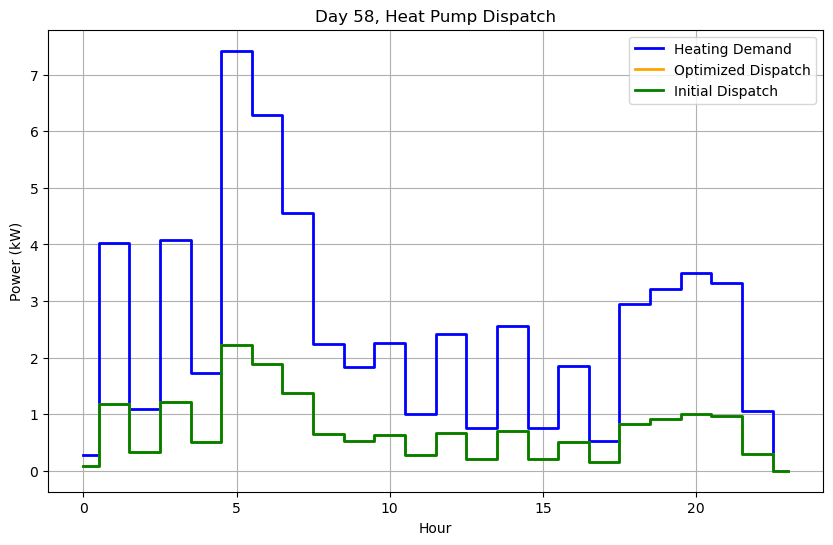


Day 59/365
Initial Guess Cost: €4.82
Optimized Daily Cost: €4.77
Total Heat Consumed (Qconsumption): 52.50 kWh
Total Heat Produced (Qproduction): 52.92 kWh
Buffer Tank Temperature at End of Day: 32.60°C
Optimized Dispatch: [0.00696439 0.26410748 0.08399063 0.31635027 0.27449908 0.75221748
 0.33063324 0.49273678 0.34695194 0.27468677 0.03862129 0.20216254
 0.0411245  0.24661136 0.03311869 0.19059873 0.03681606 0.20988757
 0.14157764 0.15357049 0.28053998 0.28187205 0.03059778 0.0057659 ]


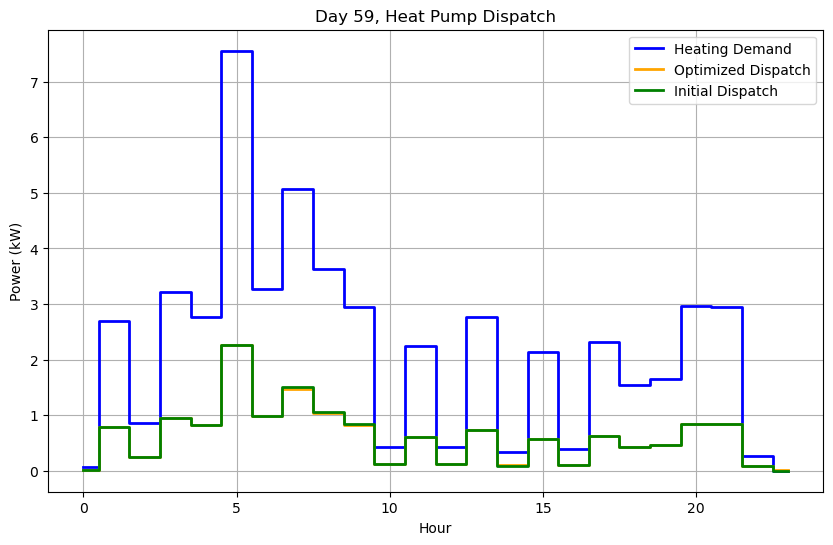


Day 60/365
Initial Guess Cost: €3.74
Optimized Daily Cost: €3.67
Total Heat Consumed (Qconsumption): 43.50 kWh
Total Heat Produced (Qproduction): 43.54 kWh
Buffer Tank Temperature at End of Day: 31.96°C
Optimized Dispatch: [0.18177935 0.18230511 0.18321294 0.18415614 0.18521353 0.18555636
 0.19105295 0.18429775 0.1803138  0.17574787 0.17184027 0.16768017
 0.16384508 0.16096152 0.15844379 0.15652471 0.15631043 0.15849565
 0.16253605 0.1652609  0.23026911 0.22856043 0.04175779 0.00977796]


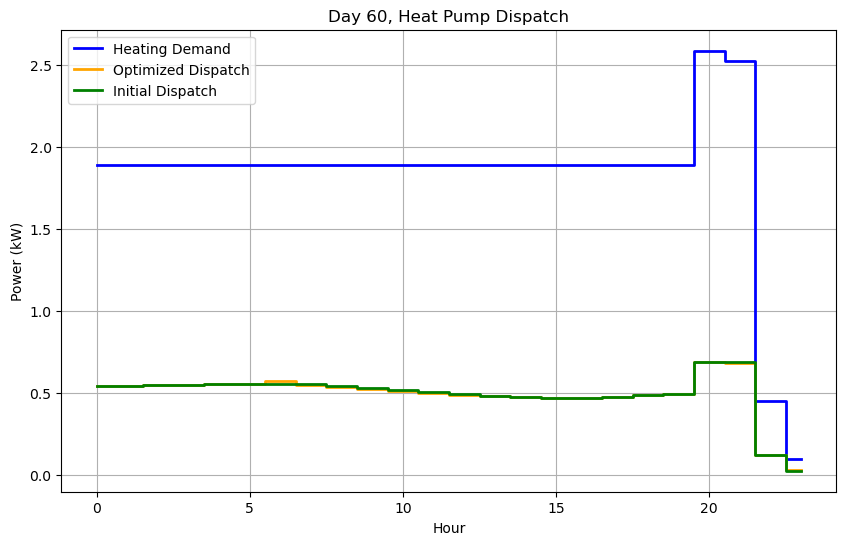


Day 61/365
Initial Guess Cost: €2.91
Optimized Daily Cost: €2.85
Total Heat Consumed (Qconsumption): 33.40 kWh
Total Heat Produced (Qproduction): 33.66 kWh
Buffer Tank Temperature at End of Day: 31.60°C
Optimized Dispatch: [6.85385831e-03 5.60908029e-02 1.41481489e-01 1.01722294e-01
 3.10195351e-01 4.80738205e-01 1.83309730e-01 3.32691500e-01
 1.70760160e-01 1.94890594e-01 8.63653638e-03 8.42884593e-03
 1.99488114e-04 2.31455423e-04 2.38366174e-04 1.47538413e-01
 2.34699400e-02 1.66781539e-01 9.54656152e-02 1.77117942e-01
 7.59765774e-02 2.50161849e-01 3.53696620e-02 9.18950150e-03]


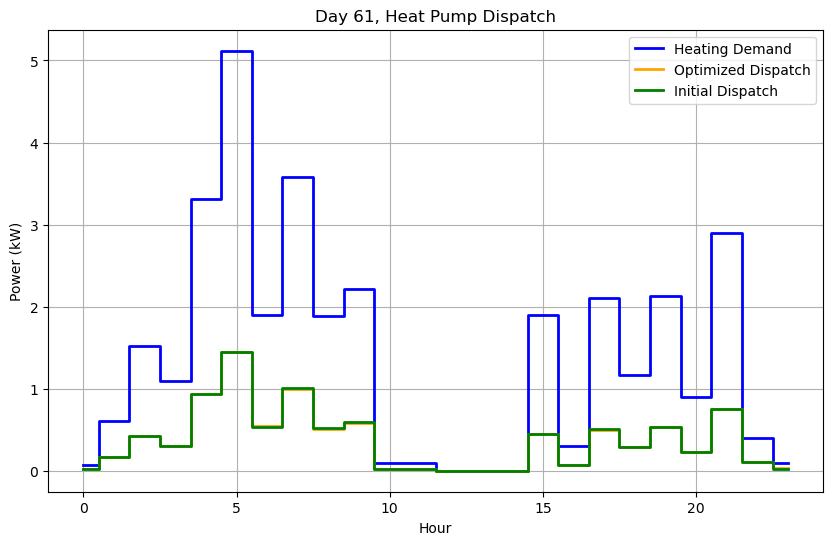


Day 62/365
Initial Guess Cost: €3.41
Optimized Daily Cost: €3.37
Total Heat Consumed (Qconsumption): 38.80 kWh
Total Heat Produced (Qproduction): 39.74 kWh
Buffer Tank Temperature at End of Day: 32.01°C
Optimized Dispatch: [0.00908656 0.21968714 0.02772189 0.23248047 0.11440116 0.33292658
 0.34483543 0.41431841 0.22261647 0.2033924  0.00850323 0.16737355
 0.07121203 0.00210392 0.00247888 0.00244871 0.00171553 0.20447472
 0.19383872 0.21239638 0.14002799 0.25399167 0.13559561 0.01431366]


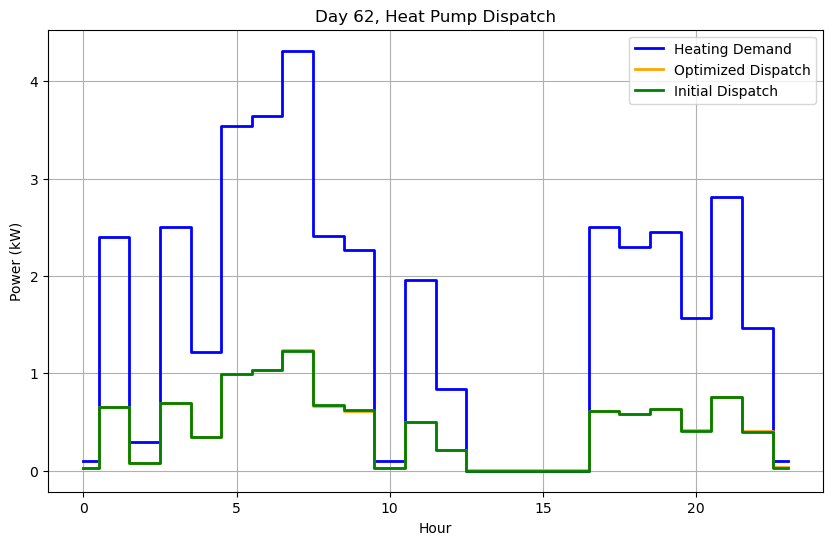


Day 63/365
Initial Guess Cost: €4.70
Optimized Daily Cost: €4.66
Total Heat Consumed (Qconsumption): 61.30 kWh
Total Heat Produced (Qproduction): 61.75 kWh
Buffer Tank Temperature at End of Day: 31.84°C
Optimized Dispatch: [1.18617114e-05 1.54929226e-07 1.89743474e-01 4.41857128e-02
 2.26747408e-01 3.72160706e-01 3.72282159e-01 3.41761470e-01
 1.09303277e-01 2.71533861e-01 2.46330811e-01 9.94051524e-02
 2.08494725e-01 3.15042836e-01 4.66556059e-01 2.97914154e-01
 1.04592677e-01 5.81706059e-01 1.83604383e-01 4.60548945e-01
 2.17103217e-01 2.43595688e-01 2.17884394e-01 7.66976108e-02]


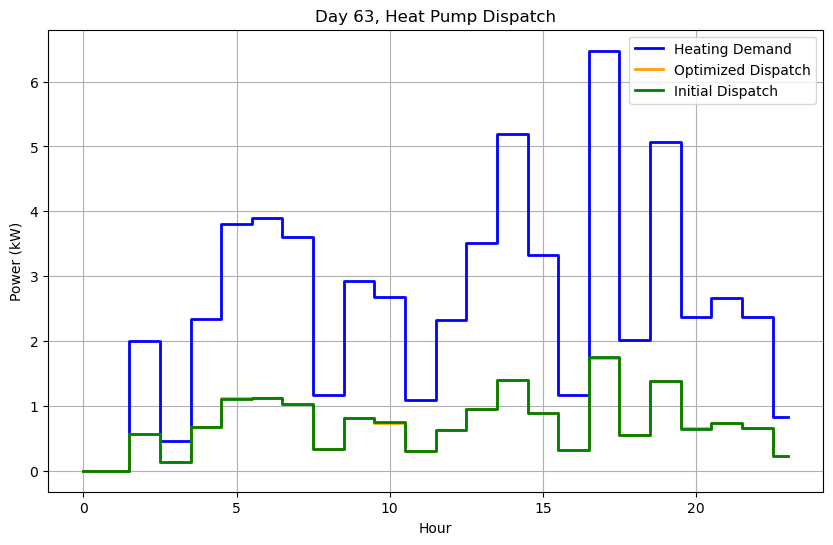


Day 64/365
Initial Guess Cost: €3.82
Optimized Daily Cost: €3.84
Total Heat Consumed (Qconsumption): 49.40 kWh
Total Heat Produced (Qproduction): 49.98 kWh
Buffer Tank Temperature at End of Day: 31.86°C
Optimized Dispatch: [2.59688961e-06 6.30762383e-17 6.19253090e-16 4.25824423e-17
 4.94356824e-01 2.58304217e-01 2.36759297e-01 3.02345696e-01
 2.61996627e-01 2.36851330e-01 1.87328468e-01 3.20258017e-01
 2.57779467e-02 3.03882634e-01 2.54975851e-01 1.71681220e-01
 1.84070354e-01 2.68541824e-02 4.28700472e-01 1.64344653e-01
 2.56643906e-01 2.55097229e-01 7.30669330e-02 5.25383567e-07]


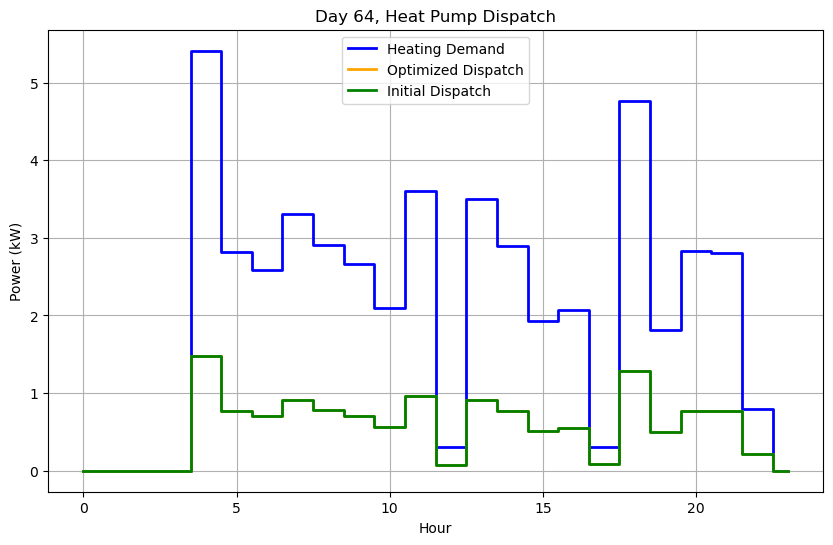


Day 65/365
Initial Guess Cost: €4.72
Optimized Daily Cost: €4.73
Total Heat Consumed (Qconsumption): 54.00 kWh
Total Heat Produced (Qproduction): 54.55 kWh
Buffer Tank Temperature at End of Day: 31.84°C
Optimized Dispatch: [1.12940236e-13 1.26108016e-16 2.14562224e-14 1.95744690e-01
 2.52648730e-01 4.44355394e-01 1.42914380e-01 3.25936893e-01
 1.65079387e-01 3.58282198e-01 1.18748688e-01 2.19998300e-01
 2.18738440e-01 3.16939379e-02 3.00198360e-01 1.11690976e-01
 2.91069480e-01 1.42222784e-01 5.45810347e-01 5.12524474e-01
 1.79511513e-01 2.04273784e-01 7.20800107e-02 1.02024504e-03]


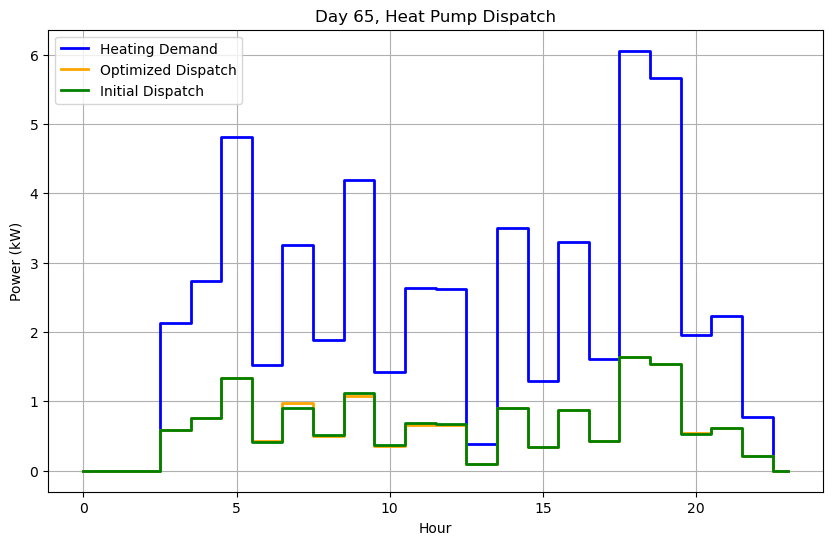


Day 66/365
Initial Guess Cost: €3.94
Optimized Daily Cost: €3.93
Total Heat Consumed (Qconsumption): 55.90 kWh
Total Heat Produced (Qproduction): 55.96 kWh
Buffer Tank Temperature at End of Day: 31.28°C
Optimized Dispatch: [2.68329549e-17 8.72776747e-03 2.82762334e-01 1.81881268e-02
 3.87480499e-01 4.11085349e-01 2.52239496e-01 2.50634909e-01
 2.44279903e-01 3.08928019e-01 1.69294474e-02 6.43951573e-02
 1.61875571e-01 3.97811685e-01 3.31942123e-01 2.46107264e-01
 3.38356312e-01 2.75165235e-01 1.14975402e-01 3.15542142e-01
 3.00606381e-01 7.90786272e-02 6.17811523e-02 4.12010265e-02]


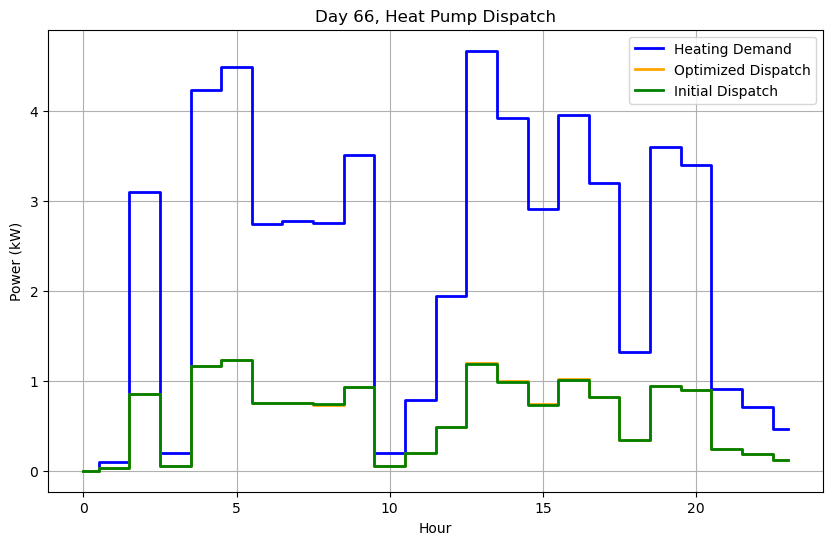


Day 67/365
Initial Guess Cost: €4.57
Optimized Daily Cost: €4.50
Total Heat Consumed (Qconsumption): 53.50 kWh
Total Heat Produced (Qproduction): 53.30 kWh
Buffer Tank Temperature at End of Day: 30.47°C
Optimized Dispatch: [3.57710653e-15 6.64920415e-17 1.82069788e-01 1.72438891e-02
 6.09699995e-01 2.71934309e-01 1.46606799e-01 2.81612711e-01
 3.49688949e-01 1.41244377e-01 2.24297944e-01 2.32200789e-02
 1.02677273e-01 2.47925035e-01 5.39991645e-03 2.16126381e-01
 1.78570096e-01 7.28296005e-02 1.66653884e-01 1.62405320e-01
 3.16684464e-02 1.46586791e-01 1.24861298e-02 2.20704060e-02]


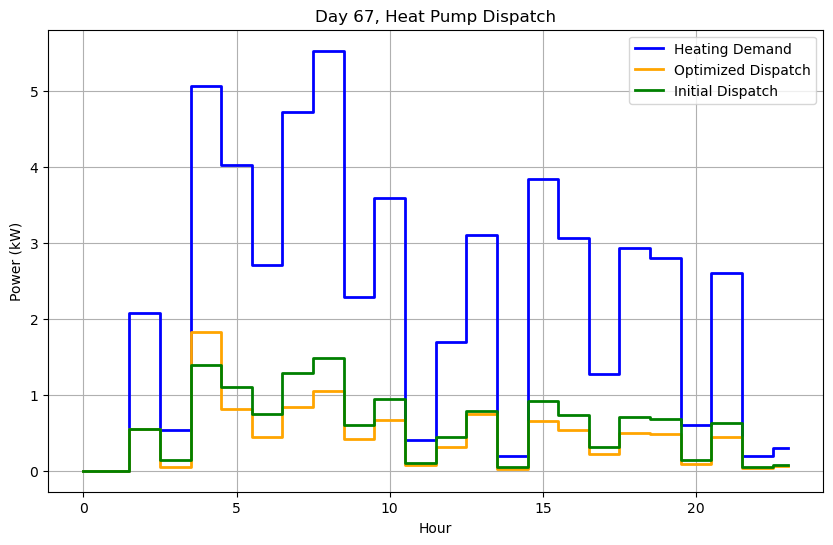


Day 68/365
Initial Guess Cost: €3.53
Optimized Daily Cost: €3.54
Total Heat Consumed (Qconsumption): 49.90 kWh
Total Heat Produced (Qproduction): 50.63 kWh
Buffer Tank Temperature at End of Day: 30.73°C
Optimized Dispatch: [0.00700062 0.01073992 0.19352278 0.0248623  0.33179157 0.49450413
 0.32634913 0.21028126 0.13772302 0.15719898 0.17358935 0.10853468
 0.24975977 0.03515038 0.01509366 0.25550411 0.08860184 0.15263278
 0.21497262 0.24354656 0.25583128 0.24341128 0.03624199 0.02346659]


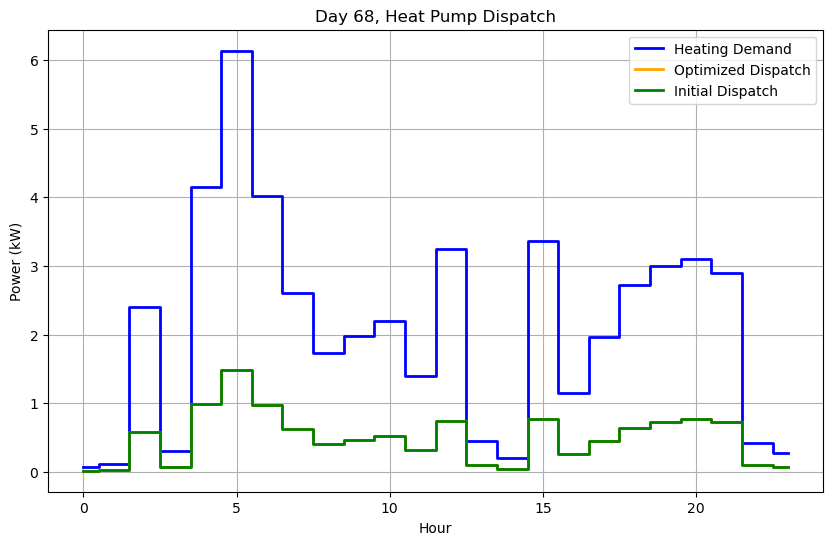


Day 69/365
Initial Guess Cost: €4.33
Optimized Daily Cost: €4.40
Total Heat Consumed (Qconsumption): 61.80 kWh
Total Heat Produced (Qproduction): 63.04 kWh
Buffer Tank Temperature at End of Day: 31.58°C
Optimized Dispatch: [0.00569803 0.01658198 0.01996934 0.35395517 0.11528382 0.40536726
 0.23551426 0.18299504 0.15954803 0.01422279 0.18579713 0.25010675
 0.04398793 0.16569304 0.15689255 0.07906479 0.14257511 0.41054228
 0.44663266 0.29677692 0.25009707 0.50610972 0.44492126 0.0359608 ]


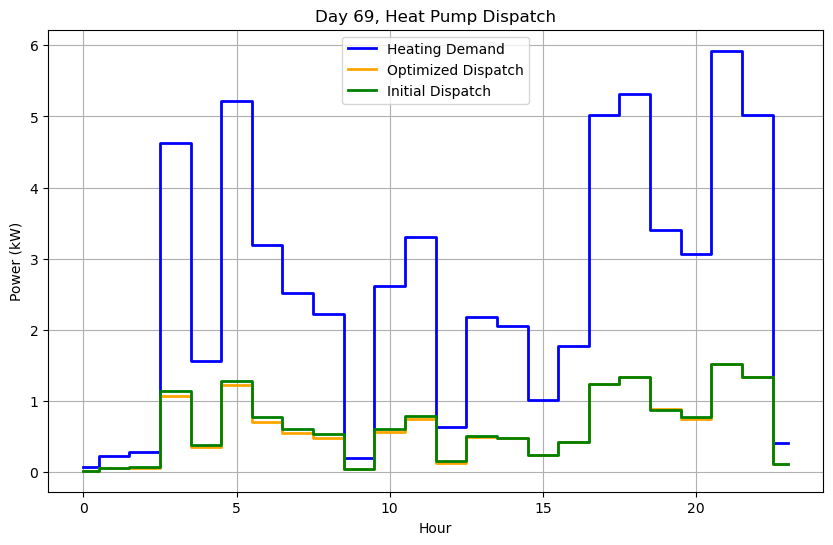


Day 70/365
Initial Guess Cost: €5.58
Optimized Daily Cost: €5.64
Total Heat Consumed (Qconsumption): 75.20 kWh
Total Heat Produced (Qproduction): 76.78 kWh
Buffer Tank Temperature at End of Day: 32.74°C
Optimized Dispatch: [3.83706778e-08 2.54437136e-10 2.18892487e-01 1.33754048e-01
 2.74435494e-01 2.30287673e-01 5.94618971e-01 2.66850842e-01
 3.14357837e-01 4.55459832e-01 2.25610844e-01 1.83591664e-01
 2.46343478e-01 3.38550287e-01 3.33613354e-01 3.18032623e-01
 1.91417492e-01 3.83878814e-01 3.49438872e-01 5.79984871e-01
 5.37119425e-01 2.39810413e-01 3.15477653e-01 1.94415532e-02]


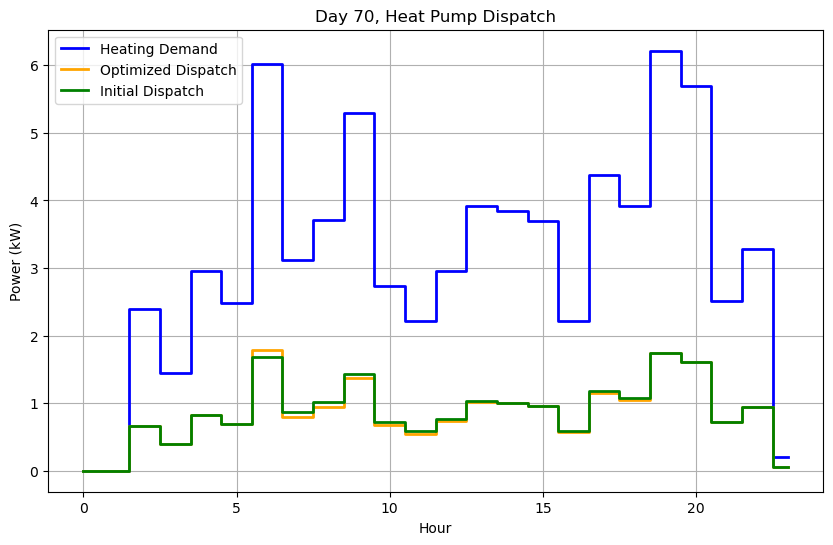


Day 71/365
Initial Guess Cost: €3.31
Optimized Daily Cost: €3.20
Total Heat Consumed (Qconsumption): 46.20 kWh
Total Heat Produced (Qproduction): 44.96 kWh
Buffer Tank Temperature at End of Day: 30.70°C
Optimized Dispatch: [2.30393461e-05 2.16352083e-02 3.94819367e-01 1.18506946e-01
 3.86263488e-01 5.40327199e-01 3.06884407e-01 1.79582086e-01
 2.58044183e-01 9.39430554e-02 2.94458999e-01 4.63609492e-02
 2.07865753e-01 2.17915508e-02 1.53746881e-01 3.20227810e-02
 1.40722992e-02 1.40474413e-01 4.06253020e-02 1.63442162e-01
 1.53325241e-01 1.42823695e-01 2.15246820e-02 7.17817177e-03]


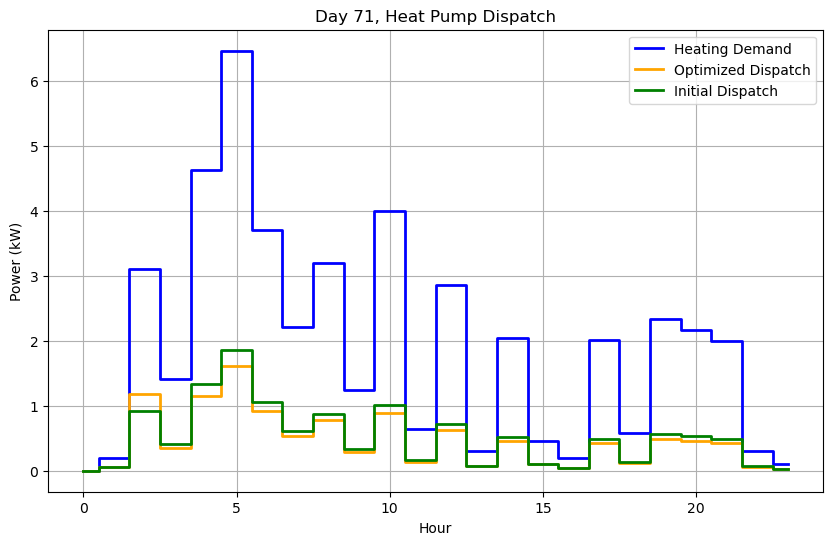


Day 72/365
Initial Guess Cost: €1.21
Optimized Daily Cost: €1.18
Total Heat Consumed (Qconsumption): 24.10 kWh
Total Heat Produced (Qproduction): 24.06 kWh
Buffer Tank Temperature at End of Day: 30.09°C
Optimized Dispatch: [1.99979933e-02 1.61012812e-02 1.42204022e-02 7.86849859e-02
 5.41883419e-01 2.29754897e-01 1.26558504e-01 1.50356156e-01
 2.17953579e-02 1.40424756e-02 6.81253715e-03 1.35008365e-02
 4.76559564e-05 6.60046591e-03 1.93933215e-02 6.65595930e-03
 1.68795635e-04 4.41409187e-02 1.31233764e-01 8.54104976e-02
 1.33411771e-01 1.48817105e-01 2.15050846e-02 1.46195056e-02]


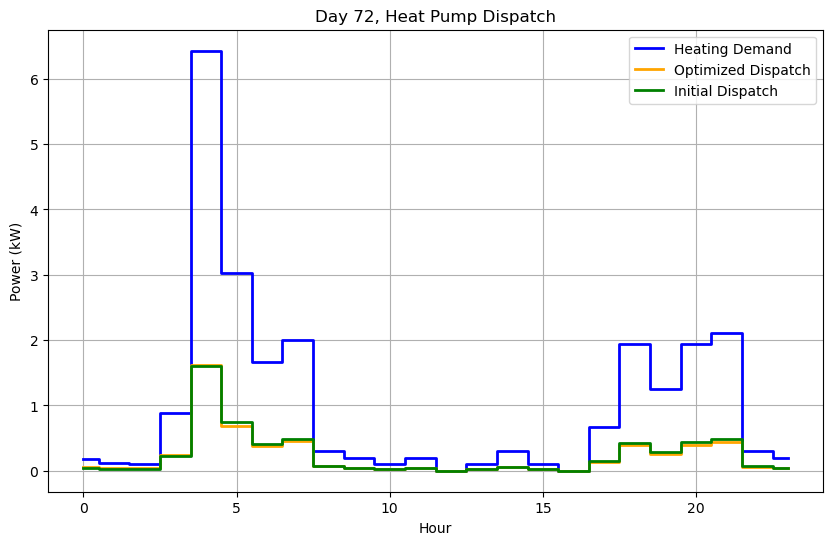


Day 73/365
Initial Guess Cost: €2.63
Optimized Daily Cost: €2.64
Total Heat Consumed (Qconsumption): 41.60 kWh
Total Heat Produced (Qproduction): 43.58 kWh
Buffer Tank Temperature at End of Day: 31.77°C
Optimized Dispatch: [0.00793472 0.0158763  0.00777174 0.11350911 0.3836151  0.19206013
 0.17905707 0.03894069 0.12660233 0.01345594 0.02812336 0.02547149
 0.17503759 0.03558742 0.20475451 0.27994581 0.21968462 0.23792731
 0.320123   0.56054159 0.04976593 0.25371978 0.03179673 0.00059621]


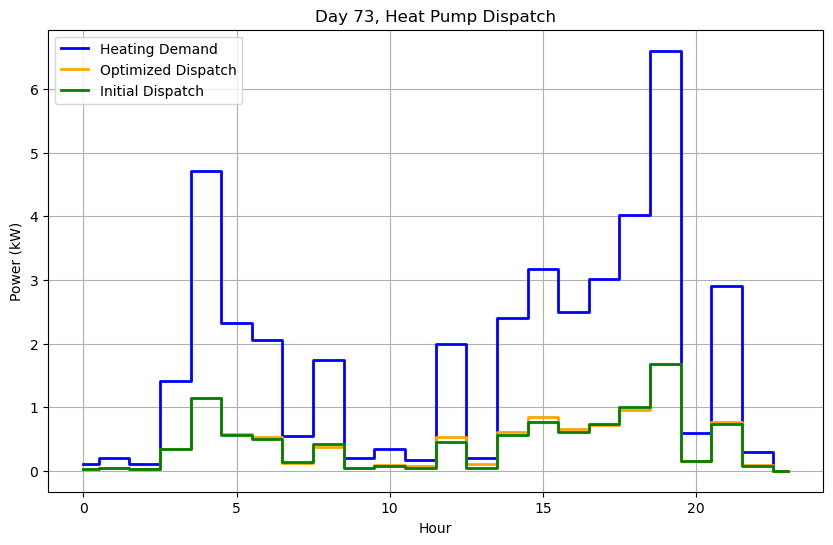


Day 74/365
Initial Guess Cost: €4.84
Optimized Daily Cost: €4.75
Total Heat Consumed (Qconsumption): 55.30 kWh
Total Heat Produced (Qproduction): 56.59 kWh
Buffer Tank Temperature at End of Day: 32.38°C
Optimized Dispatch: [2.99041213e-13 1.91568718e-01 1.14836132e-01 5.07123760e-02
 3.96467900e-01 8.15002945e-01 2.22857968e-01 8.17558097e-10
 4.65525676e-07 3.66665672e-06 1.50593076e-10 7.50112169e-05
 5.14872539e-06 4.92952840e-01 9.99999875e-01 4.67205848e-01
 1.08318298e-07 8.71084103e-10 3.08916943e-09 2.11998466e-06
 3.84335244e-09 8.95824968e-02 9.80227204e-04 3.43811270e-04]


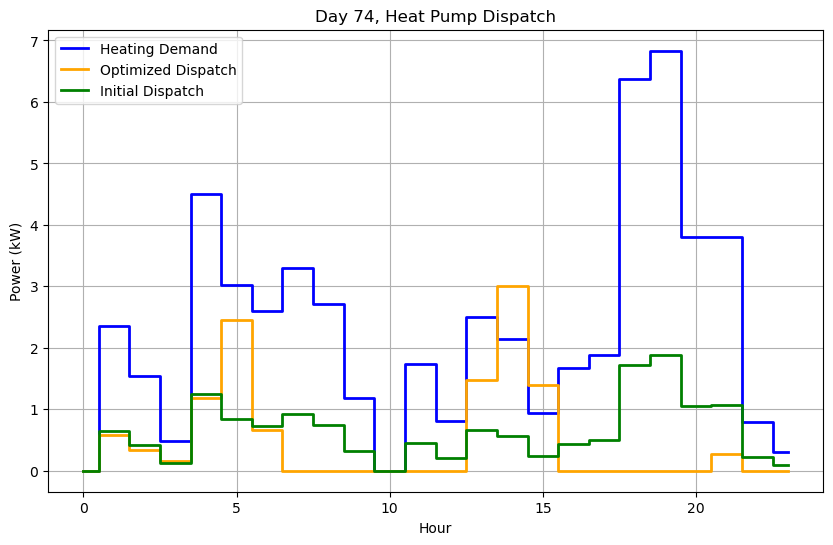


Day 75/365
Initial Guess Cost: €2.90
Optimized Daily Cost: €2.80
Total Heat Consumed (Qconsumption): 36.90 kWh
Total Heat Produced (Qproduction): 36.77 kWh
Buffer Tank Temperature at End of Day: 31.56°C
Optimized Dispatch: [1.49801068e-01 1.47876417e-01 2.13806365e-01 9.99737927e-02
 4.17771673e-01 3.51443676e-01 1.89184933e-01 5.35665377e-01
 8.18002498e-02 1.57884375e-02 6.98364339e-02 1.23614171e-01
 8.18251967e-03 8.07742576e-03 1.83701007e-14 1.21985283e-12
 1.21833640e-12 2.20877713e-01 1.69213988e-01 9.44145660e-02
 1.95395537e-01 1.73462282e-01 8.51944666e-02 1.72889860e-02]


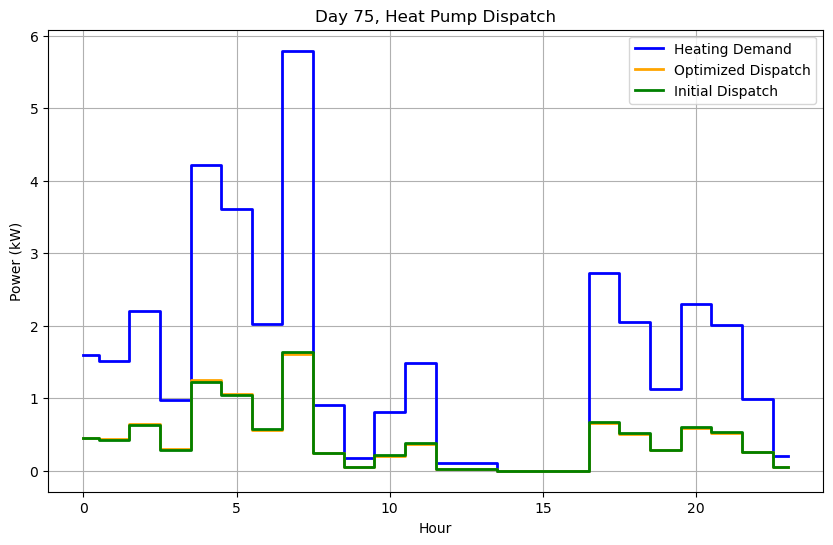


Day 76/365
Initial Guess Cost: €1.63
Optimized Daily Cost: €1.48
Total Heat Consumed (Qconsumption): 22.50 kWh
Total Heat Produced (Qproduction): 22.67 kWh
Buffer Tank Temperature at End of Day: 31.10°C
Optimized Dispatch: [3.13929333e-08 9.27824527e-14 2.86140216e-01 2.41812829e-01
 1.47963683e-01 3.07763161e-01 5.11854740e-01 5.30057460e-02
 1.90779567e-02 7.51010682e-03 7.23221254e-03 7.02275375e-03
 7.99897905e-18 1.33459311e-02 1.24183178e-17 1.63611502e-17
 2.35501537e-17 6.61117015e-03 1.36728707e-02 1.41826208e-01
 3.27535256e-02 1.51821304e-01 2.19408570e-02 7.37949219e-03]


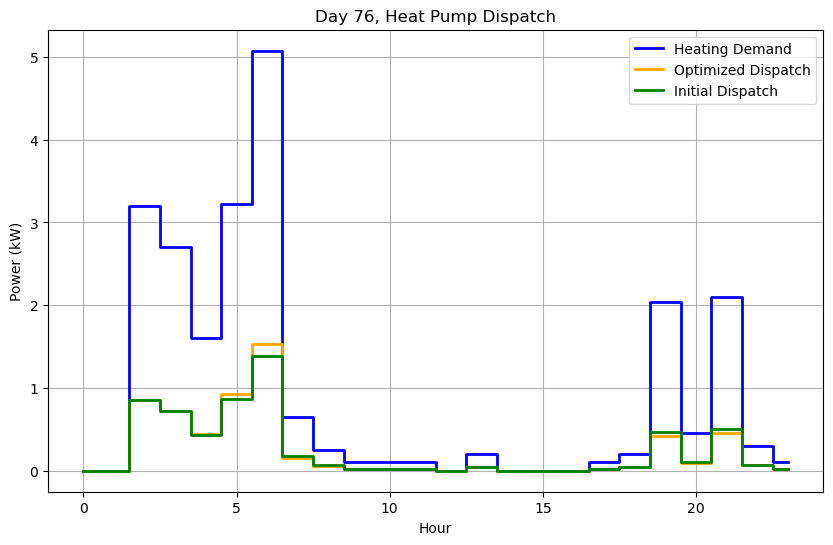


Day 77/365
Initial Guess Cost: €0.88
Optimized Daily Cost: €0.91
Total Heat Consumed (Qconsumption): 13.20 kWh
Total Heat Produced (Qproduction): 12.55 kWh
Buffer Tank Temperature at End of Day: 29.80°C
Optimized Dispatch: [5.81512547e-03 5.85633003e-03 5.91594633e-03 5.97237401e-03
 5.00177689e-11 1.68879406e-01 1.71616741e-01 8.85517320e-02
 1.12251488e-02 5.42108961e-03 7.00761550e-06 2.19866026e-04
 5.51474518e-04 8.94304952e-04 7.09895232e-04 8.66597396e-04
 1.43040785e-04 5.28796465e-08 2.09392628e-14 1.05797054e-01
 1.07295043e-02 1.36684014e-01 2.69103573e-02 1.20645567e-02]


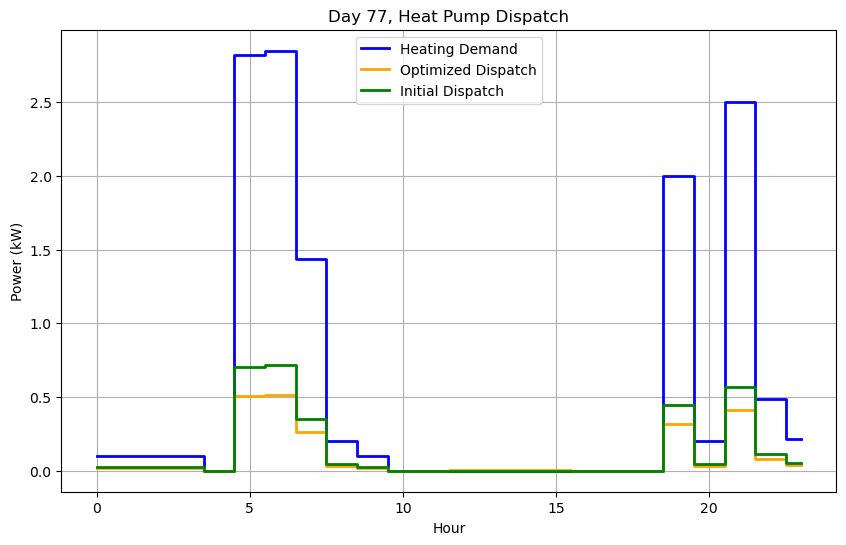


Day 78/365
Initial Guess Cost: €1.08
Optimized Daily Cost: €1.03
Total Heat Consumed (Qconsumption): 14.60 kWh
Total Heat Produced (Qproduction): 15.49 kWh
Buffer Tank Temperature at End of Day: 30.26°C
Optimized Dispatch: [0.00539207 0.01021722 0.01584094 0.01348073 0.16606512 0.06325395
 0.17356435 0.04516296 0.11923808 0.05660768 0.0254365  0.02088165
 0.00900563 0.00437301 0.00449242 0.0044377  0.00408392 0.00153758
 0.00981529 0.20019419 0.16815091 0.03468131 0.02372773 0.00792149]


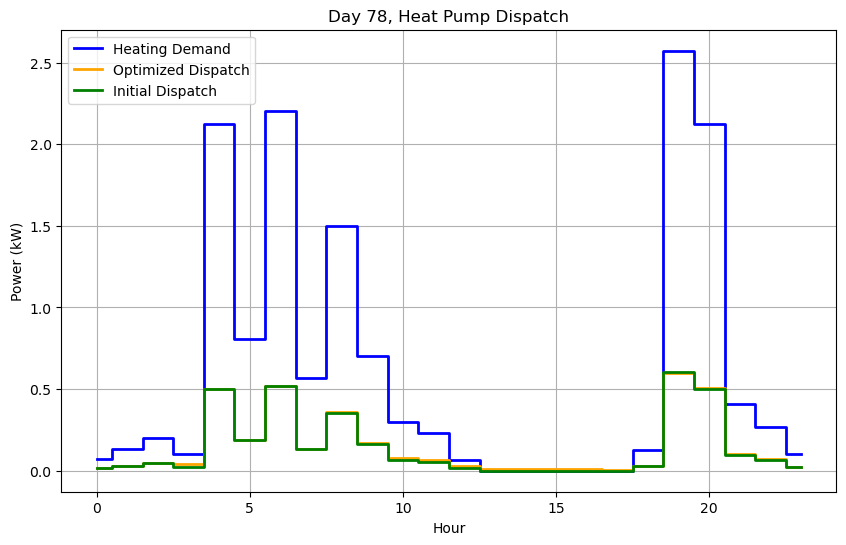


Day 79/365
Initial Guess Cost: €1.57
Optimized Daily Cost: €1.58
Total Heat Consumed (Qconsumption): 22.10 kWh
Total Heat Produced (Qproduction): 22.50 kWh
Buffer Tank Temperature at End of Day: 30.16°C
Optimized Dispatch: [0.00795986 0.0162078  0.00820816 0.00095657 0.28198573 0.1743261
 0.17860786 0.01997239 0.18136322 0.04603044 0.01571331 0.00833696
 0.00874325 0.00892482 0.00890858 0.00884298 0.14451599 0.03888564
 0.21740952 0.11804139 0.12023111 0.08968332 0.03996813 0.01604577]


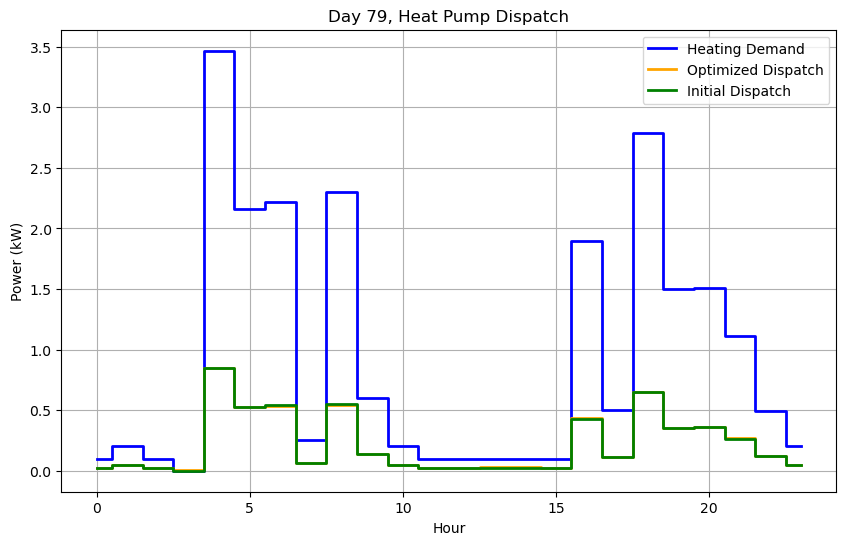


Day 80/365
Initial Guess Cost: €1.23
Optimized Daily Cost: €1.18
Total Heat Consumed (Qconsumption): 16.30 kWh
Total Heat Produced (Qproduction): 16.52 kWh
Buffer Tank Temperature at End of Day: 29.85°C
Optimized Dispatch: [1.10494519e-02 2.34191184e-02 3.36111512e-02 4.04435564e-02
 1.37186650e-01 1.34589476e-01 1.36525746e-01 3.26975864e-02
 1.20694119e-02 9.28198284e-11 2.48611530e-03 8.68544391e-03
 1.81466095e-02 3.25753610e-02 4.03436030e-02 4.10541128e-02
 3.14329868e-02 9.14827488e-02 1.66610862e-02 8.50626351e-02
 4.02226784e-02 2.78515223e-02 1.20231516e-02 4.02732091e-03]


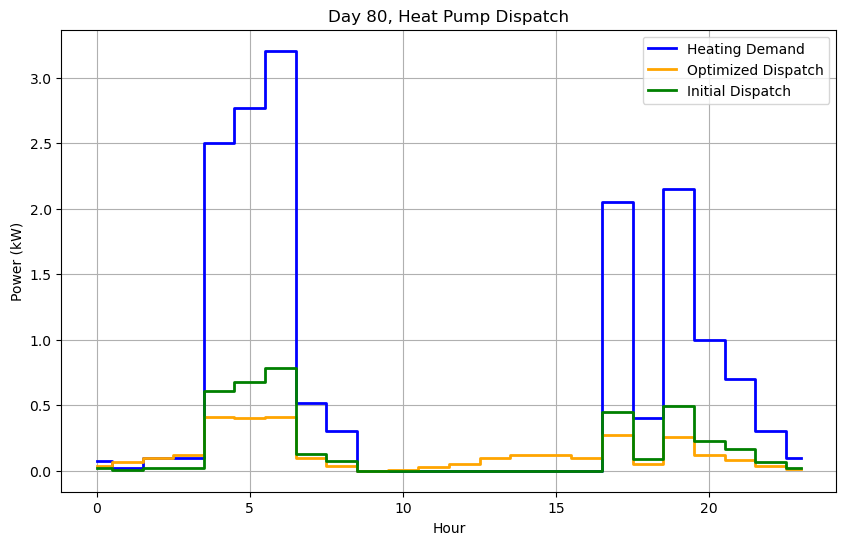


Day 81/365
Initial Guess Cost: €1.18
Optimized Daily Cost: €1.05
Total Heat Consumed (Qconsumption): 16.10 kWh
Total Heat Produced (Qproduction): 16.80 kWh
Buffer Tank Temperature at End of Day: 30.08°C
Optimized Dispatch: [5.64126400e-03 1.01722511e-02 1.59477952e-02 1.08017201e-02
 1.92152517e-01 1.74440675e-01 2.28180069e-01 1.77276467e-01
 1.52881471e-02 7.36878331e-03 1.44603899e-02 7.08607225e-03
 8.29028792e-16 7.97532939e-16 9.61918269e-16 1.05681918e-15
 1.17288054e-15 9.37337729e-16 4.35089314e-02 1.65148125e-01
 2.27508801e-02 1.76065765e-01 7.64569908e-03 1.53568874e-02]


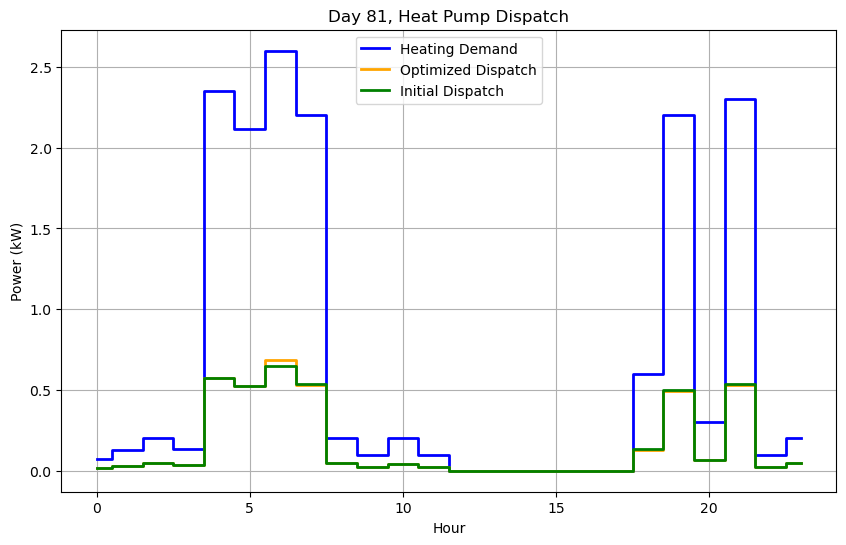


Day 82/365
Initial Guess Cost: €0.57
Optimized Daily Cost: €0.42
Total Heat Consumed (Qconsumption): 10.00 kWh
Total Heat Produced (Qproduction): 9.84 kWh
Buffer Tank Temperature at End of Day: 29.28°C
Optimized Dispatch: [3.39800639e-16 1.51037004e-16 1.41207065e-16 2.11390022e-15
 2.70414878e-01 8.53303491e-15 1.11707892e-16 3.67292351e-16
 2.08204868e-16 3.35114463e-16 6.79512280e-15 1.93823893e-08
 5.40718446e-07 4.47809606e-01 1.52045002e-16 2.05795282e-16
 2.79651128e-16 2.90204372e-15 7.31045313e-16 7.48559757e-16
 2.46334811e-15 4.88105848e-16 5.87653360e-16 7.81121375e-17]


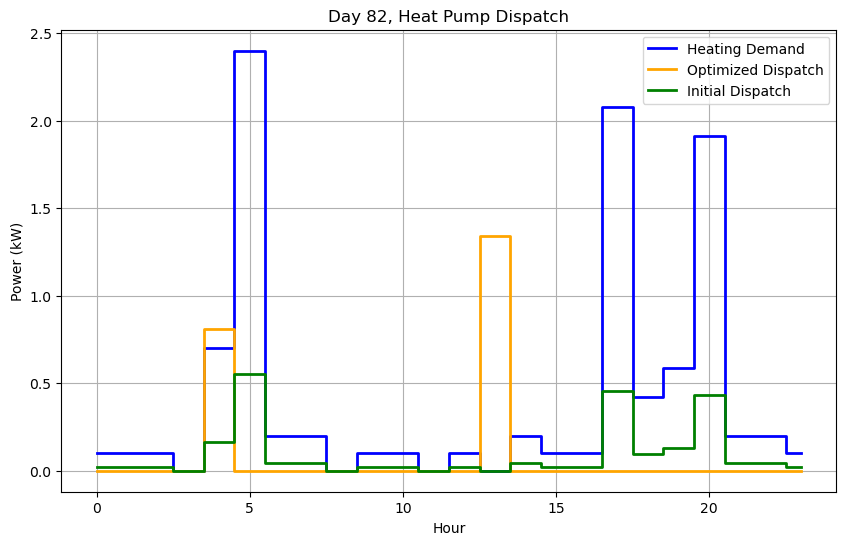


Day 83/365
Initial Guess Cost: €1.15
Optimized Daily Cost: €1.15
Total Heat Consumed (Qconsumption): 21.20 kWh
Total Heat Produced (Qproduction): 22.56 kWh
Buffer Tank Temperature at End of Day: 30.29°C
Optimized Dispatch: [2.06858670e-07 7.52564262e-03 7.52332581e-03 2.10591776e-10
 7.58140292e-03 1.32538896e-01 1.81843299e-01 1.49041887e-02
 7.36447556e-03 7.35395985e-03 1.53691804e-01 1.60241601e-02
 2.29376947e-02 2.99905219e-02 2.31513261e-02 1.77352013e-01
 1.99103788e-01 3.58035567e-02 1.54996219e-01 8.22934168e-02
 1.88988604e-01 3.43266826e-02 1.71956152e-01 4.33040786e-02]


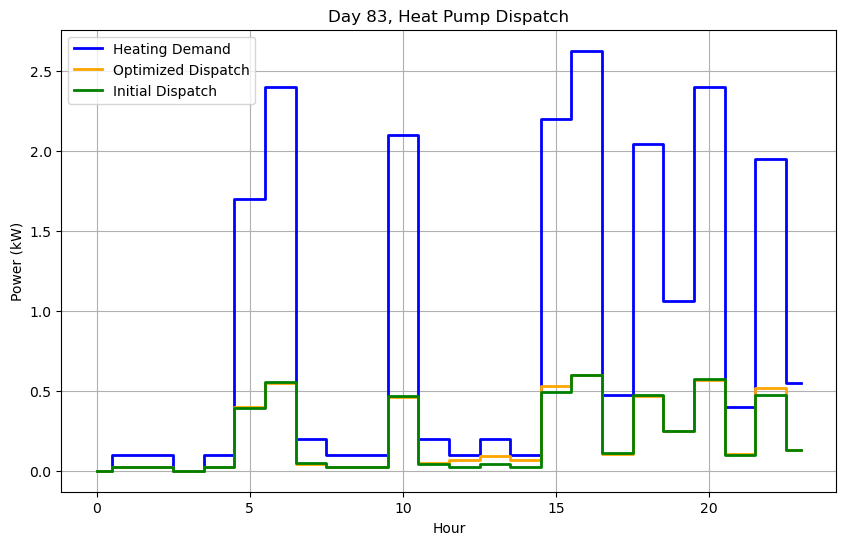


Day 84/365
Initial Guess Cost: €1.05
Optimized Daily Cost: €1.02
Total Heat Consumed (Qconsumption): 22.60 kWh
Total Heat Produced (Qproduction): 23.41 kWh
Buffer Tank Temperature at End of Day: 30.65°C
Optimized Dispatch: [0.02732569 0.01185757 0.00802283 0.00814823 0.01637178 0.17155046
 0.423002   0.07252909 0.02469056 0.01562984 0.00177793 0.09674454
 0.15137061 0.06095    0.12855955 0.01444703 0.02754117 0.00920561
 0.17915296 0.02362842 0.14947495 0.11019683 0.11233811 0.00928486]


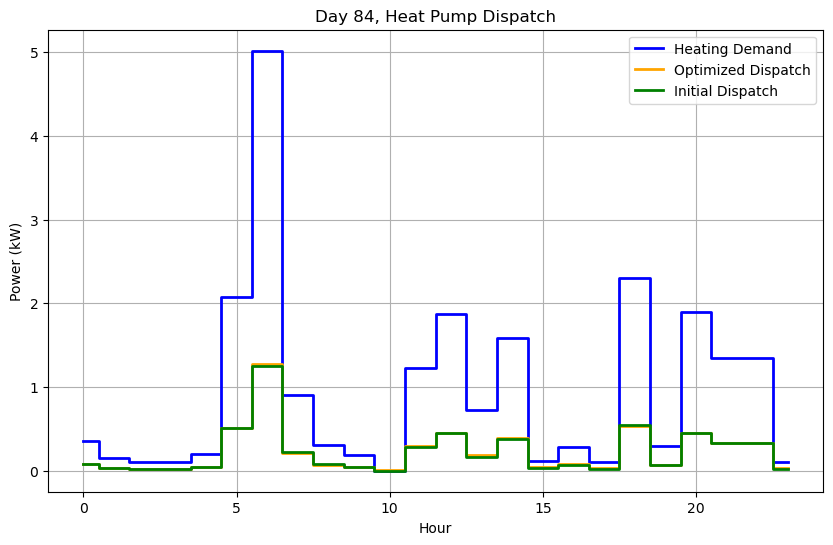


Day 85/365
Initial Guess Cost: €1.50
Optimized Daily Cost: €1.24
Total Heat Consumed (Qconsumption): 23.08 kWh
Total Heat Produced (Qproduction): 23.71 kWh
Buffer Tank Temperature at End of Day: 30.70°C
Optimized Dispatch: [3.94140090e-02 2.42408384e-02 2.48016992e-02 3.52334854e-01
 1.66095882e-01 4.14233060e-01 4.63991130e-02 5.28484528e-02
 7.55479501e-03 7.02829591e-03 1.67664287e-01 1.07729562e-01
 1.65554140e-03 1.87584659e-02 8.28472436e-02 2.44181420e-01
 1.63241491e-01 4.13824111e-02 1.57507268e-07 1.81048862e-07
 1.27573329e-07 8.90298397e-08 1.16539663e-08 2.26415428e-08]


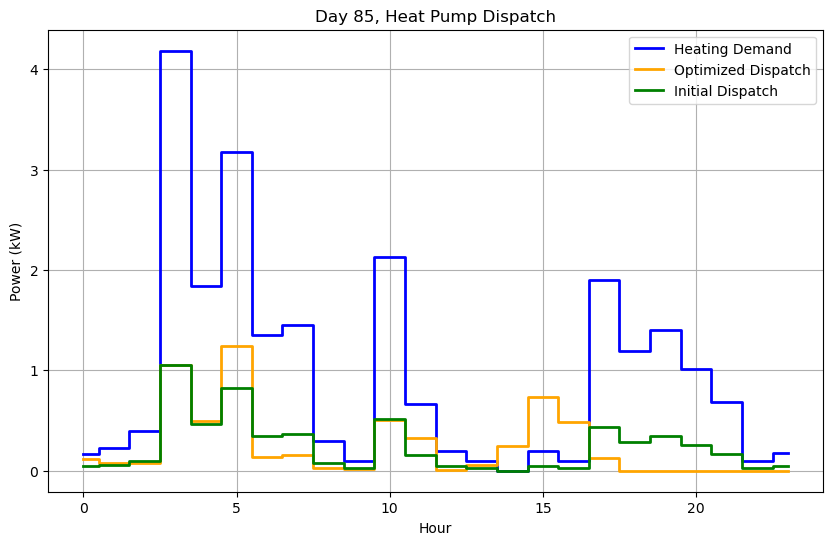


Day 86/365
Initial Guess Cost: €2.48
Optimized Daily Cost: €2.51
Total Heat Consumed (Qconsumption): 34.42 kWh
Total Heat Produced (Qproduction): 36.28 kWh
Buffer Tank Temperature at End of Day: 32.19°C
Optimized Dispatch: [1.02648289e-02 8.37625699e-03 8.06582261e-02 2.38392235e-01
 2.84387505e-01 2.60556034e-01 4.06495888e-01 1.05913023e-01
 2.62339798e-01 5.19373434e-02 8.43914070e-03 1.88236079e-01
 6.39159973e-02 2.24859580e-01 1.79560175e-01 7.64597175e-02
 3.25774750e-02 4.97374496e-03 9.89347344e-02 2.22692191e-01
 1.92699914e-01 5.50406035e-02 1.86172632e-02 5.34116699e-05]


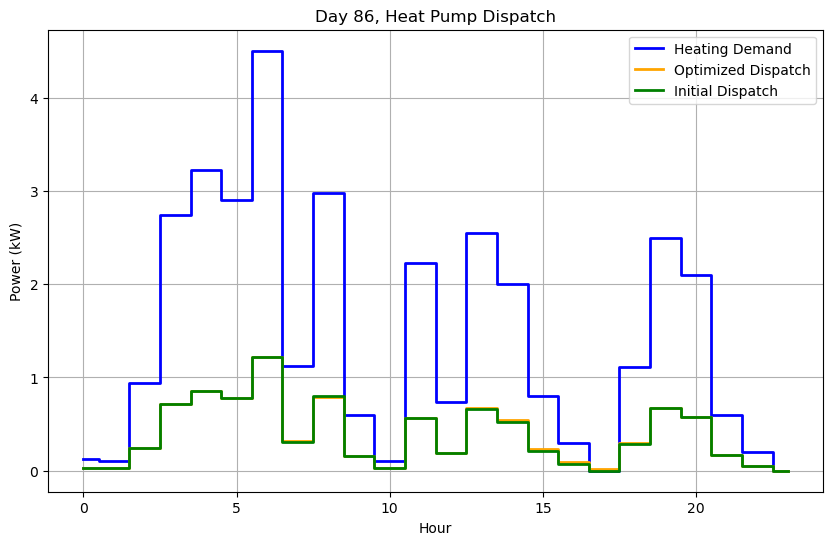


Day 87/365
Initial Guess Cost: €2.82
Optimized Daily Cost: €2.74
Total Heat Consumed (Qconsumption): 35.10 kWh
Total Heat Produced (Qproduction): 35.24 kWh
Buffer Tank Temperature at End of Day: 31.68°C
Optimized Dispatch: [6.55488308e-02 1.98164541e-01 5.66120297e-06 3.84296639e-01
 2.49645180e-01 3.56442684e-01 2.41442134e-01 3.62050193e-01
 2.70233886e-01 8.70779030e-03 2.41430735e-15 2.68013535e-15
 2.32738394e-15 2.41238277e-15 1.51890465e-01 4.11828549e-02
 6.24182607e-02 3.23616922e-02 1.96808526e-01 2.26488615e-01
 1.76143251e-01 1.47734595e-01 1.73248301e-02 2.47122355e-15]


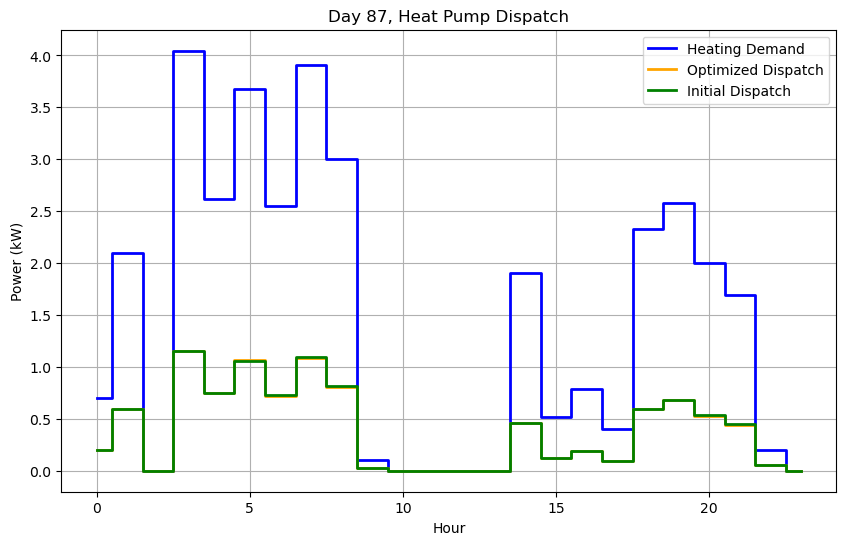


Day 88/365
Initial Guess Cost: €1.35
Optimized Daily Cost: €1.29
Total Heat Consumed (Qconsumption): 19.70 kWh
Total Heat Produced (Qproduction): 18.55 kWh
Buffer Tank Temperature at End of Day: 29.78°C
Optimized Dispatch: [1.69978718e-04 2.02967492e-04 1.87996538e-04 1.24600926e-01
 3.06456896e-01 2.01818203e-01 1.18675898e-01 2.11488249e-01
 2.99321188e-02 7.15616109e-03 6.96242836e-03 1.41073902e-02
 6.99006331e-03 6.77301999e-03 6.75440413e-03 1.12320199e-04
 2.00421506e-02 6.83085442e-03 1.78984667e-01 7.00647765e-03
 2.11986167e-01 1.43489559e-02 7.31391783e-03 1.45867541e-02]


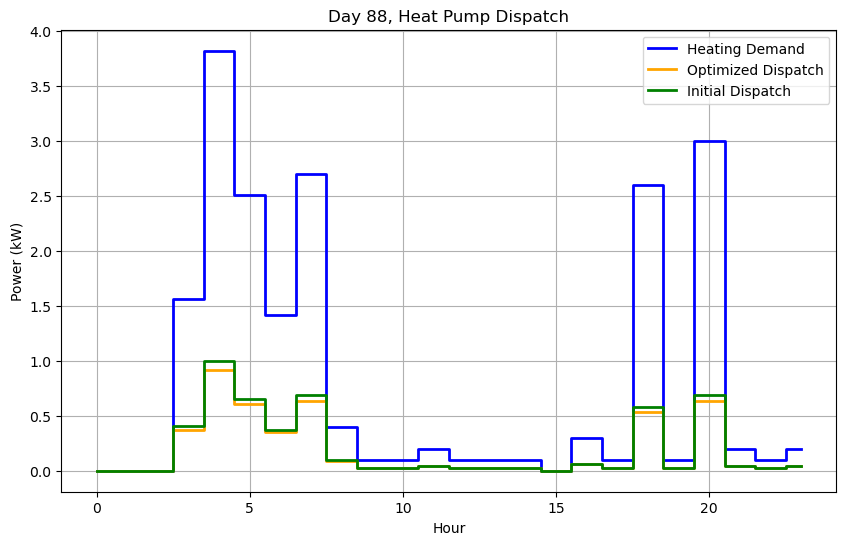


Day 89/365
Initial Guess Cost: €1.03
Optimized Daily Cost: €1.02
Total Heat Consumed (Qconsumption): 17.30 kWh
Total Heat Produced (Qproduction): 18.05 kWh
Buffer Tank Temperature at End of Day: 30.11°C
Optimized Dispatch: [7.78582772e-03 1.02951740e-02 2.70049182e-09 1.31081838e-01
 9.60102301e-02 2.96983072e-02 1.50613370e-01 2.24473567e-02
 7.46463007e-03 1.73355284e-01 2.15205821e-02 8.61929279e-03
 1.77567672e-02 1.47250569e-02 2.30494176e-02 1.57598840e-02
 1.74356677e-01 1.85216180e-02 1.24878999e-01 5.64150753e-02
 1.38202226e-01 5.69053194e-02 9.09954203e-03 3.99941163e-02]


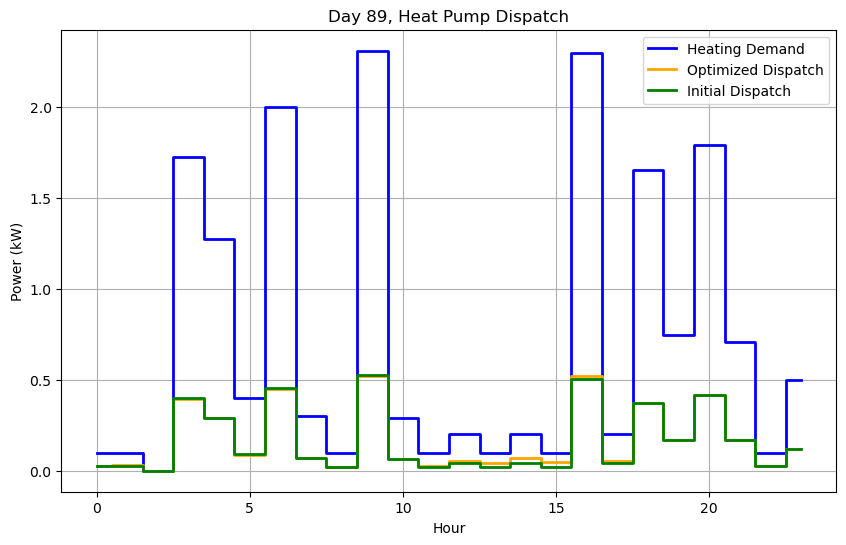


Day 90/365
Initial Guess Cost: €1.52
Optimized Daily Cost: €1.45
Total Heat Consumed (Qconsumption): 22.38 kWh
Total Heat Produced (Qproduction): 23.02 kWh
Buffer Tank Temperature at End of Day: 30.29°C
Optimized Dispatch: [0.0080164  0.02229338 0.00813263 0.00857436 0.1387495  0.21805425
 0.21574408 0.2170528  0.08246154 0.01529829 0.0073202  0.0074382
 0.01551316 0.05781426 0.08503487 0.0165061  0.01629967 0.14459475
 0.07696345 0.11971705 0.15914018 0.10631712 0.01753707 0.00786897]


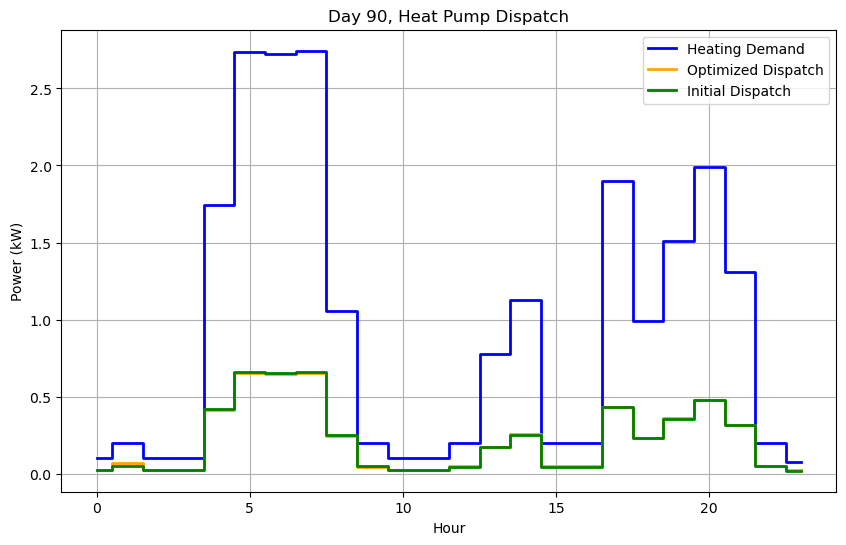


Day 91/365
Initial Guess Cost: €1.29
Optimized Daily Cost: €1.30
Total Heat Consumed (Qconsumption): 24.82 kWh
Total Heat Produced (Qproduction): 25.23 kWh
Buffer Tank Temperature at End of Day: 30.20°C
Optimized Dispatch: [0.01040417 0.0171281  0.00871279 0.00794704 0.13278035 0.16702115
 0.21149788 0.19360769 0.02006907 0.0152342  0.19503177 0.03762319
 0.01880213 0.16468207 0.02633513 0.01100744 0.17405344 0.0332016
 0.2138133  0.02362105 0.19168091 0.02086071 0.08352824 0.00804338]


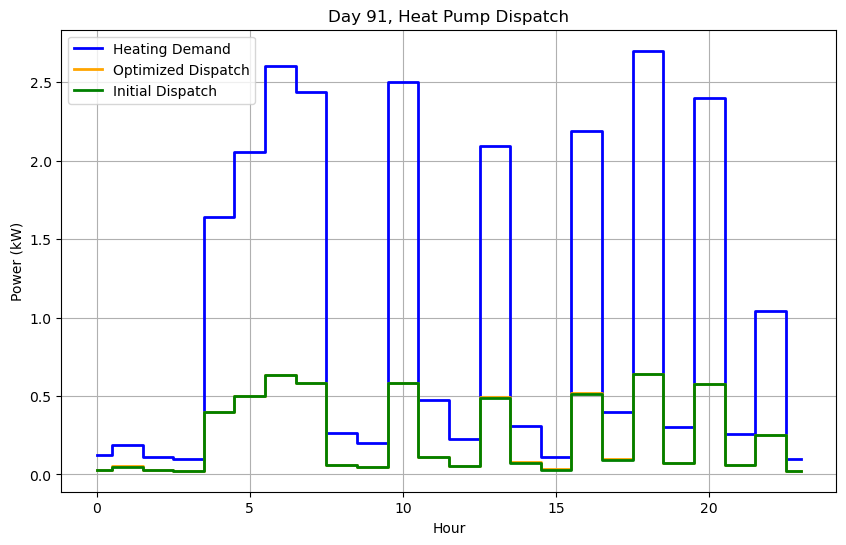


Day 92/365
Initial Guess Cost: €2.07
Optimized Daily Cost: €2.11
Total Heat Consumed (Qconsumption): 34.67 kWh
Total Heat Produced (Qproduction): 36.31 kWh
Buffer Tank Temperature at End of Day: 31.49°C
Optimized Dispatch: [0.01610351 0.00806503 0.00810096 0.14360955 0.19718985 0.16514131
 0.18844074 0.06975573 0.19160581 0.01658269 0.01731138 0.23290095
 0.11890307 0.09297117 0.22983794 0.05856098 0.21067553 0.11491719
 0.2929885  0.20767712 0.26353023 0.00565803 0.03553182 0.00660354]


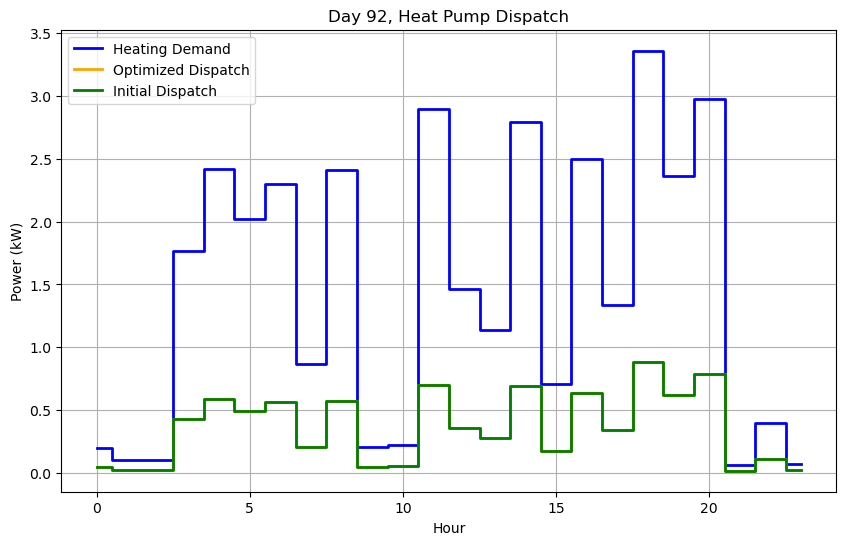


Day 93/365
Initial Guess Cost: €2.99
Optimized Daily Cost: €2.84
Total Heat Consumed (Qconsumption): 36.69 kWh
Total Heat Produced (Qproduction): 38.02 kWh
Buffer Tank Temperature at End of Day: 32.36°C
Optimized Dispatch: [2.42077174e-01 2.64322280e-02 1.89518923e-01 2.50127646e-01
 3.99738970e-01 3.38205900e-01 1.15288269e-01 3.05724963e-01
 3.66982309e-02 3.00676764e-08 8.84288156e-02 1.31290104e-01
 3.72961418e-02 1.23605899e-01 1.17708089e-01 4.86906868e-02
 1.69750258e-01 1.68008144e-01 6.51293319e-02 1.58282181e-01
 1.81074689e-01 3.96242996e-02 1.27306946e-07 3.78086781e-02]


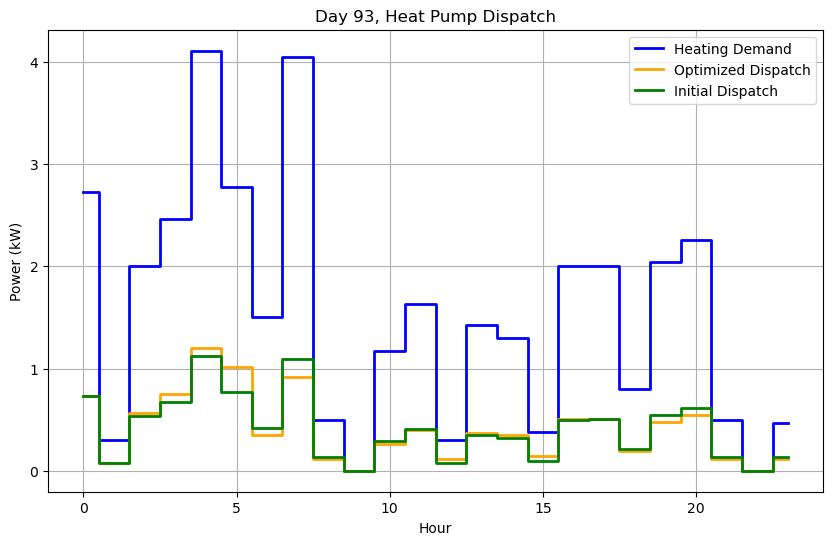


Day 94/365
Initial Guess Cost: €3.73
Optimized Daily Cost: €3.66
Total Heat Consumed (Qconsumption): 45.11 kWh
Total Heat Produced (Qproduction): 45.65 kWh
Buffer Tank Temperature at End of Day: 32.29°C
Optimized Dispatch: [0.41258929 0.45074467 0.24220556 0.43600235 0.62689682 0.22861451
 0.28607612 0.04680025 0.02699933 0.22440818 0.01766511 0.05588582
 0.20226764 0.03560951 0.1440124  0.07796671 0.01933822 0.17180611
 0.17147093 0.0748532  0.20945486 0.01094712 0.01145951 0.01913797]


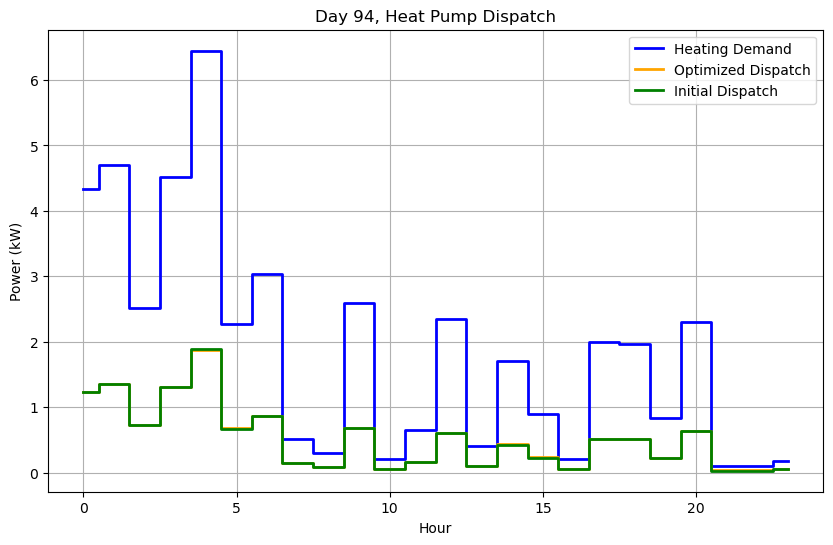


Day 95/365
Initial Guess Cost: €3.57
Optimized Daily Cost: €3.39
Total Heat Consumed (Qconsumption): 39.92 kWh
Total Heat Produced (Qproduction): 40.18 kWh
Buffer Tank Temperature at End of Day: 31.91°C
Optimized Dispatch: [1.43333979e-01 3.81574067e-01 2.60825510e-01 3.95580943e-01
 6.28236096e-01 4.57891860e-01 1.94882637e-01 9.62223025e-02
 2.22747379e-01 3.67160557e-06 2.44948990e-05 7.63667186e-03
 7.75605905e-03 7.32480988e-02 1.43253065e-01 2.27782680e-02
 7.74998010e-03 1.00135899e-01 1.03882290e-01 1.97175802e-01
 2.02915722e-01 8.66407652e-03 3.94876699e-05 3.84257742e-05]


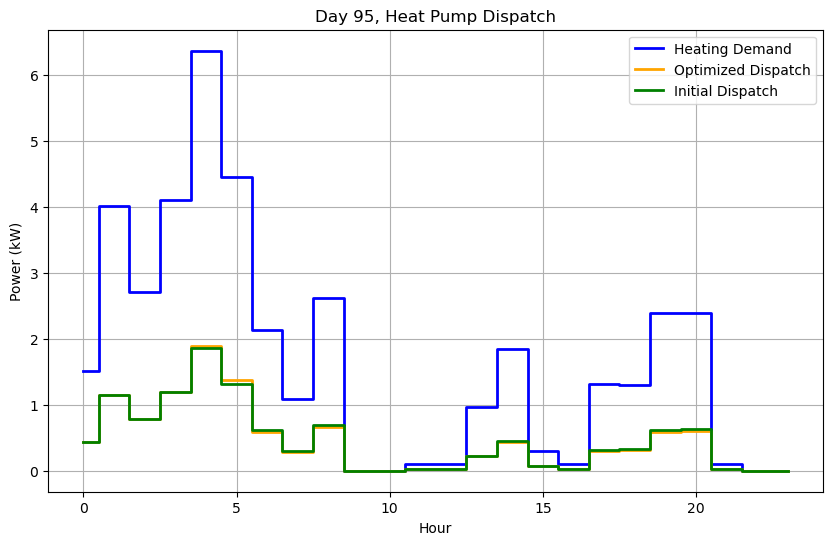


Day 96/365
Initial Guess Cost: €1.42
Optimized Daily Cost: €1.34
Total Heat Consumed (Qconsumption): 15.80 kWh
Total Heat Produced (Qproduction): 16.49 kWh
Buffer Tank Temperature at End of Day: 32.02°C
Optimized Dispatch: [3.73029449e-06 1.89172705e-01 5.45602500e-02 1.92422927e-01
 3.60612395e-01 2.84474165e-01 2.95663841e-01 3.54363626e-02
 3.67172397e-15 3.36107825e-15 9.55801419e-03 1.39796959e-02
 3.06921061e-15 7.59797261e-03 7.59733201e-03 3.11620349e-15
 7.63092600e-03 3.41758311e-14 7.93834854e-03 8.77807795e-14
 3.53633004e-15 8.45088424e-03 3.19965250e-15 8.46004095e-03]


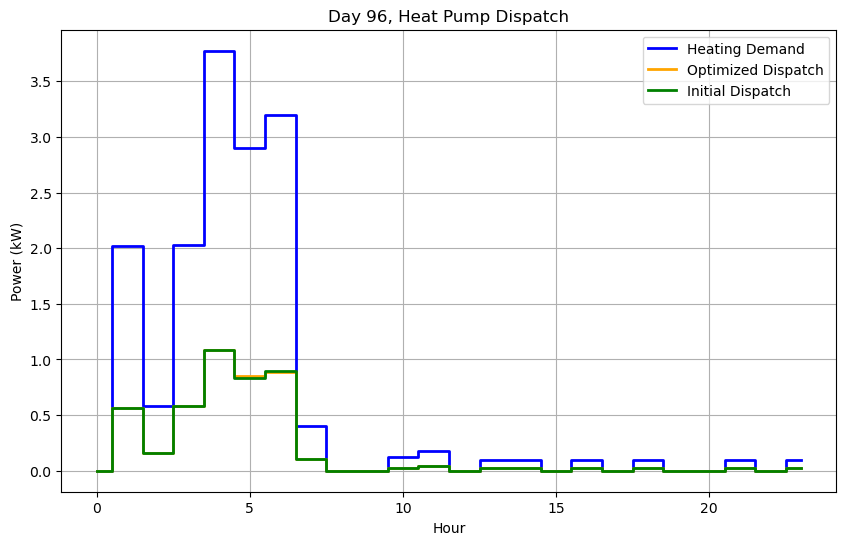


Day 97/365
Initial Guess Cost: €0.62
Optimized Daily Cost: €0.57
Total Heat Consumed (Qconsumption): 8.78 kWh
Total Heat Produced (Qproduction): 8.32 kWh
Buffer Tank Temperature at End of Day: 30.86°C
Optimized Dispatch: [5.89034054e-11 5.26165735e-03 5.25958452e-03 5.92620108e-11
 5.93336329e-11 1.66974378e-01 7.73440415e-03 5.18338024e-03
 4.53212935e-06 5.03054912e-03 2.91116957e-03 1.33226264e-02
 2.85216898e-02 5.40237660e-02 5.09211235e-02 2.68209393e-02
 1.38891621e-02 5.43657455e-03 5.67556779e-06 1.20269978e-08
 2.50388850e-08 7.12553393e-02 1.70911135e-01 9.47909553e-03]


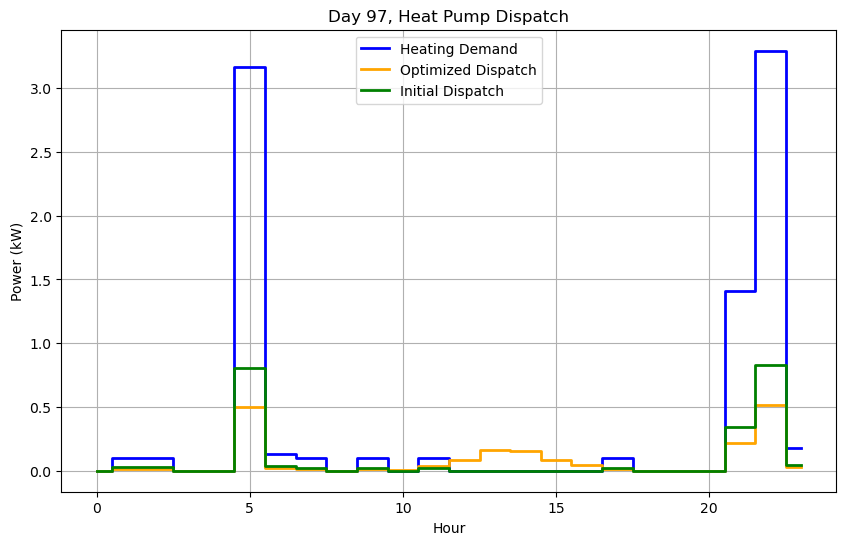


Day 98/365
Initial Guess Cost: €2.80
Optimized Daily Cost: €2.79
Total Heat Consumed (Qconsumption): 38.70 kWh
Total Heat Produced (Qproduction): 39.16 kWh
Buffer Tank Temperature at End of Day: 30.78°C
Optimized Dispatch: [3.12319527e-01 5.23339075e-02 1.56922757e-02 2.07832561e-12
 5.58570723e-01 3.85810617e-01 3.62697898e-01 3.28593451e-02
 8.07731654e-03 2.61726383e-01 5.05731771e-02 1.63267963e-02
 6.46400339e-04 1.86982164e-01 3.28316169e-02 6.37673804e-02
 1.33729935e-01 2.64361496e-02 1.86412045e-01 5.52533765e-02
 2.72149955e-01 1.39225666e-01 1.00703845e-01 1.48306427e-02]


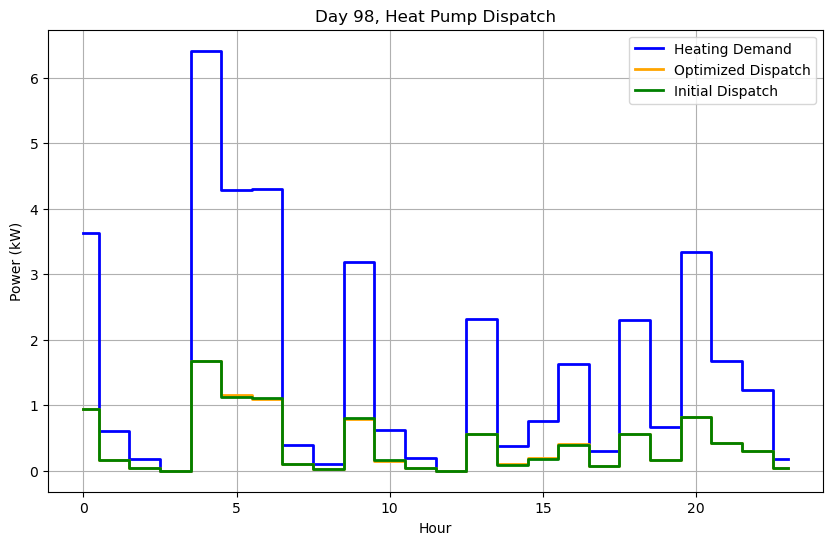


Day 99/365
Initial Guess Cost: €1.74
Optimized Daily Cost: €1.51
Total Heat Consumed (Qconsumption): 20.80 kWh
Total Heat Produced (Qproduction): 21.53 kWh
Buffer Tank Temperature at End of Day: 30.97°C
Optimized Dispatch: [9.64237374e-03 1.19660613e-14 8.14478614e-03 1.37844146e-01
 5.96965082e-01 4.64026837e-01 3.46436416e-02 6.74424371e-03
 6.33391007e-11 5.58812923e-11 6.51087567e-03 1.53460100e-03
 2.17350727e-03 3.92768305e-03 1.03241713e-02 4.35525514e-03
 3.31196167e-03 1.51727732e-01 1.32730358e-02 1.76448966e-01
 5.50847872e-02 6.61193132e-02 1.48285197e-02 6.72479142e-03]


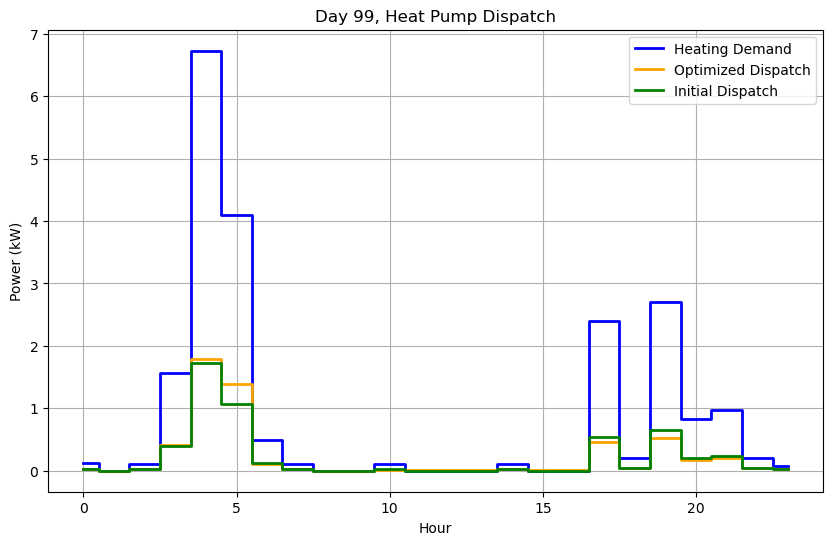


Day 100/365
Initial Guess Cost: €1.69
Optimized Daily Cost: €1.68
Total Heat Consumed (Qconsumption): 34.70 kWh
Total Heat Produced (Qproduction): 34.63 kWh
Buffer Tank Temperature at End of Day: 30.29°C
Optimized Dispatch: [1.95597423e-03 2.15492391e-06 1.72079651e-01 3.14498948e-01
 4.09607427e-01 2.66514994e-01 2.73622181e-01 8.12215652e-03
 7.82757666e-03 7.60013380e-03 2.38440641e-16 9.19458460e-03
 5.21644437e-01 2.62096088e-01 1.95964045e-01 5.27991908e-02
 1.28372920e-01 6.22747670e-02 2.22334509e-02 7.62187260e-03
 1.53679256e-02 7.74811706e-03 1.72749426e-16 1.38760323e-02]


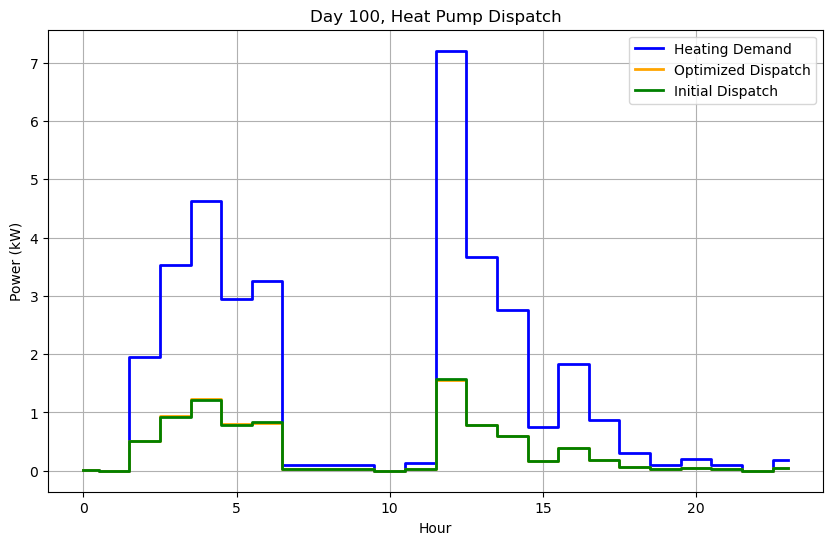


Day 101/365
Initial Guess Cost: €1.71
Optimized Daily Cost: €1.13
Total Heat Consumed (Qconsumption): 26.80 kWh
Total Heat Produced (Qproduction): 28.69 kWh
Buffer Tank Temperature at End of Day: 31.70°C
Optimized Dispatch: [1.62699838e-16 3.14230521e-03 1.56923020e-02 1.12923673e-01
 9.23695598e-01 2.76581640e-16 7.79691965e-16 8.26497798e-02
 2.91441804e-16 9.37015376e-16 3.42879568e-16 1.83511568e-16
 3.22441368e-16 4.78747279e-03 1.93651662e-01 8.94450639e-01
 2.25321890e-02 1.36994429e-15 1.04218529e-15 8.57909716e-16
 1.02548555e-15 4.94896527e-16 6.81520125e-17 1.44223890e-16]


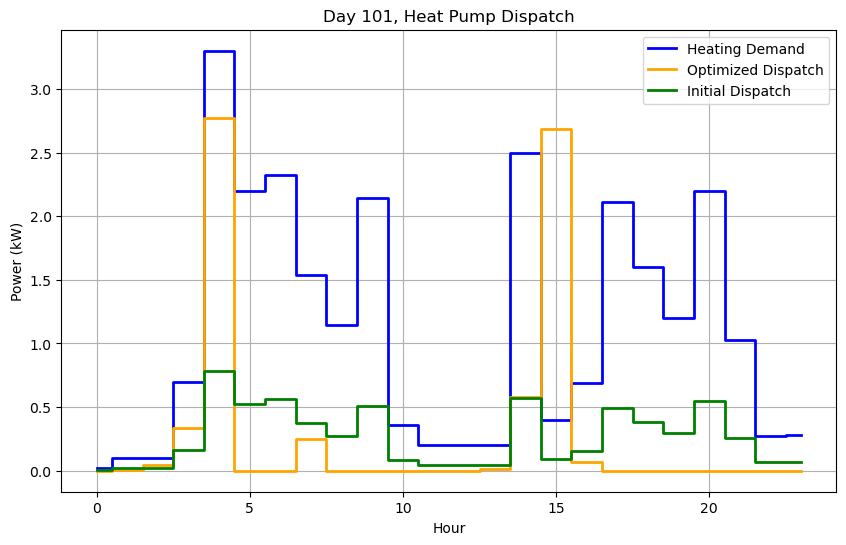


Day 102/365
Initial Guess Cost: €1.66
Optimized Daily Cost: €1.57
Total Heat Consumed (Qconsumption): 25.60 kWh
Total Heat Produced (Qproduction): 25.04 kWh
Buffer Tank Temperature at End of Day: 30.43°C
Optimized Dispatch: [9.75021688e-14 4.75215986e-03 3.07188005e-02 3.37576356e-01
 2.42878078e-01 2.22979837e-01 1.72877203e-01 2.24769170e-02
 1.56862929e-03 1.78699282e-01 4.38833663e-03 6.44970305e-14
 1.19933371e-13 2.73066432e-02 9.97571972e-02 2.75873202e-01
 2.24991084e-01 8.14657048e-02 3.12814930e-13 1.87694269e-12
 5.88119139e-04 1.66983044e-02 2.38703346e-02 1.24987335e-02]


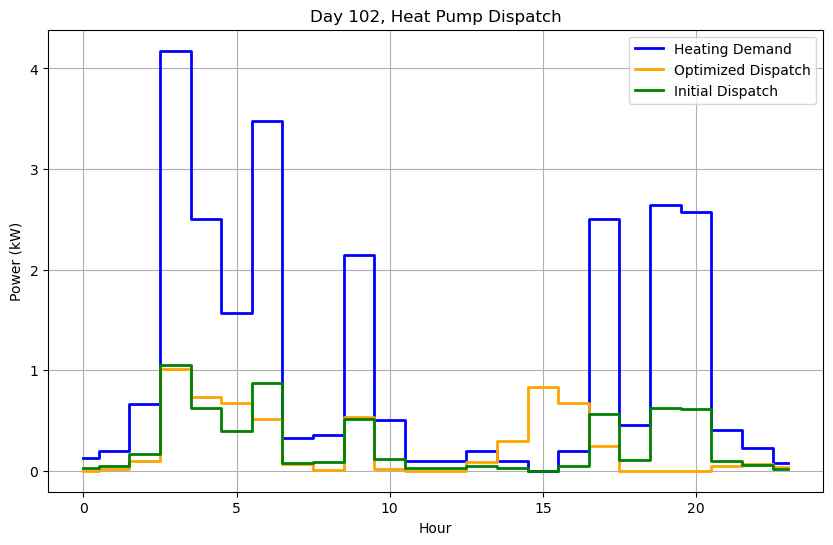


Day 103/365
Initial Guess Cost: €2.19
Optimized Daily Cost: €2.14
Total Heat Consumed (Qconsumption): 31.22 kWh
Total Heat Produced (Qproduction): 32.34 kWh
Buffer Tank Temperature at End of Day: 31.11°C
Optimized Dispatch: [0.01019291 0.0165791  0.00834977 0.36470324 0.22924141 0.09961422
 0.185757   0.22688286 0.02426746 0.01582816 0.01117734 0.1418413
 0.04283801 0.01223447 0.28922917 0.04443139 0.11052076 0.1269286
 0.15529646 0.17345539 0.24639982 0.01815935 0.0104011  0.01048818]


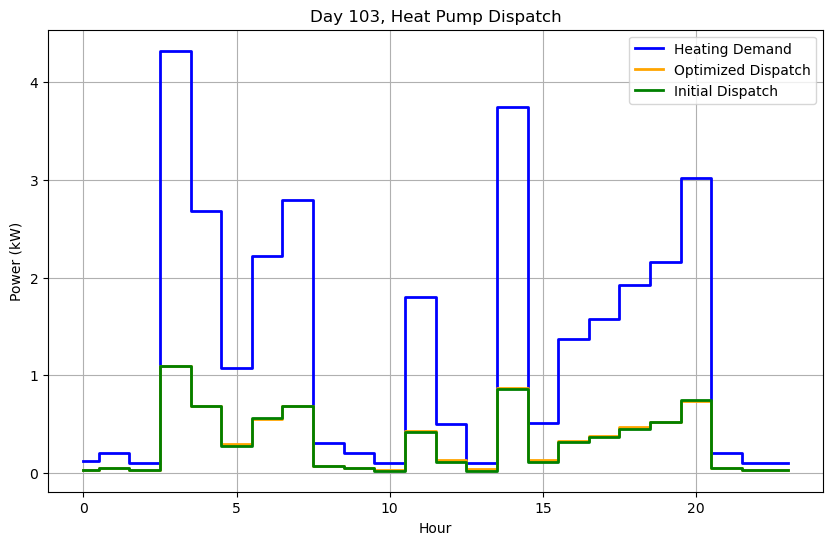


Day 104/365
Initial Guess Cost: €1.84
Optimized Daily Cost: €1.80
Total Heat Consumed (Qconsumption): 24.48 kWh
Total Heat Produced (Qproduction): 24.54 kWh
Buffer Tank Temperature at End of Day: 30.59°C
Optimized Dispatch: [0.01130208 0.02008424 0.01550099 0.18412174 0.181278   0.23012663
 0.29242526 0.20133043 0.02160208 0.00699837 0.00682359 0.02077908
 0.01358486 0.01800509 0.01849484 0.06294426 0.09871943 0.01656135
 0.18483247 0.14128436 0.13803402 0.07420954 0.01509395 0.01389991]


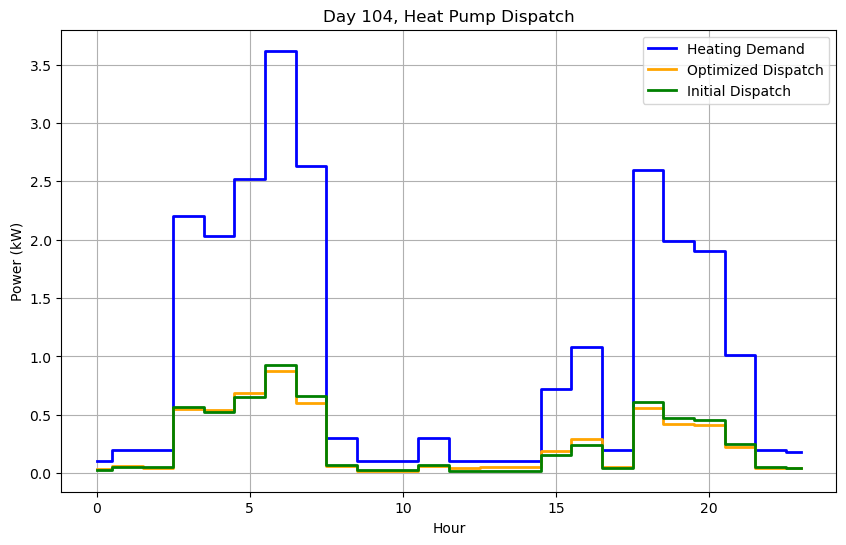


Day 105/365
Initial Guess Cost: €2.34
Optimized Daily Cost: €2.28
Total Heat Consumed (Qconsumption): 33.20 kWh
Total Heat Produced (Qproduction): 33.75 kWh
Buffer Tank Temperature at End of Day: 30.61°C
Optimized Dispatch: [0.01021232 0.00832455 0.0082794  0.01662805 0.34539103 0.27480902
 0.19751561 0.10413568 0.14103603 0.01146633 0.01000544 0.09752219
 0.21296968 0.02251114 0.20292324 0.0682706  0.17573865 0.08734907
 0.1292267  0.18902899 0.22582925 0.11336531 0.00403346 0.00583921]


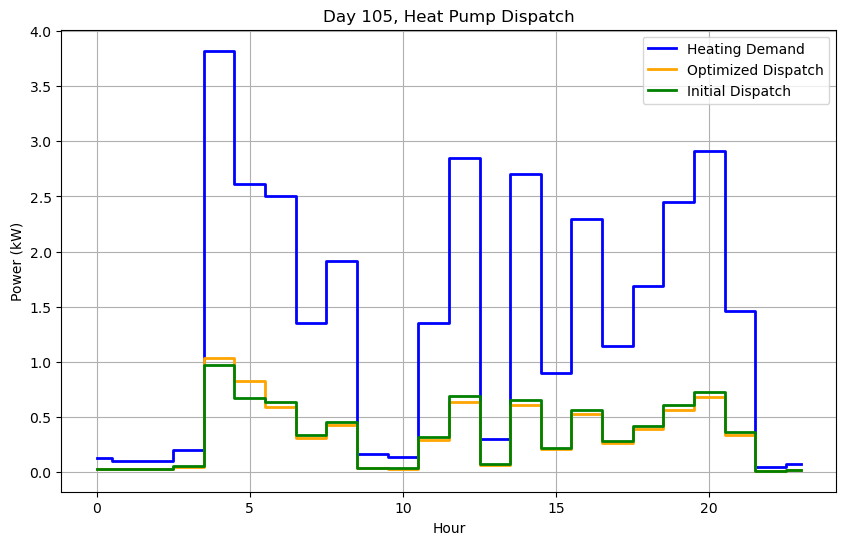


Day 106/365
Initial Guess Cost: €1.42
Optimized Daily Cost: €1.42
Total Heat Consumed (Qconsumption): 21.48 kWh
Total Heat Produced (Qproduction): 21.70 kWh
Buffer Tank Temperature at End of Day: 30.30°C
Optimized Dispatch: [0.00986363 0.00793142 0.00790658 0.13363351 0.11338056 0.12855328
 0.09920048 0.09414331 0.032622   0.29752743 0.03101838 0.1733434
 0.03270379 0.01166453 0.01461676 0.014841   0.02145358 0.19633186
 0.01783145 0.01561131 0.09006658 0.0921313  0.09685488 0.01332149]


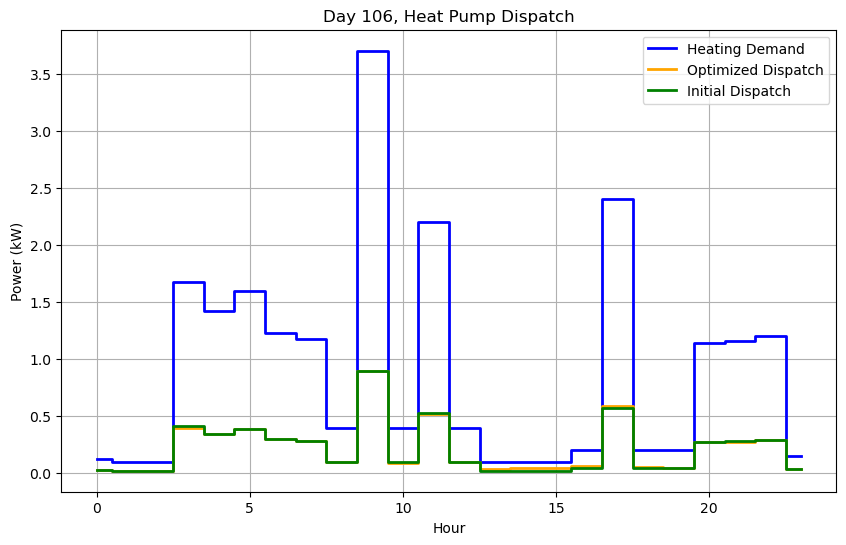


Day 107/365
Initial Guess Cost: €1.41
Optimized Daily Cost: €1.38
Total Heat Consumed (Qconsumption): 18.72 kWh
Total Heat Produced (Qproduction): 19.40 kWh
Buffer Tank Temperature at End of Day: 30.50°C
Optimized Dispatch: [1.16550645e-02 3.03253009e-16 1.62560543e-02 1.38440716e-01
 1.00346203e-01 2.71246298e-01 1.67780722e-02 1.74172749e-01
 1.25718383e-01 1.55435093e-02 8.45829511e-02 8.68955219e-03
 9.96061097e-03 1.04596517e-02 1.83828874e-02 3.60740089e-03
 1.10276834e-02 1.56032598e-01 1.76772580e-02 1.70671885e-01
 4.84278767e-02 9.80159308e-02 2.27373246e-02 1.51956628e-02]


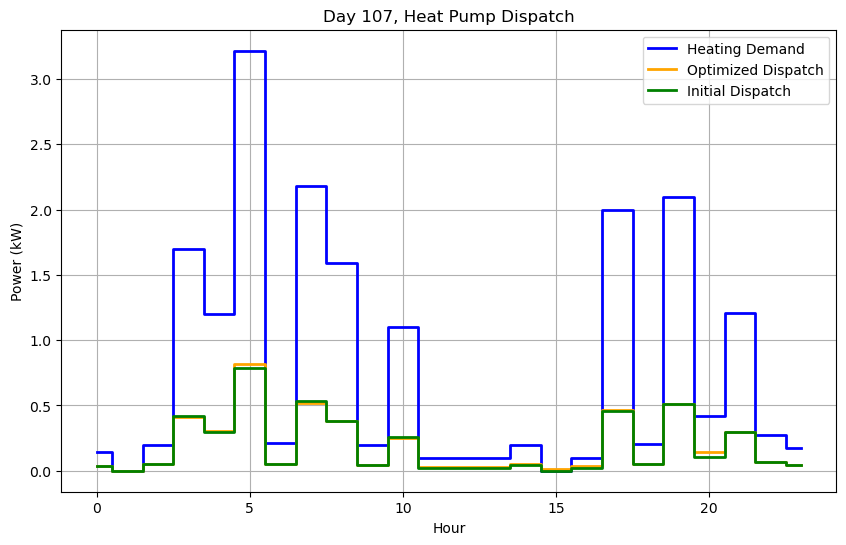


Day 108/365
Initial Guess Cost: €1.46
Optimized Daily Cost: €1.35
Total Heat Consumed (Qconsumption): 19.70 kWh
Total Heat Produced (Qproduction): 20.01 kWh
Buffer Tank Temperature at End of Day: 30.27°C
Optimized Dispatch: [1.00923039e-02 8.28496583e-03 1.67860020e-02 1.58662559e-01
 2.90681509e-01 2.01448227e-01 2.20739145e-01 3.64043405e-02
 3.16878121e-02 7.56189258e-03 7.39764731e-03 7.33885746e-03
 1.46723488e-02 7.35873238e-03 1.07638849e-11 1.48183585e-02
 1.07690881e-11 6.85628000e-02 1.85253543e-01 5.48170987e-02
 2.22000512e-01 1.59826757e-02 8.02124024e-03 1.43181251e-02]


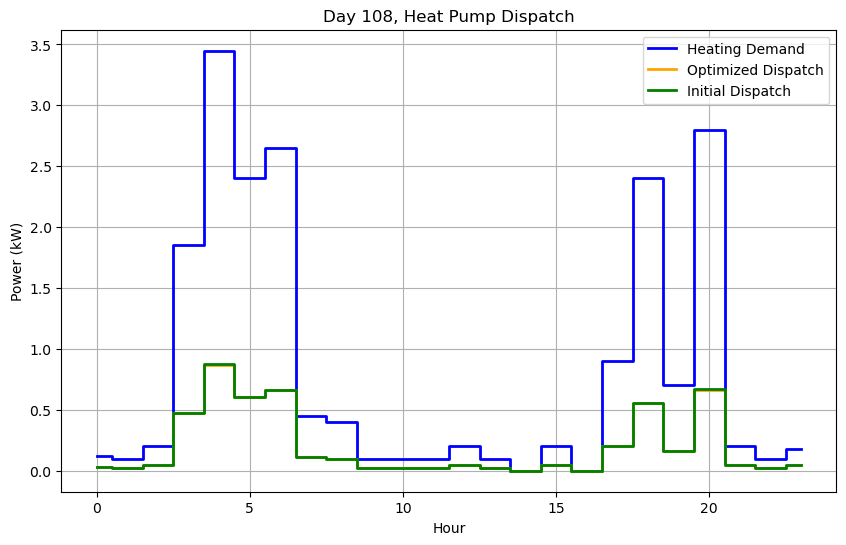


Day 109/365
Initial Guess Cost: €1.61
Optimized Daily Cost: €1.60
Total Heat Consumed (Qconsumption): 24.10 kWh
Total Heat Produced (Qproduction): 25.57 kWh
Buffer Tank Temperature at End of Day: 31.35°C
Optimized Dispatch: [0.00986444 0.00819679 0.00837167 0.24226124 0.33278015 0.31154726
 0.03715157 0.01079618 0.0155613  0.01548793 0.20733681 0.18074026
 0.09767531 0.03079328 0.02958516 0.01521047 0.03641058 0.0138458
 0.19366098 0.05880739 0.1563396  0.01733906 0.00896303 0.01583932]


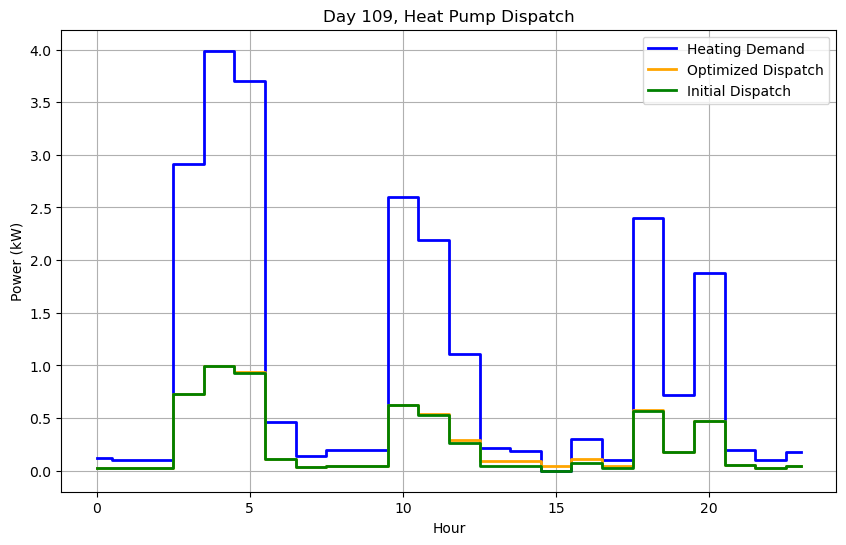


Day 110/365
Initial Guess Cost: €1.94
Optimized Daily Cost: €1.92
Total Heat Consumed (Qconsumption): 26.52 kWh
Total Heat Produced (Qproduction): 26.92 kWh
Buffer Tank Temperature at End of Day: 31.17°C
Optimized Dispatch: [4.89474969e-02 1.77973909e-01 1.46708496e-07 2.23105787e-01
 4.26446229e-01 1.03779144e-01 2.37999630e-01 8.51911221e-03
 2.89918741e-01 8.17866330e-03 7.82753195e-03 1.52574311e-02
 7.80500846e-03 7.32152314e-02 1.08130635e-01 2.34353308e-02
 1.44649381e-02 2.33298523e-01 1.60833835e-02 1.94049983e-01
 3.14543506e-02 1.61072972e-02 8.15990381e-03 8.18429654e-03]


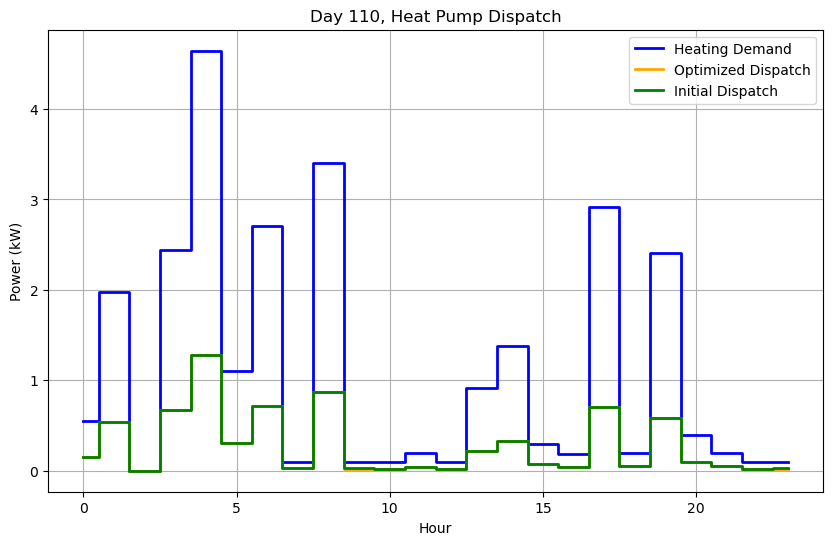


Day 111/365
Initial Guess Cost: €0.95
Optimized Daily Cost: €0.88
Total Heat Consumed (Qconsumption): 14.78 kWh
Total Heat Produced (Qproduction): 13.80 kWh
Buffer Tank Temperature at End of Day: 29.50°C
Optimized Dispatch: [2.83213628e-02 8.30766349e-03 9.03271326e-03 8.11545975e-03
 2.12196888e-01 3.31235001e-01 2.15102883e-02 2.14373480e-01
 2.24885999e-02 6.21543448e-03 6.12885824e-03 5.96195229e-03
 7.69704945e-03 1.10873634e-02 3.13521051e-02 1.55282285e-02
 5.67692321e-03 2.38732733e-06 5.73347789e-03 5.39032232e-02
 6.96808290e-02 1.88491478e-02 6.33891229e-03 4.84437103e-03]


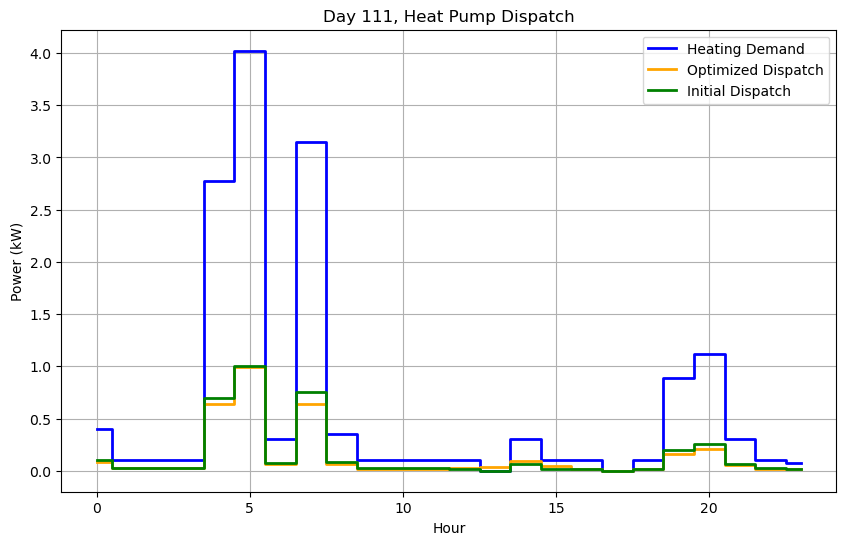


Day 112/365
Initial Guess Cost: €0.41
Optimized Daily Cost: €0.39
Total Heat Consumed (Qconsumption): 6.10 kWh
Total Heat Produced (Qproduction): 6.45 kWh
Buffer Tank Temperature at End of Day: 29.37°C
Optimized Dispatch: [1.82075020e-03 7.70763962e-03 5.70863847e-07 7.76161003e-03
 1.38596252e-01 1.51795042e-01 3.62561754e-02 1.42052383e-02
 6.58950505e-16 5.51035460e-15 3.51024236e-15 6.06721525e-16
 6.09498783e-16 1.66965108e-15 1.00764532e-15 1.87563824e-15
 7.00706438e-16 3.64341246e-15 6.85730328e-15 6.87599955e-02
 6.97656507e-03 7.06317753e-03 1.42490991e-02 5.54744282e-03]


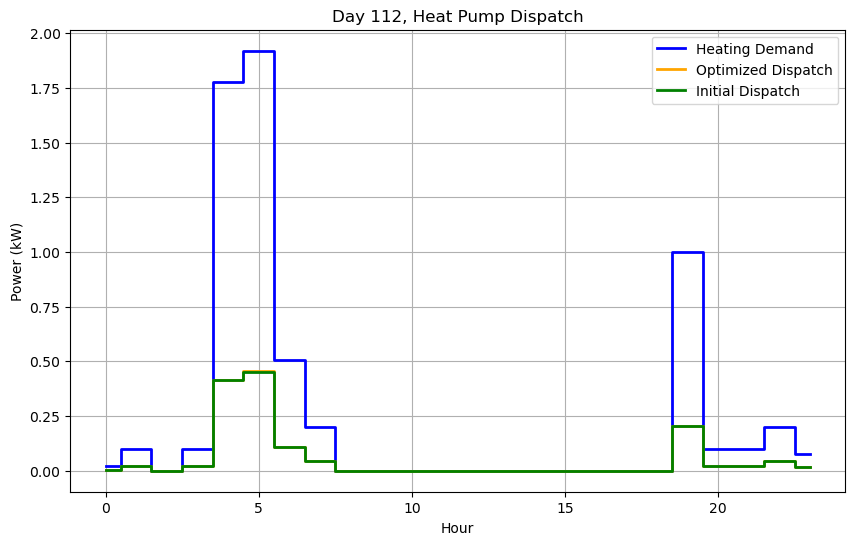


Day 113/365
Initial Guess Cost: €0.47
Optimized Daily Cost: €0.47
Total Heat Consumed (Qconsumption): 7.50 kWh
Total Heat Produced (Qproduction): 8.09 kWh
Buffer Tank Temperature at End of Day: 29.54°C
Optimized Dispatch: [0.00168455 0.00733769 0.00741353 0.12330942 0.05674157 0.02577864
 0.14275271 0.02233386 0.00730817 0.00714096 0.02103021 0.00850149
 0.00908023 0.00288192 0.00957416 0.00931342 0.00853789 0.00038283
 0.00703975 0.01460653 0.01513325 0.04583627 0.00803868 0.01367434]


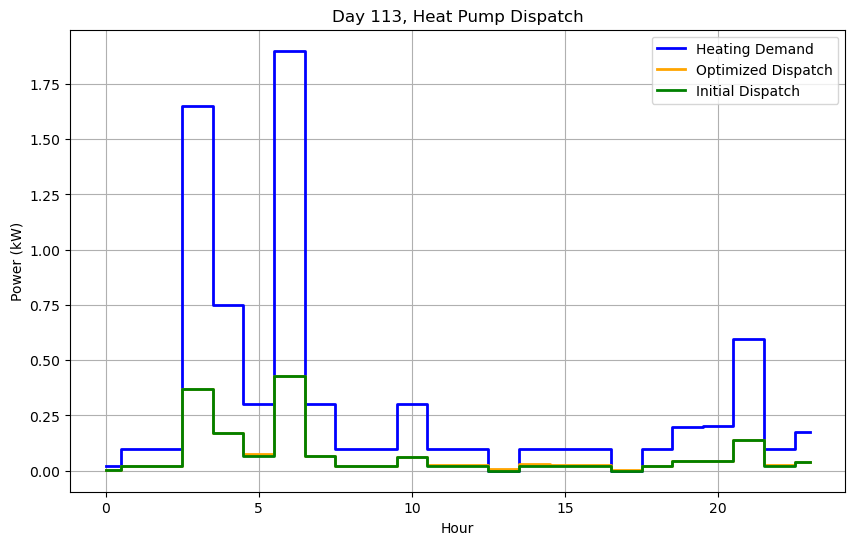


Day 114/365
Initial Guess Cost: €0.94
Optimized Daily Cost: €0.92
Total Heat Consumed (Qconsumption): 13.80 kWh
Total Heat Produced (Qproduction): 14.89 kWh
Buffer Tank Temperature at End of Day: 30.23°C
Optimized Dispatch: [0.00196457 0.00778896 0.00782423 0.12970215 0.12254685 0.18707052
 0.01708512 0.02397719 0.01628424 0.00920777 0.01020262 0.01044851
 0.01105699 0.00392756 0.14611986 0.01939544 0.01180211 0.01901424
 0.13463526 0.05017952 0.15591749 0.00797026 0.00797745 0.01404904]


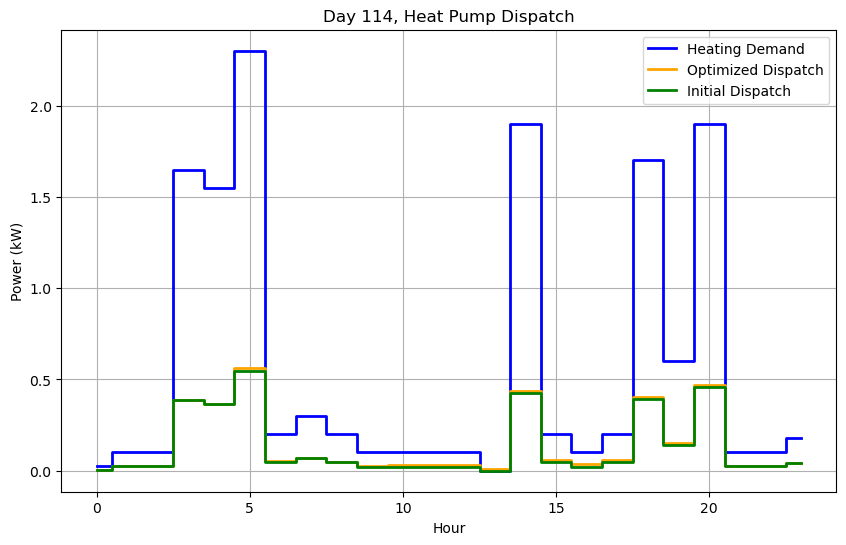


Day 115/365
Initial Guess Cost: €1.28
Optimized Daily Cost: €1.24
Total Heat Consumed (Qconsumption): 17.88 kWh
Total Heat Produced (Qproduction): 19.03 kWh
Buffer Tank Temperature at End of Day: 30.97°C
Optimized Dispatch: [1.87686115e-03 8.14479048e-03 5.10917356e-18 1.57878171e-01
 1.29828193e-01 1.89683100e-01 1.59600586e-02 2.38377427e-02
 1.11545754e-01 5.44090040e-02 9.08627876e-03 1.80449947e-02
 1.38530788e-02 1.36260275e-02 1.45910089e-02 1.47997790e-02
 1.75039711e-01 3.65335269e-02 2.00760496e-01 3.93626543e-02
 1.93010848e-01 3.25385911e-02 1.65355721e-02 1.31636770e-02]


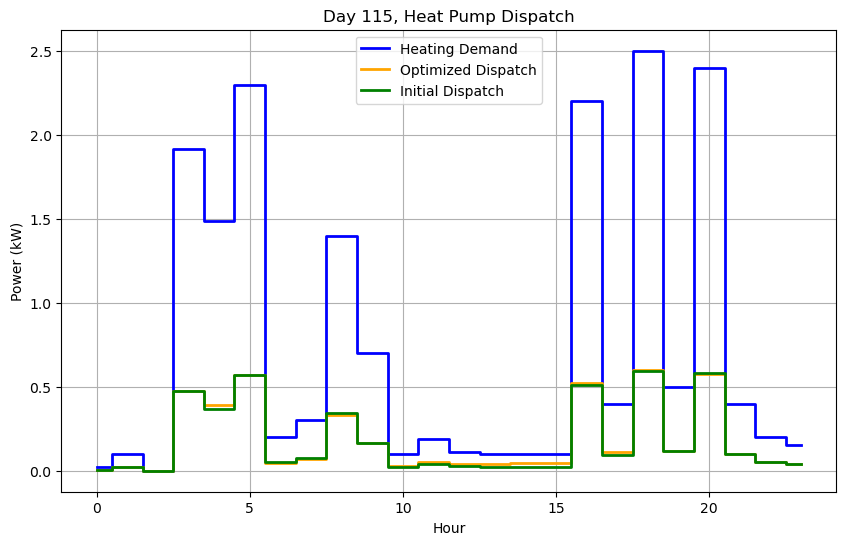


Day 116/365
Initial Guess Cost: €0.99
Optimized Daily Cost: €1.00
Total Heat Consumed (Qconsumption): 13.35 kWh
Total Heat Produced (Qproduction): 14.18 kWh
Buffer Tank Temperature at End of Day: 31.29°C
Optimized Dispatch: [1.26228068e-02 2.28795195e-01 3.57025809e-02 2.04107731e-01
 3.58111420e-01 3.10449394e-01 2.45055721e-02 1.61626474e-02
 1.94434820e-03 5.91114008e-03 3.74154533e-17 7.38473050e-15
 3.86138684e-17 4.47242291e-16 4.56588809e-16 3.84271024e-17
 3.80068789e-17 4.16280639e-17 4.32830181e-17 4.91952531e-17
 1.21468401e-16 3.63262908e-16 4.47927099e-17 3.99173572e-16]


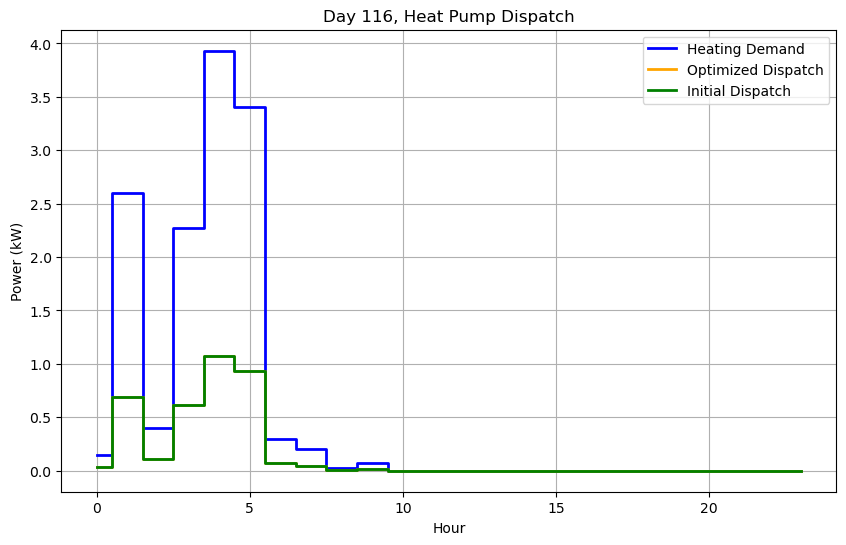


Day 117/365
Initial Guess Cost: €0.12
Optimized Daily Cost: €0.02
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.23 kWh
Buffer Tank Temperature at End of Day: 30.93°C
Optimized Dispatch: [3.48067843e-09 2.17542935e-07 3.31116074e-09 2.05295777e-07
 6.73778636e-03 3.04669070e-12 1.56910970e-12 1.56902784e-12
 1.57421211e-12 1.58407000e-11 1.56564588e-12 1.56286807e-12
 1.55147025e-12 1.56576682e-12 1.48980202e-11 1.56226669e-12
 1.51180687e-11 1.55562248e-11 1.68703822e-11 3.05392655e-12
 1.73927628e-10 1.72548136e-10 1.57051762e-12 1.55818635e-12]


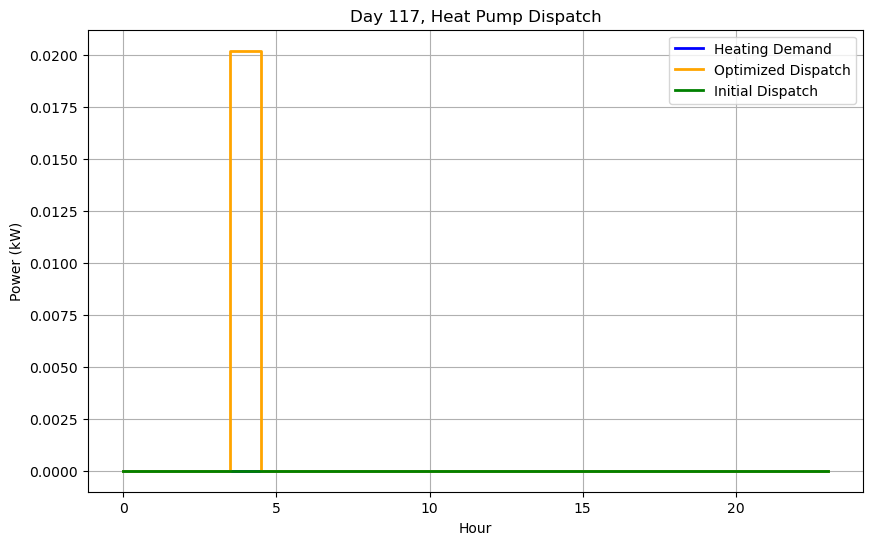


Day 118/365
Initial Guess Cost: €0.96
Optimized Daily Cost: €0.90
Total Heat Consumed (Qconsumption): 15.96 kWh
Total Heat Produced (Qproduction): 15.49 kWh
Buffer Tank Temperature at End of Day: 29.77°C
Optimized Dispatch: [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.00000000e+00 1.11267245e-12 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 6.73680566e-02 1.07371879e-02]


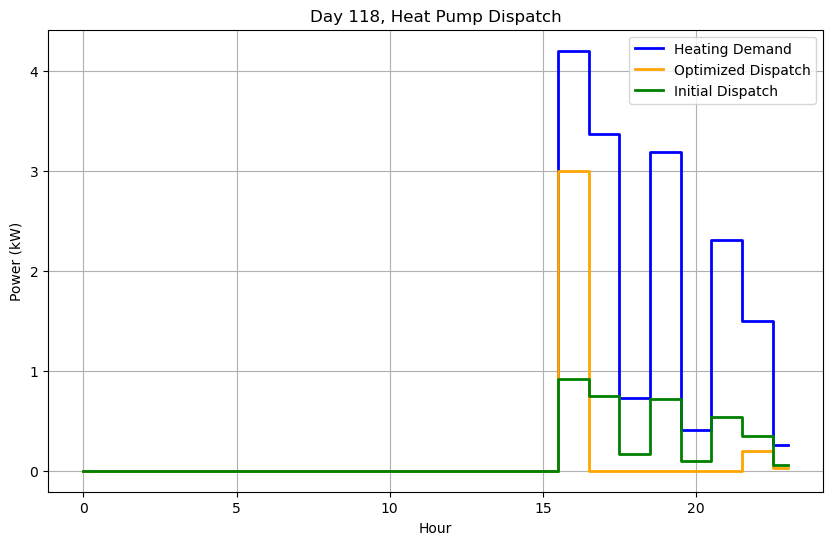


Day 119/365
Initial Guess Cost: €0.73
Optimized Daily Cost: €0.73
Total Heat Consumed (Qconsumption): 11.92 kWh
Total Heat Produced (Qproduction): 12.33 kWh
Buffer Tank Temperature at End of Day: 29.71°C
Optimized Dispatch: [1.07316014e-02 7.84709598e-17 2.93359668e-02 7.34583372e-03
 1.34230789e-01 5.72369758e-02 2.14228181e-02 7.03490881e-03
 7.07047429e-03 6.99870165e-03 6.89129574e-03 7.64751976e-03
 2.52210976e-02 1.35008380e-02 1.64167539e-02 1.61146959e-02
 1.22227008e-02 2.48242432e-01 1.00110002e-02 2.22347086e-01
 1.50777842e-02 2.24894619e-02 7.53927143e-03 1.38016590e-02]


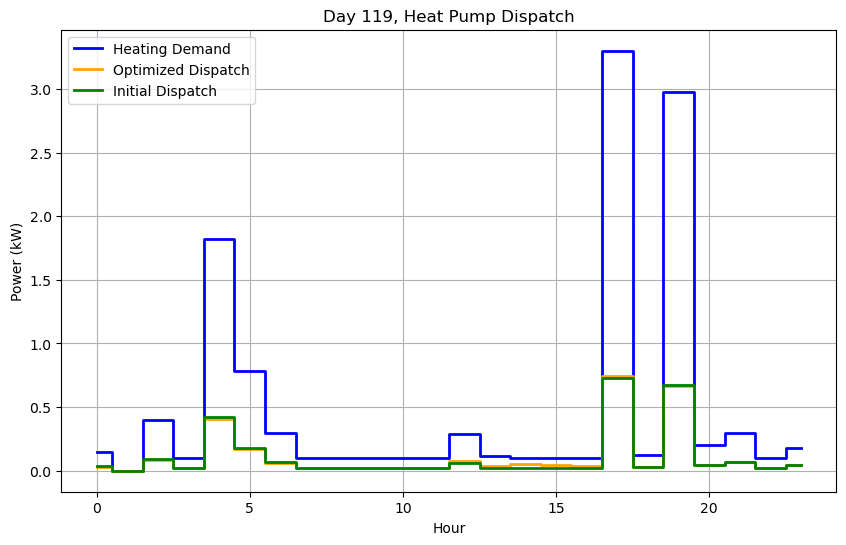


Day 120/365
Initial Guess Cost: €0.79
Optimized Daily Cost: €0.78
Total Heat Consumed (Qconsumption): 12.90 kWh
Total Heat Produced (Qproduction): 13.38 kWh
Buffer Tank Temperature at End of Day: 29.73°C
Optimized Dispatch: [9.71066854e-03 2.03796579e-05 7.94235534e-03 1.53620185e-01
 2.25711525e-01 2.87353829e-01 1.55701542e-02 7.47992296e-03
 7.53517746e-03 2.97579324e-02 8.07337561e-03 1.53365297e-02
 5.84518347e-03 3.79264375e-03 8.19559110e-03 8.22277098e-03
 1.28610253e-03 7.61788366e-03 6.32875178e-05 6.58262191e-02
 1.12467580e-01 1.51969249e-02 7.66567033e-03 6.16637772e-03]


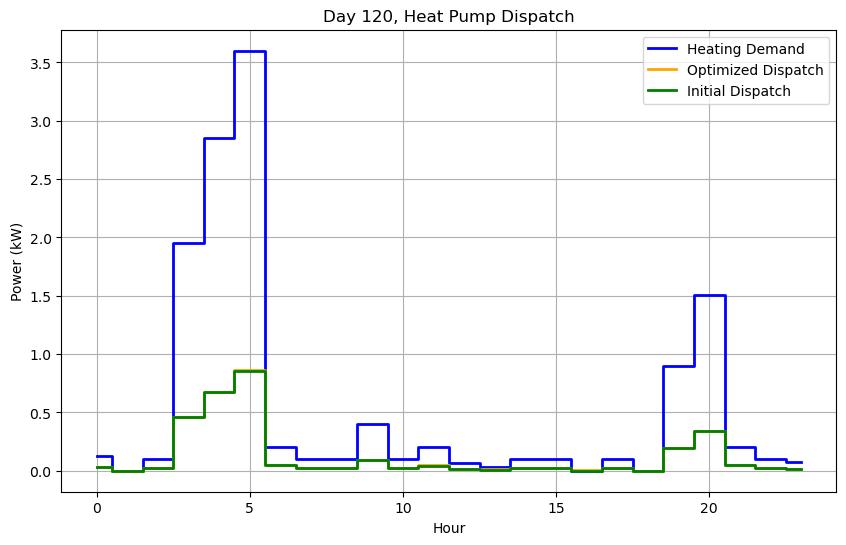


Day 121/365
Initial Guess Cost: €1.17
Optimized Daily Cost: €1.13
Total Heat Consumed (Qconsumption): 17.30 kWh
Total Heat Produced (Qproduction): 18.03 kWh
Buffer Tank Temperature at End of Day: 30.00°C
Optimized Dispatch: [0.00999717 0.00795154 0.00804431 0.14490672 0.27924862 0.25930781
 0.0159606  0.01551484 0.05865767 0.02505103 0.01507309 0.01500037
 0.0076315  0.00765546 0.00754686 0.00755834 0.00031605 0.00717164
 0.00235829 0.19257998 0.13399236 0.12160587 0.01576517 0.0138989 ]


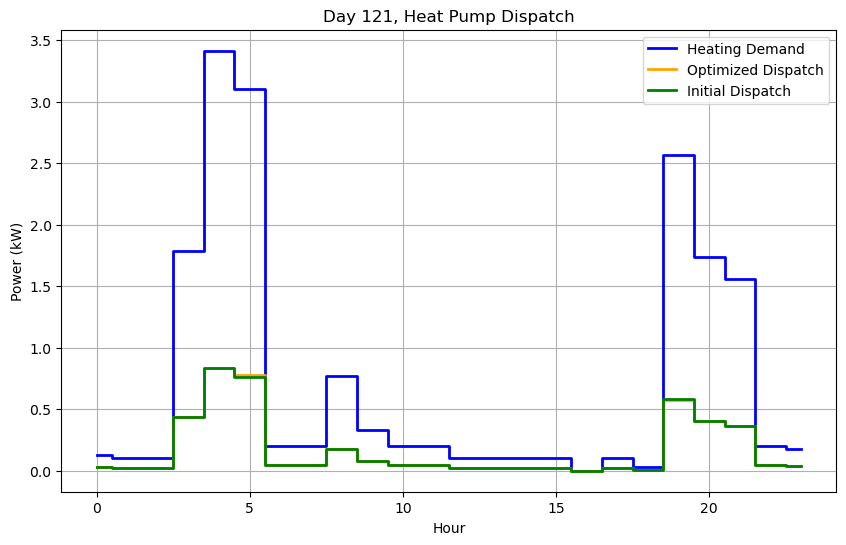


Day 122/365
Initial Guess Cost: €0.90
Optimized Daily Cost: €0.82
Total Heat Consumed (Qconsumption): 12.70 kWh
Total Heat Produced (Qproduction): 13.21 kWh
Buffer Tank Temperature at End of Day: 30.03°C
Optimized Dispatch: [0.00993496 0.00797305 0.00799165 0.15014764 0.19335822 0.27083997
 0.00776374 0.00771238 0.03043371 0.00738345 0.00780244 0.00823077
 0.00878758 0.0090936  0.00237207 0.02347501 0.00937641 0.00918795
 0.00144731 0.01317959 0.19730318 0.01562034 0.00841496 0.0067407 ]


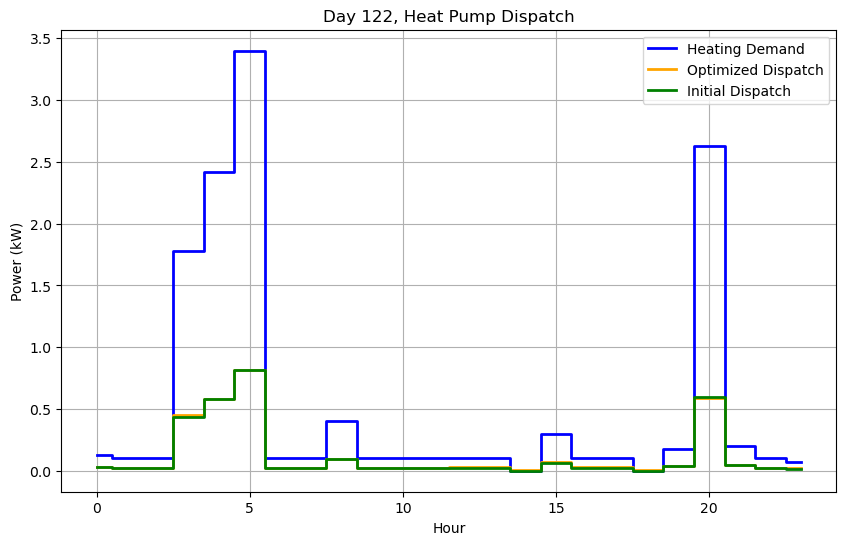


Day 123/365
Initial Guess Cost: €0.84
Optimized Daily Cost: €0.84
Total Heat Consumed (Qconsumption): 11.73 kWh
Total Heat Produced (Qproduction): 12.56 kWh
Buffer Tank Temperature at End of Day: 30.40°C
Optimized Dispatch: [1.01498265e-02 1.11512031e-07 8.81044955e-02 3.36834576e-01
 2.29853918e-01 2.04483037e-01 2.37238302e-02 1.54540533e-02
 7.67358427e-03 7.47760537e-03 1.44126036e-02 7.65123403e-15
 7.08905607e-03 7.01119132e-03 1.66927683e-15 6.99366047e-03
 1.40625739e-02 6.72824238e-15 7.31685497e-15 1.39002351e-14
 1.59062563e-14 1.36970798e-14 7.24318568e-15 7.07620637e-15]


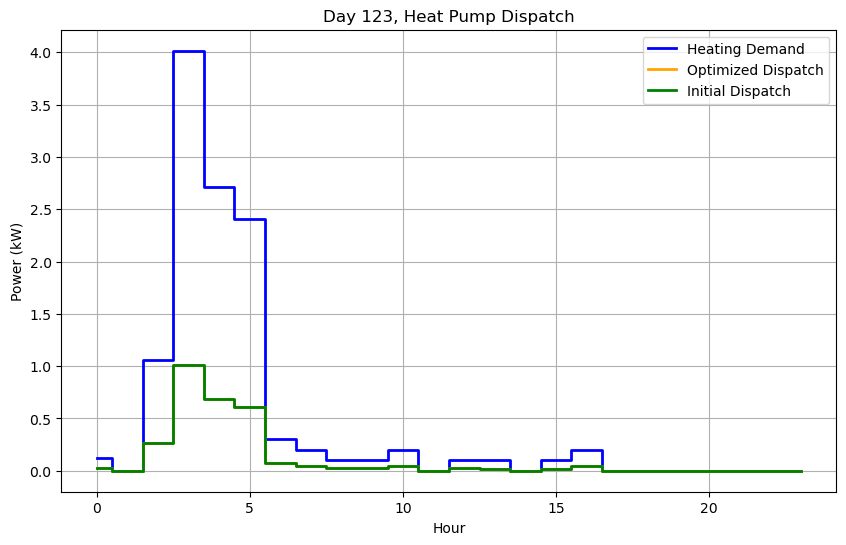


Day 124/365
Initial Guess Cost: €0.16
Optimized Daily Cost: €0.04
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.50 kWh
Buffer Tank Temperature at End of Day: 30.39°C
Optimized Dispatch: [7.01317540e-08 2.02667340e-06 1.21376211e-12 6.97831705e-03
 2.02974517e-02 3.50724619e-13 3.78511320e-13 4.55553527e-13
 3.60356673e-13 3.20283078e-13 3.84670188e-13 3.58348750e-13
 3.53988105e-13 3.65435328e-13 2.75540383e-13 3.25109268e-13
 3.76615894e-13 3.41549907e-13 3.77350509e-13 4.22196303e-13
 4.32015185e-13 3.96222836e-13 3.82466305e-13 3.90998034e-13]


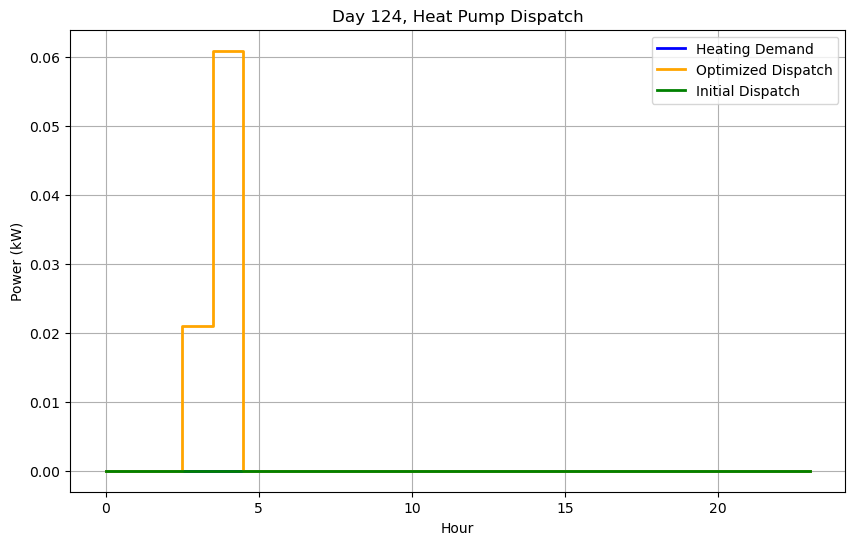


Day 125/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 29.83°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


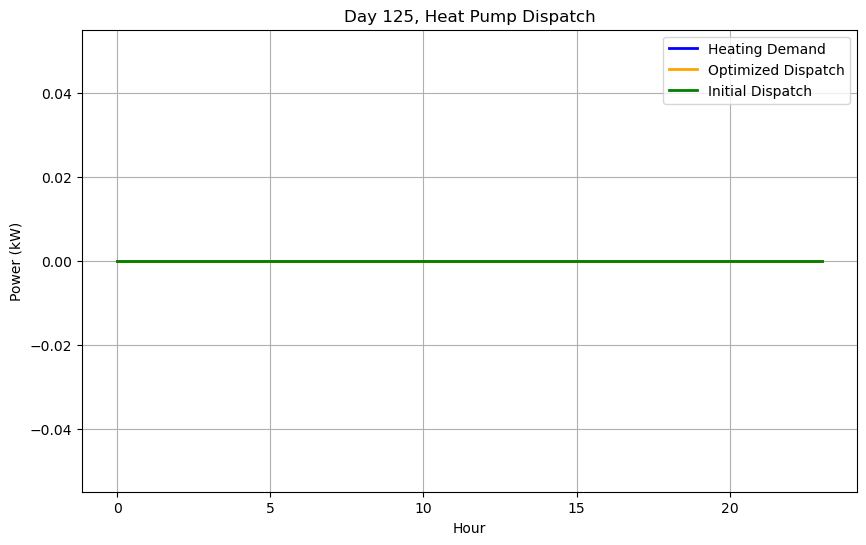


Day 126/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 29.31°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


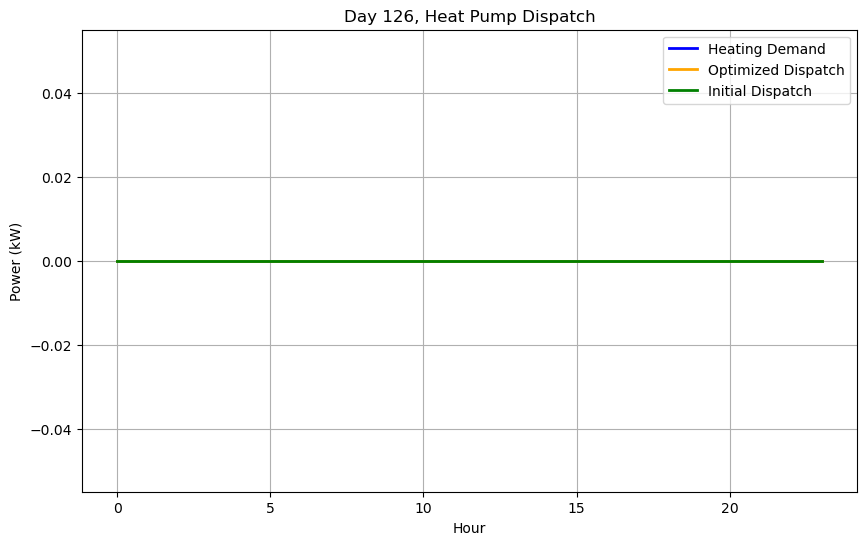


Day 127/365
Initial Guess Cost: €0.07
Optimized Daily Cost: €0.01
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.19 kWh
Buffer Tank Temperature at End of Day: 29.01°C
Optimized Dispatch: [7.70934691e-11 7.89019229e-11 7.75123575e-11 7.92367735e-11
 4.98281909e-03 5.08266983e-12 5.02390831e-12 8.37176322e-12
 4.87325628e-12 4.74304707e-12 4.00612713e-12 6.78587163e-12
 3.30479464e-12 9.49708462e-12 3.30466667e-12 9.32081911e-12
 4.47509701e-12 1.05709746e-11 1.14393945e-11 1.49455788e-11
 5.50507322e-12 5.42873513e-12 4.94454443e-16 1.14159801e-11]


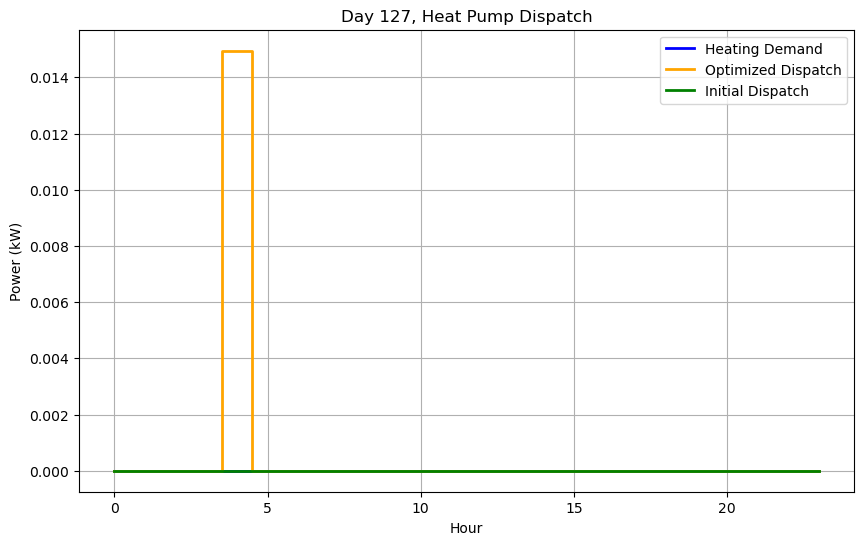


Day 128/365
Initial Guess Cost: €0.04
Optimized Daily Cost: €0.04
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.46 kWh
Buffer Tank Temperature at End of Day: 29.03°C
Optimized Dispatch: [3.77788107e-06 4.36131144e-05 4.75713243e-06 4.53421410e-07
 2.29231849e-06 1.02112910e-10 1.08041655e-03 4.23693373e-13
 2.90175477e-13 8.18043951e-14 1.40048259e-12 9.12274105e-14
 2.35122808e-13 7.45887258e-13 2.53865872e-13 2.69763283e-13
 1.53480300e-13 2.89594440e-13 2.03724742e-13 3.17640426e-13
 9.57632765e-14 1.81816276e-12 1.62850958e-13 2.59600466e-13]


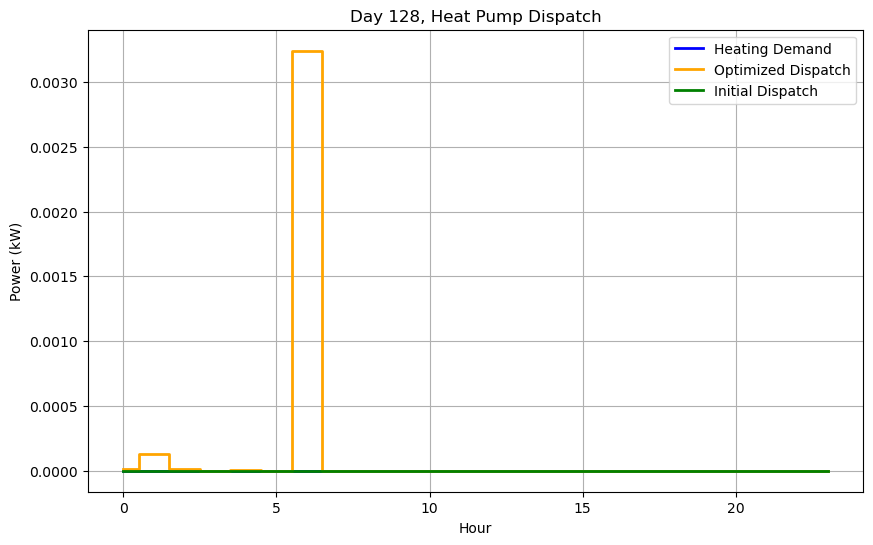


Day 129/365
Initial Guess Cost: €0.05
Optimized Daily Cost: €0.03
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.40 kWh
Buffer Tank Temperature at End of Day: 28.98°C
Optimized Dispatch: [2.78610754e-12 3.85791182e-12 6.47861856e-12 8.65651448e-11
 1.70133711e-03 6.96348842e-15 7.50691503e-15 1.19634693e-12
 7.74602821e-15 7.30048079e-15 6.93098084e-15 6.40747775e-15
 6.23512433e-15 6.11794916e-15 6.32184261e-15 6.69654816e-15
 6.80734060e-15 7.21431312e-15 7.70650416e-15 7.84866492e-15
 7.77053041e-15 7.51735870e-15 7.37728314e-15 1.20304371e-12]


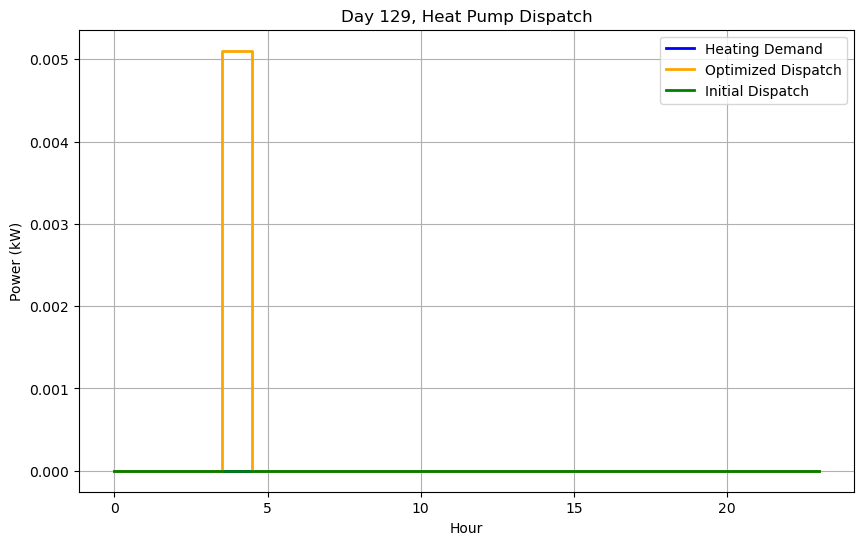


Day 130/365
Initial Guess Cost: €0.11
Optimized Daily Cost: €0.05
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.74 kWh
Buffer Tank Temperature at End of Day: 29.33°C
Optimized Dispatch: [1.94838945e-14 1.69467500e-14 1.70302149e-14 1.03061392e-14
 1.63001878e-14 6.10797220e-03 1.82465293e-04 5.14547896e-12
 4.54761117e-12 7.96945958e-04 1.09868526e-03 1.60872607e-03
 2.05636832e-03 2.38878274e-03 2.62753086e-03 1.92223743e-03
 1.13352801e-03 6.77273214e-04 4.29983712e-04 8.77328232e-06
 1.18135690e-05 1.94315830e-04 1.83461390e-04 1.80802872e-04]


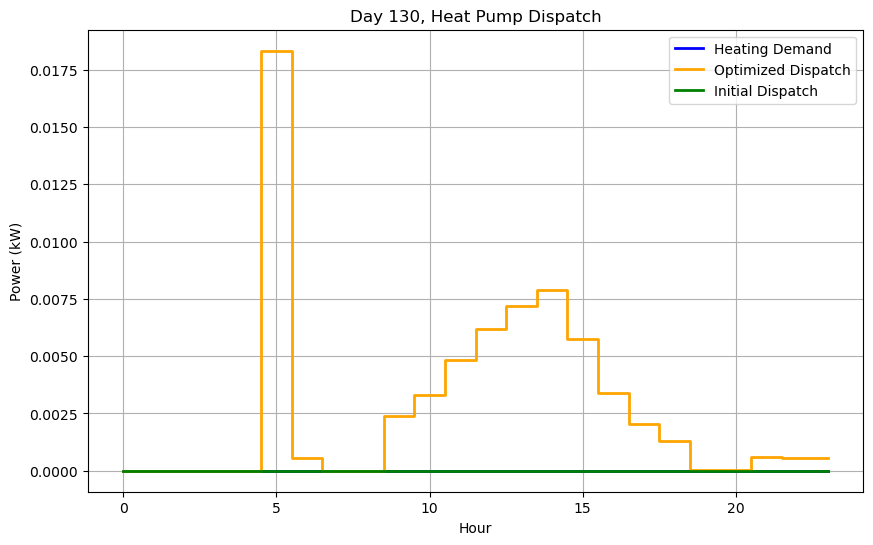


Day 131/365
Initial Guess Cost: €0.07
Optimized Daily Cost: €0.06
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.81 kWh
Buffer Tank Temperature at End of Day: 29.72°C
Optimized Dispatch: [1.64508363e-13 9.17041496e-16 2.53050225e-14 8.61167532e-15
 8.38203729e-16 2.89731812e-03 8.54414505e-11 7.64587453e-11
 6.93256371e-11 6.30436716e-11 1.03558305e-04 1.35220464e-03
 2.76331692e-03 3.05376008e-03 3.06946380e-03 2.31052221e-03
 1.94807902e-03 1.96858079e-03 1.07887887e-03 1.31213566e-04
 3.67663062e-04 1.44915241e-03 1.46797112e-03 1.44439016e-03]


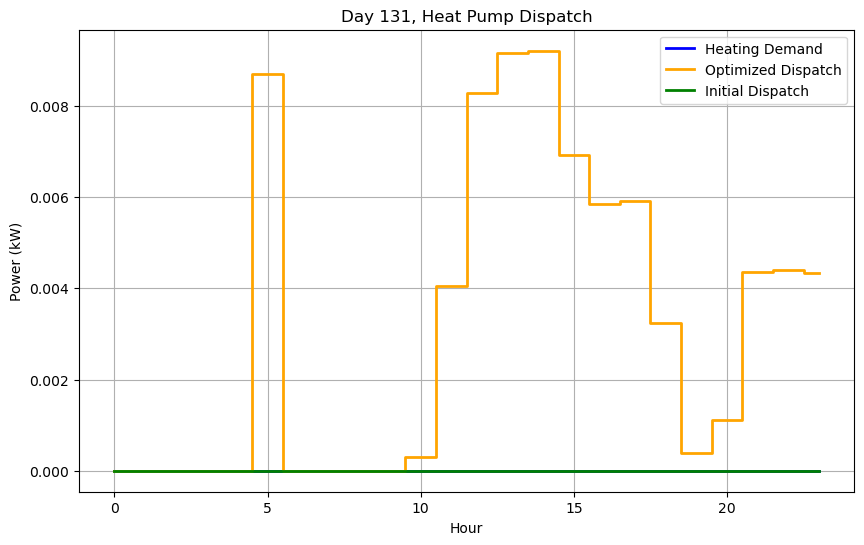


Day 132/365
Initial Guess Cost: €0.06
Optimized Daily Cost: €0.06
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.82 kWh
Buffer Tank Temperature at End of Day: 30.12°C
Optimized Dispatch: [6.68138649e-17 5.45081621e-19 1.28719604e-20 1.18359337e-20
 5.82882044e-18 3.46270799e-03 2.88436850e-15 2.60683323e-15
 2.39015019e-15 1.85546516e-04 9.00125293e-04 1.01603303e-03
 1.54492650e-03 1.82716356e-03 1.96367688e-03 1.72734648e-03
 1.55959644e-03 1.16726004e-03 5.60752336e-04 1.26804953e-05
 1.15383151e-05 1.46565573e-04 1.43593857e-04 1.43758255e-04]


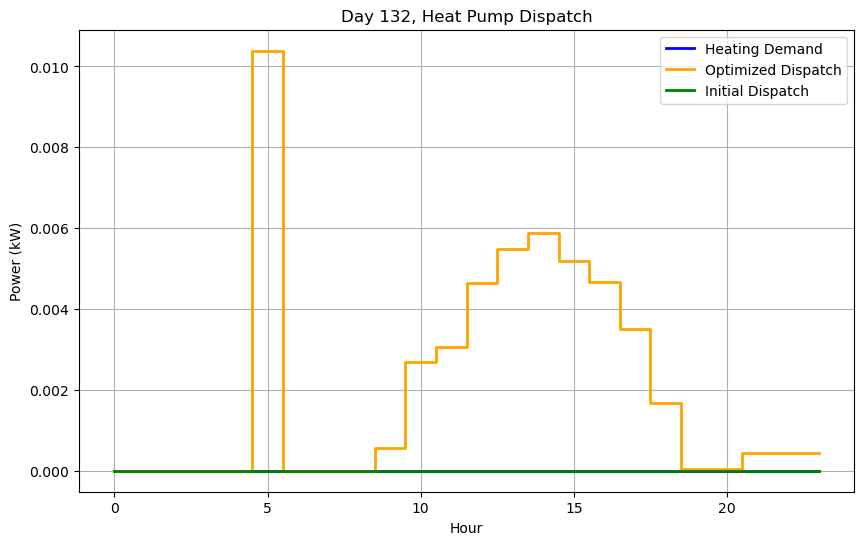


Day 133/365
Initial Guess Cost: €0.57
Optimized Daily Cost: €0.54
Total Heat Consumed (Qconsumption): 8.37 kWh
Total Heat Produced (Qproduction): 8.72 kWh
Buffer Tank Temperature at End of Day: 29.96°C
Optimized Dispatch: [1.11871695e-07 1.34975059e-12 1.58448981e-11 2.98671618e-03
 3.44791762e-09 3.11076078e-09 2.81302423e-09 2.53274993e-09
 2.25435231e-09 1.96562110e-09 9.86605158e-05 9.89632818e-04
 1.23710221e-03 1.29806320e-03 1.29419160e-03 1.31455439e-03
 1.21411178e-03 4.90935190e-04 2.08053634e-01 7.37995992e-03
 2.17180881e-01 9.37616370e-02 8.49155274e-02 1.40514922e-02]


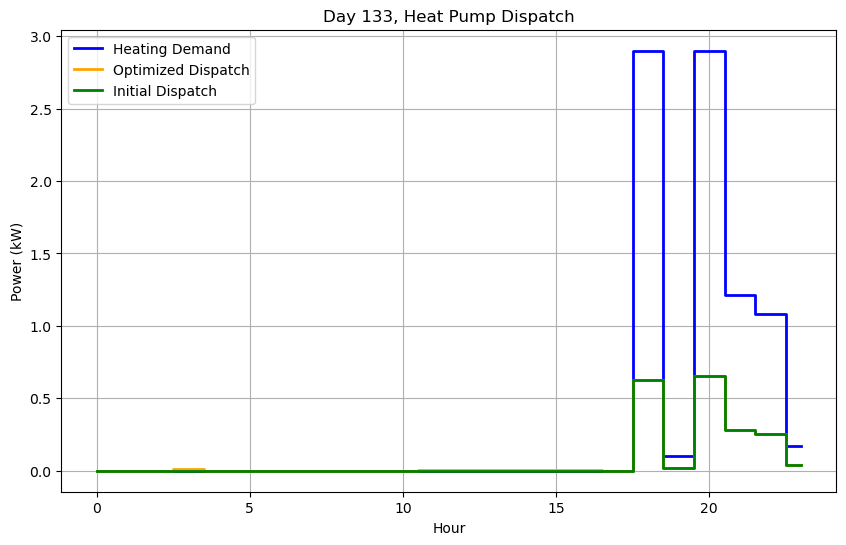


Day 134/365
Initial Guess Cost: €0.60
Optimized Daily Cost: €0.53
Total Heat Consumed (Qconsumption): 8.70 kWh
Total Heat Produced (Qproduction): 8.90 kWh
Buffer Tank Temperature at End of Day: 29.65°C
Optimized Dispatch: [9.99305382e-03 7.98334495e-03 5.14411341e-03 1.22086890e-01
 9.16498674e-02 1.25307341e-01 3.08122298e-02 7.50499623e-03
 7.18121563e-03 7.10442753e-03 1.42362179e-02 5.94155740e-14
 1.44842081e-02 1.32594357e-02 6.89272518e-03 6.91036930e-03
 6.88147625e-03 1.07708608e-03 5.55000863e-03 1.92136544e-12
 7.28762356e-02 6.98512233e-02 3.01949358e-02 1.30476709e-02]


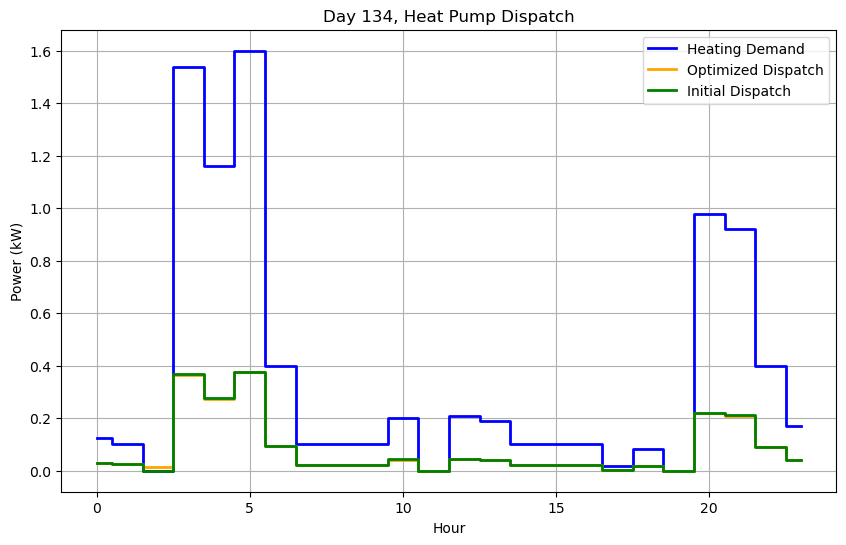


Day 135/365
Initial Guess Cost: €0.50
Optimized Daily Cost: €0.39
Total Heat Consumed (Qconsumption): 6.00 kWh
Total Heat Produced (Qproduction): 6.39 kWh
Buffer Tank Temperature at End of Day: 29.56°C
Optimized Dispatch: [1.57198094e-02 3.79350572e-02 1.39052191e-02 1.03343366e-01
 3.63419002e-02 2.06275994e-02 7.02580716e-16 6.43099926e-03
 6.34885830e-03 6.31571683e-03 9.22108018e-16 6.38371239e-03
 1.57306508e-02 1.70312884e-02 5.47591911e-03 1.24856974e-02
 1.22549460e-02 4.76285309e-03 6.46016129e-03 1.31693511e-15
 8.80101488e-02 5.19509147e-02 6.78866857e-03 4.98583701e-03]


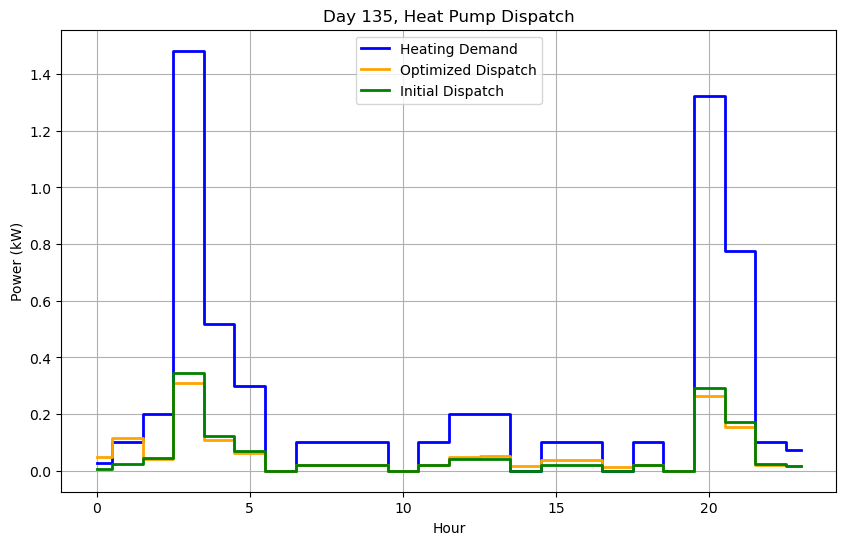


Day 136/365
Initial Guess Cost: €0.52
Optimized Daily Cost: €0.44
Total Heat Consumed (Qconsumption): 6.80 kWh
Total Heat Produced (Qproduction): 7.92 kWh
Buffer Tank Temperature at End of Day: 30.28°C
Optimized Dispatch: [9.90975060e-03 7.85061362e-03 1.41511726e-02 1.50614724e-01
 5.79159444e-02 2.27829121e-02 7.36337971e-03 7.14967346e-03
 6.98909316e-03 1.11675033e-05 2.91443470e-02 2.33061779e-03
 1.80860694e-02 1.35790431e-02 8.95480663e-03 1.61476351e-02
 1.42593994e-02 2.94584940e-03 9.61186284e-02 3.78841329e-02
 2.23498518e-02 1.55295124e-02 1.59379603e-02 6.92328162e-03]


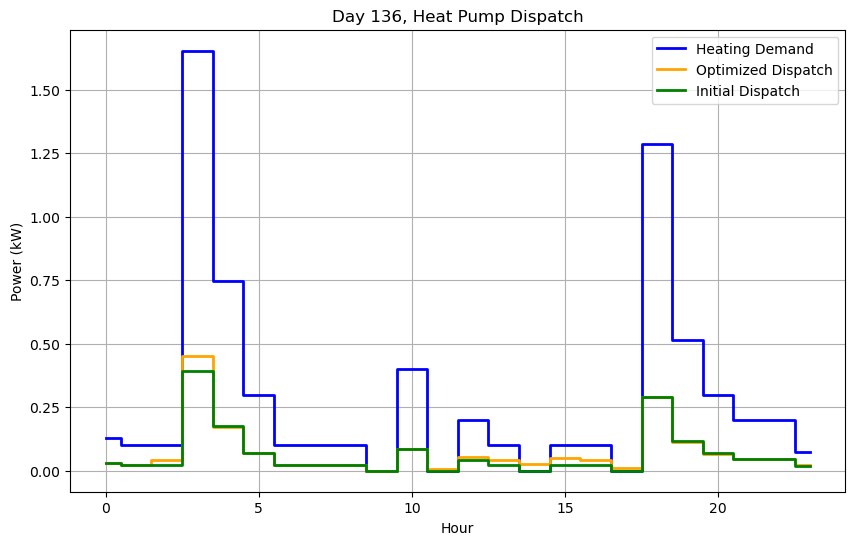


Day 137/365
Initial Guess Cost: €1.00
Optimized Daily Cost: €0.91
Total Heat Consumed (Qconsumption): 14.70 kWh
Total Heat Produced (Qproduction): 15.13 kWh
Buffer Tank Temperature at End of Day: 30.19°C
Optimized Dispatch: [2.05395811e-03 8.31578255e-03 8.36610495e-03 1.37194781e-01
 1.93149077e-01 1.30215778e-01 2.42984876e-02 1.94851939e-02
 1.25328710e-02 7.32111249e-02 7.37298119e-03 7.45888176e-03
 1.50372792e-02 7.43265969e-03 2.57719954e-14 7.26220310e-03
 6.07696578e-03 1.39311225e-01 6.97896809e-03 2.09055273e-01
 5.33232184e-02 6.12831096e-02 1.56361164e-02 5.92087135e-03]


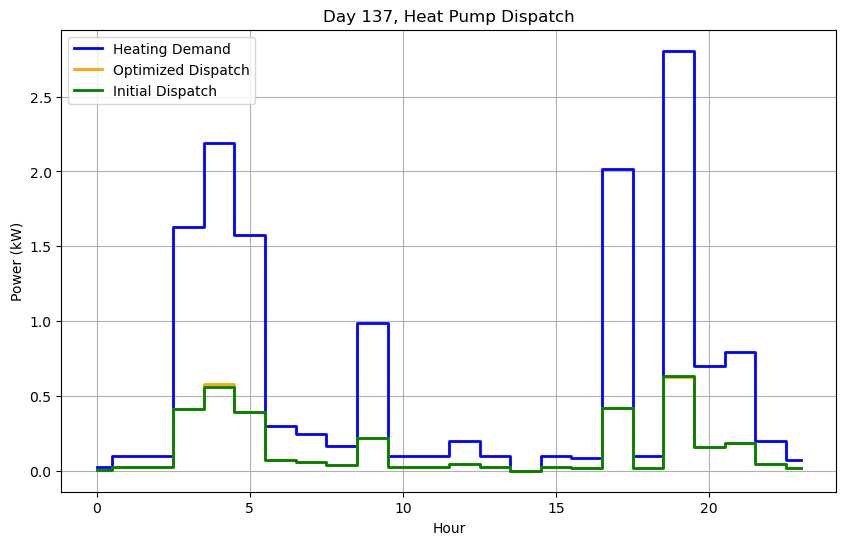


Day 138/365
Initial Guess Cost: €1.17
Optimized Daily Cost: €1.01
Total Heat Consumed (Qconsumption): 15.03 kWh
Total Heat Produced (Qproduction): 15.72 kWh
Buffer Tank Temperature at End of Day: 30.40°C
Optimized Dispatch: [1.03596237e-02 2.51226098e-01 3.24508700e-02 1.69457449e-01
 4.41921564e-01 2.10337705e-01 1.49475980e-02 7.39907977e-03
 1.49154372e-02 7.28169508e-03 1.36360793e-14 4.79383205e-02
 2.79370742e-02 1.38227060e-02 1.01493270e-14 1.12923025e-14
 9.70085532e-15 2.43592725e-14 1.56921143e-14 2.51172389e-14
 1.35176336e-14 1.59346366e-14 2.61721372e-14 1.33389491e-14]


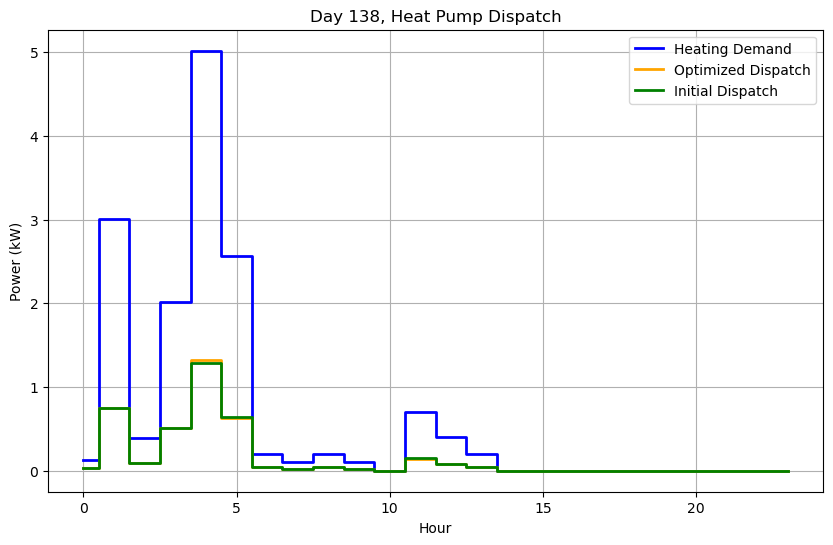


Day 139/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 29.84°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


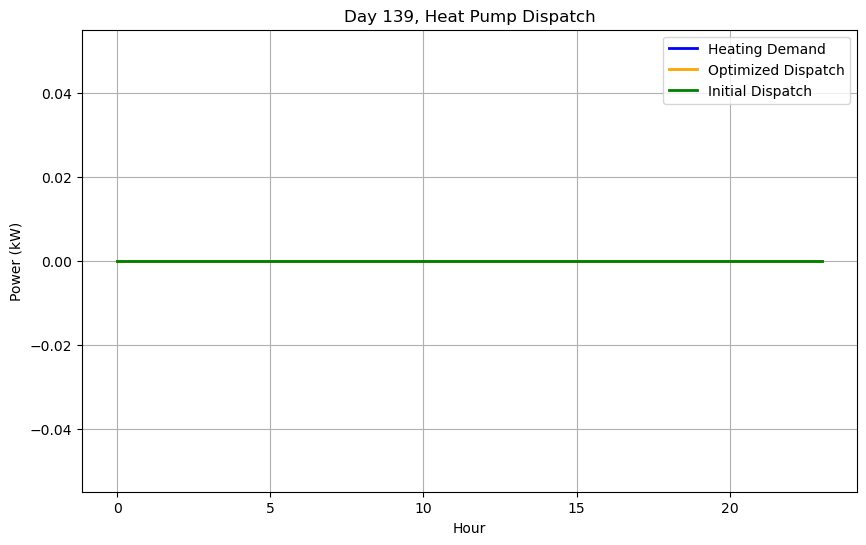


Day 140/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 29.32°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


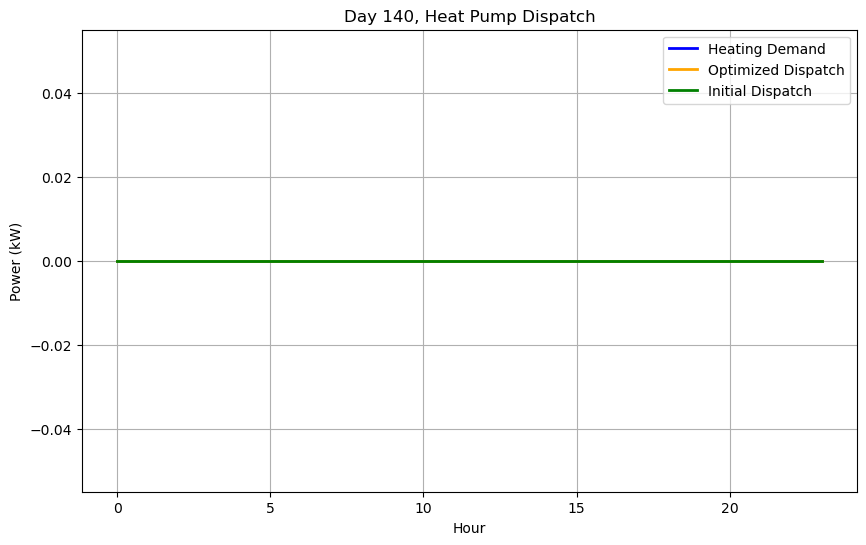


Day 141/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 28.82°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


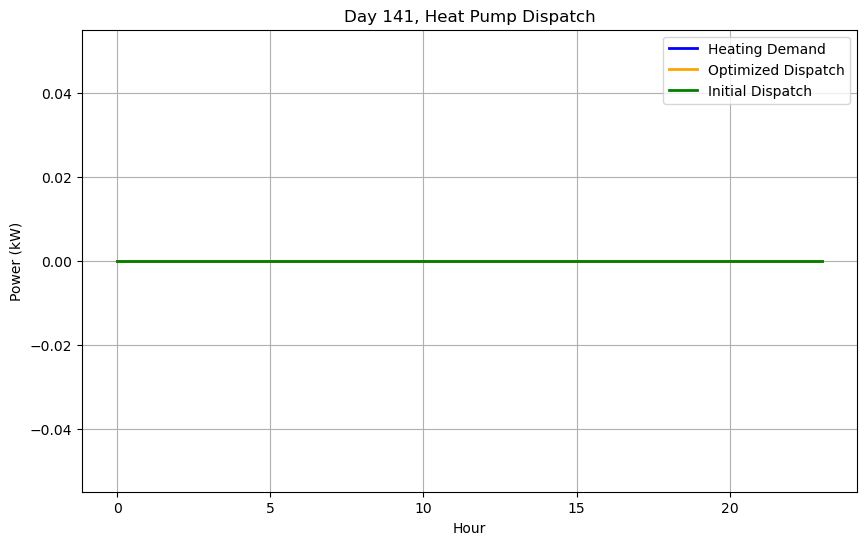


Day 142/365
Initial Guess Cost: €0.12
Optimized Daily Cost: €0.01
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.11 kWh
Buffer Tank Temperature at End of Day: 28.47°C
Optimized Dispatch: [1.90920269e-10 5.33122920e-03 2.41690027e-03 5.04128657e-12
 1.33625471e-10 6.49211395e-12 9.21119483e-12 8.78174065e-12
 5.57137649e-12 5.37957416e-12 4.38227101e-12 7.27688117e-10
 7.26161314e-10 4.71596941e-12 5.89500625e-12 3.16481363e-12
 4.45016110e-12 6.62027994e-12 5.50671381e-12 5.47752775e-12
 3.59022842e-12 7.20735274e-10 8.04289286e-11 6.98457797e-12]


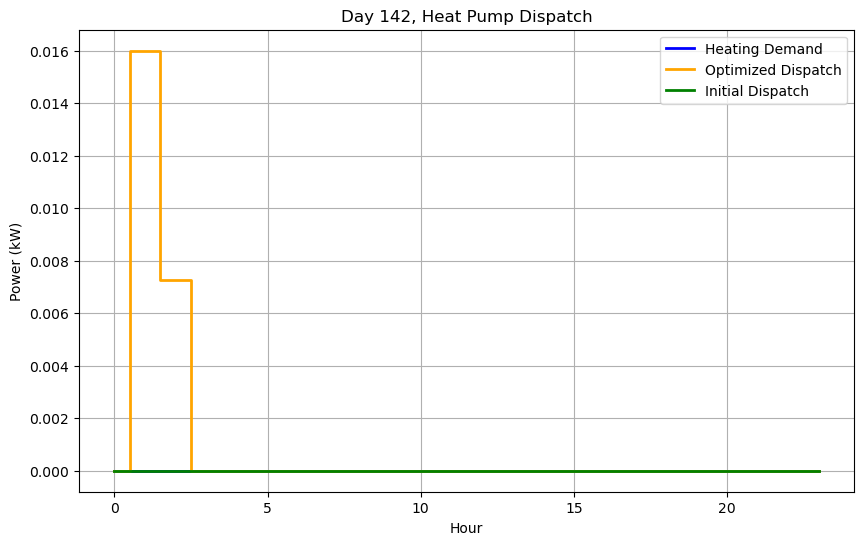


Day 143/365
Initial Guess Cost: €0.07
Optimized Daily Cost: €0.06
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 1.25 kWh
Buffer Tank Temperature at End of Day: 29.41°C
Optimized Dispatch: [1.13489190e-16 4.33309981e-15 4.26155002e-15 2.95223036e-05
 4.75611870e-03 5.30948474e-04 1.28402839e-04 1.57767632e-04
 2.43457513e-04 6.00867292e-04 8.24723104e-04 2.25260905e-03
 6.60626247e-03 8.94312128e-03 1.00847861e-02 1.02946515e-02
 9.78142933e-03 4.64716745e-03 1.83033832e-03 9.59828676e-04
 7.09444929e-04 1.83536189e-11 1.43451164e-11 2.14934291e-05]


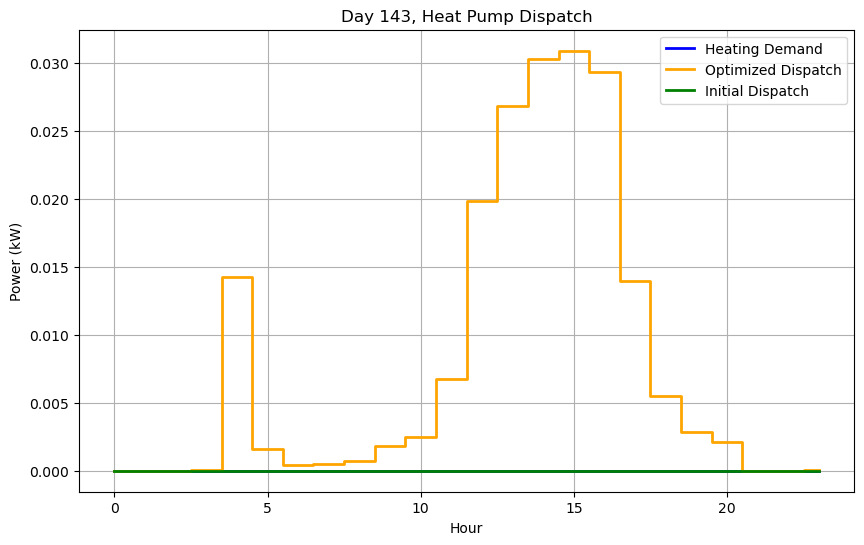


Day 144/365
Initial Guess Cost: €0.05
Optimized Daily Cost: €0.07
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.88 kWh
Buffer Tank Temperature at End of Day: 29.88°C
Optimized Dispatch: [3.94050558e-06 4.20599955e-07 2.94023798e-08 8.88536224e-06
 4.98301322e-06 4.81104942e-04 3.08571094e-04 1.84155805e-04
 3.29204920e-04 4.41643354e-04 6.08449850e-04 7.20008642e-04
 8.46034901e-04 8.11737762e-04 8.97858180e-04 8.45528348e-04
 7.84071980e-04 7.19675636e-04 6.23627405e-04 2.28461501e-11
 1.12741932e-11 2.81015497e-11 2.81904485e-13 2.54574877e-06]


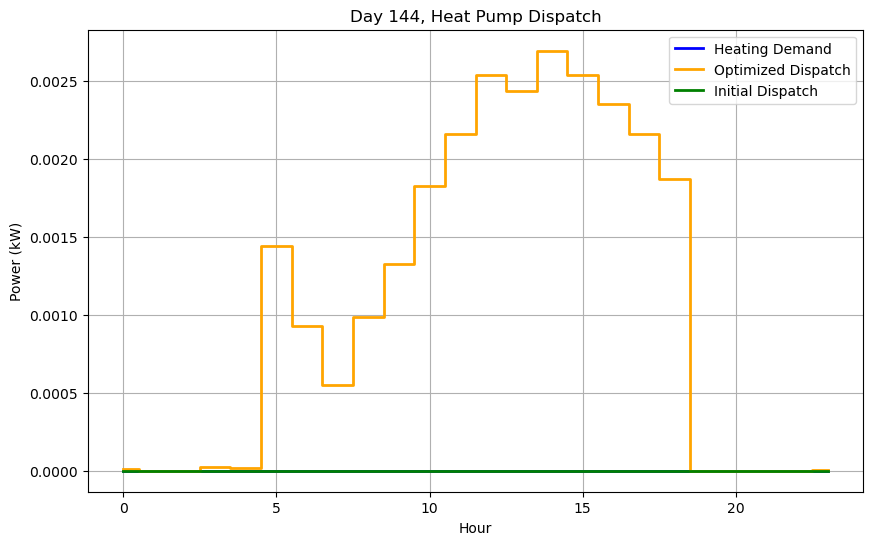


Day 145/365
Initial Guess Cost: €0.19
Optimized Daily Cost: €0.03
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.44 kWh
Buffer Tank Temperature at End of Day: 29.83°C
Optimized Dispatch: [5.82132104e-09 7.86656808e-09 4.83627151e-12 2.36189925e-12
 1.20530213e-02 6.89471342e-14 7.51315409e-14 8.09778701e-14
 7.80854782e-14 7.17458617e-14 6.70104119e-14 6.24493040e-14
 5.77525906e-14 9.78900291e-14 4.76927700e-14 6.12462877e-14
 5.32189280e-14 1.16167817e-13 8.28865811e-14 8.65021951e-14
 7.46703487e-14 7.07901954e-14 8.46327212e-14 7.20081876e-14]


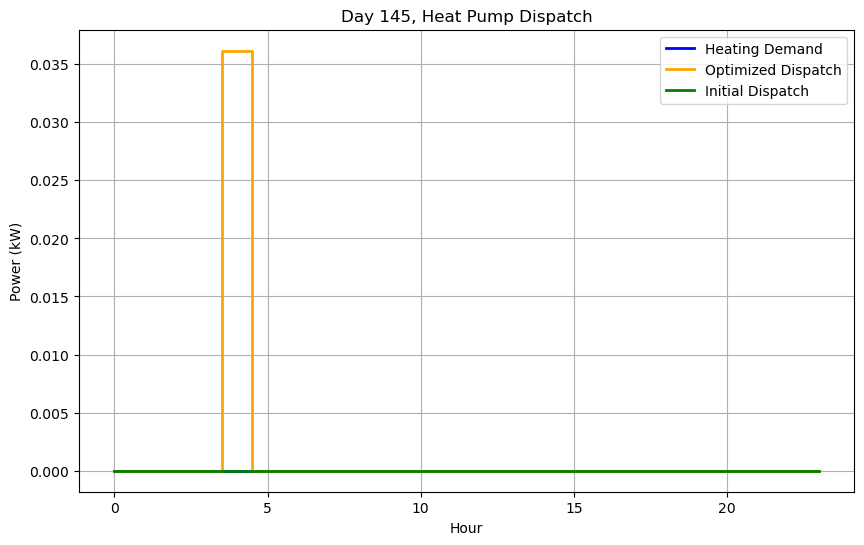


Day 146/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 29.31°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


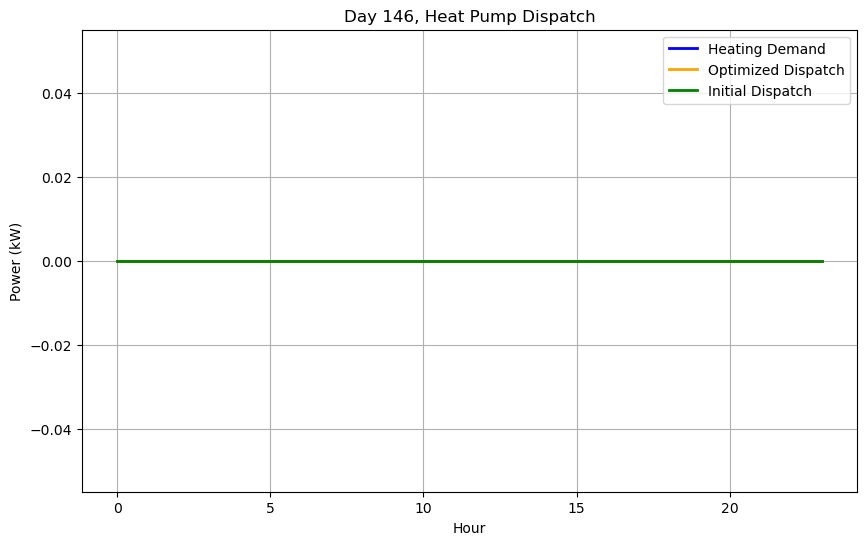


Day 147/365
Initial Guess Cost: €0.09
Optimized Daily Cost: €0.03
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.34 kWh
Buffer Tank Temperature at End of Day: 29.18°C
Optimized Dispatch: [4.55110532e-11 9.98450766e-05 4.60440262e-11 3.94041339e-12
 5.77302957e-03 5.56262630e-14 9.55044203e-14 5.39420001e-14
 8.88724644e-14 6.87017460e-14 3.91154804e-14 3.76511256e-14
 3.51669316e-14 1.94305942e-14 3.54517246e-14 3.99202306e-14
 3.74571259e-14 4.74217166e-14 4.98592844e-14 7.01025212e-14
 6.37490694e-14 6.22729756e-14 5.78848674e-14 5.66736064e-14]


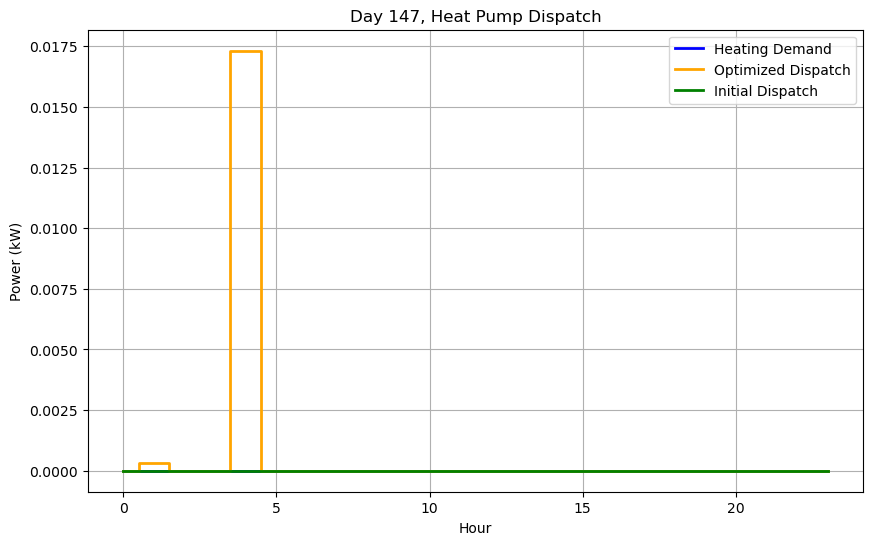


Day 148/365
Initial Guess Cost: €0.07
Optimized Daily Cost: €0.04
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.49 kWh
Buffer Tank Temperature at End of Day: 29.23°C
Optimized Dispatch: [2.48839110e-16 3.78659893e-18 5.76009368e-18 2.92685451e-17
 4.86492161e-03 3.29669033e-16 3.23545660e-16 3.11749395e-16
 2.73543625e-16 2.22968838e-16 2.19031966e-16 1.98189875e-16
 1.55336886e-16 4.49831608e-17 4.31764553e-17 8.30091897e-17
 1.97144018e-16 2.26876091e-16 2.93825273e-16 3.29186175e-16
 3.34714884e-16 3.32937687e-16 3.27206621e-16 3.23401575e-16]


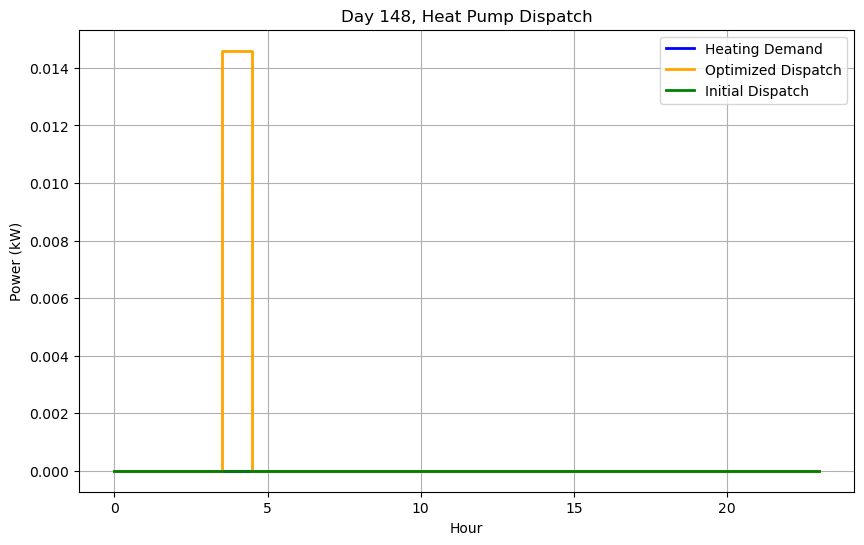


Day 149/365
Initial Guess Cost: €0.06
Optimized Daily Cost: €0.01
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.14 kWh
Buffer Tank Temperature at End of Day: 28.88°C
Optimized Dispatch: [9.64761035e-18 2.38265593e-18 5.18966889e-16 3.43018791e-03
 6.96005920e-03 5.21961683e-18 5.16556595e-18 3.36380723e-18
 3.08226867e-18 5.14583245e-18 2.61467639e-16 2.96852060e-16
 2.48485142e-16 2.19838549e-17 1.30231539e-17 2.72617504e-18
 2.01799123e-18 2.38281892e-18 1.39783800e-16 2.08912791e-16
 2.91275932e-18 4.59500853e-18 1.20874864e-16 1.34435045e-18]


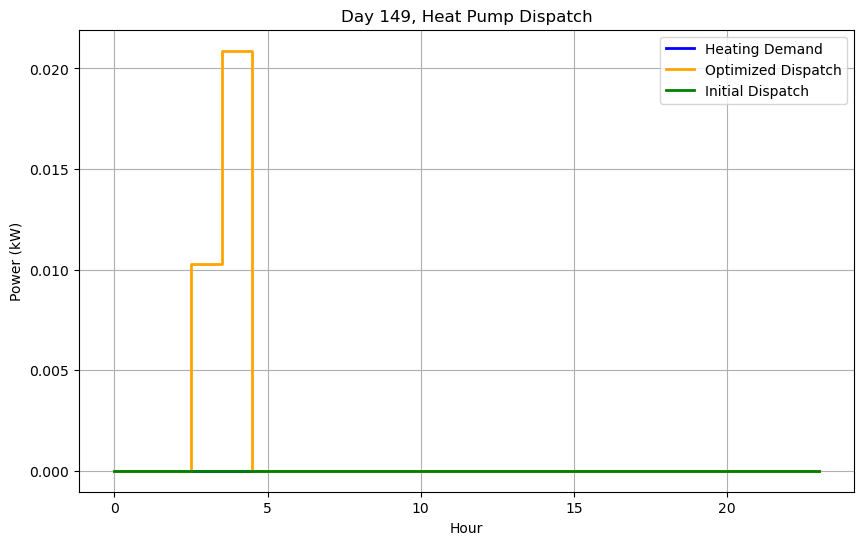


Day 150/365
Initial Guess Cost: €0.14
Optimized Daily Cost: €0.03
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.39 kWh
Buffer Tank Temperature at End of Day: 28.83°C
Optimized Dispatch: [1.08589162e-11 5.07648309e-12 1.44585064e-11 2.40343509e-08
 8.49177156e-03 7.78457109e-07 7.55932981e-09 6.76078235e-09
 5.81830755e-09 2.47787646e-05 5.94725129e-05 1.04277546e-04
 1.29190413e-04 1.44135314e-04 1.44918931e-04 1.43526987e-04
 1.38256595e-04 1.35231517e-04 1.15330569e-04 1.65667744e-05
 4.99939287e-06 1.93480371e-05 5.23399376e-05 6.60766947e-05]


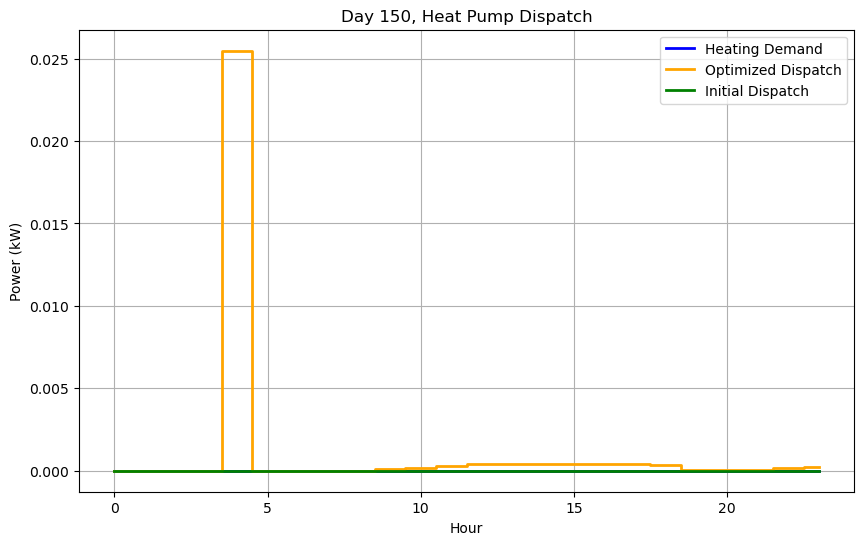


Day 151/365
Initial Guess Cost: €0.11
Optimized Daily Cost: €0.37
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 4.98 kWh
Buffer Tank Temperature at End of Day: 33.90°C
Optimized Dispatch: [2.52810989e-06 4.06389088e-06 7.78233060e-03 1.36051702e-02
 2.55146675e-15 2.51580195e-14 1.43223947e-13 2.39428162e-14
 1.51810715e-13 3.68668642e-14 1.45210120e-13 1.78074506e-14
 3.61111196e-14 6.91142741e-14 1.54885029e-14 5.70337193e-14
 3.30016051e-14 3.32022251e-14 3.92350599e-14 3.57934795e-14
 1.88716802e-14 1.15307256e-13 3.02741890e-14 2.05531263e-14]


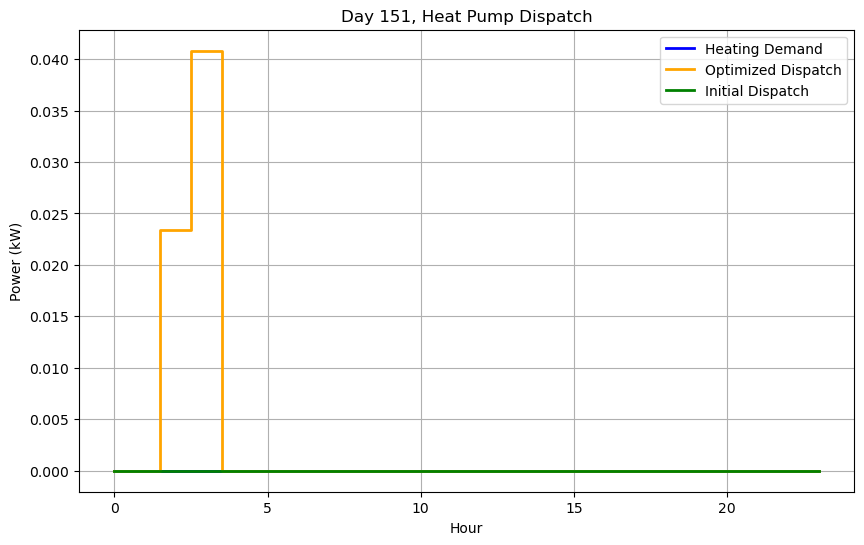


Day 152/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 33.15°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


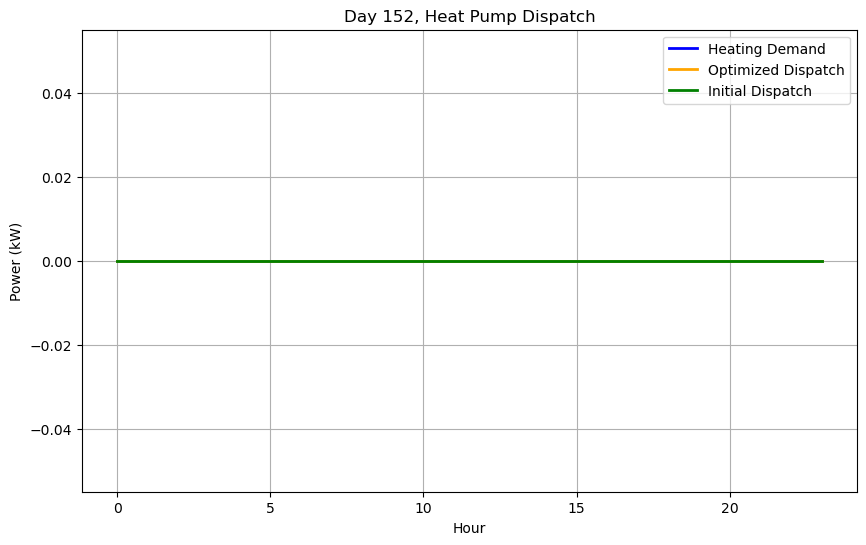


Day 153/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 32.45°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


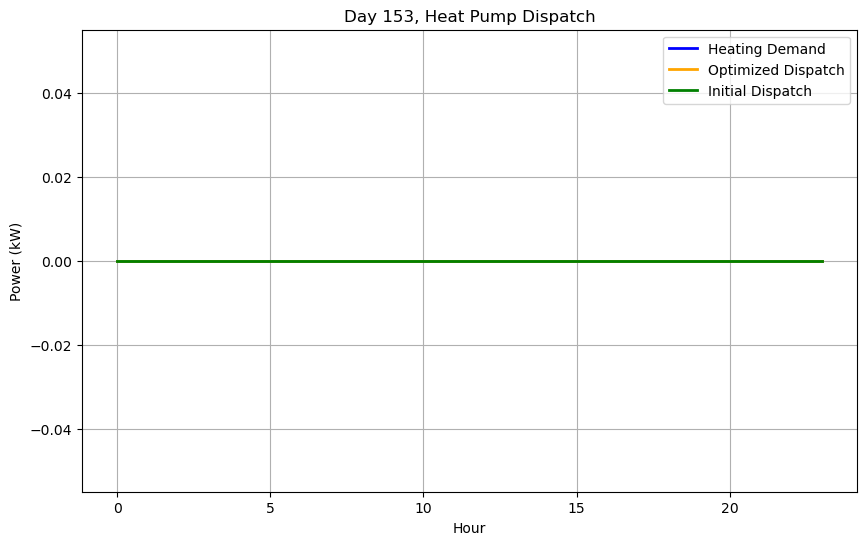


Day 154/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 31.79°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


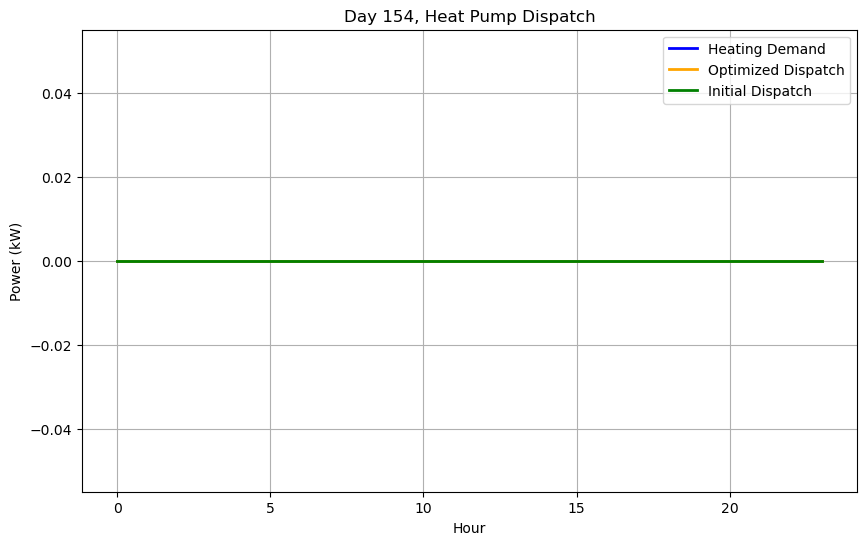


Day 155/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 31.16°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


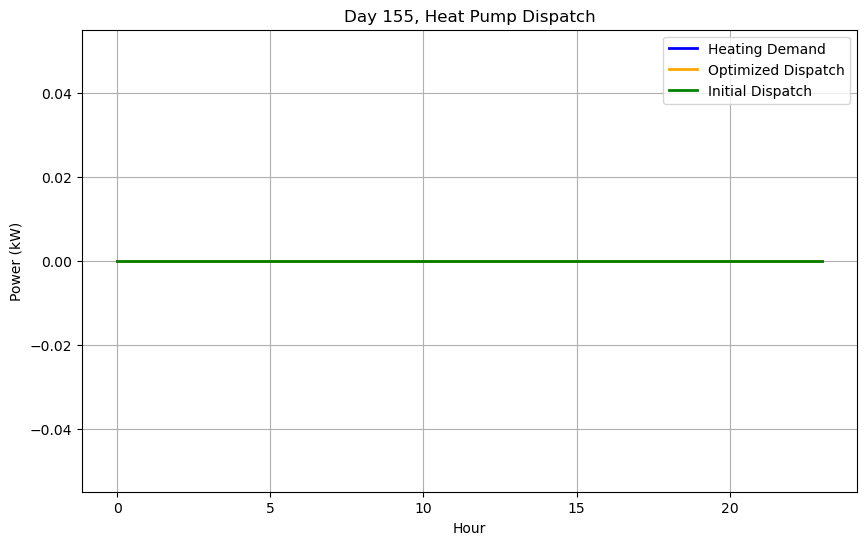


Day 156/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 30.56°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


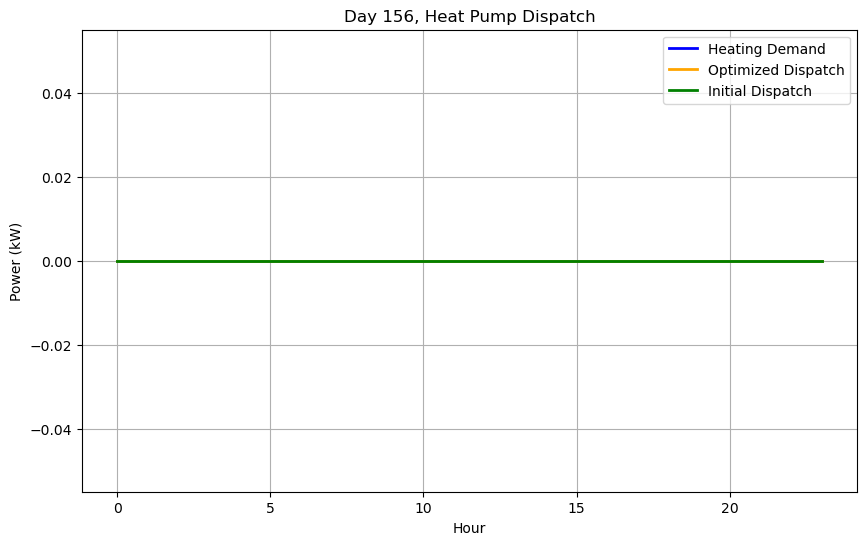


Day 157/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 30.00°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


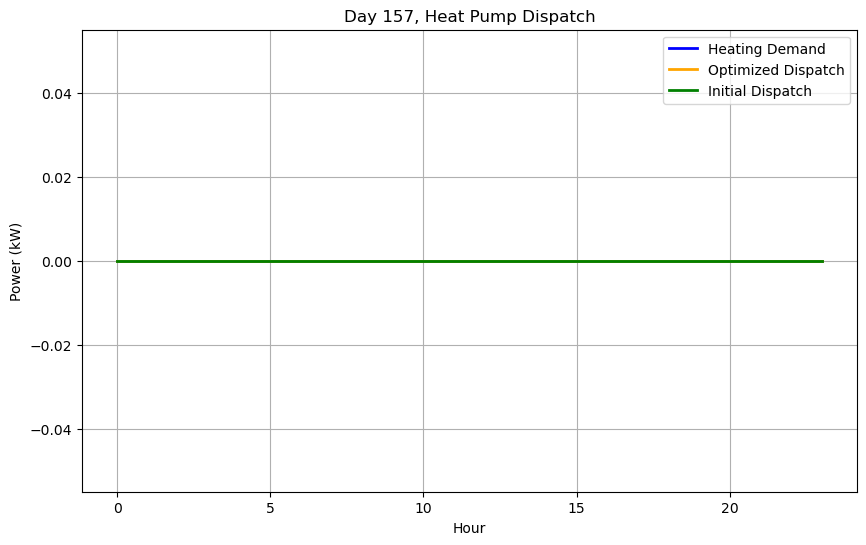


Day 158/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 29.46°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


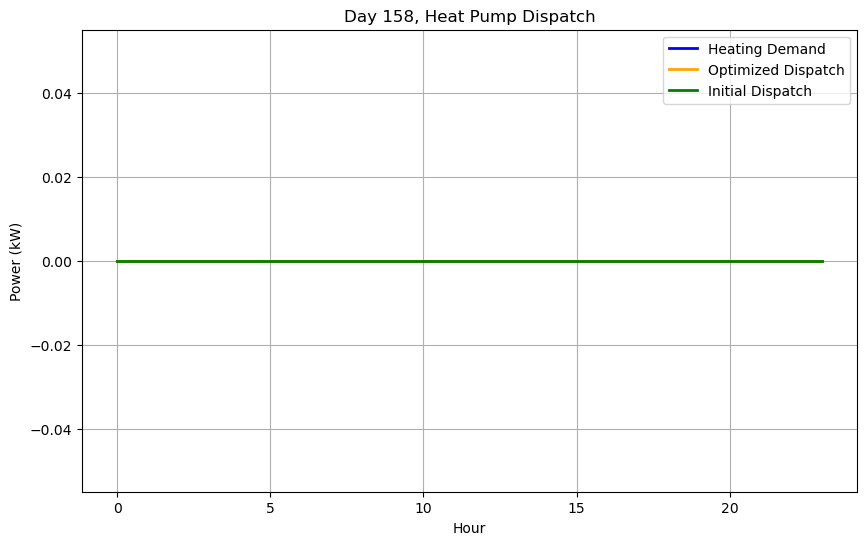


Day 159/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 28.96°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


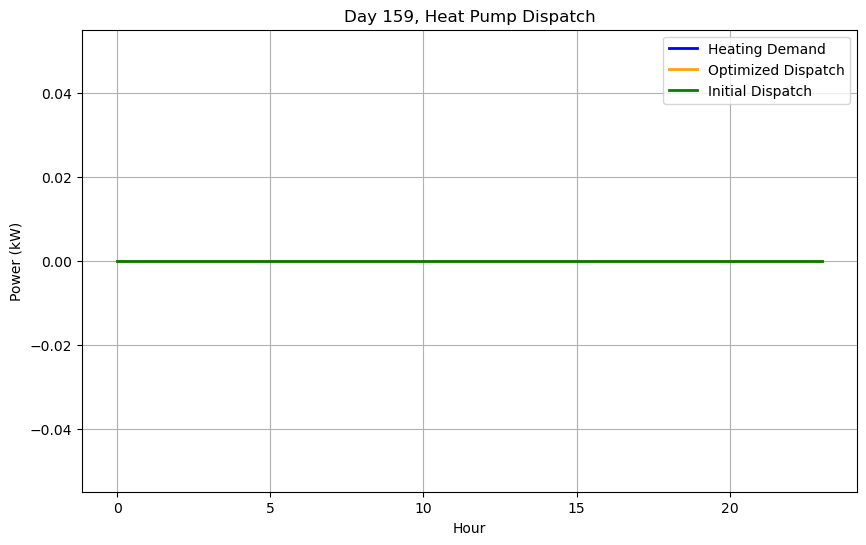


Day 160/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 28.48°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


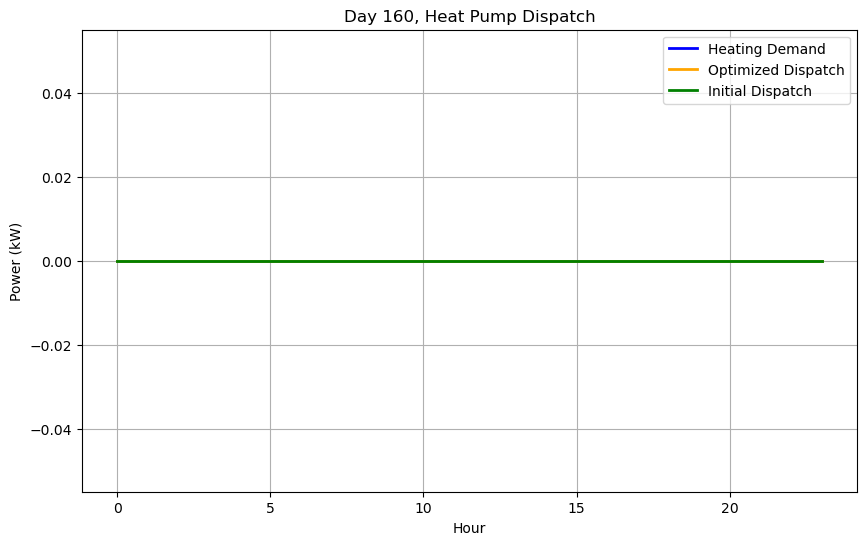


Day 161/365
Initial Guess Cost: €0.07
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.08 kWh
Buffer Tank Temperature at End of Day: 28.11°C
Optimized Dispatch: [1.83702590e-12 1.20002260e-03 2.51715451e-13 4.27832079e-03
 5.76613784e-12 5.84405259e-12 5.84176130e-12 2.81272771e-12
 5.88777330e-12 1.74730852e-12 4.57195724e-12 4.20284669e-12
 3.90042615e-12 3.51397693e-12 3.50273867e-13 4.49103860e-14
 7.57180440e-12 4.86255370e-12 9.35517704e-12 5.99718760e-12
 5.97619897e-12 5.79550327e-12 5.87135554e-12 2.43432385e-12]


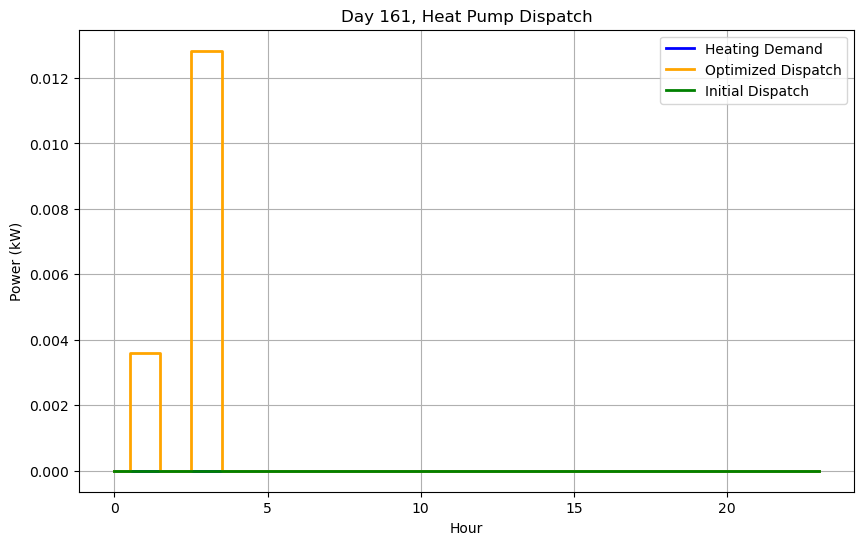


Day 162/365
Initial Guess Cost: €0.16
Optimized Daily Cost: €0.03
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.51 kWh
Buffer Tank Temperature at End of Day: 28.23°C
Optimized Dispatch: [1.22229100e-11 4.80622197e-08 1.39264686e-08 1.14445615e-02
 1.94072445e-13 1.97021793e-13 4.50692652e-14 4.48088002e-13
 1.78347220e-13 1.61085153e-13 1.36309470e-13 3.70634857e-13
 1.60756447e-13 1.14482963e-13 3.75104606e-13 2.82230968e-14
 1.46467975e-13 2.02157316e-13 2.52251461e-13 1.05557153e-12
 2.44471738e-13 5.20981619e-13 2.09605961e-13 2.28200644e-13]


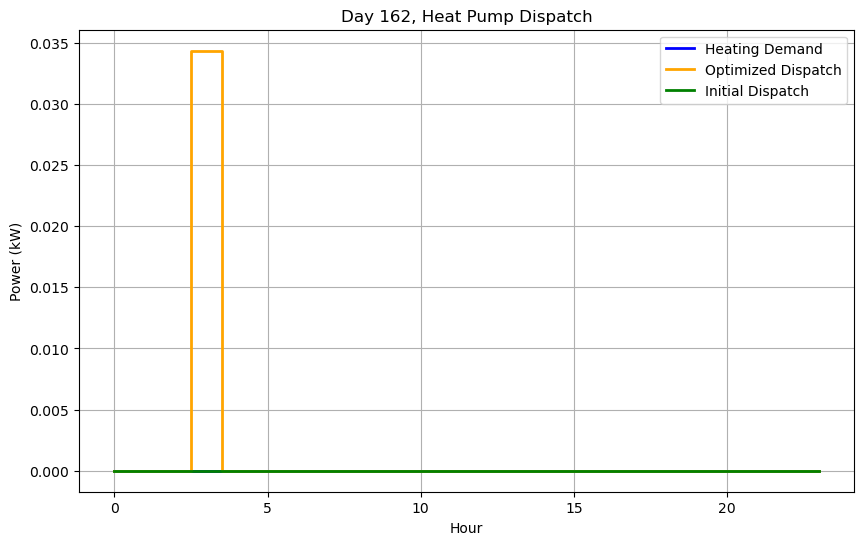


Day 163/365
Initial Guess Cost: €0.16
Optimized Daily Cost: €0.03
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.43 kWh
Buffer Tank Temperature at End of Day: 28.25°C
Optimized Dispatch: [6.58069947e-10 1.04339609e-06 1.29670144e-09 9.13405296e-03
 2.68088074e-06 5.43186582e-06 4.97784261e-06 2.68533834e-10
 7.29965379e-11 8.62084396e-06 2.57036620e-05 3.72111875e-05
 4.35061459e-05 4.56566932e-05 4.51190624e-05 4.21460735e-05
 3.91801889e-05 4.03124138e-05 3.44968277e-05 3.50582645e-06
 2.35364967e-06 4.93110668e-06 9.87547537e-06 1.54060443e-05]


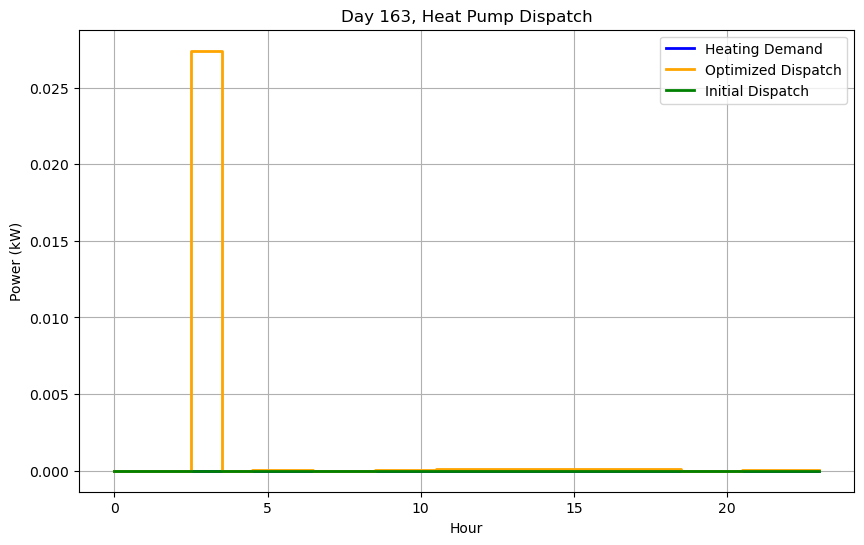


Day 164/365
Initial Guess Cost: €0.29
Optimized Daily Cost: €0.07
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.96 kWh
Buffer Tank Temperature at End of Day: 28.85°C
Optimized Dispatch: [8.88612379e-06 2.46912204e-05 5.78895991e-08 1.54667966e-02
 2.72396827e-12 2.79955916e-12 3.45512042e-12 3.05213390e-12
 7.15630367e-13 3.23529021e-12 1.32457060e-11 8.16432652e-13
 2.38728394e-12 2.47067920e-12 1.18348650e-12 2.59224386e-12
 5.09397842e-14 6.17172342e-14 2.98548391e-12 3.16073047e-12
 6.97796238e-14 1.37401898e-11 5.82095855e-14 5.32620422e-14]


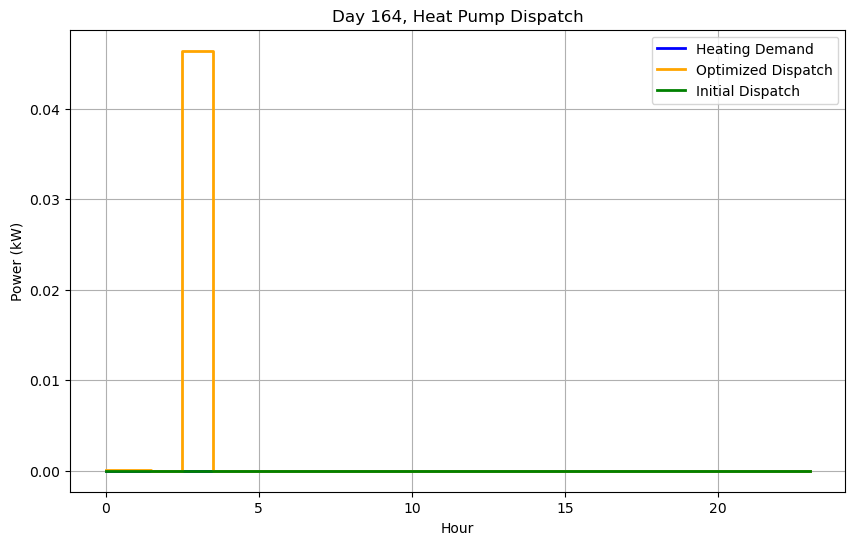


Day 165/365
Initial Guess Cost: €0.03
Optimized Daily Cost: €0.02
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.24 kWh
Buffer Tank Temperature at End of Day: 28.64°C
Optimized Dispatch: [1.47029707e-13 4.34137264e-12 2.13921088e-13 2.70866544e-13
 9.49017599e-04 5.69591003e-15 4.80015924e-14 5.78319292e-15
 5.25345938e-15 5.16046633e-15 1.31668630e-15 4.74437943e-14
 4.59026938e-15 4.61280589e-15 5.31939859e-15 4.71150888e-14
 6.61051339e-16 5.06921967e-15 6.02948009e-15 4.82816365e-14
 6.11952271e-15 4.82424192e-14 4.78741896e-14 5.27513163e-15]


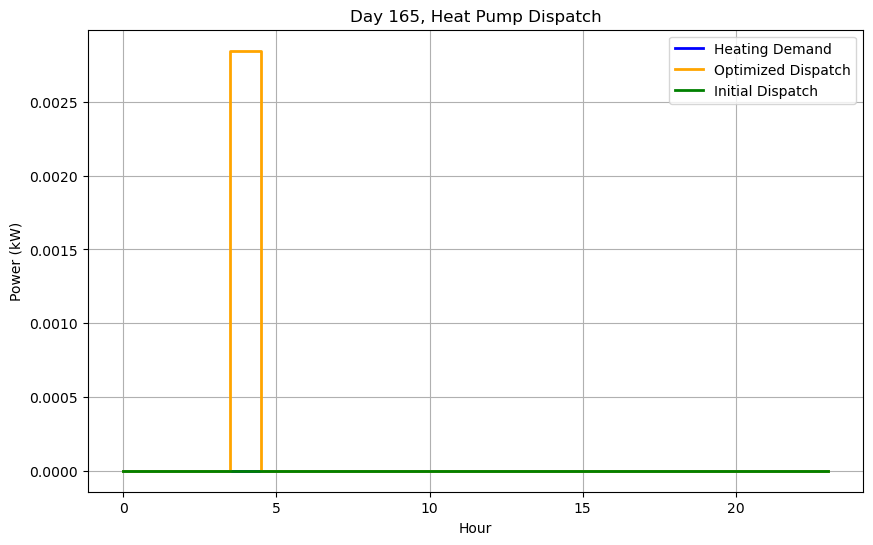


Day 166/365
Initial Guess Cost: €0.20
Optimized Daily Cost: €0.04
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.53 kWh
Buffer Tank Temperature at End of Day: 28.75°C
Optimized Dispatch: [7.21420671e-13 4.60610311e-06 6.44205114e-15 9.90176408e-03
 9.76732567e-15 9.96218531e-15 1.18265495e-14 1.21751030e-14
 1.08315689e-14 1.07801821e-14 9.82513097e-15 9.48705611e-15
 9.61309112e-15 9.31358102e-15 9.29796157e-15 9.57486643e-15
 9.55492785e-15 9.96950582e-15 1.06246331e-14 1.16915434e-14
 1.32029539e-14 1.23810105e-14 1.14497369e-14 1.06118331e-14]


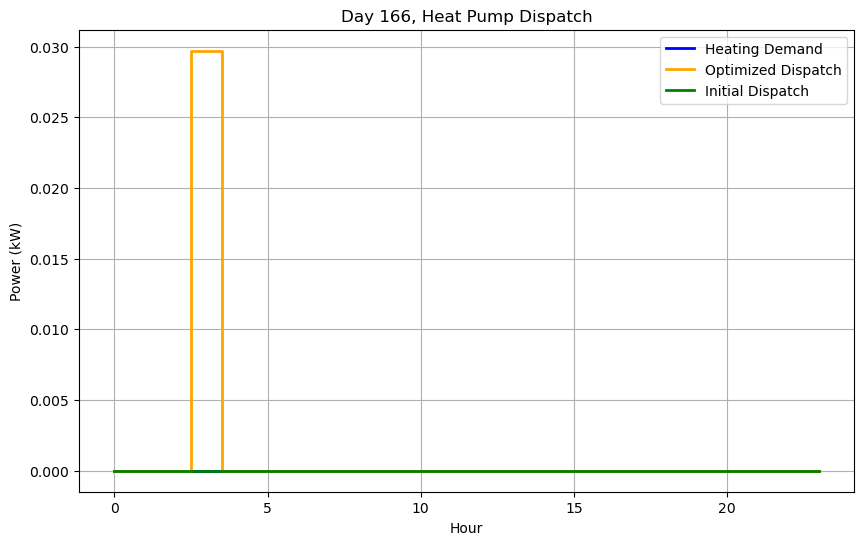


Day 167/365
Initial Guess Cost: €0.20
Optimized Daily Cost: €0.02
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.33 kWh
Buffer Tank Temperature at End of Day: 28.64°C
Optimized Dispatch: [2.93073581e-07 4.84668854e-07 2.93704587e-07 1.04329292e-02
 1.27182882e-11 2.21665965e-10 3.97019027e-11 1.42131806e-11
 1.39343693e-11 5.77856596e-11 1.23190284e-11 1.25649337e-11
 3.34746954e-10 3.35190263e-10 3.34001020e-10 1.22021402e-11
 1.21532110e-11 8.43486042e-11 3.98392157e-11 1.48184035e-11
 1.02277587e-10 1.05367330e-10 1.38545359e-11 1.33487477e-11]


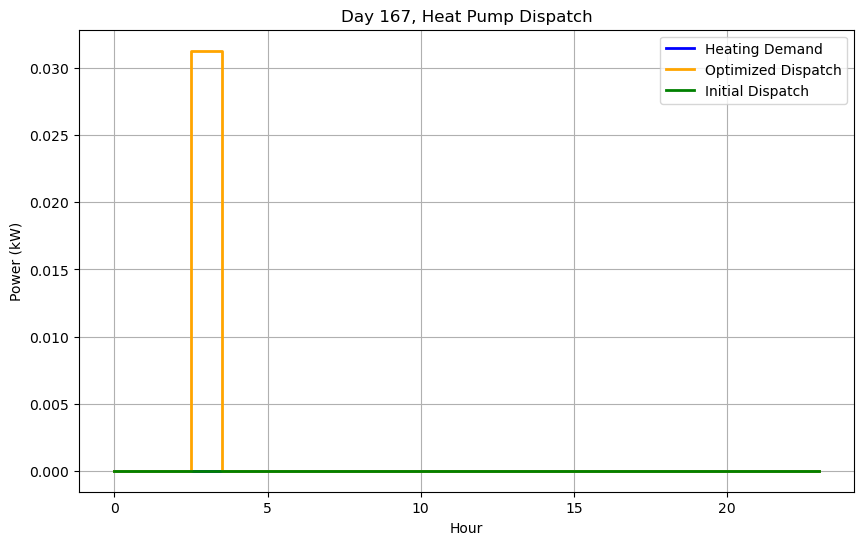


Day 168/365
Initial Guess Cost: €0.15
Optimized Daily Cost: €0.03
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.51 kWh
Buffer Tank Temperature at End of Day: 28.73°C
Optimized Dispatch: [8.74712128e-15 1.18940916e-15 5.63014820e-03 1.97512299e-02
 2.23504964e-13 2.22777614e-13 2.26044351e-13 2.22254467e-13
 8.31682401e-14 2.18681223e-13 6.91923237e-15 7.08344381e-14
 6.71653286e-14 6.38128738e-14 6.10473444e-14 6.61595932e-14
 7.17394509e-14 2.20170063e-13 1.41472633e-14 4.34215636e-14
 9.39115329e-14 5.20657100e-14 4.92866137e-14 9.41088781e-14]


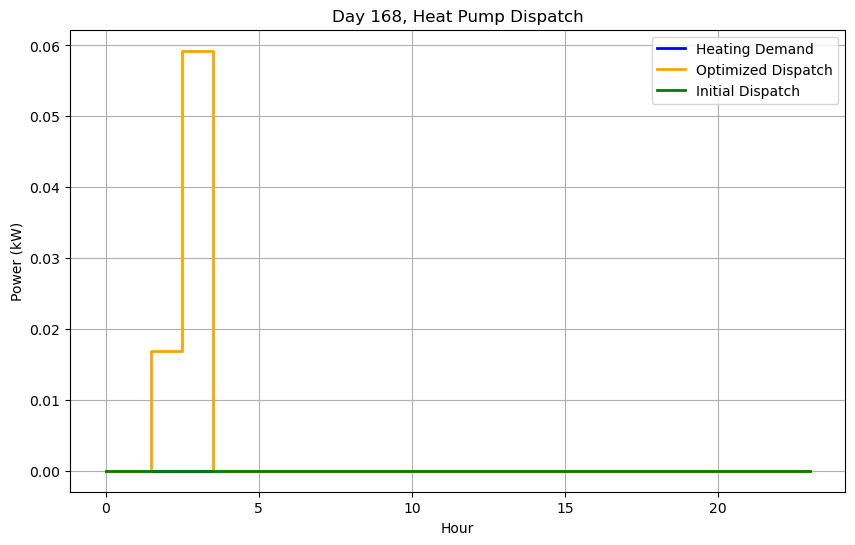


Day 169/365
Initial Guess Cost: €0.10
Optimized Daily Cost: €0.01
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.09 kWh
Buffer Tank Temperature at End of Day: 28.36°C
Optimized Dispatch: [1.41226365e-11 4.00050919e-12 4.46128343e-04 5.79490594e-03
 5.18739972e-11 9.53122041e-12 1.68210195e-11 1.38971379e-11
 9.74887149e-12 1.81031746e-11 6.55904840e-12 2.64615035e-10
 8.48006629e-12 5.37408626e-12 5.30256815e-12 8.55919615e-12
 1.02321166e-10 5.24883854e-11 9.59199853e-12 2.56594468e-10
 1.30754932e-11 5.46911871e-11 4.74595936e-11 9.53065038e-12]


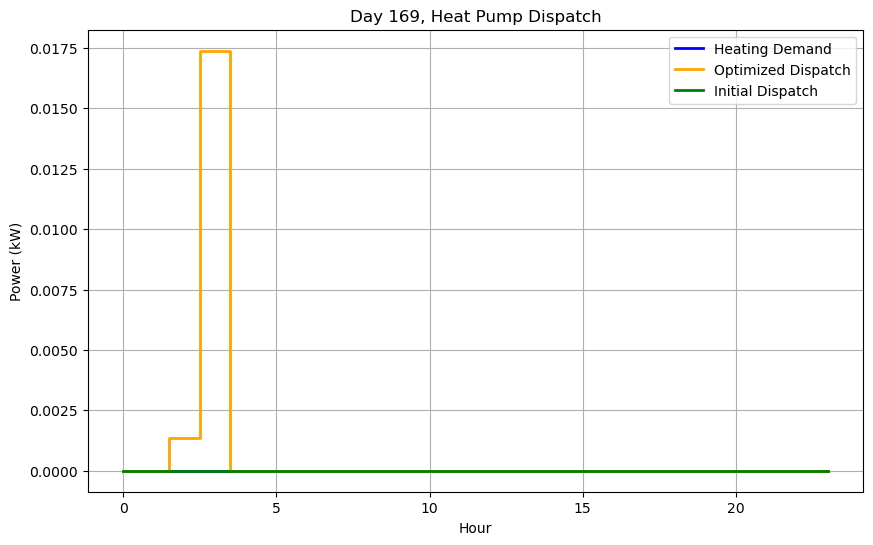


Day 170/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 27.91°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


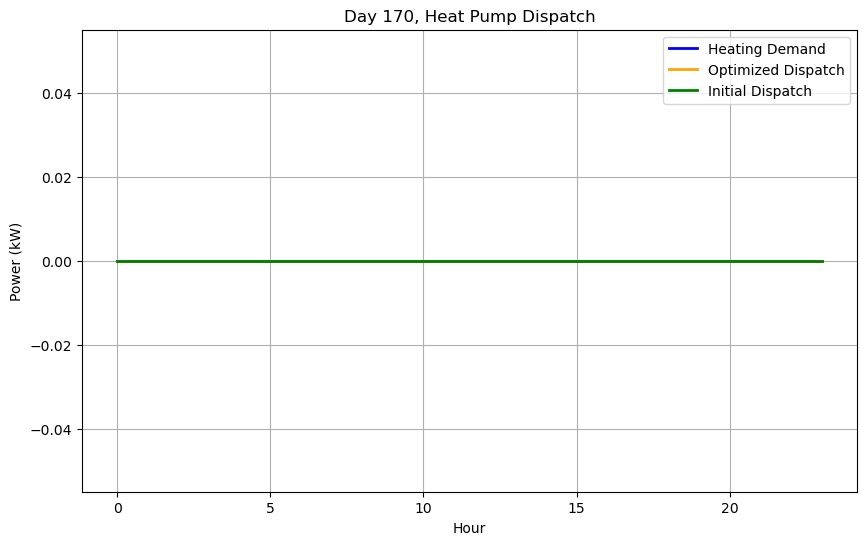


Day 171/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 27.49°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


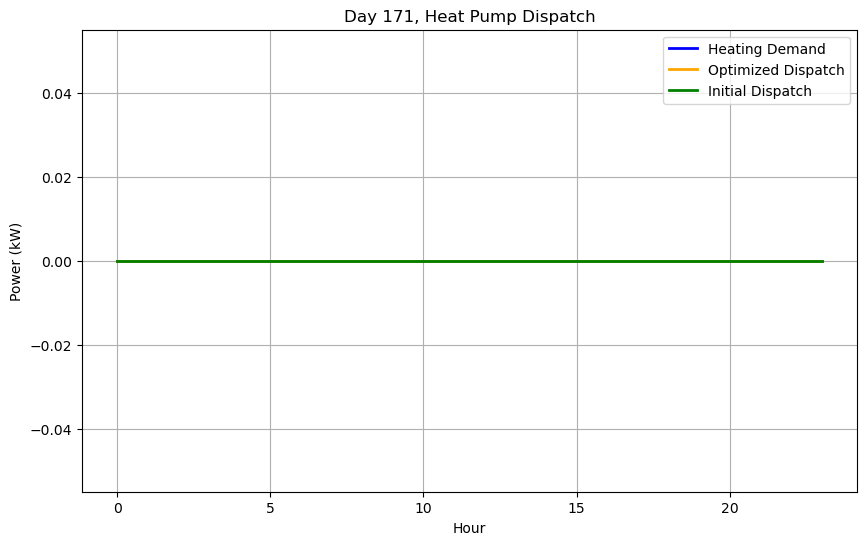


Day 172/365
Initial Guess Cost: €0.02
Optimized Daily Cost: €0.01
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.31 kWh
Buffer Tank Temperature at End of Day: 27.44°C
Optimized Dispatch: [1.16412225e-16 2.47281548e-19 0.00000000e+00 6.42483986e-19
 3.52745501e-17 1.41412864e-16 5.46771338e-17 6.68510033e-19
 1.25235837e-18 2.43689952e-19 3.84604980e-21 0.00000000e+00
 3.10324935e-21 3.69524173e-17 1.94866219e-02 0.00000000e+00
 2.59373874e-17 3.71132061e-22 3.99947442e-22 1.08271517e-16
 3.26257346e-21 1.94626908e-16 7.09236132e-21 5.29368648e-17]


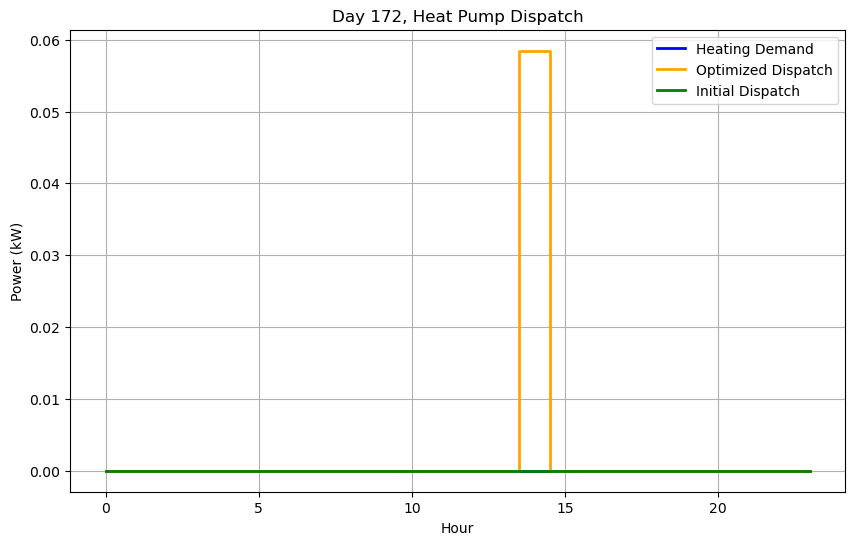


Day 173/365
Initial Guess Cost: €0.11
Optimized Daily Cost: €0.40
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 5.09 kWh
Buffer Tank Temperature at End of Day: 32.70°C
Optimized Dispatch: [6.45163112e-07 1.19229589e-07 4.80547494e-06 6.44871789e-04
 2.91563124e-02 3.10382291e-15 3.42052583e-15 3.69777156e-15
 3.61666318e-15 3.31747542e-15 3.10742291e-15 3.09192312e-15
 2.93162488e-15 2.97853937e-15 3.09771972e-15 3.09792284e-15
 3.01648714e-15 3.32079347e-15 3.40244621e-15 3.70976179e-15
 3.49173010e-15 3.52655988e-15 3.36307075e-15 3.09739005e-15]


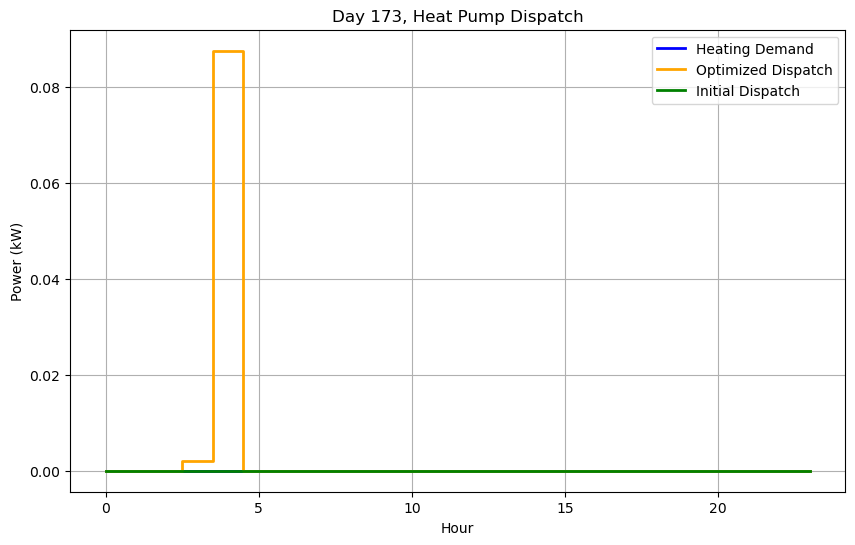


Day 174/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 32.02°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


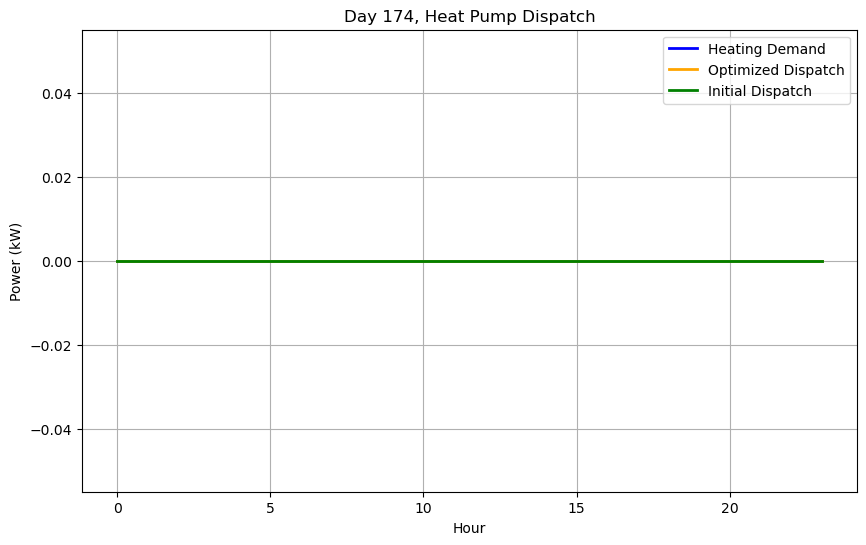


Day 175/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 31.38°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


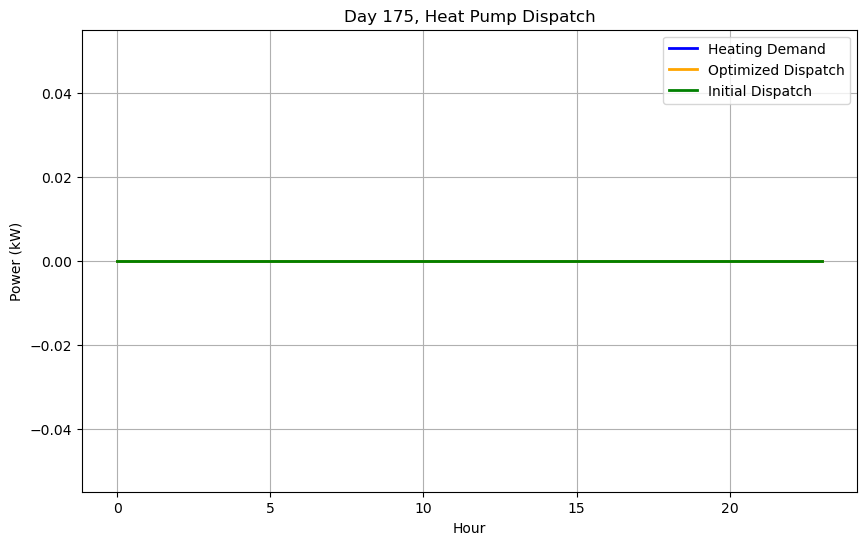


Day 176/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 30.77°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


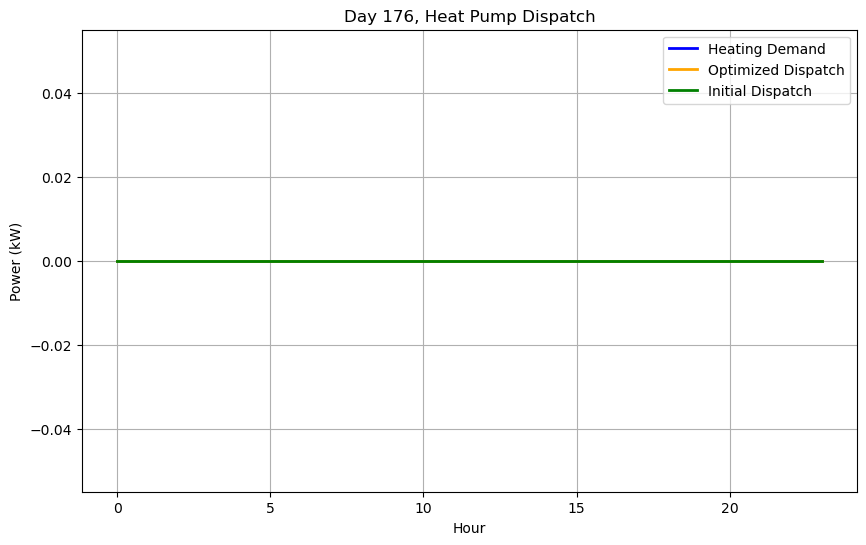


Day 177/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 30.20°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


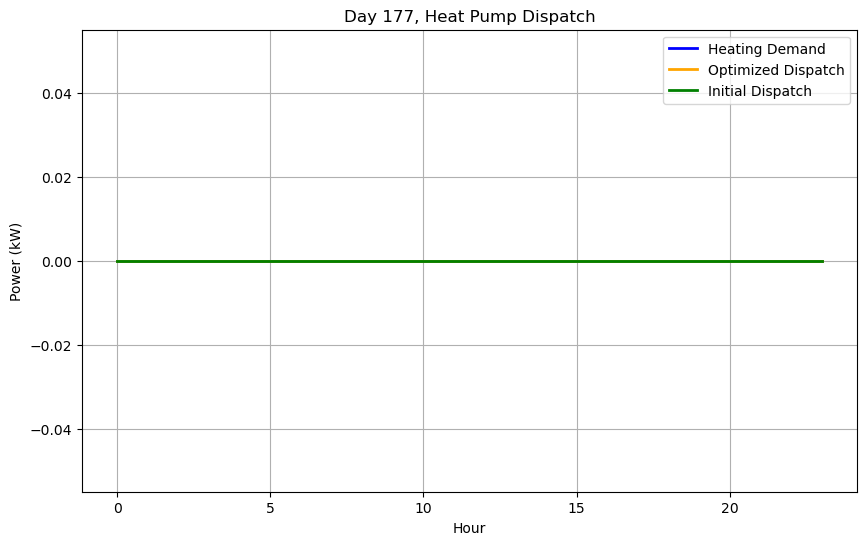


Day 178/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 29.65°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


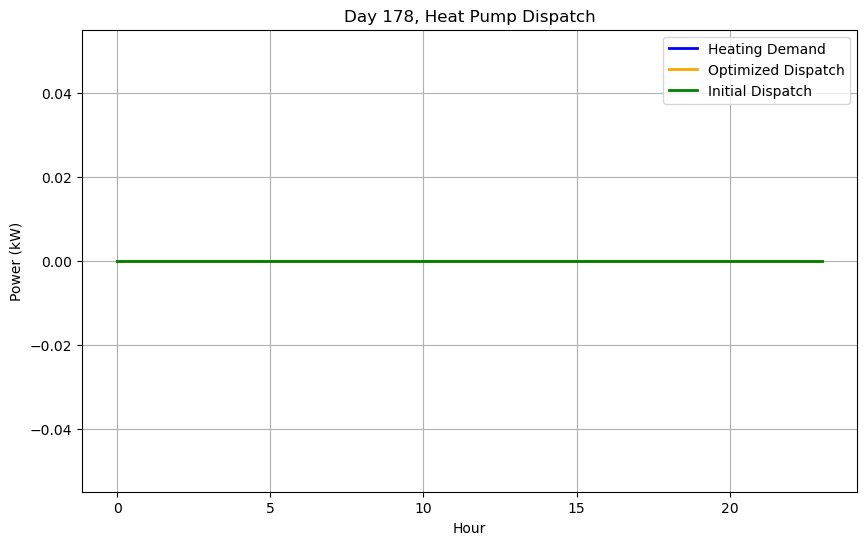


Day 179/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 29.14°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


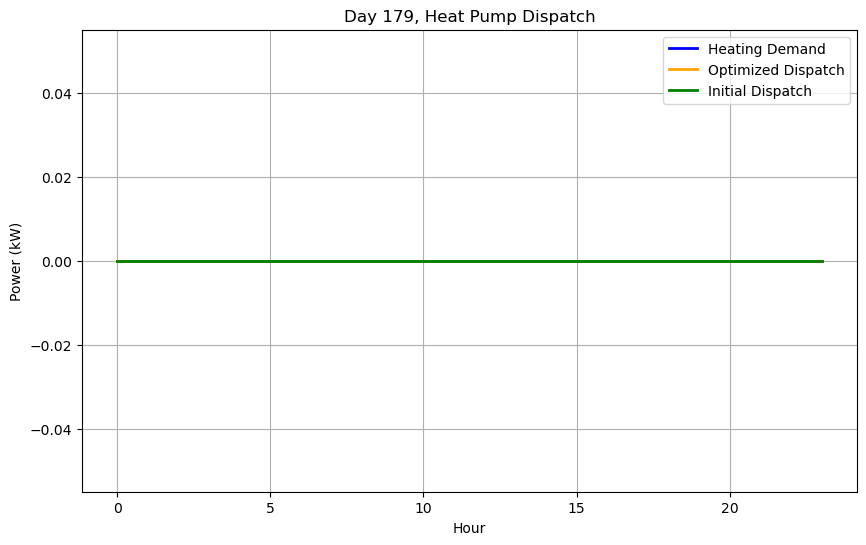


Day 180/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 28.65°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


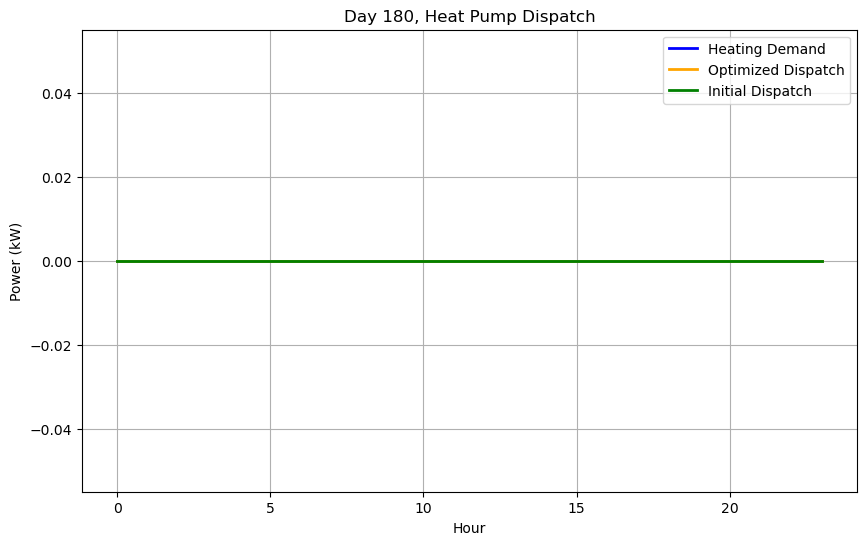


Day 181/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 28.19°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


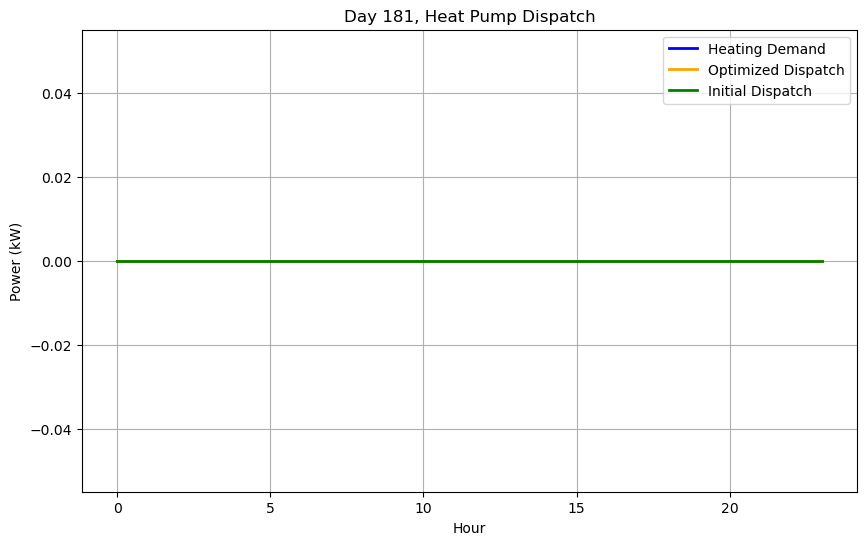


Day 182/365
Initial Guess Cost: €0.21
Optimized Daily Cost: €0.02
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.29 kWh
Buffer Tank Temperature at End of Day: 28.06°C
Optimized Dispatch: [5.97741368e-14 5.01853109e-14 4.48287672e-04 5.48967866e-03
 1.44033155e-02 5.77558121e-16 3.00762803e-12 4.68084733e-16
 4.26783289e-16 3.31346444e-16 4.27175357e-16 5.31791192e-16
 3.73544581e-16 2.69396011e-16 3.23330762e-16 2.31370813e-16
 3.16409570e-16 3.64854629e-16 4.30435306e-16 4.57270013e-16
 4.14652339e-16 6.11391293e-16 3.79169445e-16 5.59366011e-16]


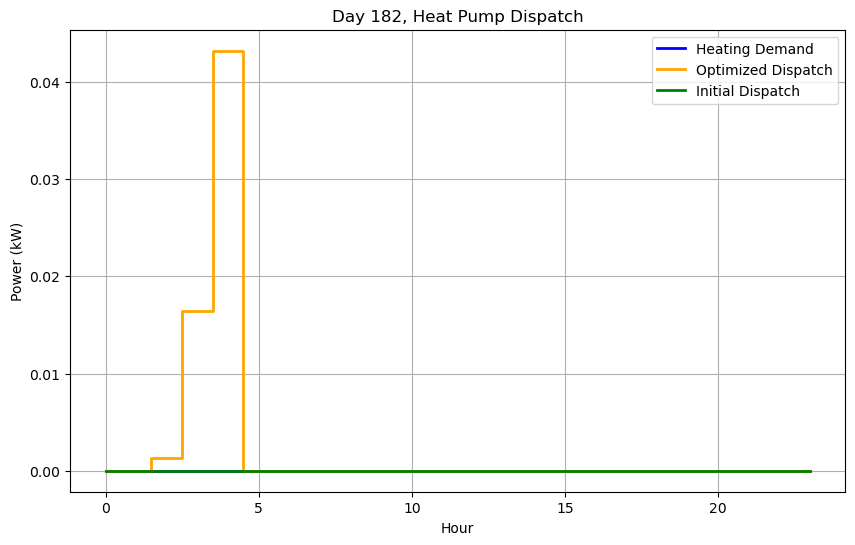


Day 183/365
Initial Guess Cost: €0.05
Optimized Daily Cost: €-2.06
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 48.88 kWh
Buffer Tank Temperature at End of Day: 82.12°C
Optimized Dispatch: [6.93006771e-03 9.02237497e-03 6.51518604e-03 1.22579077e-02
 1.80818800e-03 1.65193744e-16 1.47375043e-16 1.61993149e-16
 1.17108005e-16 1.75541966e-16 2.05805690e-16 8.69658656e-17
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 3.45894909e-17 1.28378420e-16 1.84346478e-16 1.28781830e-16
 2.79479950e-16 3.34552500e-16 3.32326252e-16 2.37780238e-16]


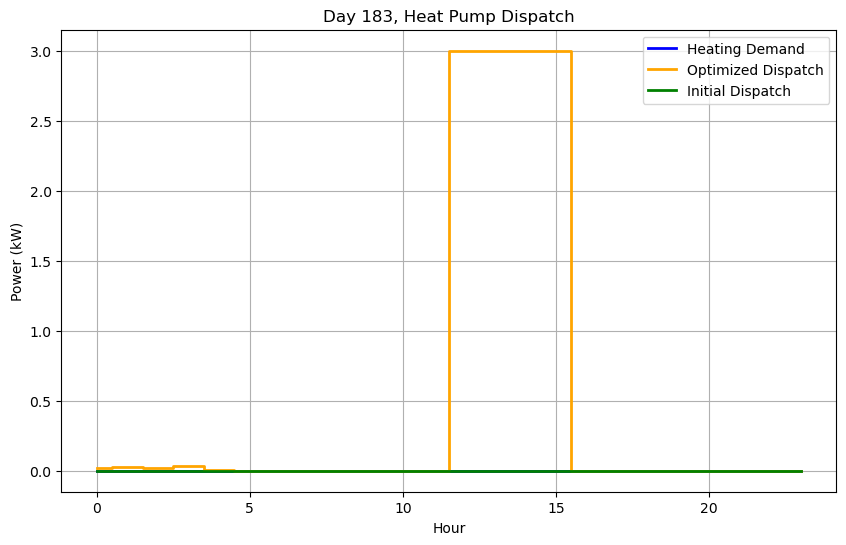


Day 184/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 78.80°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


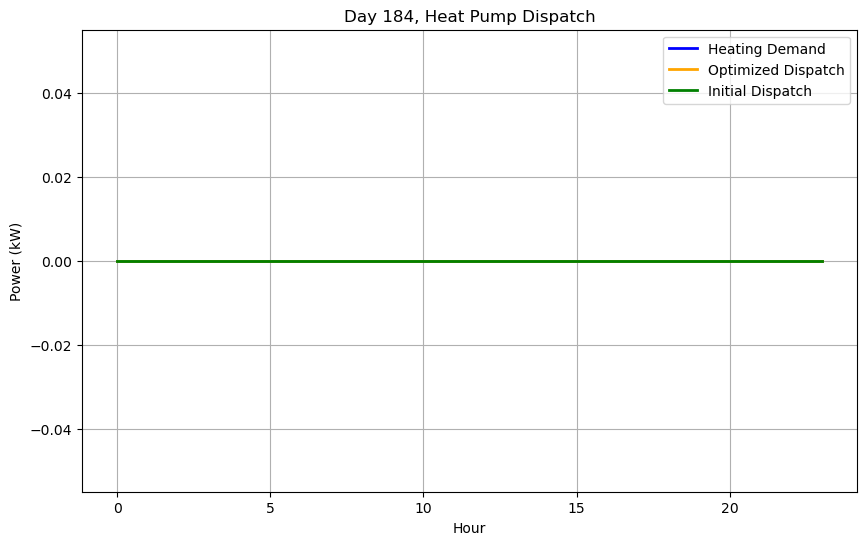


Day 185/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 75.66°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


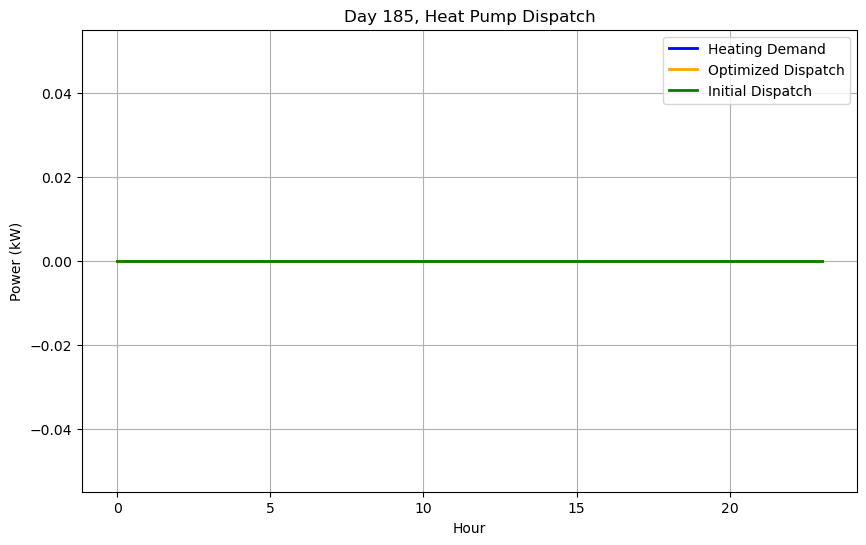


Day 186/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 72.68°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


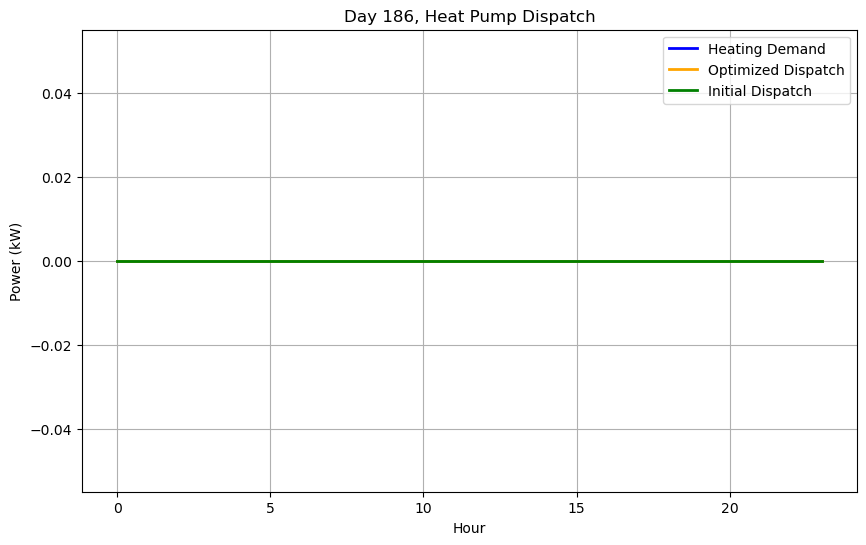


Day 187/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.10 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 69.76°C
Optimized Dispatch: [2.22044605e-16 1.11022302e-16 0.00000000e+00 0.00000000e+00
 0.00000000e+00 8.88178420e-16 3.33066907e-16 0.00000000e+00
 0.00000000e+00 0.00000000e+00 6.66133815e-16 6.66133815e-16
 0.00000000e+00 0.00000000e+00 0.00000000e+00 3.33066907e-16
 0.00000000e+00 0.00000000e+00 0.00000000e+00 2.22044605e-16
 0.00000000e+00 6.66133815e-16 0.00000000e+00 0.00000000e+00]


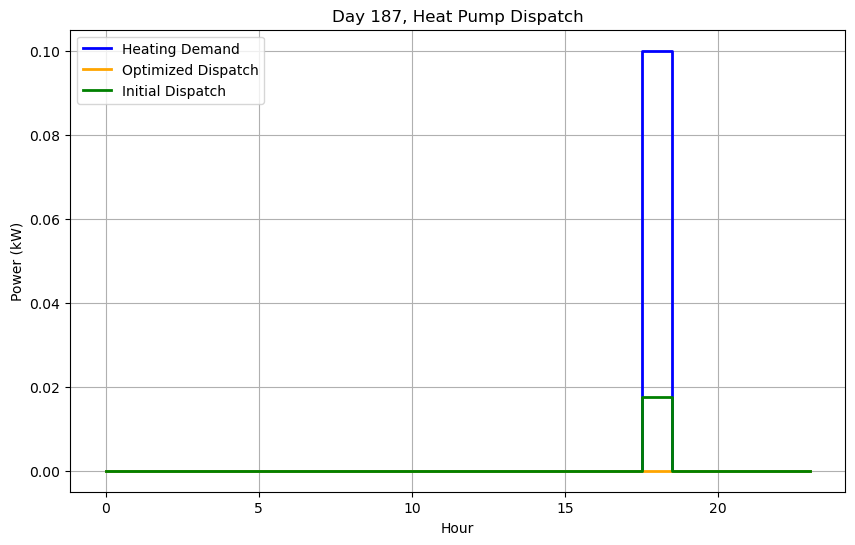


Day 188/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 67.10°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


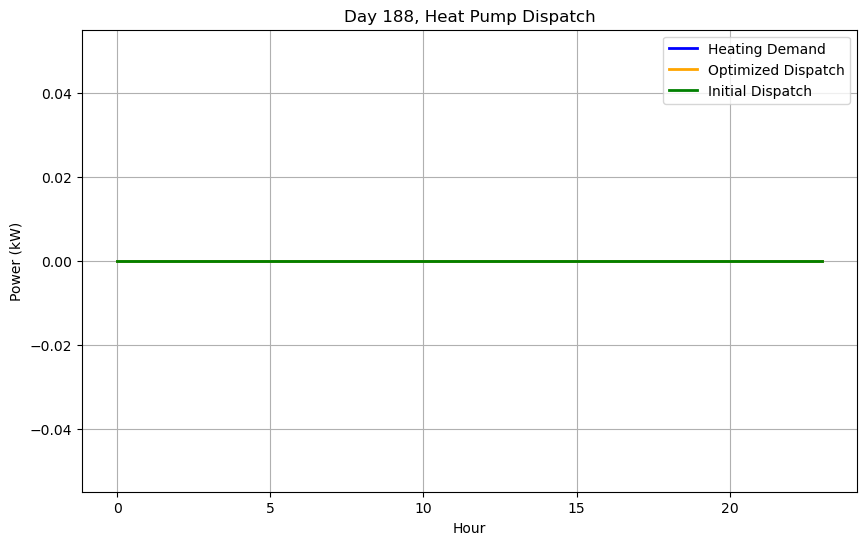


Day 189/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 64.58°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


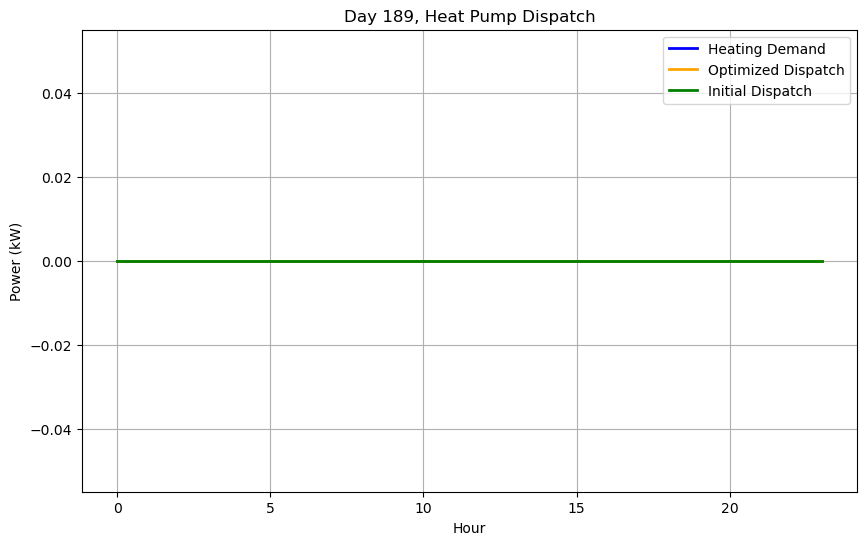


Day 190/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 62.20°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


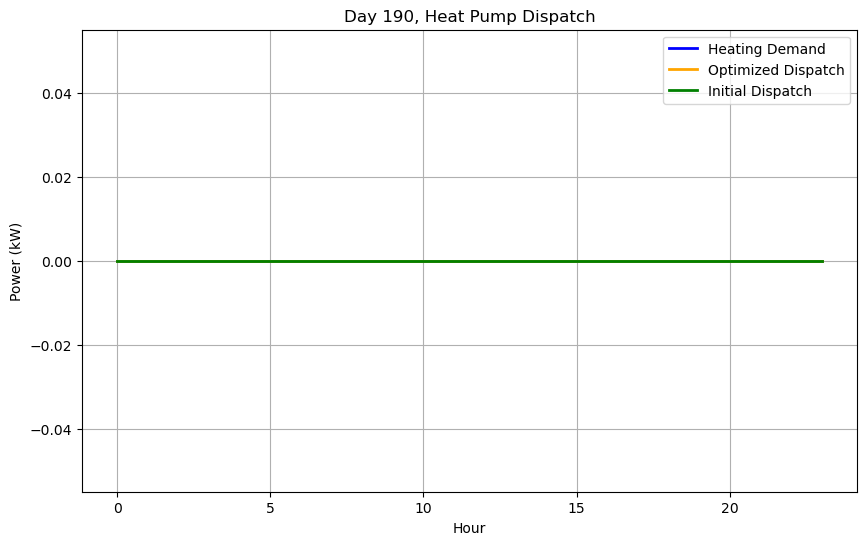


Day 191/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 59.94°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


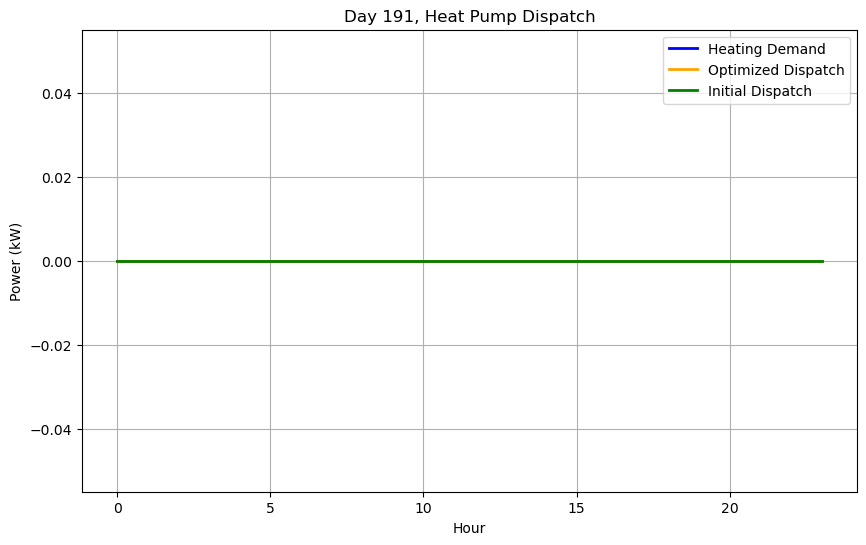


Day 192/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 57.81°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


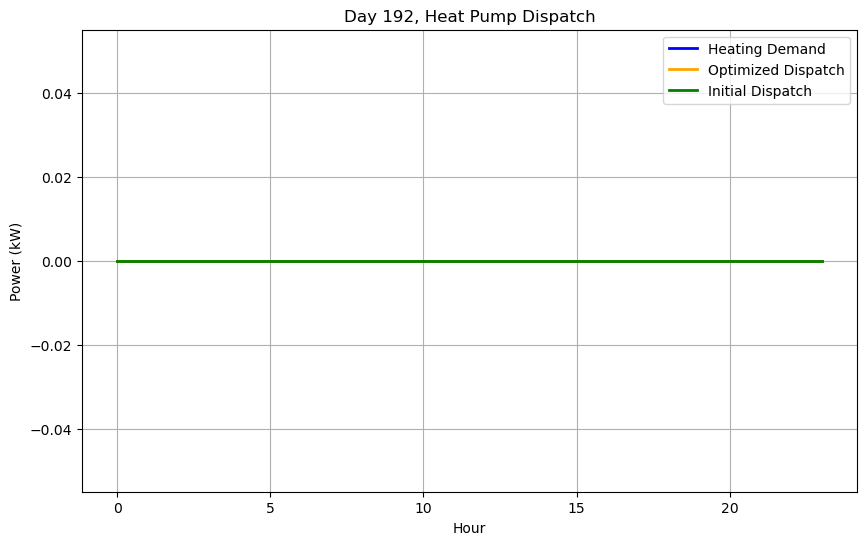


Day 193/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 55.79°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


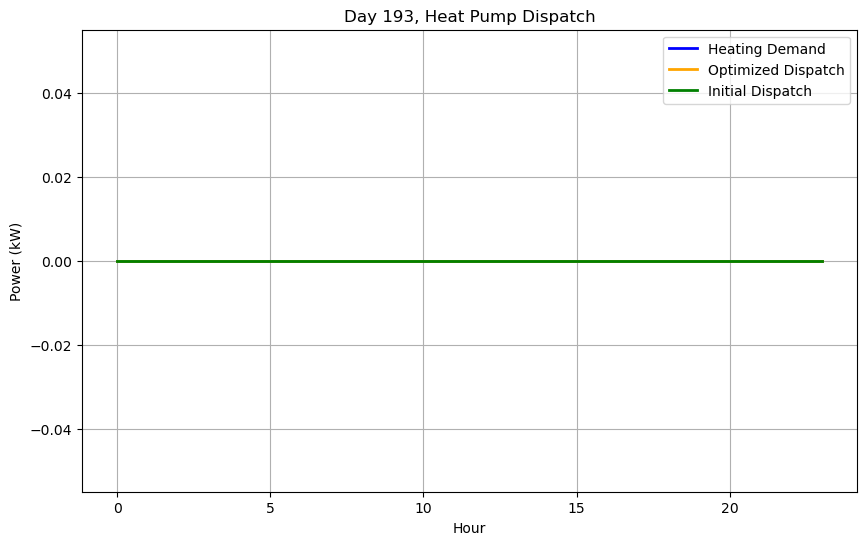


Day 194/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 53.88°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


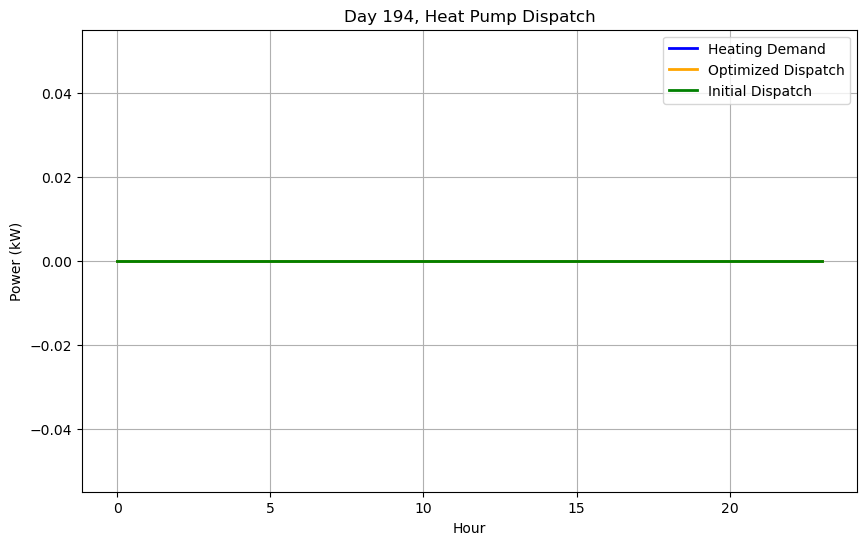


Day 195/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 52.07°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


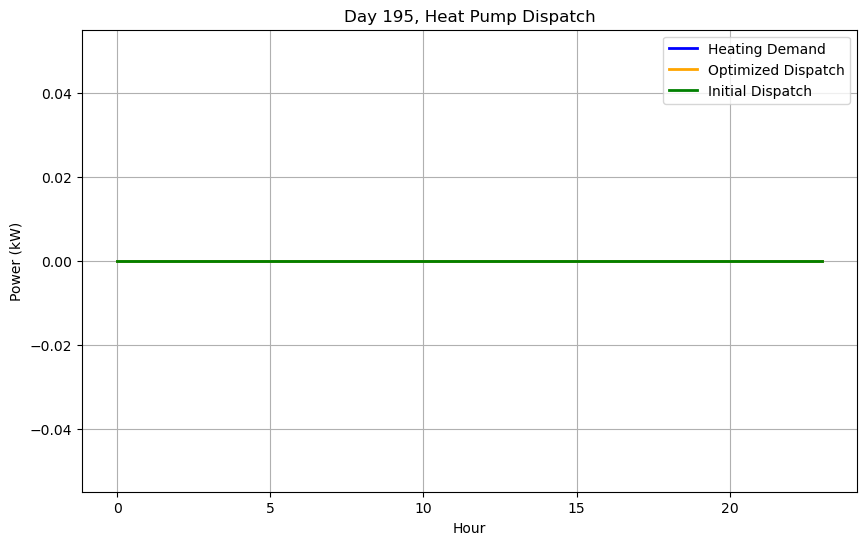


Day 196/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 50.35°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


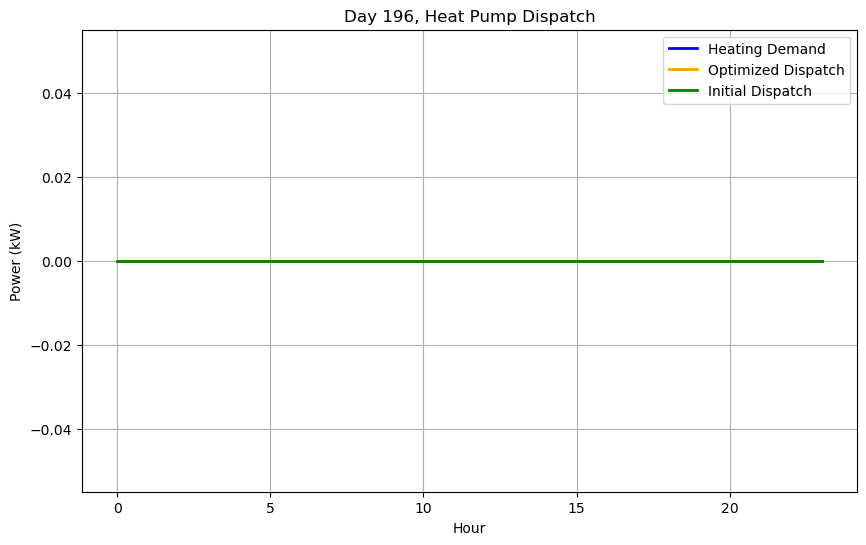


Day 197/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 48.73°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


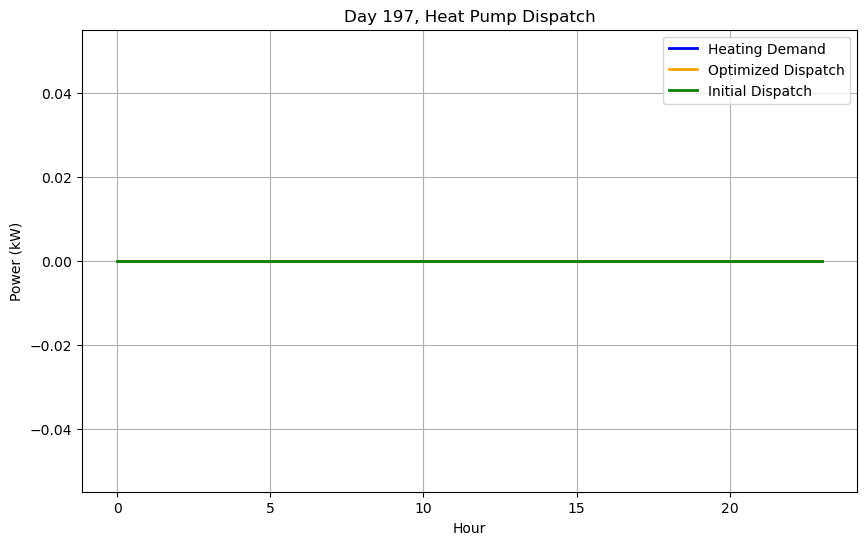


Day 198/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 47.19°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


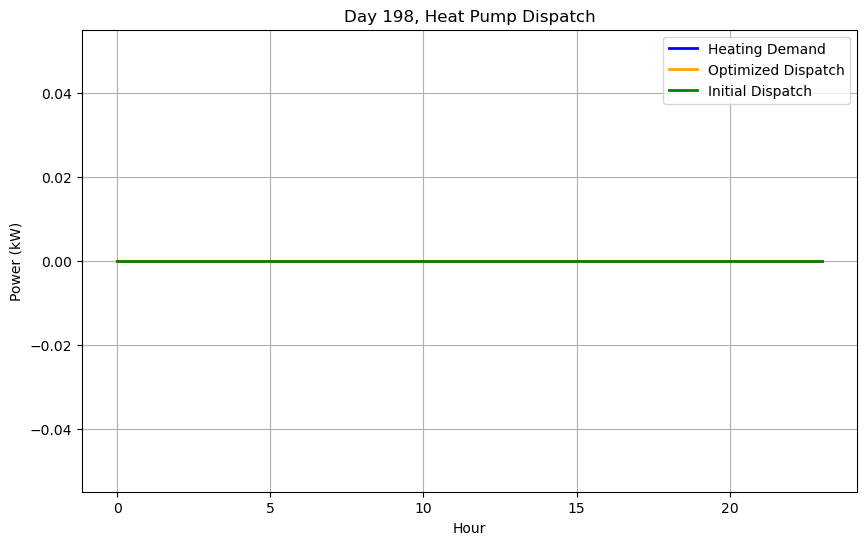


Day 199/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 45.74°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


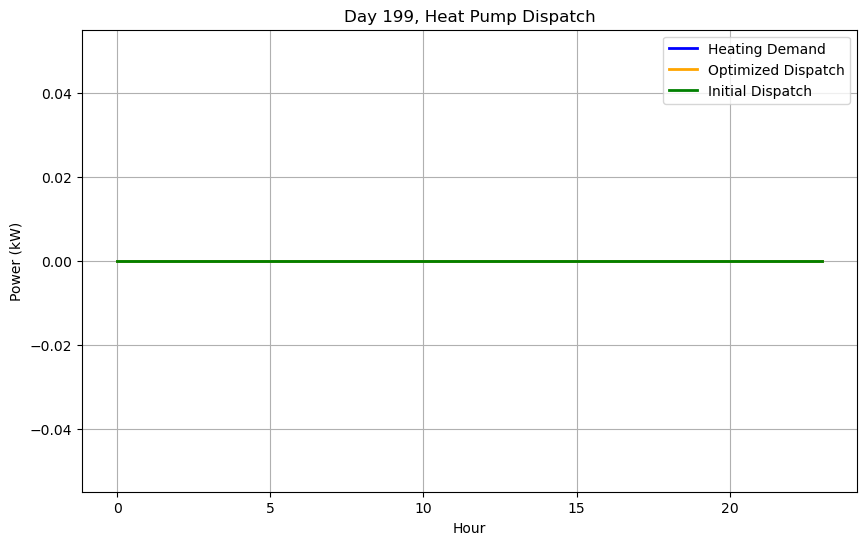


Day 200/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 44.37°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


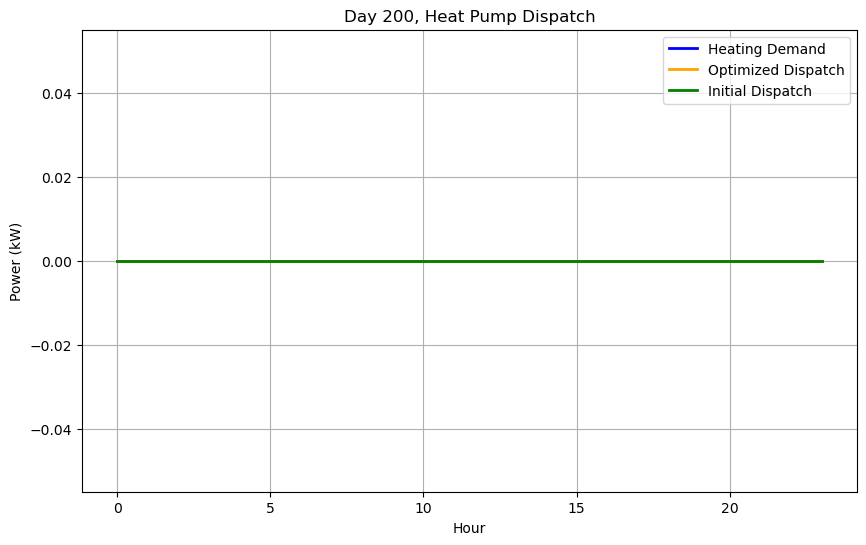


Day 201/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 43.06°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


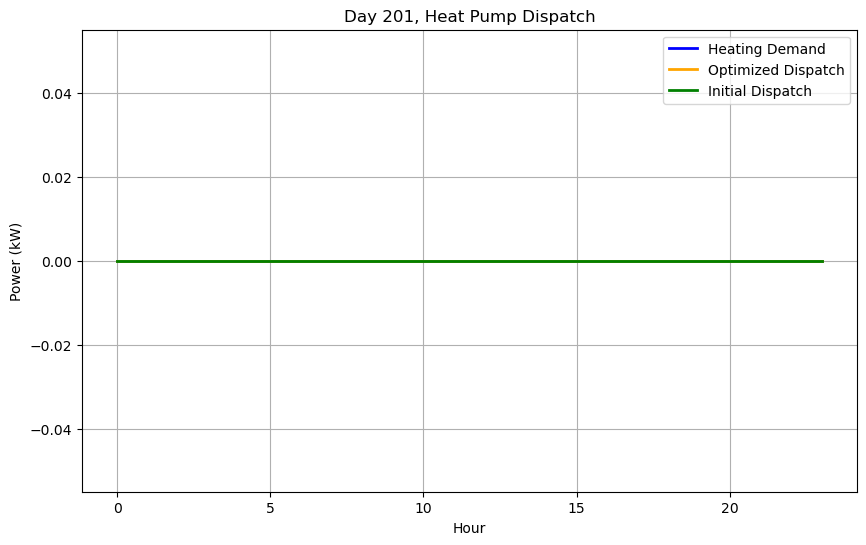


Day 202/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 41.83°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


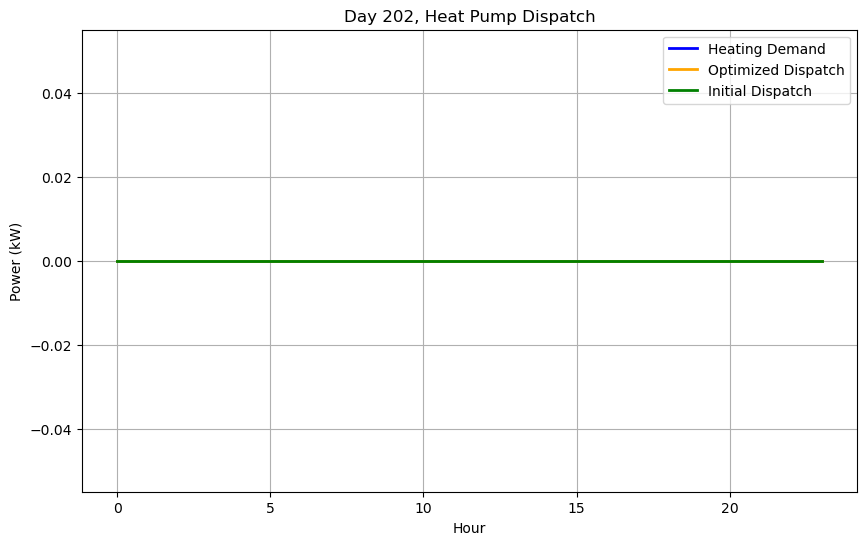


Day 203/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 40.66°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


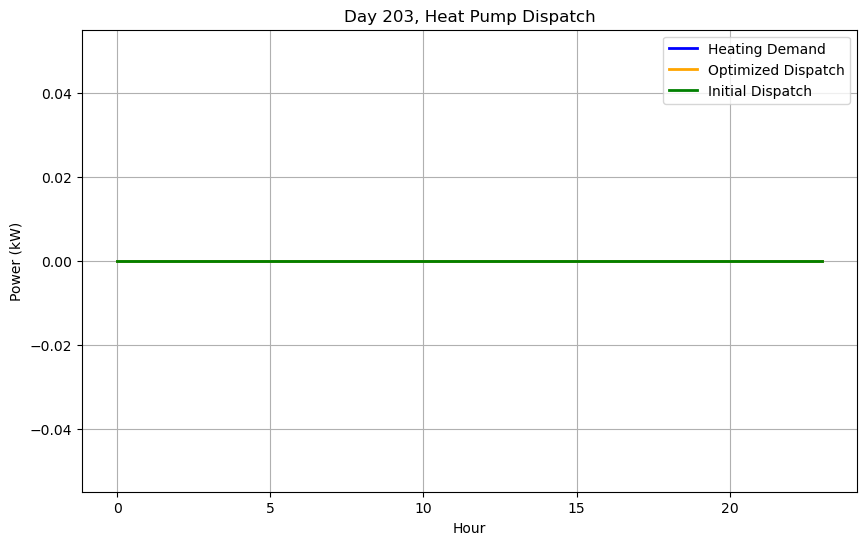


Day 204/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 39.56°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


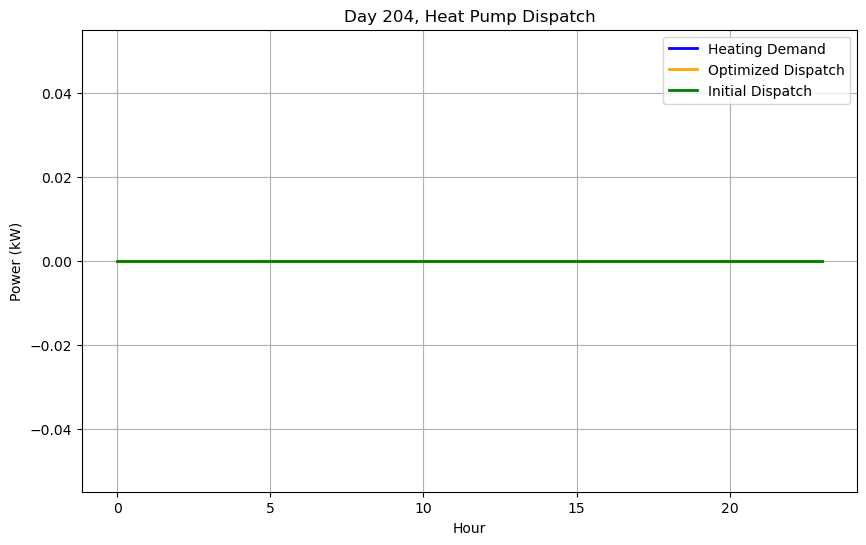


Day 205/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 38.52°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


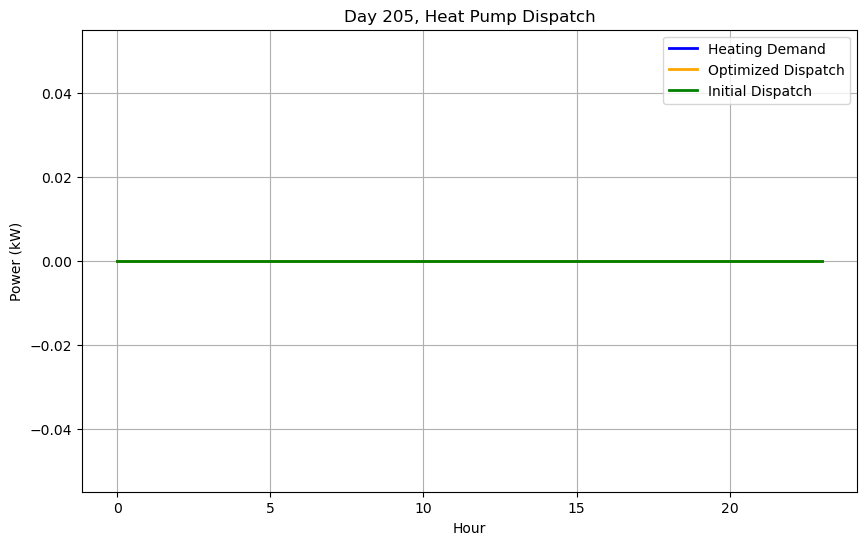


Day 206/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 37.53°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


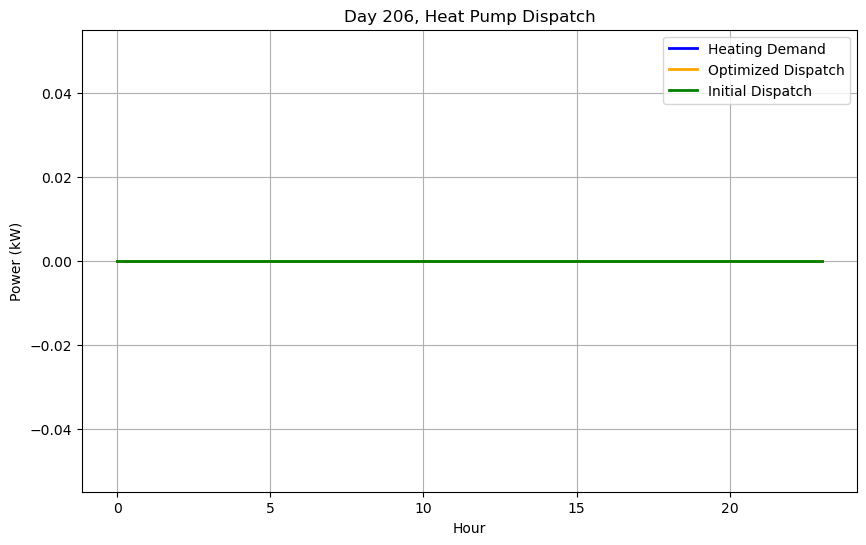


Day 207/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 36.59°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


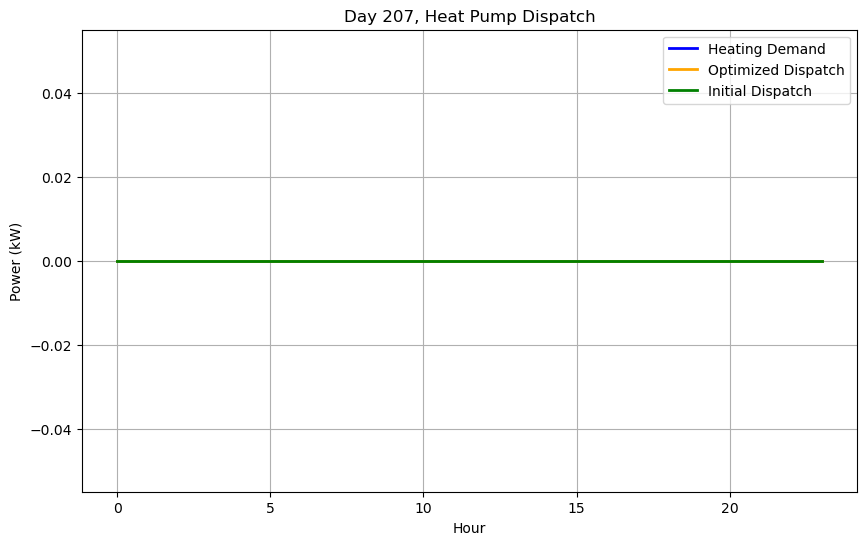


Day 208/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 35.70°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


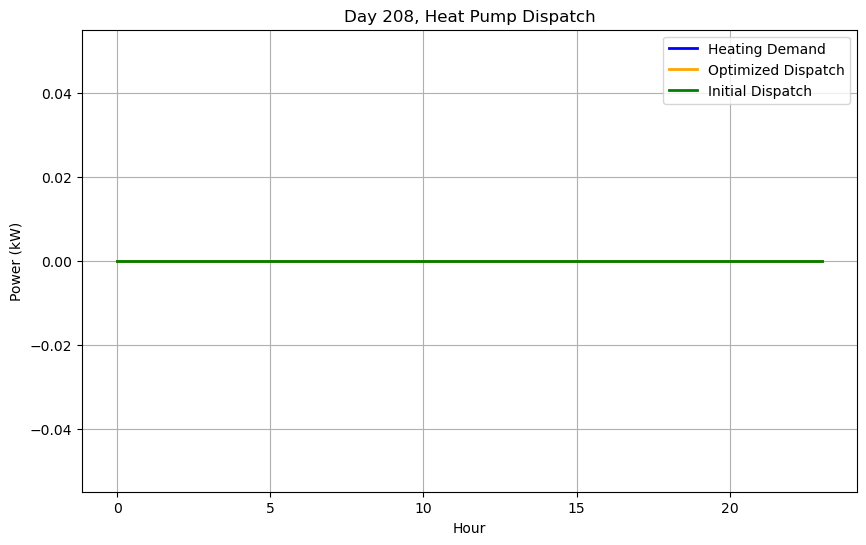


Day 209/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 34.86°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


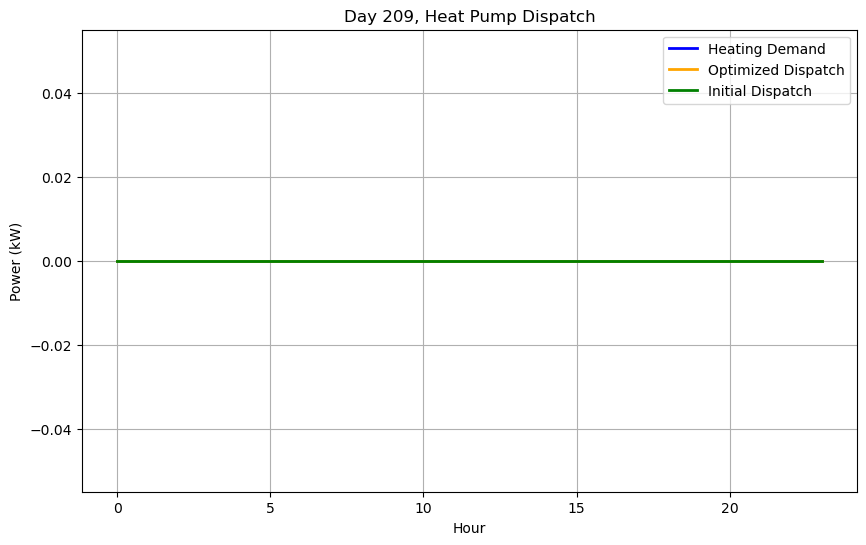


Day 210/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 34.07°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


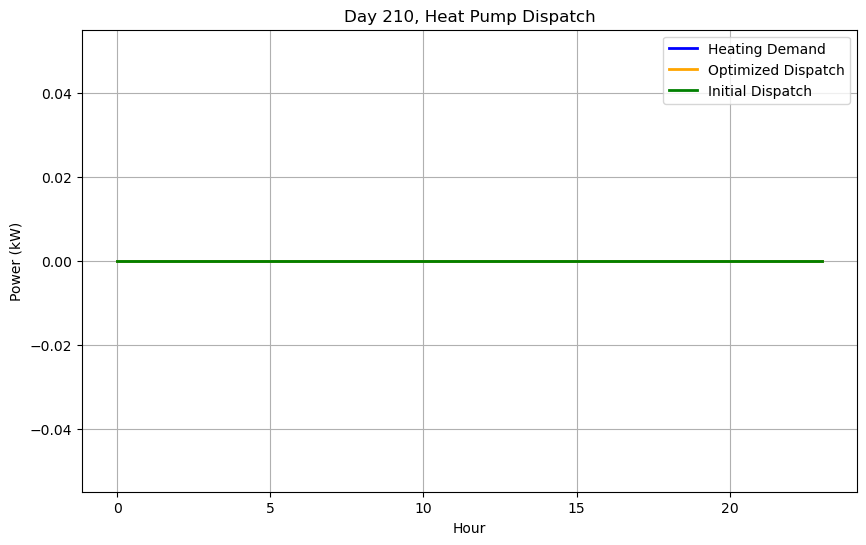


Day 211/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 33.32°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


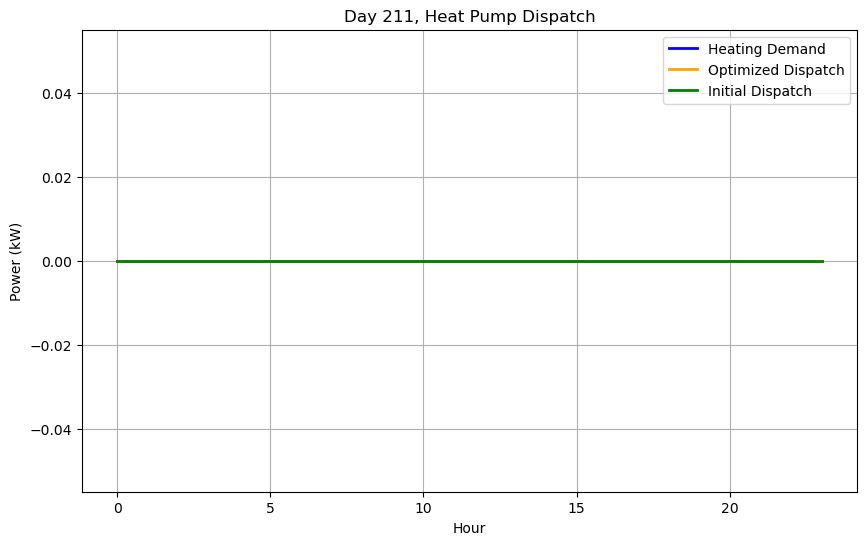


Day 212/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 32.61°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


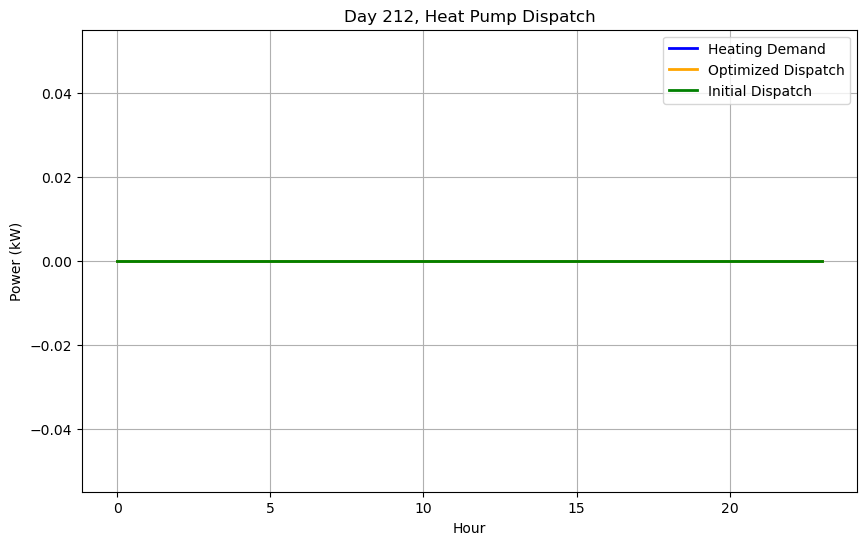


Day 213/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 31.93°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


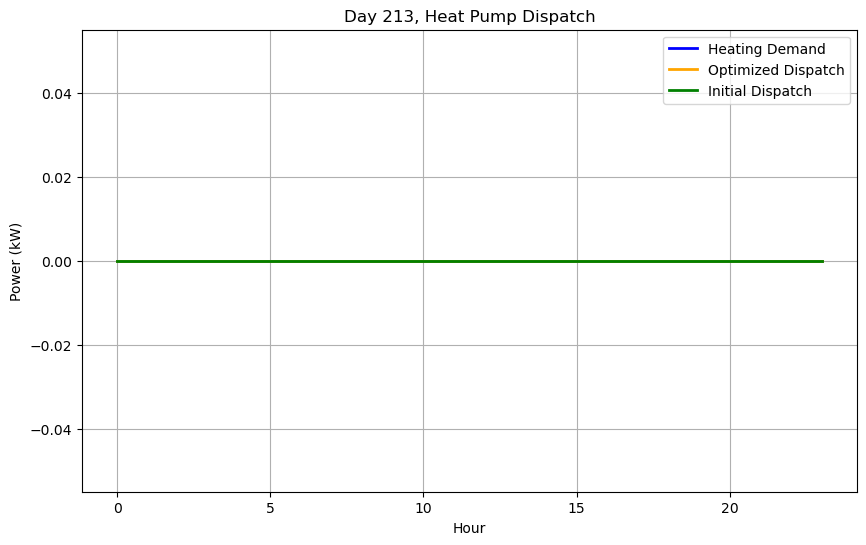


Day 214/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 31.29°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


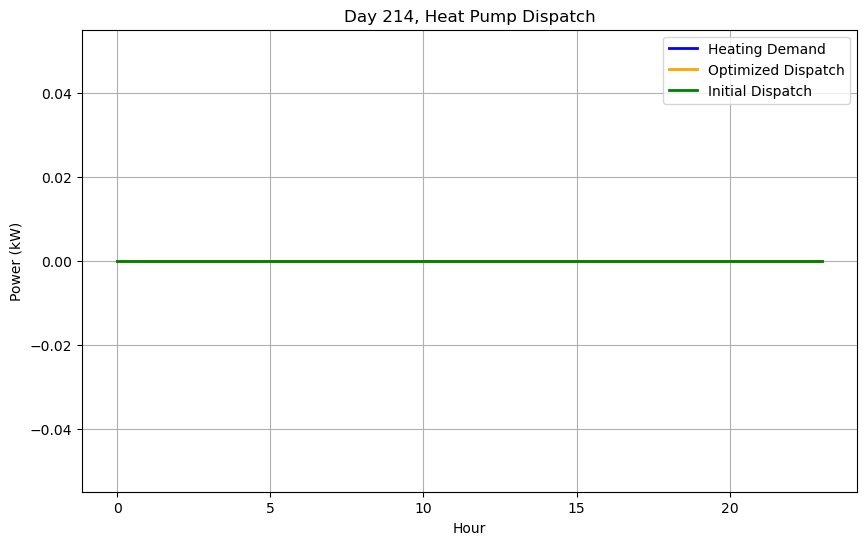


Day 215/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 30.69°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


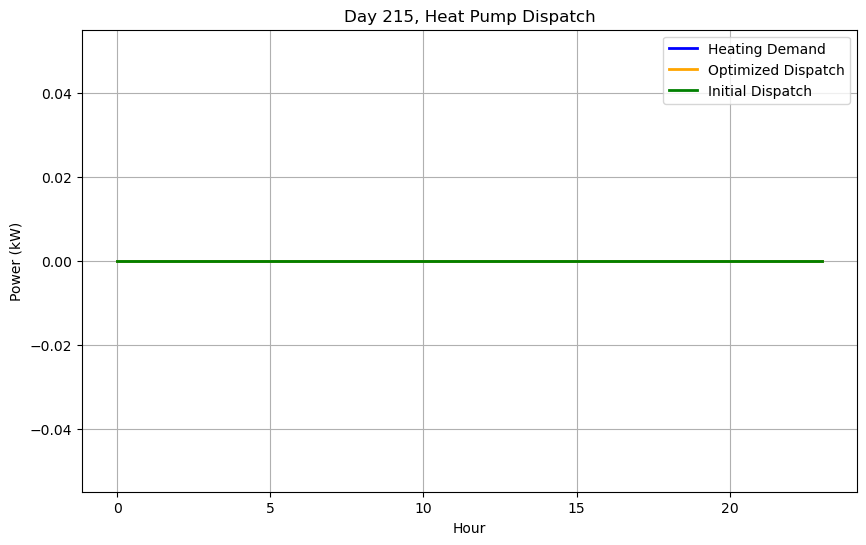


Day 216/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 30.12°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


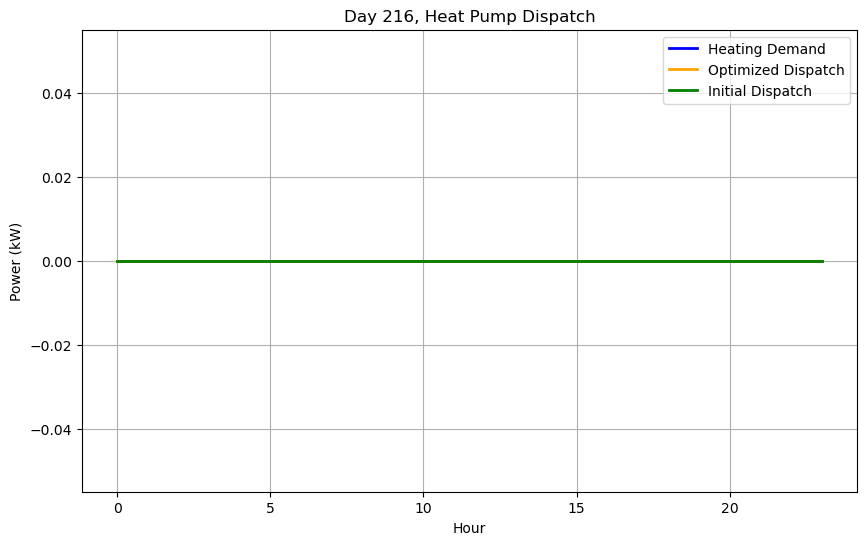


Day 217/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 29.58°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


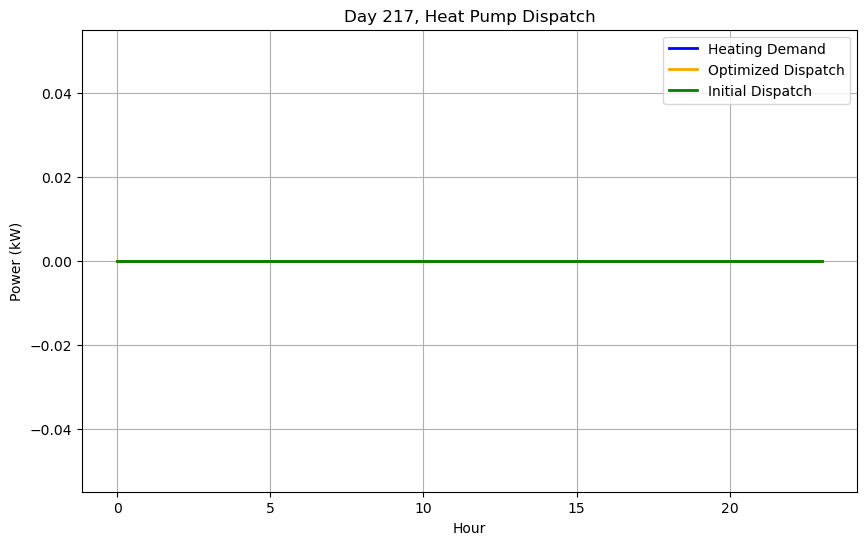


Day 218/365
Initial Guess Cost: €0.01
Optimized Daily Cost: €0.01
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.27 kWh
Buffer Tank Temperature at End of Day: 29.37°C
Optimized Dispatch: [5.27119123e-17 3.58059812e-17 1.19589429e-17 1.05299335e-16
 8.21396927e-17 5.44007955e-17 4.28232437e-19 7.35273409e-17
 1.19331621e-17 1.04523991e-16 7.55169700e-17 3.09687775e-20
 1.31496050e-17 1.92497344e-02 5.37618560e-08 2.29371073e-08
 5.71321115e-08 1.81423234e-17 1.96341181e-19 1.66448550e-19
 6.53401503e-17 6.06755872e-20 4.17756947e-17 8.65317156e-17]


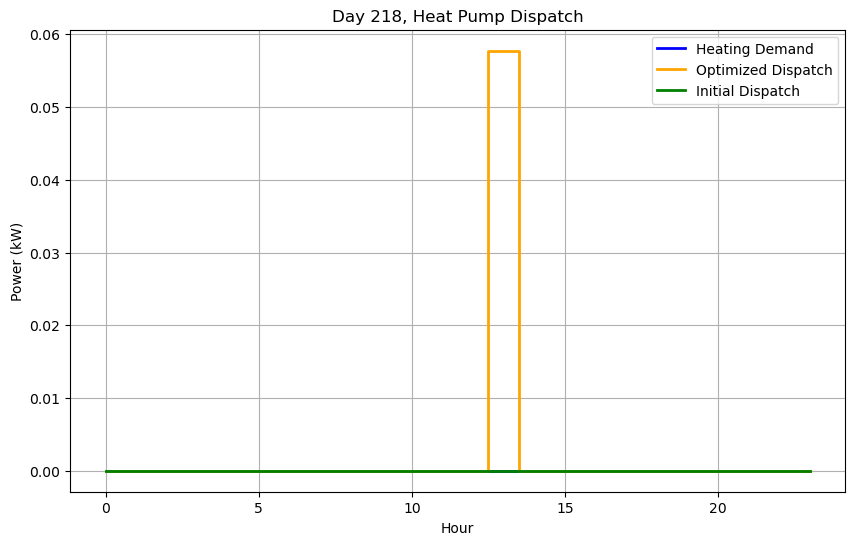


Day 219/365
Initial Guess Cost: €0.04
Optimized Daily Cost: €0.03
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.61 kWh
Buffer Tank Temperature at End of Day: 29.54°C
Optimized Dispatch: [1.86618542e-17 1.65395010e-19 1.16675002e-18 2.40094436e-20
 0.00000000e+00 5.74903251e-18 2.52252660e-03 1.73746444e-17
 1.70763100e-17 1.54987091e-17 5.06237250e-04 7.91610495e-04
 9.24632443e-04 1.02939509e-03 1.10705173e-03 1.45270404e-03
 1.41375494e-03 1.53861397e-03 1.72999616e-03 5.71062587e-04
 4.11713908e-05 1.78301286e-05 9.42762622e-04 9.55306906e-04]


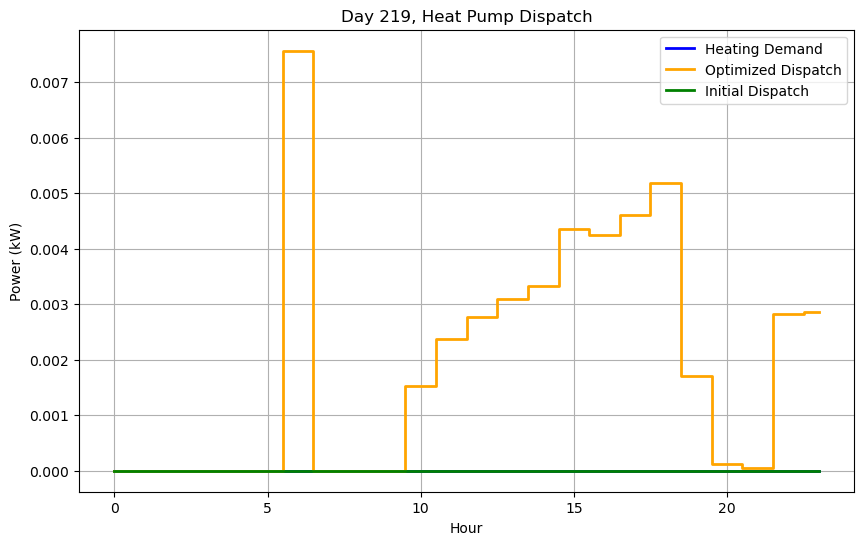


Day 220/365
Initial Guess Cost: €0.03
Optimized Daily Cost: €0.01
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.15 kWh
Buffer Tank Temperature at End of Day: 29.19°C
Optimized Dispatch: [4.95950871e-16 3.64127986e-09 2.19119723e-09 2.60857997e-09
 3.09838651e-22 2.23907351e-03 2.18880970e-22 0.00000000e+00
 0.00000000e+00 4.48714364e-33 3.83041698e-22 1.64160728e-22
 0.00000000e+00 0.00000000e+00 0.00000000e+00 2.73601213e-22
 0.00000000e+00 5.47202426e-23 1.64160728e-22 0.00000000e+00
 3.28321455e-22 7.66083396e-22 2.18880970e-22 0.00000000e+00]


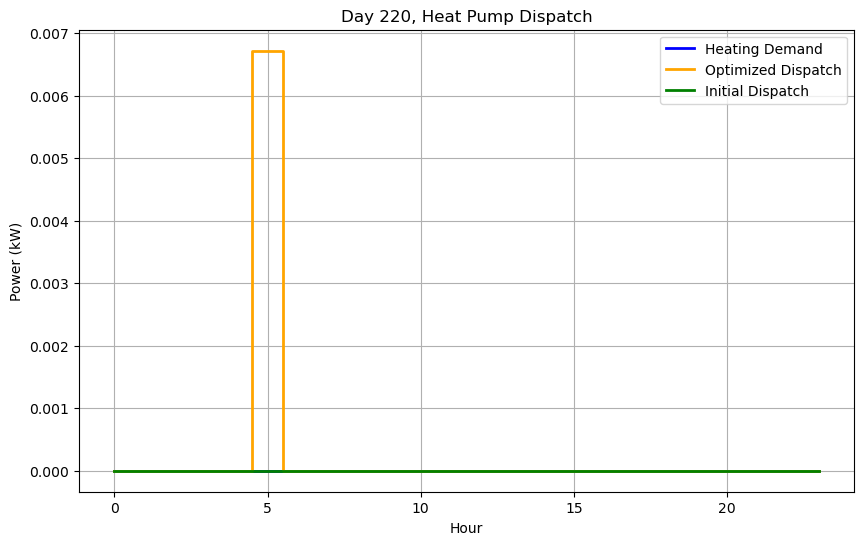


Day 221/365
Initial Guess Cost: €0.03
Optimized Daily Cost: €0.02
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.55 kWh
Buffer Tank Temperature at End of Day: 29.32°C
Optimized Dispatch: [1.28251201e-18 1.91606725e-17 5.13238827e-17 2.36053890e-17
 7.07843982e-17 7.69585310e-17 3.89671875e-17 6.50800496e-17
 9.37547868e-18 9.51413008e-18 4.06396213e-17 7.95211961e-17
 5.75362629e-17 7.24811263e-19 3.82820064e-02 5.48031641e-17
 2.87731699e-17 2.72791377e-17 9.22758138e-21 4.28682479e-17
 4.58179511e-17 6.86347927e-17 8.96831032e-20 3.61901187e-17]


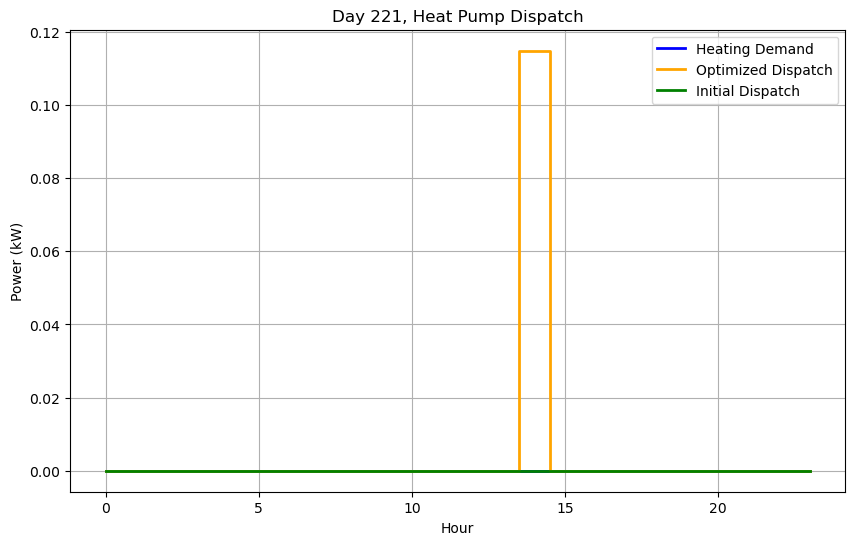


Day 222/365
Initial Guess Cost: €0.19
Optimized Daily Cost: €0.04
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.59 kWh
Buffer Tank Temperature at End of Day: 29.46°C
Optimized Dispatch: [1.30447201e-08 9.11276333e-07 4.70754890e-07 8.04477089e-11
 1.06133908e-02 2.84174799e-14 3.32518744e-14 4.00314596e-14
 3.05452869e-14 2.88451368e-14 2.73775428e-14 2.56660430e-14
 2.56672614e-14 2.32072723e-14 2.40934714e-14 2.51418436e-14
 2.61451896e-14 2.86430227e-14 2.97308013e-14 3.75038076e-14
 4.19568542e-14 3.44950979e-14 3.09858716e-14 2.95371531e-14]


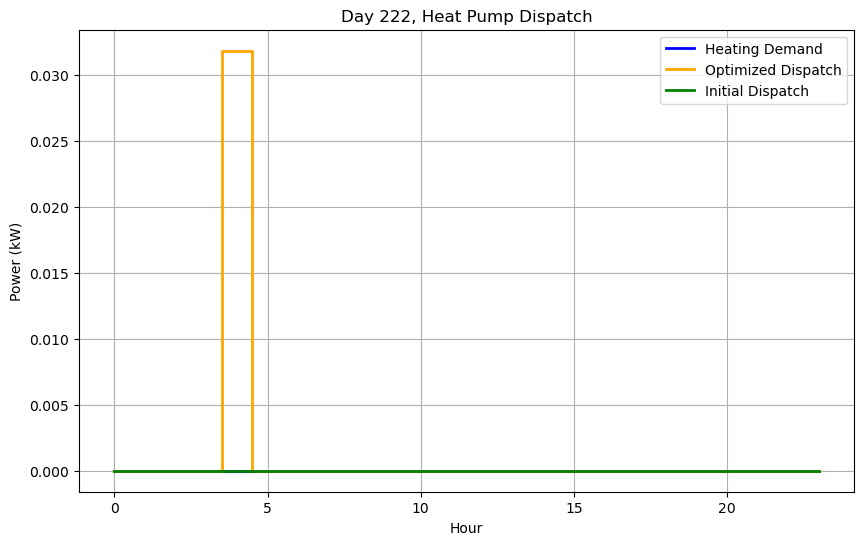


Day 223/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 28.95°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


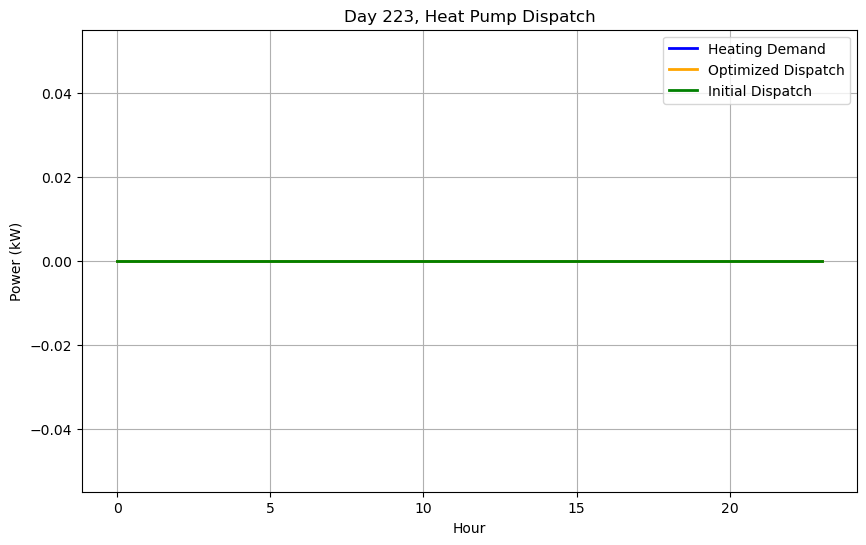


Day 224/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 28.48°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


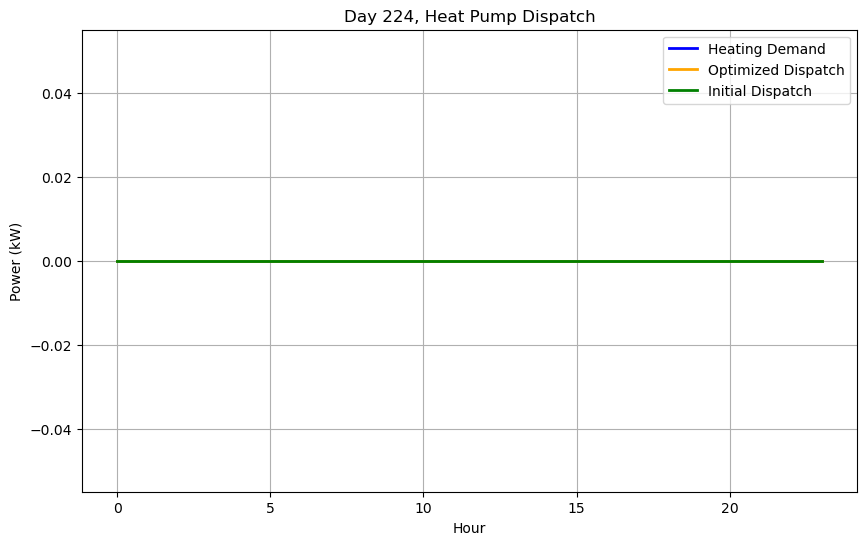


Day 225/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 28.02°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


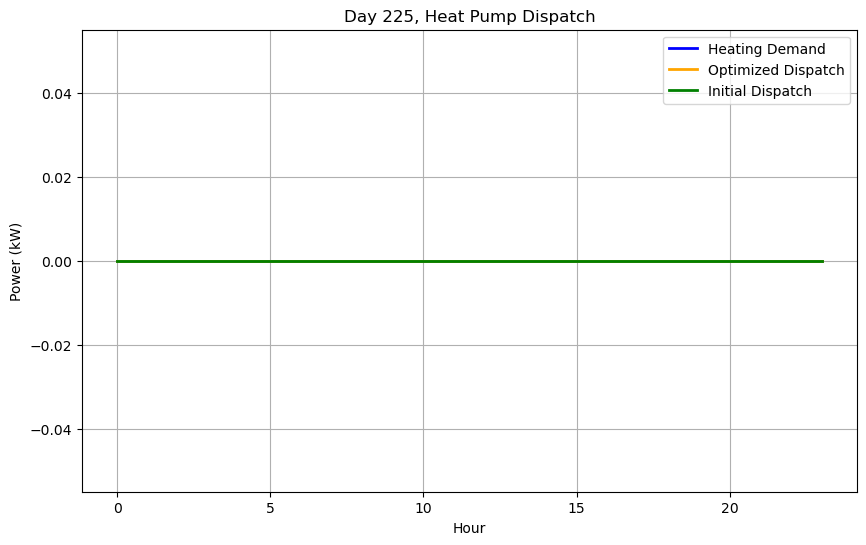


Day 226/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 27.59°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


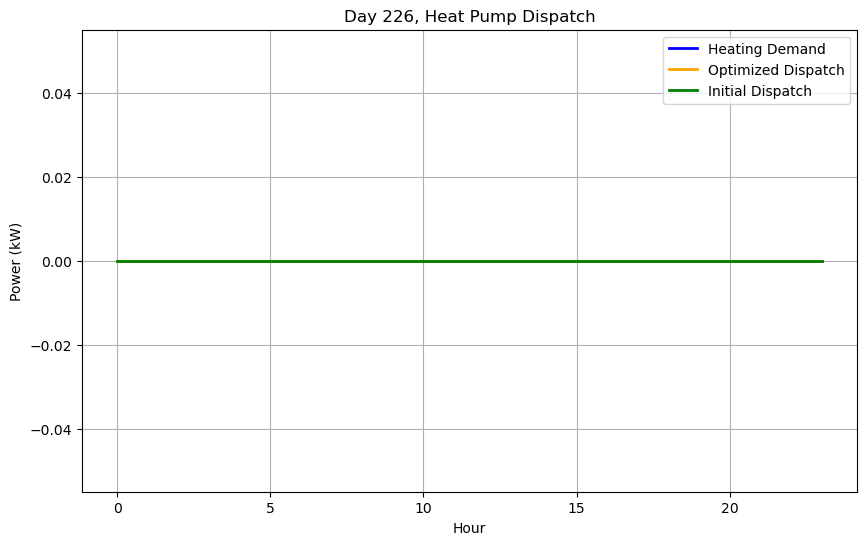


Day 227/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 27.19°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


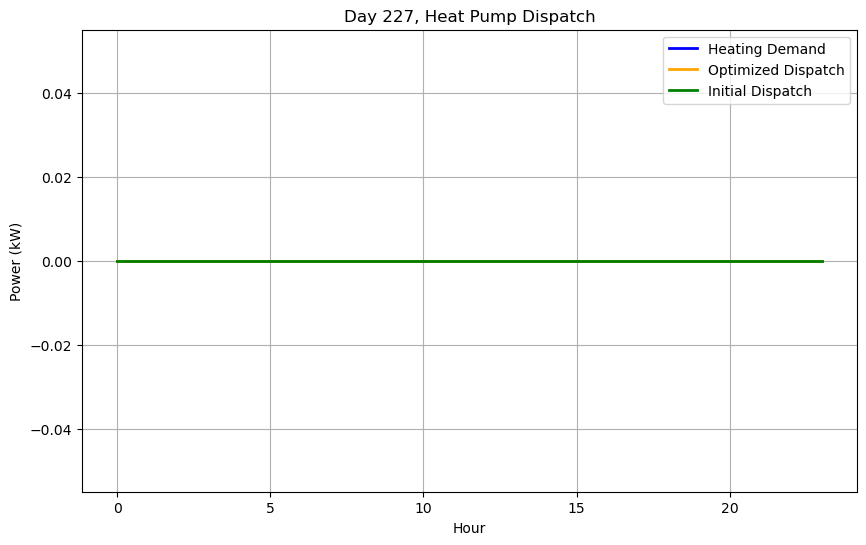


Day 228/365
Initial Guess Cost: €0.06
Optimized Daily Cost: €0.04
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.60 kWh
Buffer Tank Temperature at End of Day: 27.46°C
Optimized Dispatch: [1.19864396e-03 1.55815409e-15 1.20105640e-15 5.85945892e-03
 1.16862972e-02 1.56564528e-15 4.82489445e-16 9.45992608e-16
 1.06170193e-15 1.33496705e-15 8.77802745e-16 5.03602696e-16
 7.29946036e-16 9.91964858e-16 4.19899776e-17 6.88866352e-16
 8.83864727e-16 3.88788498e-16 5.76937368e-19 1.16640795e-15
 1.13990249e-16 1.05212709e-15 6.35621164e-17 1.06784142e-17]


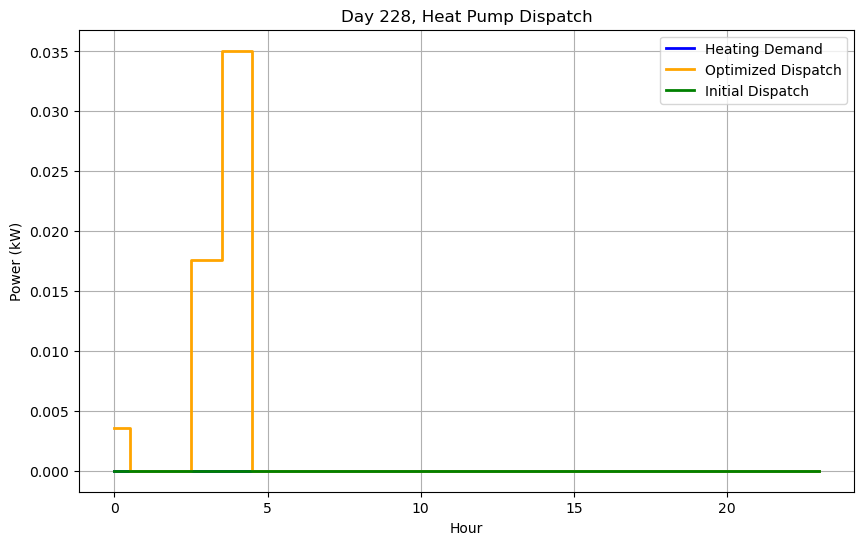


Day 229/365
Initial Guess Cost: €0.12
Optimized Daily Cost: €0.03
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.70 kWh
Buffer Tank Temperature at End of Day: 27.83°C
Optimized Dispatch: [4.72929003e-08 5.05183550e-08 1.98947848e-03 4.39974338e-03
 4.91933523e-08 1.34313430e-02 7.51109765e-13 7.38526202e-13
 7.34332894e-13 7.27976530e-13 7.21746144e-13 7.13173777e-13
 9.51647906e-06 1.15689942e-03 2.18487991e-02 6.76416128e-13
 6.04054303e-13 5.96067909e-13 5.92887717e-13 5.90062589e-13
 5.90123901e-13 5.89047983e-13 5.91286493e-13 5.91786102e-13]


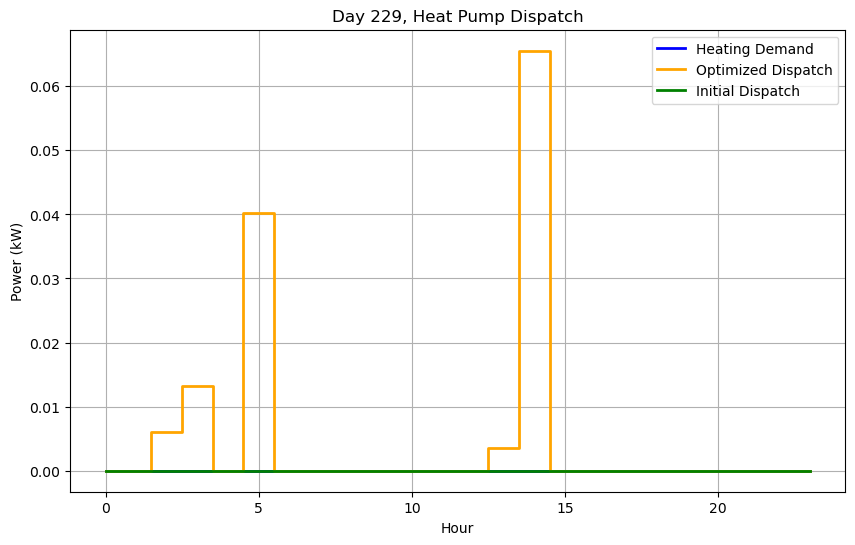


Day 230/365
Initial Guess Cost: €0.08
Optimized Daily Cost: €0.04
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.72 kWh
Buffer Tank Temperature at End of Day: 28.20°C
Optimized Dispatch: [5.85204388e-04 5.57599596e-05 8.71741943e-03 8.97161854e-03
 8.07036601e-03 1.16063348e-02 2.09925361e-11 1.08180210e-11
 1.74376732e-11 3.99253922e-11 1.49145558e-11 1.42181736e-11
 3.30464805e-11 1.18606170e-13 1.33437342e-12 5.70676634e-11
 1.23501416e-10 7.31849955e-11 2.34976147e-13 6.26663281e-11
 5.03769111e-11 1.03810793e-13 3.36753899e-13 3.35812156e-11]


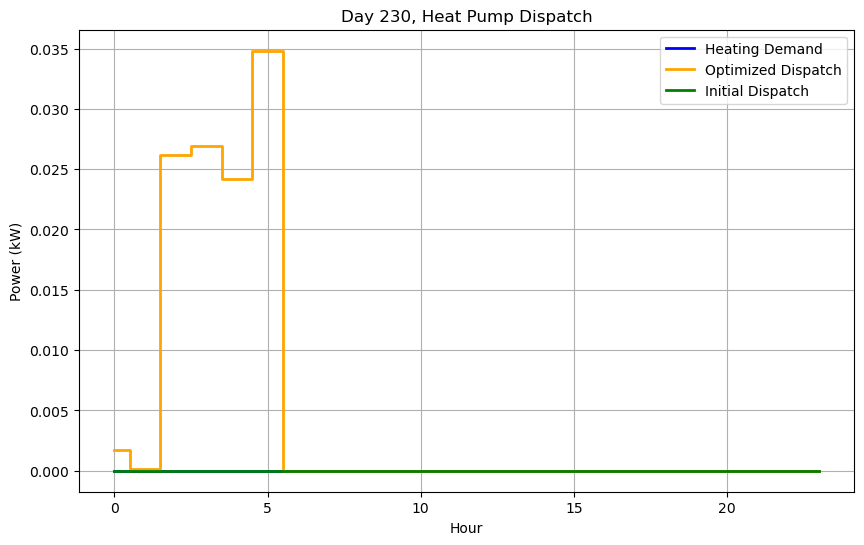


Day 231/365
Initial Guess Cost: €0.06
Optimized Daily Cost: €0.01
Total Heat Consumed (Qconsumption): 1.70 kWh
Total Heat Produced (Qproduction): 0.45 kWh
Buffer Tank Temperature at End of Day: 26.35°C
Optimized Dispatch: [0.00000000e+00 0.00000000e+00 2.56085462e-16 0.00000000e+00
 0.00000000e+00 2.34649427e-16 0.00000000e+00 0.00000000e+00
 0.00000000e+00 2.45337578e-19 1.10115149e-19 5.92182542e-20
 1.98106094e-19 0.00000000e+00 2.59847336e-02 1.10324822e-15
 1.78537796e-16 2.31378549e-17 8.27409777e-20 1.11721673e-16
 4.39041108e-16 0.00000000e+00 6.77607784e-17 0.00000000e+00]


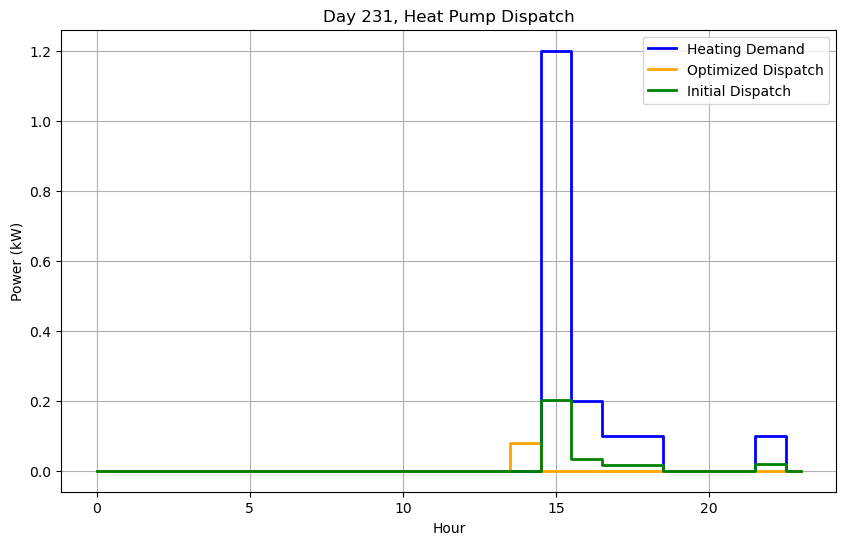


Day 232/365
Initial Guess Cost: €0.16
Optimized Daily Cost: €0.07
Total Heat Consumed (Qconsumption): 0.30 kWh
Total Heat Produced (Qproduction): 1.12 kWh
Buffer Tank Temperature at End of Day: 26.90°C
Optimized Dispatch: [2.27592081e-11 1.45612619e-08 1.37544265e-07 1.41231070e-07
 6.48423159e-03 7.71251846e-03 5.37863655e-13 9.20892506e-13
 5.27126926e-13 1.46287111e-12 1.35495486e-12 3.12942460e-12
 4.65267709e-12 5.57201122e-03 5.56947092e-03 8.74417744e-13
 3.15082652e-12 4.06875050e-13 2.01234057e-12 6.27677694e-13
 6.39496839e-13 1.08914560e-12 8.59920762e-13 1.87715696e-12]


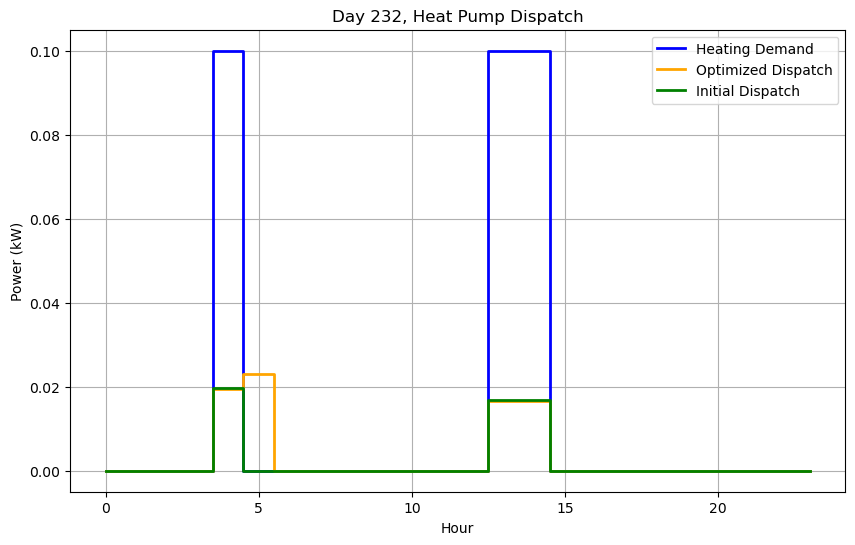


Day 233/365
Initial Guess Cost: €0.03
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.03 kWh
Buffer Tank Temperature at End of Day: 26.57°C
Optimized Dispatch: [2.76312260e-11 7.89023287e-15 7.18745970e-15 2.06380690e-03
 1.00367153e-15 1.30166489e-12 5.73642625e-11 6.30952562e-11
 5.72835392e-11 5.33197635e-11 9.78097261e-12 6.91935828e-12
 5.80368951e-12 4.84698892e-11 4.91568103e-11 4.77839718e-11
 5.01009148e-11 5.36991337e-11 1.72457932e-11 6.68143351e-11
 7.03527647e-11 6.28698618e-11 5.70405499e-11 1.15723882e-11]


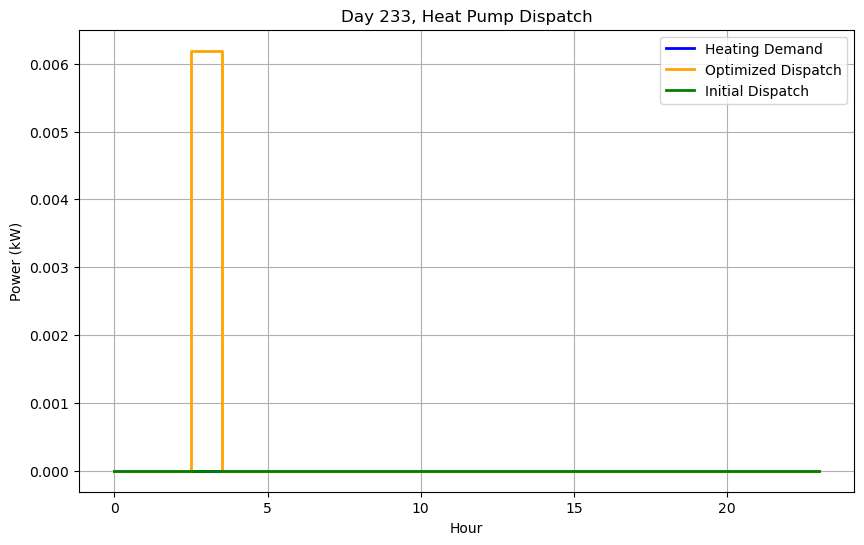


Day 234/365
Initial Guess Cost: €0.03
Optimized Daily Cost: €0.03
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.54 kWh
Buffer Tank Temperature at End of Day: 26.82°C
Optimized Dispatch: [5.38307153e-16 4.53155516e-09 2.15929155e-18 6.45663368e-08
 8.57358244e-09 7.20502129e-04 1.48819536e-05 3.47222560e-12
 9.52140264e-05 4.29805475e-04 6.66185198e-04 7.74716094e-04
 9.13041309e-04 9.69220175e-04 9.74046573e-04 9.07612744e-04
 8.83199475e-04 7.62812516e-04 2.15477733e-04 3.04773433e-05
 1.95812589e-05 7.84993045e-05 1.14811976e-04 1.49421350e-04]


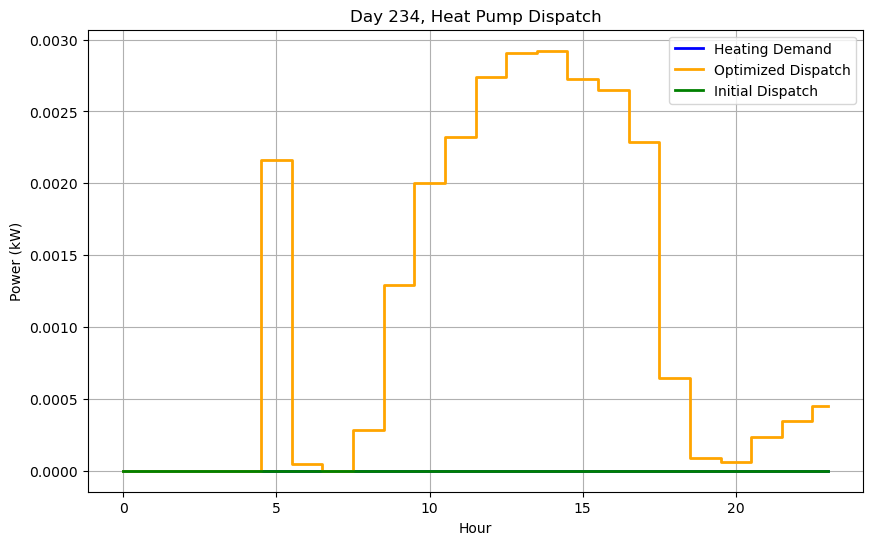


Day 235/365
Initial Guess Cost: €0.19
Optimized Daily Cost: €0.07
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 1.27 kWh
Buffer Tank Temperature at End of Day: 27.84°C
Optimized Dispatch: [8.10495792e-04 1.08741537e-02 1.65611020e-02 1.51249680e-02
 1.52750061e-02 1.50628339e-02 2.65559196e-11 2.47050791e-12
 8.12233067e-11 2.79158639e-11 8.65360460e-12 2.10599615e-12
 8.92985802e-12 3.42426180e-11 4.63618173e-10 8.02347053e-11
 2.11434226e-11 4.67027931e-11 5.40820385e-11 4.71496442e-10
 1.14181059e-11 4.04838719e-11 3.62450088e-11 3.37837159e-11]


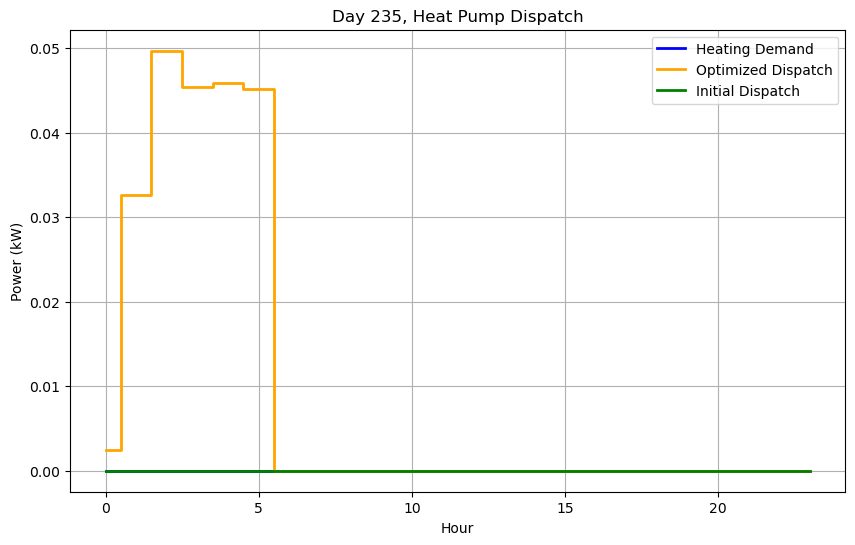


Day 236/365
Initial Guess Cost: €0.06
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.07 kWh
Buffer Tank Temperature at End of Day: 27.50°C
Optimized Dispatch: [1.12259046e-16 4.83667907e-17 7.14840375e-16 1.57264349e-03
 6.27197852e-17 3.38537050e-03 3.75875207e-16 4.22590083e-16
 3.78928317e-16 2.74032028e-16 2.95354426e-16 3.54617100e-16
 3.19812325e-16 2.38009018e-16 2.52387722e-16 2.35241745e-16
 2.64271199e-16 4.65526372e-16 4.26774222e-16 5.27697424e-16
 4.82185088e-16 4.07880563e-16 3.04136758e-16 3.07628827e-16]


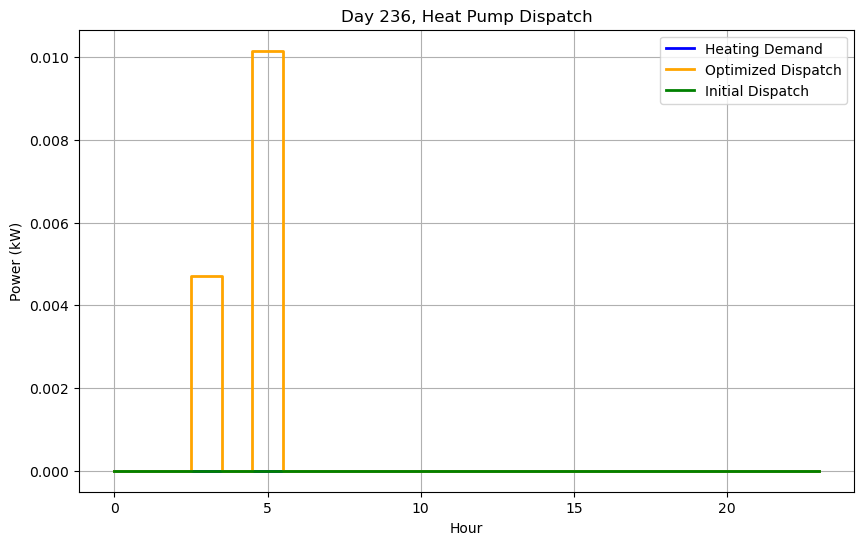


Day 237/365
Initial Guess Cost: €0.09
Optimized Daily Cost: €0.04
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.61 kWh
Buffer Tank Temperature at End of Day: 27.77°C
Optimized Dispatch: [4.35124269e-07 4.72590785e-05 4.75865751e-03 6.79440971e-03
 4.76997010e-03 1.56421976e-02 5.65105505e-11 5.54951929e-12
 7.10065732e-12 4.86044192e-12 6.55010522e-12 5.41925945e-11
 4.98856264e-11 2.29422174e-12 1.95644519e-11 4.07496058e-11
 1.52231191e-11 5.82859052e-12 3.68240613e-12 2.19922095e-11
 2.86929509e-12 2.33082437e-11 2.77855331e-11 4.02535583e-12]


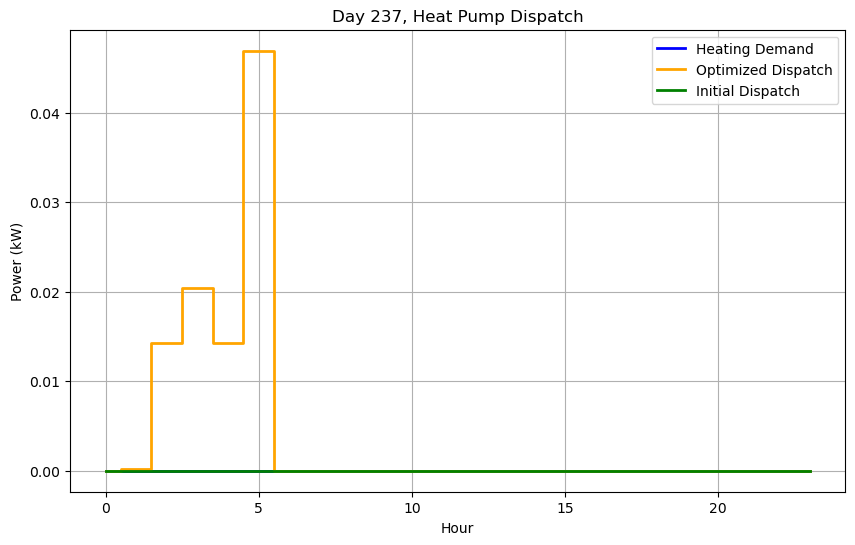


Day 238/365
Initial Guess Cost: €0.05
Optimized Daily Cost: €0.03
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.87 kWh
Buffer Tank Temperature at End of Day: 28.32°C
Optimized Dispatch: [1.89039566e-04 2.42055510e-04 2.63482798e-04 2.72803336e-04
 3.07739762e-04 3.31322040e-04 1.52735283e-11 1.57411210e-11
 1.62792212e-11 6.11744903e-04 1.45407468e-03 2.25412380e-03
 3.05165377e-03 3.99093626e-02 3.67652392e-03 9.38254413e-04
 2.42808310e-07 1.46771573e-11 1.42315700e-11 8.36595378e-04
 2.27462950e-11 2.31574487e-11 2.05132601e-11 1.34322110e-05]


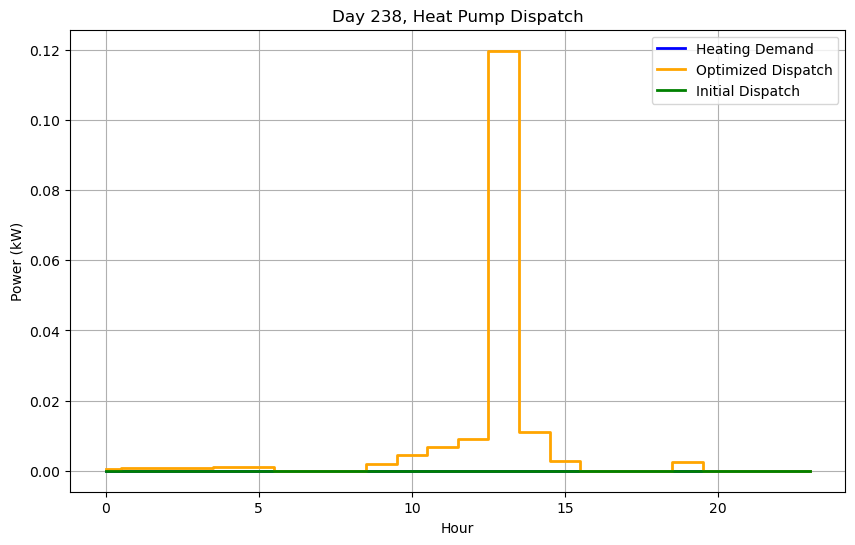


Day 239/365
Initial Guess Cost: €0.13
Optimized Daily Cost: €0.05
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.70 kWh
Buffer Tank Temperature at End of Day: 28.66°C
Optimized Dispatch: [2.90284191e-13 6.97200541e-03 3.51941979e-05 7.19231219e-05
 9.55020277e-06 8.16470347e-05 1.15353324e-04 3.38156412e-04
 7.20558096e-04 8.20621653e-04 1.12403330e-03 1.45890634e-03
 1.35929392e-03 1.39515716e-03 1.53200392e-03 1.45396088e-03
 1.20329085e-03 6.96506233e-04 6.94318939e-05 4.72754504e-05
 1.32752915e-04 1.33848337e-04 1.30528654e-04 1.25733971e-04]


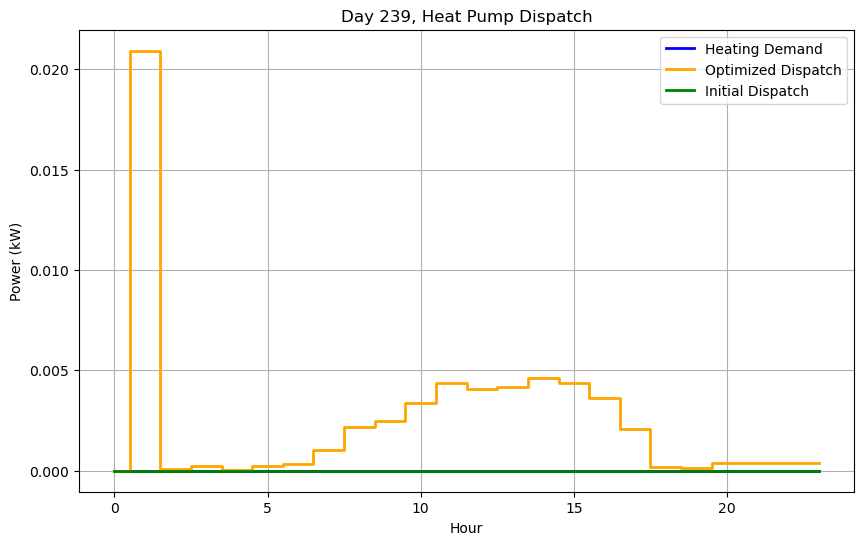


Day 240/365
Initial Guess Cost: €0.05
Optimized Daily Cost: €0.05
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.76 kWh
Buffer Tank Temperature at End of Day: 29.03°C
Optimized Dispatch: [2.52998970e-10 1.53464477e-09 8.48158396e-14 4.88922533e-08
 2.12286358e-11 2.51480648e-11 2.06626425e-03 2.91773029e-04
 2.57177105e-04 7.64456336e-03 1.76406098e-03 1.92313018e-03
 2.88293127e-03 3.34962214e-03 3.31405897e-03 2.15928097e-03
 2.29470384e-03 4.68642163e-09 7.01186226e-09 9.38302021e-09
 2.05365971e-04 2.50320787e-04 2.21219055e-04 2.13653404e-04]


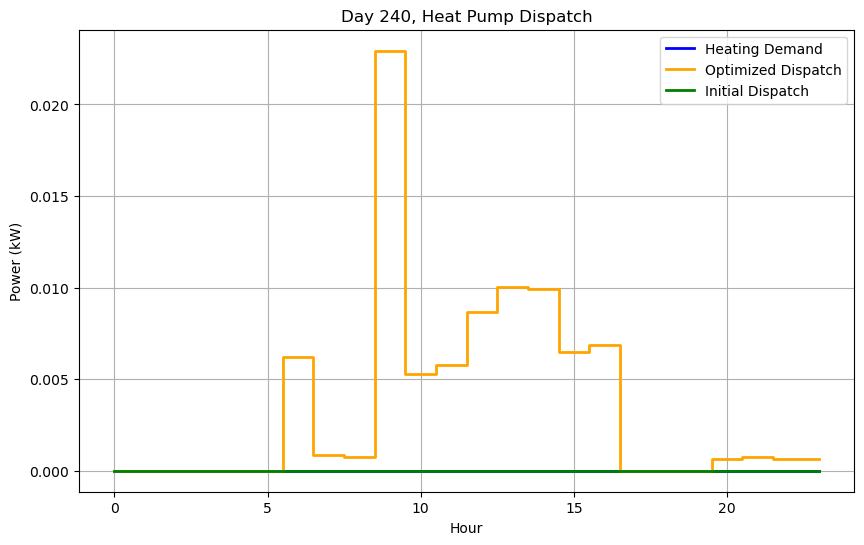


Day 241/365
Initial Guess Cost: €0.05
Optimized Daily Cost: €0.03
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.40 kWh
Buffer Tank Temperature at End of Day: 28.99°C
Optimized Dispatch: [3.01977093e-15 1.91988573e-15 4.79633015e-18 7.58331526e-08
 4.60116694e-16 1.63728019e-03 1.09809336e-05 1.52780354e-11
 1.31236707e-11 1.09617245e-11 1.07497710e-05 2.38722824e-04
 3.83271986e-04 6.01129133e-04 6.32159229e-04 6.03662079e-04
 5.77038615e-04 1.80023783e-04 4.89339542e-05 2.67262884e-05
 6.10509825e-05 1.95352138e-04 4.48829979e-04 6.11246231e-04]


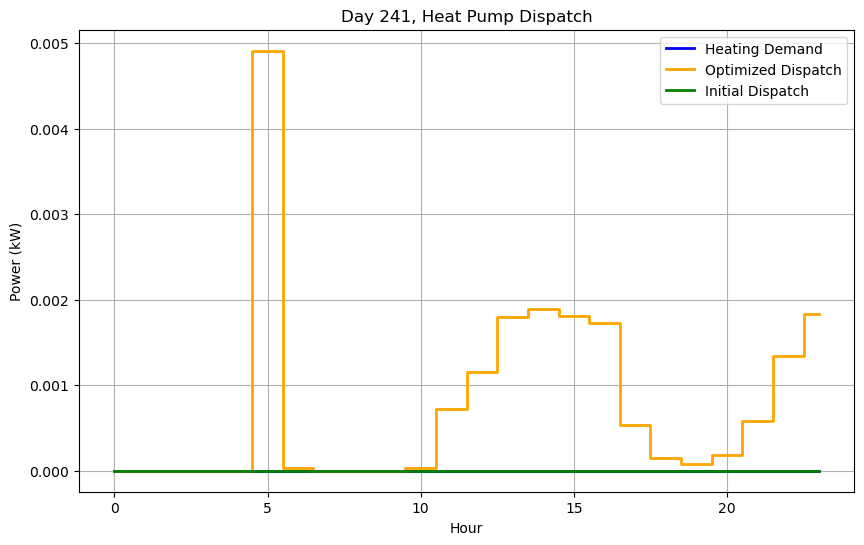


Day 242/365
Initial Guess Cost: €0.14
Optimized Daily Cost: €0.04
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.57 kWh
Buffer Tank Temperature at End of Day: 29.13°C
Optimized Dispatch: [1.29420716e-08 2.19022602e-03 1.74812371e-13 5.93701698e-13
 3.90819829e-03 2.93528517e-02 6.45021844e-16 6.84721825e-16
 7.09941053e-16 5.19062016e-16 6.41613520e-16 5.37807269e-16
 5.96013450e-16 5.42378734e-16 5.47711566e-16 6.53139862e-16
 5.62608741e-16 6.07166727e-16 7.33633231e-16 8.13068499e-16
 7.97287964e-16 7.14412690e-16 6.42471100e-16 5.64209875e-16]


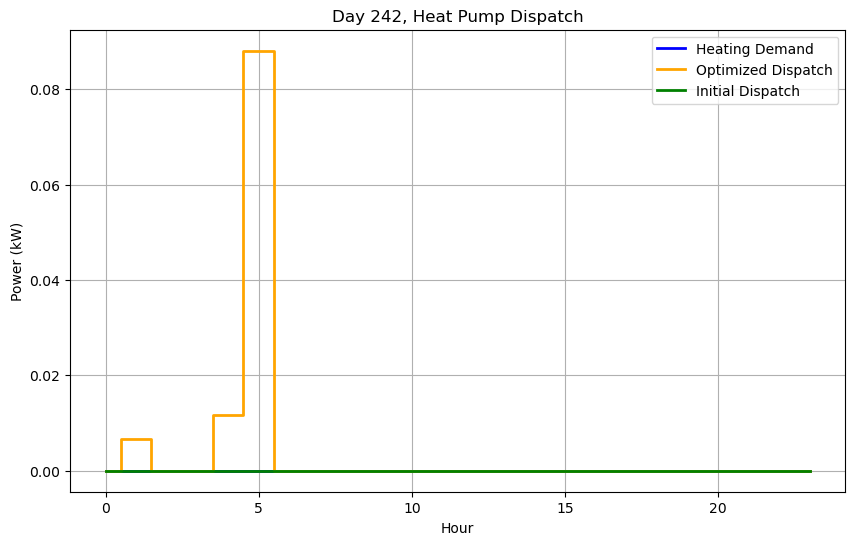


Day 243/365
Initial Guess Cost: €0.27
Optimized Daily Cost: €0.02
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.29 kWh
Buffer Tank Temperature at End of Day: 28.97°C
Optimized Dispatch: [7.07968016e-09 2.16301867e-03 3.77349627e-03 1.35205723e-03
 1.47844582e-02 5.76785940e-11 4.33802072e-11 3.48192521e-11
 2.35285384e-11 1.11318259e-08 4.19832587e-11 6.43326527e-11
 1.11854518e-08 1.33047905e-11 4.02496504e-11 1.12085619e-08
 1.33507106e-11 4.54816310e-11 4.56070854e-11 1.11504588e-08
 1.80313090e-11 4.66605823e-11 3.03711794e-09 4.19863347e-11]


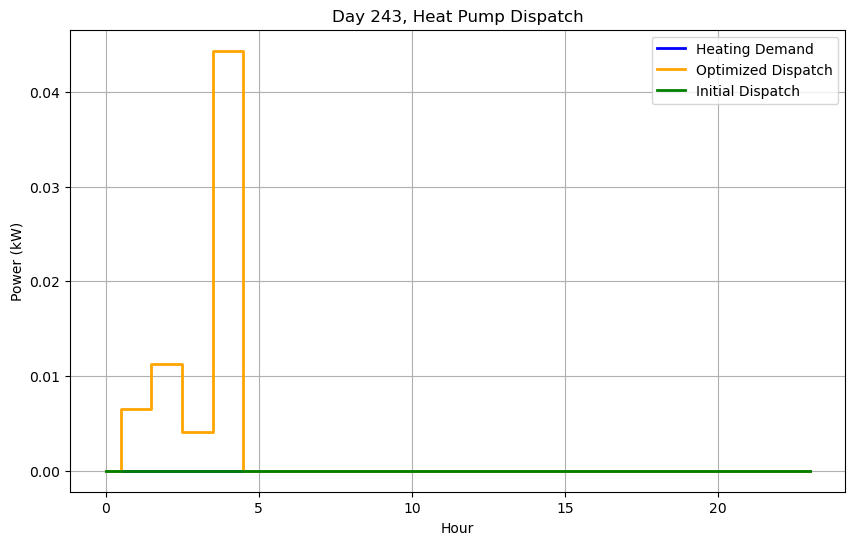


Day 244/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.03 kWh
Buffer Tank Temperature at End of Day: 28.52°C
Optimized Dispatch: [1.24669693e-17 2.35085202e-17 1.17849708e-17 1.97016701e-04
 9.90478560e-18 5.64207125e-17 1.20273575e-17 1.52114551e-17
 7.05182657e-17 9.17159522e-18 1.35420995e-17 3.89299359e-17
 8.09777349e-17 7.15555222e-17 1.78308321e-03 4.69032313e-17
 8.37820774e-17 2.18039696e-17 1.08092513e-17 1.13004168e-17
 3.87035232e-17 6.77211043e-18 6.23659907e-18 1.01930214e-17]


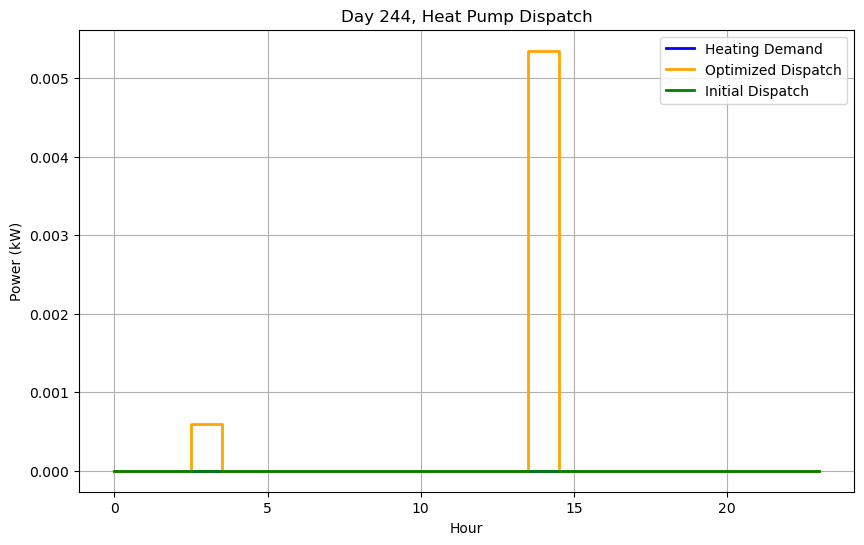


Day 245/365
Initial Guess Cost: €0.13
Optimized Daily Cost: €0.03
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.51 kWh
Buffer Tank Temperature at End of Day: 28.62°C
Optimized Dispatch: [1.60135348e-02 3.33288504e-16 5.51540754e-03 1.12633238e-02
 4.42656549e-03 1.06439623e-17 1.94076897e-15 5.64393773e-16
 7.66908580e-16 1.08129023e-15 7.94523466e-16 1.84698479e-15
 1.55422223e-17 9.75792657e-16 3.61758782e-16 2.60025523e-17
 1.19035040e-16 9.86929492e-16 7.86795379e-16 3.40675383e-16
 3.33074823e-15 5.49381777e-16 3.44872889e-16 1.30027630e-15]


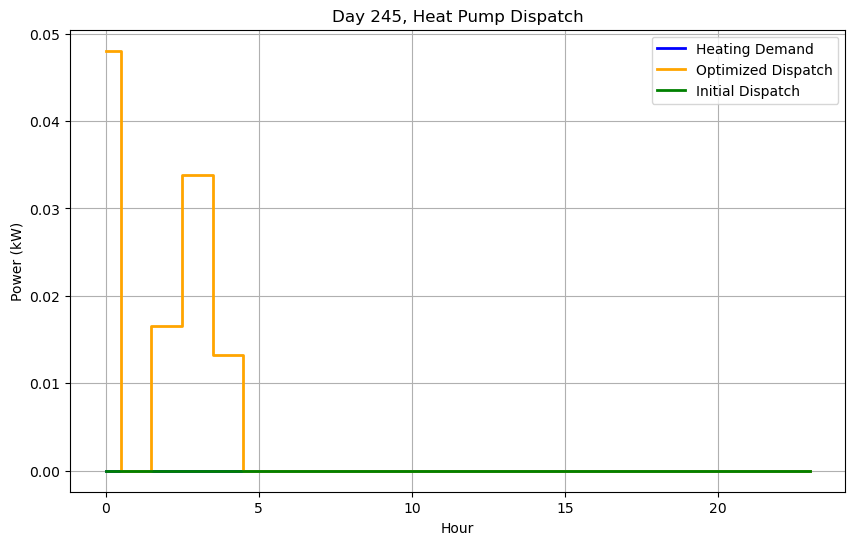


Day 246/365
Initial Guess Cost: €0.01
Optimized Daily Cost: €0.01
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.25 kWh
Buffer Tank Temperature at End of Day: 28.44°C
Optimized Dispatch: [1.07460995e-16 2.28636841e-16 4.55810733e-17 0.00000000e+00
 2.07303467e-16 9.17394394e-17 3.00399364e-16 5.59926795e-17
 1.17553655e-16 1.85072711e-17 2.71164477e-18 2.09004703e-17
 7.18278118e-17 2.38677326e-17 1.60520238e-02 5.22409534e-17
 5.10103655e-17 6.25479167e-17 6.70359833e-17 7.01592005e-17
 3.17410738e-16 0.00000000e+00 7.14152100e-18 4.00762356e-17]


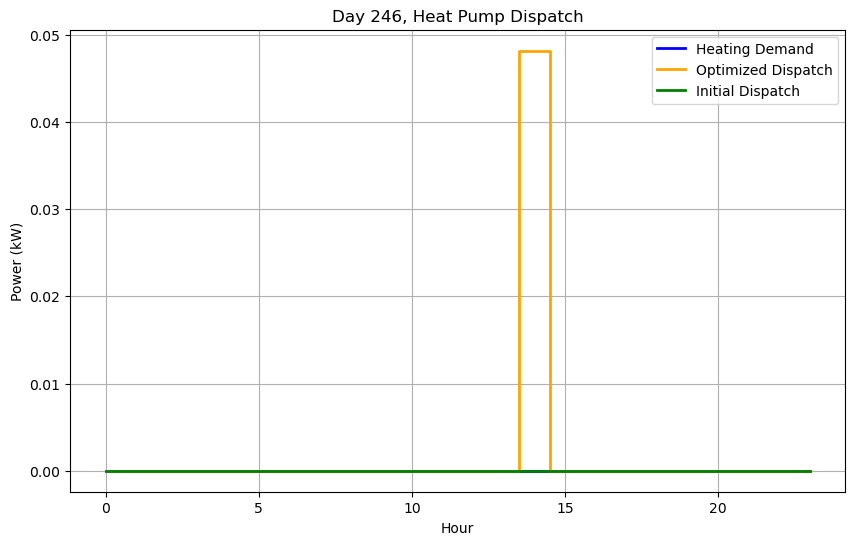


Day 247/365
Initial Guess Cost: €0.19
Optimized Daily Cost: €0.06
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.86 kWh
Buffer Tank Temperature at End of Day: 28.93°C
Optimized Dispatch: [5.58969342e-06 5.34118077e-06 1.83979738e-06 3.58441063e-05
 8.05975371e-03 1.79151966e-02 1.84446492e-13 4.74032796e-14
 1.76681591e-12 1.34949828e-11 1.90717094e-13 2.05670340e-14
 1.62950018e-13 9.62781838e-14 1.33693889e-11 9.95875070e-14
 2.33733036e-14 2.79705556e-14 1.85374343e-12 3.38804142e-14
 1.86047032e-12 1.32517862e-11 1.77953464e-13 1.23670424e-13]


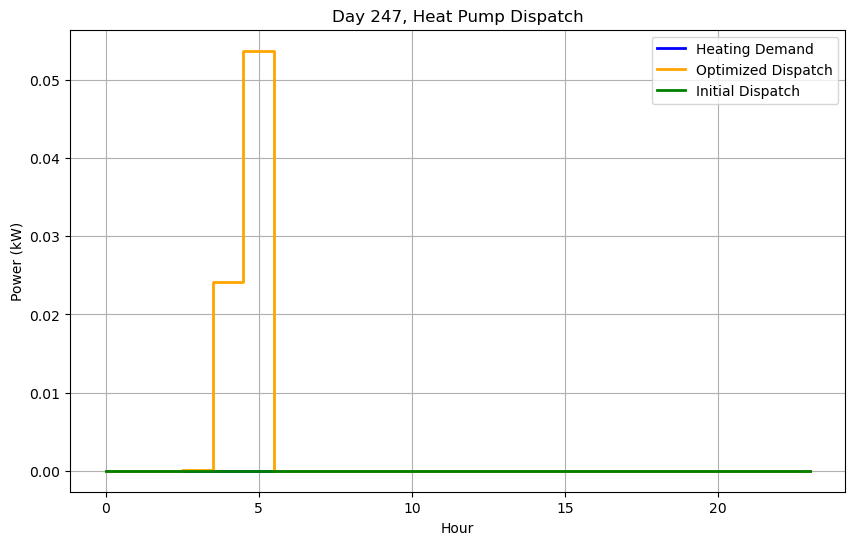


Day 248/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 28.45°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


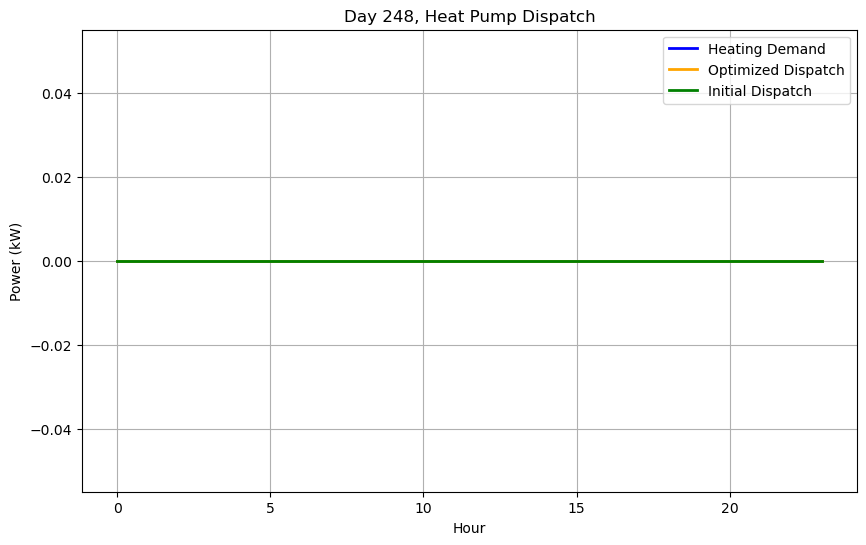


Day 249/365
Initial Guess Cost: €0.22
Optimized Daily Cost: €0.06
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.92 kWh
Buffer Tank Temperature at End of Day: 29.00°C
Optimized Dispatch: [4.27095567e-12 6.40311754e-08 1.74103789e-05 2.27022476e-06
 5.43884134e-03 3.65733206e-02 2.05100074e-15 2.49176358e-15
 2.02387245e-15 1.87072232e-15 1.82434207e-15 5.27831906e-14
 1.90945250e-15 5.37528337e-14 8.94963517e-13 2.18151772e-15
 1.82749267e-15 4.81775579e-14 8.92660412e-13 7.72424492e-13
 2.65113557e-15 2.44087436e-15 2.28128667e-15 1.84870815e-15]


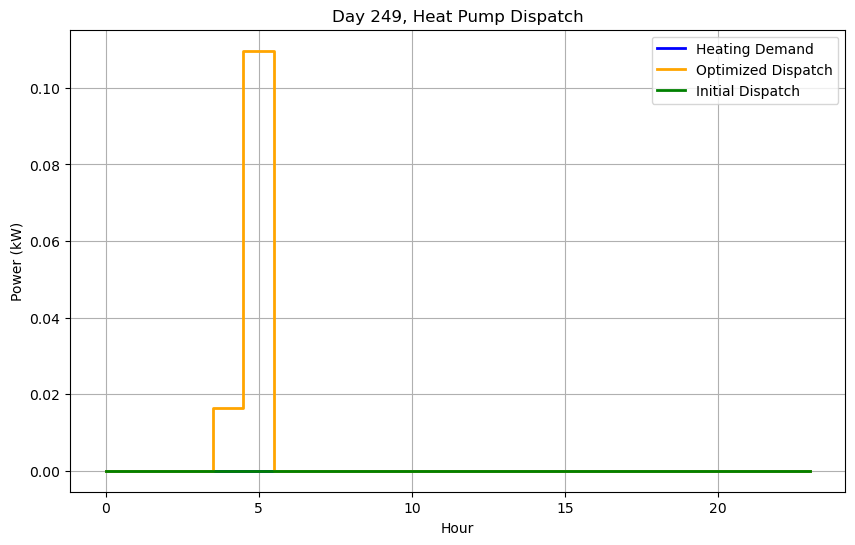


Day 250/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 28.52°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


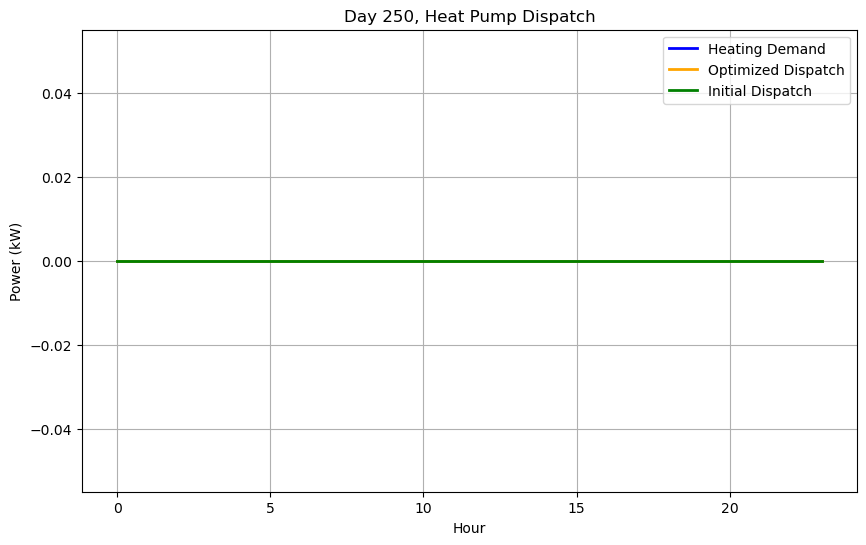


Day 251/365
Initial Guess Cost: €0.05
Optimized Daily Cost: €0.01
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.20 kWh
Buffer Tank Temperature at End of Day: 28.28°C
Optimized Dispatch: [1.24300745e-09 5.18672033e-09 1.37383568e-11 1.95063061e-11
 5.25899171e-07 2.65955529e-03 1.59025341e-12 1.69847596e-12
 1.65361113e-12 1.51345990e-12 1.46153506e-12 1.41783063e-12
 1.36794979e-12 1.34933893e-12 1.35436300e-12 1.39946999e-12
 1.44872287e-12 1.56524557e-12 1.93410213e-12 2.27492380e-12
 2.08129862e-12 1.70365503e-12 1.60589006e-12 1.54774226e-12]


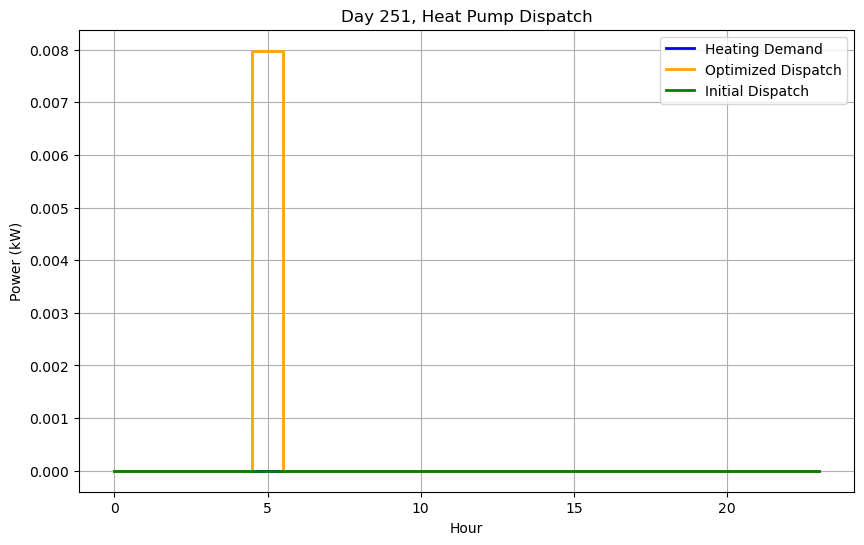


Day 252/365
Initial Guess Cost: €0.07
Optimized Daily Cost: €0.02
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.41 kWh
Buffer Tank Temperature at End of Day: 28.29°C
Optimized Dispatch: [2.22380371e-04 1.05115776e-02 1.82676290e-02 2.03553542e-14
 1.94984056e-14 1.90796940e-14 1.72905035e-14 1.60388729e-14
 1.61608495e-14 1.72035927e-14 1.61557138e-14 1.56321296e-14
 1.27135051e-14 1.08900566e-14 1.19441137e-14 1.53400482e-14
 1.56690216e-14 1.73116355e-14 1.32304788e-14 1.64035483e-14
 1.84931413e-14 1.77152804e-14 1.54257883e-14 1.83430253e-14]


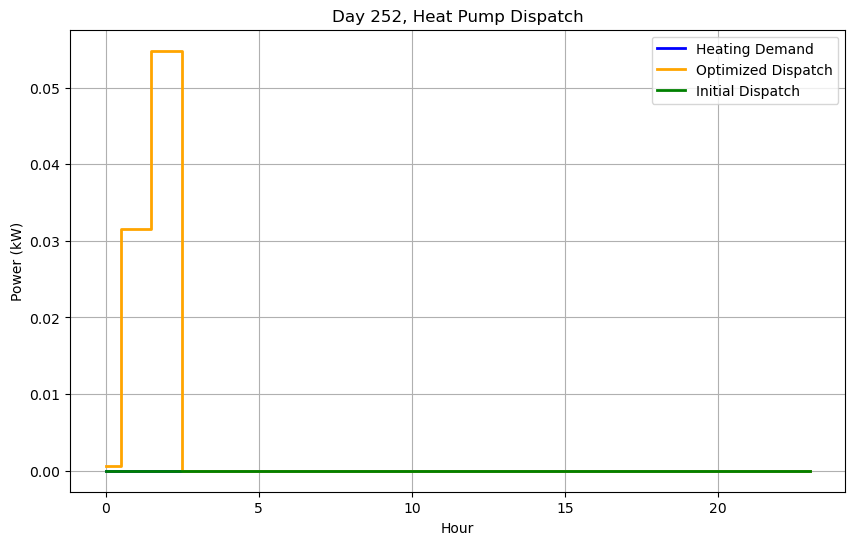


Day 253/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 27.84°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


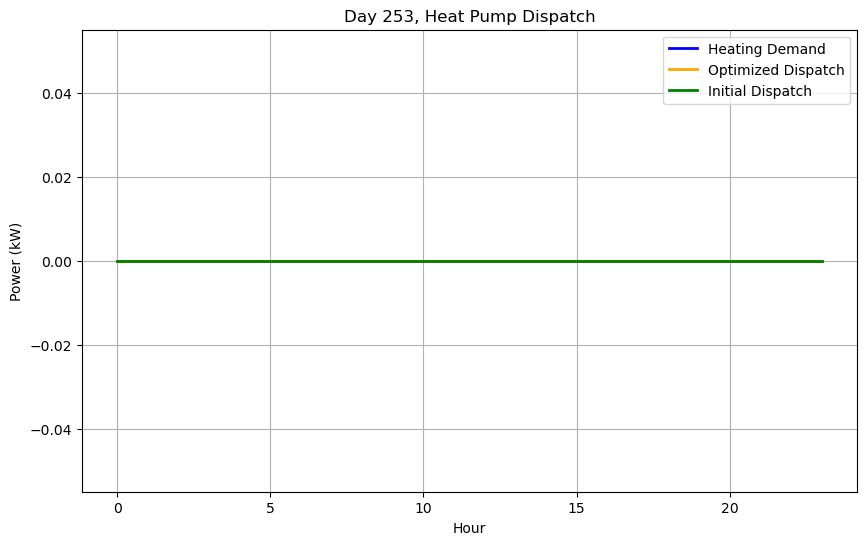


Day 254/365
Initial Guess Cost: €0.07
Optimized Daily Cost: €0.01
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.14 kWh
Buffer Tank Temperature at End of Day: 27.58°C
Optimized Dispatch: [5.66916445e-17 1.79275175e-15 4.38971087e-19 3.73990934e-03
 1.97073481e-05 3.54888754e-03 2.17249952e-16 1.78243203e-16
 1.80302783e-16 1.69408428e-16 1.43339575e-16 1.43444783e-16
 1.58291103e-16 4.70729031e-16 3.68289279e-16 1.47353929e-16
 1.58313463e-16 1.73443006e-16 2.55870440e-16 4.11423377e-16
 3.61899886e-16 2.29410453e-16 1.86982959e-16 1.65768515e-16]


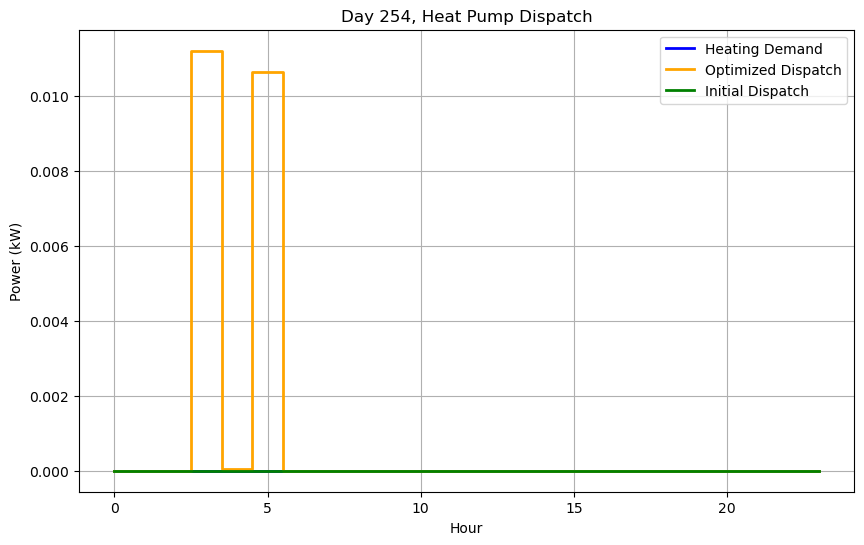


Day 255/365
Initial Guess Cost: €0.14
Optimized Daily Cost: €0.05
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.66 kWh
Buffer Tank Temperature at End of Day: 27.90°C
Optimized Dispatch: [6.11280010e-11 2.97951689e-10 1.68101997e-07 3.91637308e-07
 4.41180161e-09 6.35336374e-03 2.10272891e-11 2.15271355e-11
 1.88042540e-11 1.98787545e-11 7.37195192e-14 1.92024774e-11
 1.74718856e-11 1.73285806e-11 1.79516726e-11 1.75802086e-11
 8.39620648e-12 9.33808997e-12 2.99600802e-11 1.37444988e-11
 1.17195669e-11 1.87005305e-11 7.33468835e-14 7.92723364e-12]


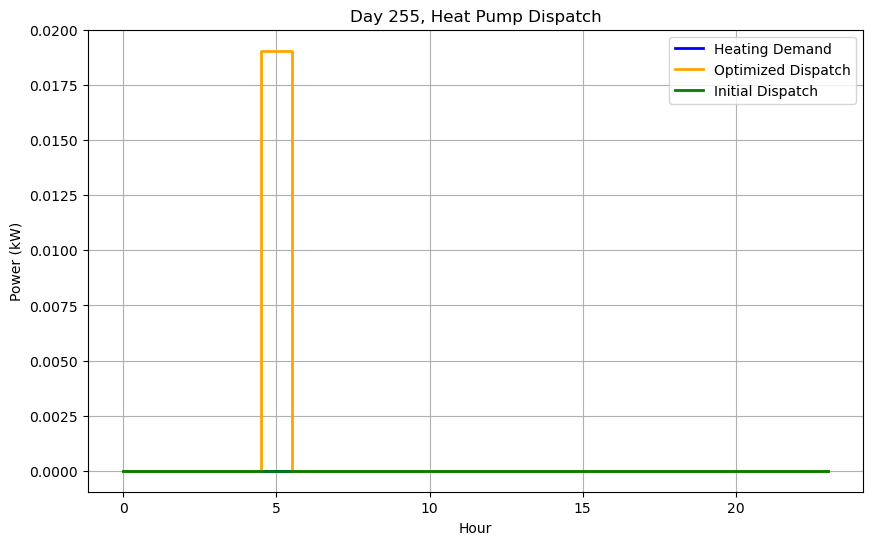


Day 256/365
Initial Guess Cost: €0.03
Optimized Daily Cost: €0.03
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.57 kWh
Buffer Tank Temperature at End of Day: 28.11°C
Optimized Dispatch: [4.90004122e-17 5.94206292e-17 4.61958144e-17 6.88049501e-19
 5.23521601e-17 3.96745318e-21 1.83507939e-17 2.08382342e-20
 3.00373467e-19 2.26321829e-17 8.88773622e-19 2.98634829e-17
 6.98848337e-03 1.40848225e-02 1.16220096e-02 2.31639868e-03
 3.42008951e-17 3.31374353e-19 1.82306185e-17 3.37716990e-21
 1.06696380e-20 6.74822085e-17 1.66942120e-19 1.37116763e-03]


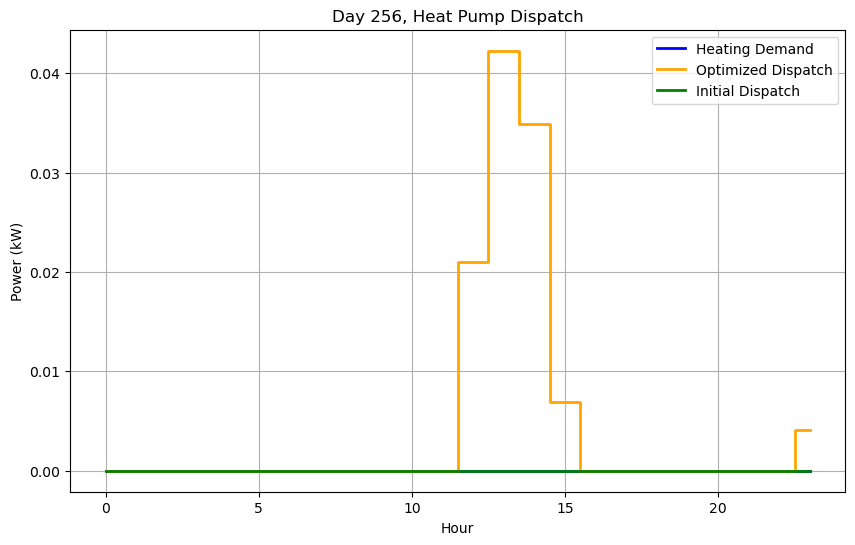


Day 257/365
Initial Guess Cost: €0.11
Optimized Daily Cost: €0.08
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 1.06 kWh
Buffer Tank Temperature at End of Day: 28.85°C
Optimized Dispatch: [1.78800644e-14 1.63384419e-06 1.51008695e-09 4.43352790e-08
 3.55341057e-08 4.89577886e-03 1.40807059e-05 1.25181114e-05
 1.10719852e-05 1.32092300e-04 3.74570988e-04 4.67414661e-04
 5.29654990e-04 5.41883035e-04 5.88134798e-04 5.89168744e-04
 5.39426982e-04 3.37187759e-04 1.81275906e-06 8.81439531e-11
 3.10938548e-06 6.03796383e-05 1.28002208e-05 1.64767160e-05]


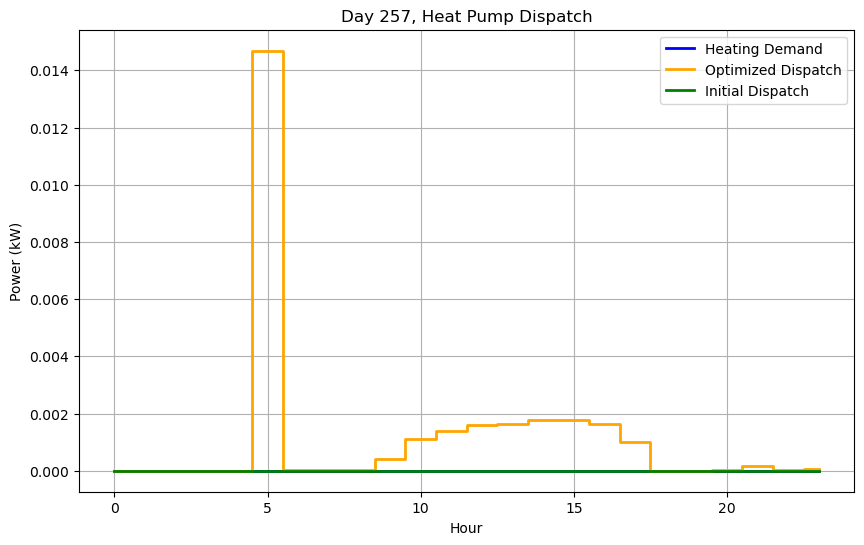


Day 258/365
Initial Guess Cost: €0.13
Optimized Daily Cost: €0.11
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 1.80 kWh
Buffer Tank Temperature at End of Day: 30.34°C
Optimized Dispatch: [2.19350229e-02 1.02485386e-02 5.29707982e-03 4.23231803e-02
 4.72376290e-02 9.98306535e-03 5.82341157e-14 6.08007094e-14
 1.01247585e-13 6.18332014e-14 9.51519615e-14 9.43494615e-14
 4.60061991e-14 4.38771997e-14 4.56261655e-14 9.33269376e-14
 6.18802254e-14 9.91497096e-14 6.06207539e-14 6.73170173e-14
 5.83357694e-14 5.24151112e-14 9.76904911e-14 4.91868552e-14]


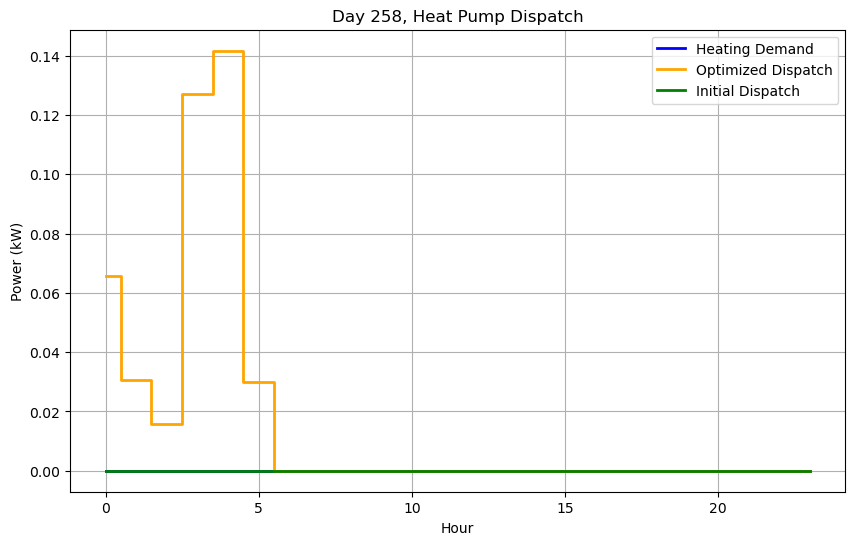


Day 259/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 29.79°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


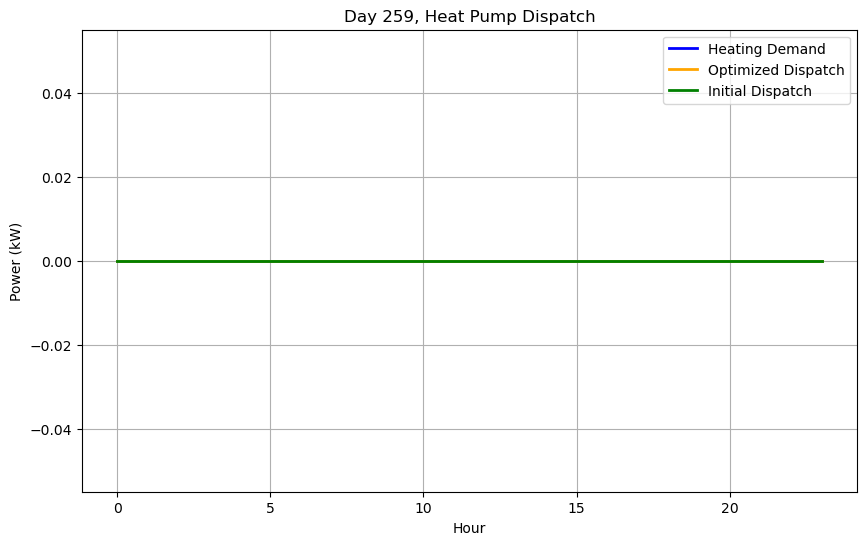


Day 260/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 29.27°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


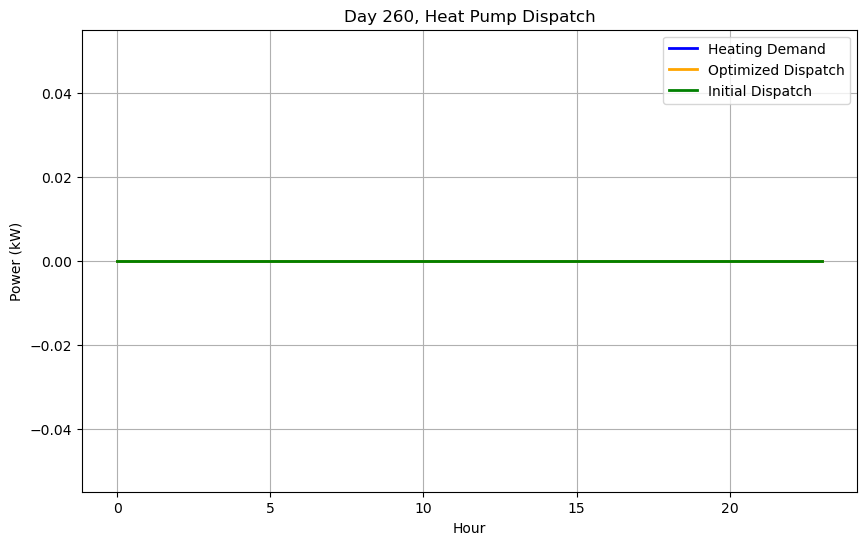


Day 261/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 28.77°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


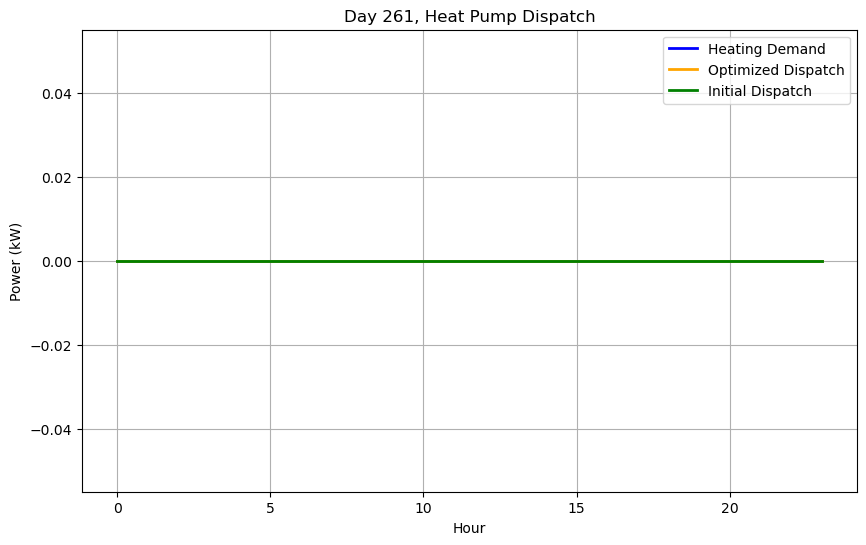


Day 262/365
Initial Guess Cost: €0.03
Optimized Daily Cost: €0.02
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.61 kWh
Buffer Tank Temperature at End of Day: 28.99°C
Optimized Dispatch: [8.43322683e-17 2.54087743e-17 2.84918526e-21 2.92666417e-16
 1.53674391e-16 1.10138122e-16 5.34507040e-19 8.27026609e-17
 1.63108556e-16 6.11473312e-18 3.22831179e-19 1.89106431e-17
 2.83947549e-20 1.03534359e-19 4.08754800e-02 1.25524298e-17
 3.66420029e-17 2.26848890e-17 1.49266305e-16 2.43309594e-16
 1.78935891e-17 3.07314216e-17 6.95237767e-17 1.73228204e-18]


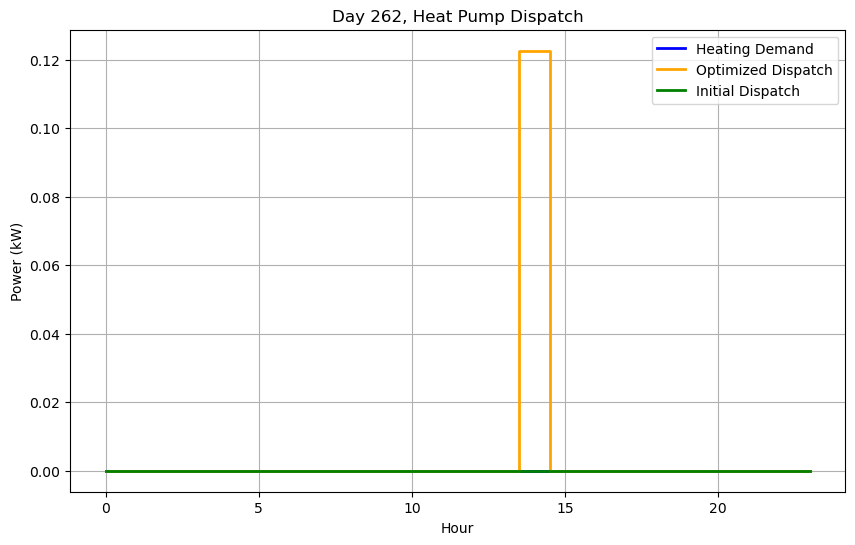


Day 263/365
Initial Guess Cost: €0.10
Optimized Daily Cost: €0.04
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.92 kWh
Buffer Tank Temperature at End of Day: 29.51°C
Optimized Dispatch: [1.61580921e-05 1.48420175e-05 2.67212199e-03 4.20777107e-03
 4.75493733e-03 3.35524517e-02 1.66241029e-15 1.72014478e-15
 1.77418417e-15 1.61461636e-15 1.12311964e-15 1.03109496e-15
 1.05719984e-15 1.05201885e-15 1.09406698e-15 1.09636702e-15
 1.15488472e-15 1.71792713e-15 1.96926848e-15 2.37406637e-15
 1.88241058e-15 1.70752501e-15 1.65579450e-15 1.58978248e-15]


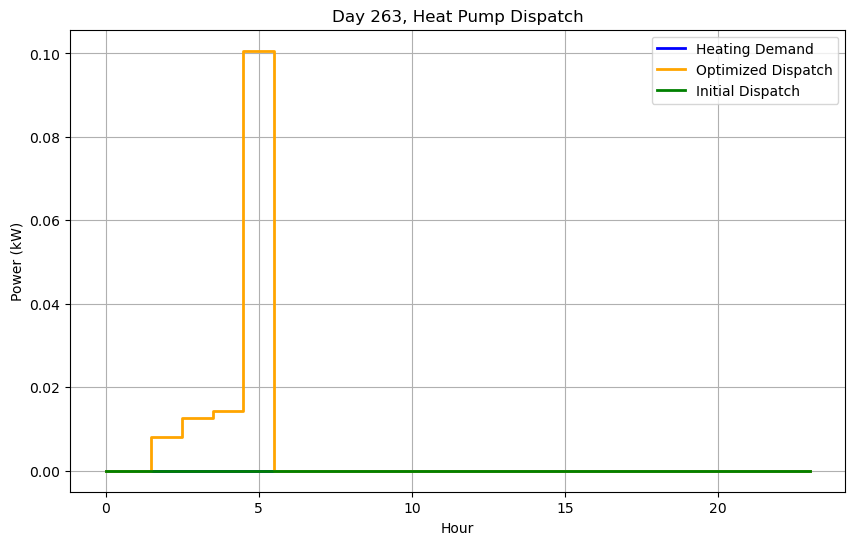


Day 264/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 29.00°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


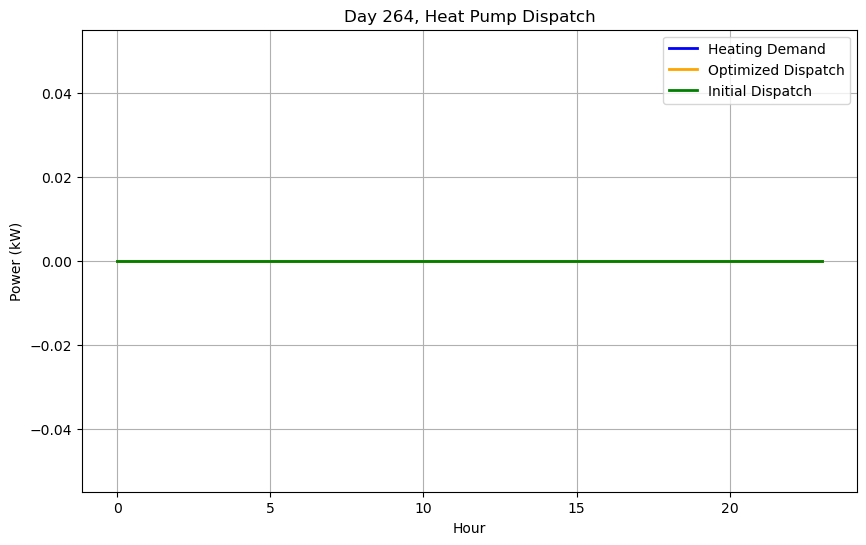


Day 265/365
Initial Guess Cost: €0.06
Optimized Daily Cost: €0.04
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.86 kWh
Buffer Tank Temperature at End of Day: 29.49°C
Optimized Dispatch: [2.59680026e-17 2.41685142e-17 0.00000000e+00 1.72922729e-19
 7.84730721e-18 4.16877174e-17 9.83530995e-17 3.39959296e-17
 1.15707202e-16 8.90788110e-17 2.13834447e-17 1.96246445e-19
 6.17013665e-17 1.60706950e-17 6.01007874e-02 2.27625831e-20
 5.67452682e-17 2.10549893e-18 8.23595402e-19 8.99834213e-17
 6.16243675e-17 2.10617323e-18 5.43403813e-17 5.61649716e-18]


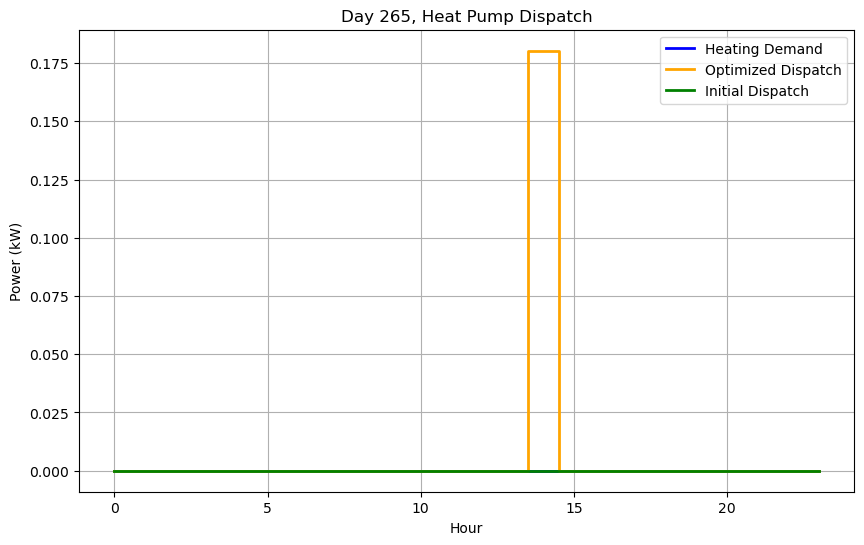


Day 266/365
Initial Guess Cost: €0.19
Optimized Daily Cost: €0.05
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.92 kWh
Buffer Tank Temperature at End of Day: 29.99°C
Optimized Dispatch: [3.75890530e-04 3.08110576e-03 3.12243767e-02 1.09796117e-06
 1.48508268e-06 9.74873770e-08 9.73061949e-08 9.69500148e-08
 9.63115162e-08 3.27387606e-06 1.39647973e-05 3.82287145e-05
 5.99727487e-05 2.90247894e-04 3.24965695e-02 1.46156320e-04
 6.20013389e-05 8.66721700e-06 9.10115814e-08 8.86100513e-08
 8.74634964e-08 8.68113088e-08 8.64129515e-08 9.79716453e-08]


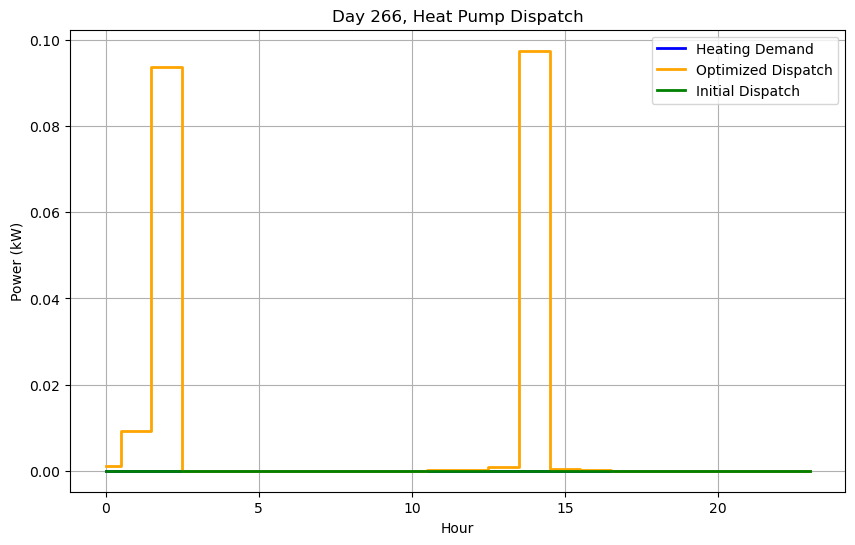


Day 267/365
Initial Guess Cost: €0.14
Optimized Daily Cost: €0.04
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.54 kWh
Buffer Tank Temperature at End of Day: 30.05°C
Optimized Dispatch: [1.21151094e-11 1.16052260e-08 4.89393419e-13 4.96805053e-08
 3.33116621e-10 9.27185213e-03 2.40139554e-15 2.37098862e-15
 2.53013215e-15 2.15220375e-15 1.52323395e-15 4.55231012e-13
 1.44840062e-15 4.74834888e-13 2.97754285e-15 1.51196274e-15
 1.56457692e-15 2.47369654e-15 2.11589785e-15 3.14708159e-15
 2.06483112e-15 2.63013419e-15 6.14080211e-14 1.71069487e-15]


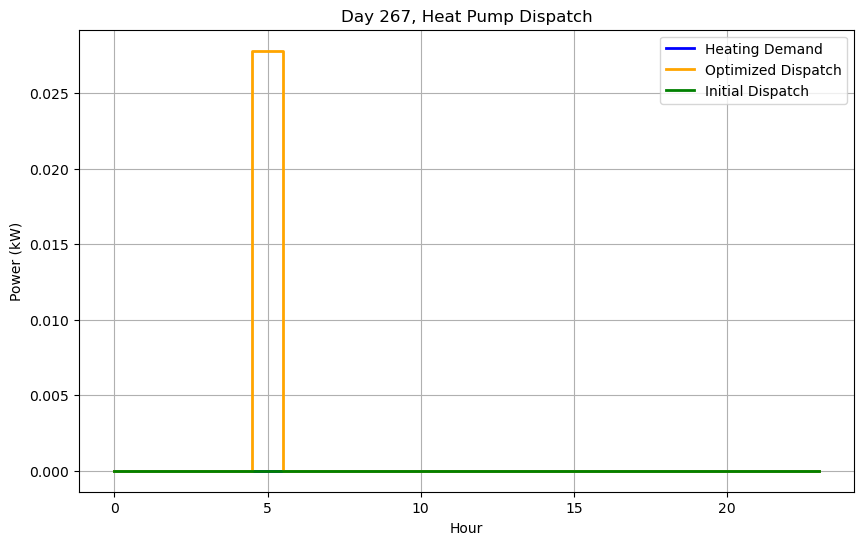


Day 268/365
Initial Guess Cost: €0.08
Optimized Daily Cost: €0.01
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.25 kWh
Buffer Tank Temperature at End of Day: 29.79°C
Optimized Dispatch: [0.00000000e+00 0.00000000e+00 5.04876097e-08 3.43247598e-03
 6.12105656e-03 3.56329129e-05 4.56859626e-03 1.49844575e-12
 1.51421446e-12 1.44927760e-12 1.44624751e-12 1.38498188e-12
 1.25242777e-12 1.23259297e-12 1.30739777e-12 1.38197371e-12
 1.35616783e-12 1.46107394e-12 1.80533498e-12 2.70284091e-12
 1.97592748e-12 1.51688784e-12 1.56924147e-12 1.46824764e-12]


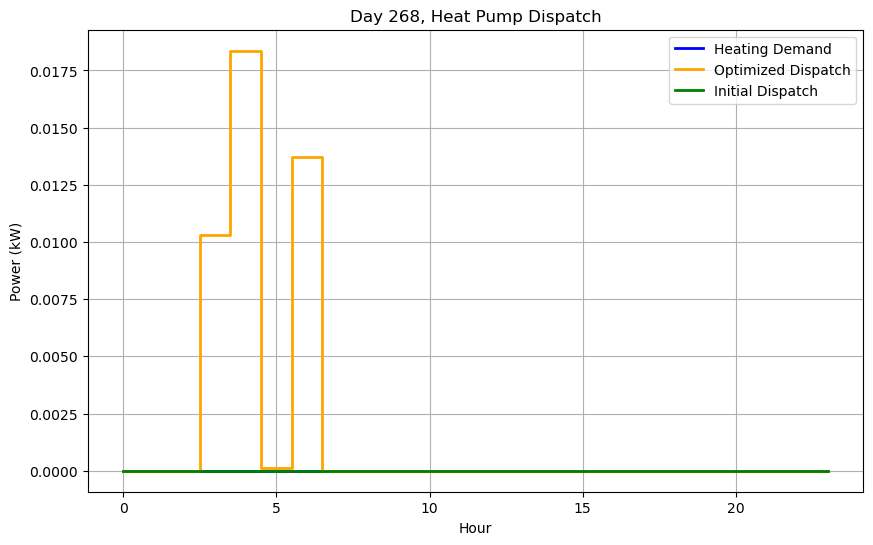


Day 269/365
Initial Guess Cost: €0.06
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.06 kWh
Buffer Tank Temperature at End of Day: 29.33°C
Optimized Dispatch: [2.70054353e-16 6.35698144e-16 1.33339452e-03 1.57504537e-16
 1.09079709e-16 3.35852643e-03 2.24074786e-15 3.38613204e-15
 2.17981432e-15 1.92478577e-15 1.67824018e-15 1.76685940e-15
 2.00259875e-15 1.65966129e-15 1.76287690e-15 1.79772446e-15
 1.81804643e-15 2.12370543e-15 2.56636701e-15 3.21636280e-15
 2.10304996e-15 1.99409380e-15 1.74737312e-15 1.80863862e-15]


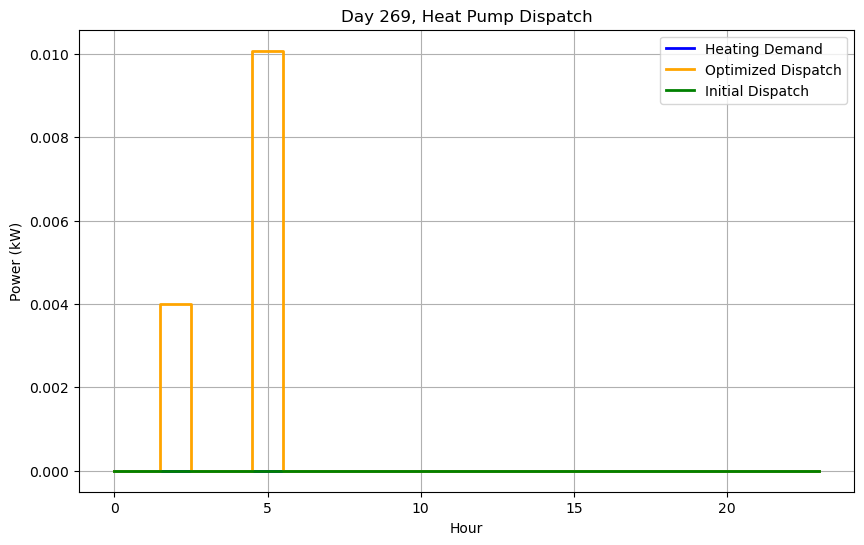


Day 270/365
Initial Guess Cost: €0.12
Optimized Daily Cost: €0.01
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.11 kWh
Buffer Tank Temperature at End of Day: 28.95°C
Optimized Dispatch: [4.03913584e-15 1.92194497e-12 2.00125113e-12 4.92904904e-16
 7.50875783e-04 1.98536221e-12 7.32697729e-03 2.96046153e-12
 5.50490096e-12 2.03644367e-12 1.85072925e-12 4.80563900e-12
 1.79406118e-12 1.74467883e-12 1.63940953e-12 2.50765115e-12
 5.06693912e-12 2.33319899e-12 1.78690069e-12 1.89713202e-12
 2.12766283e-12 2.00713134e-12 5.57365548e-12 1.72779946e-12]


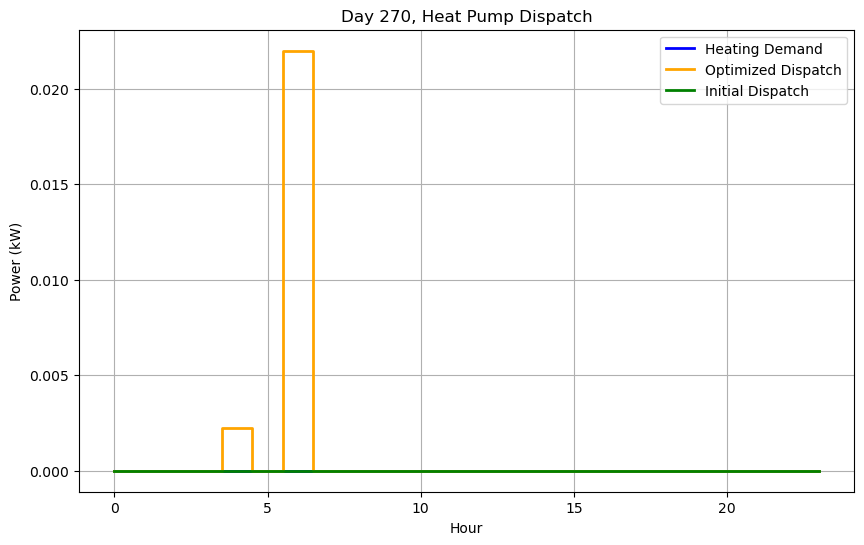


Day 271/365
Initial Guess Cost: €0.37
Optimized Daily Cost: €0.29
Total Heat Consumed (Qconsumption): 5.10 kWh
Total Heat Produced (Qproduction): 5.21 kWh
Buffer Tank Temperature at End of Day: 28.57°C
Optimized Dispatch: [2.91549472e-02 5.93997615e-02 6.31324878e-02 2.73395232e-02
 1.12688957e-02 6.16969142e-02 3.86012604e-02 7.82807029e-03
 7.98250158e-04 2.91134003e-03 5.87350386e-03 8.59755151e-03
 9.68933512e-03 1.05652617e-02 9.93810805e-03 1.02263237e-02
 9.15842786e-03 2.93731470e-03 4.21066057e-07 2.16249389e-06
 1.74945142e-04 2.52492520e-03 6.24004416e-03 4.86723453e-03]


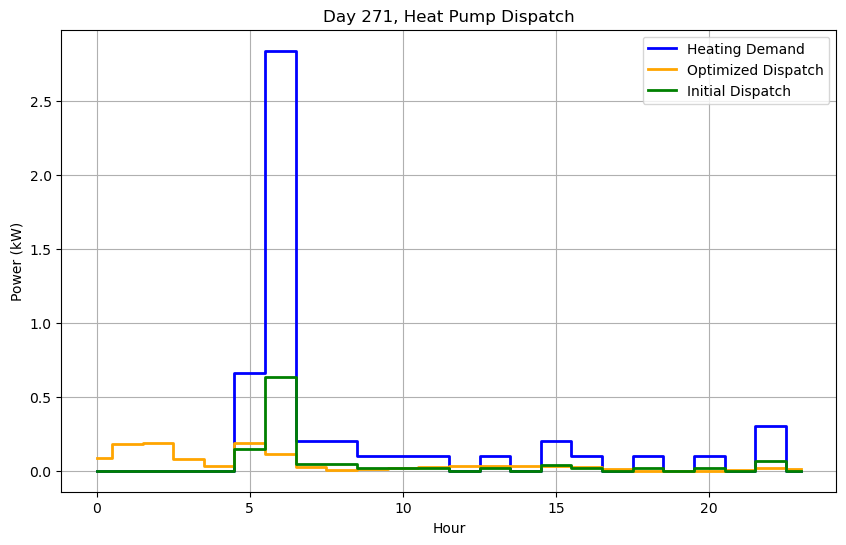


Day 272/365
Initial Guess Cost: €0.40
Optimized Daily Cost: €0.32
Total Heat Consumed (Qconsumption): 4.90 kWh
Total Heat Produced (Qproduction): 5.48 kWh
Buffer Tank Temperature at End of Day: 28.74°C
Optimized Dispatch: [7.22647415e-03 9.44332319e-09 7.33914017e-03 7.35822055e-03
 1.62982613e-01 4.32414829e-02 1.47969750e-02 7.21475586e-03
 2.05119837e-02 6.58252565e-03 3.11348880e-14 6.21505043e-03
 6.20899570e-03 4.93251713e-14 5.64402582e-15 6.05122039e-03
 1.22832298e-02 3.26331276e-14 1.29800665e-02 6.64742310e-03
 9.84345882e-14 1.69445108e-02 7.10331370e-03 3.59928039e-03]


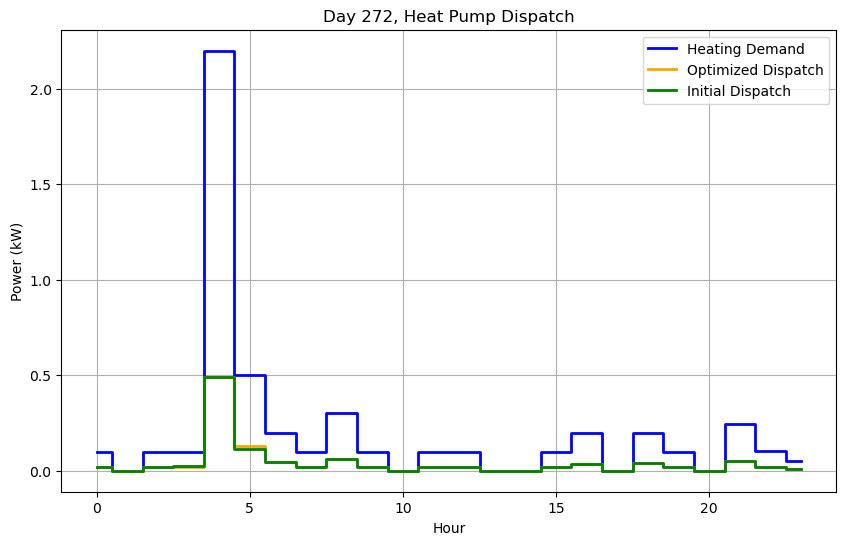


Day 273/365
Initial Guess Cost: €0.61
Optimized Daily Cost: €0.34
Total Heat Consumed (Qconsumption): 6.06 kWh
Total Heat Produced (Qproduction): 7.19 kWh
Buffer Tank Temperature at End of Day: 29.50°C
Optimized Dispatch: [5.78450242e-17 1.39061288e-02 2.72371009e-02 5.21447424e-03
 4.67362312e-17 2.04186816e-01 1.36907924e-16 2.03574920e-16
 2.93862211e-17 9.68518897e-17 1.08506004e-16 1.15397647e-17
 1.29845728e-16 1.22382098e-01 1.04872486e-01 4.87548987e-17
 4.08143476e-17 1.28741795e-16 4.02192650e-17 6.91768993e-17
 1.78987267e-16 3.62672468e-17 6.60891742e-05 4.61572752e-04]


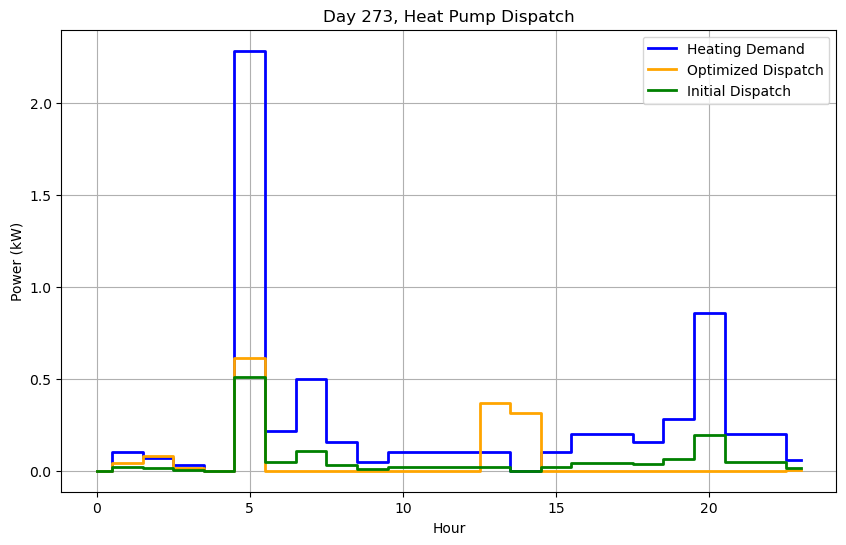


Day 274/365
Initial Guess Cost: €0.38
Optimized Daily Cost: €0.32
Total Heat Consumed (Qconsumption): 5.20 kWh
Total Heat Produced (Qproduction): 5.69 kWh
Buffer Tank Temperature at End of Day: 29.53°C
Optimized Dispatch: [3.13722605e-03 1.54963733e-02 2.11268419e-07 9.58041284e-02
 3.74543039e-02 2.12711561e-02 2.51030790e-02 5.95254753e-02
 1.58945146e-02 1.26692214e-02 6.81017624e-03 6.70906369e-03
 1.32672523e-02 2.41296930e-13 1.84103839e-02 7.71341225e-03
 7.46721945e-15 6.69992895e-03 6.91038991e-03 7.01356610e-03
 7.10625218e-03 1.43637106e-02 7.29177323e-03 4.57708266e-03]


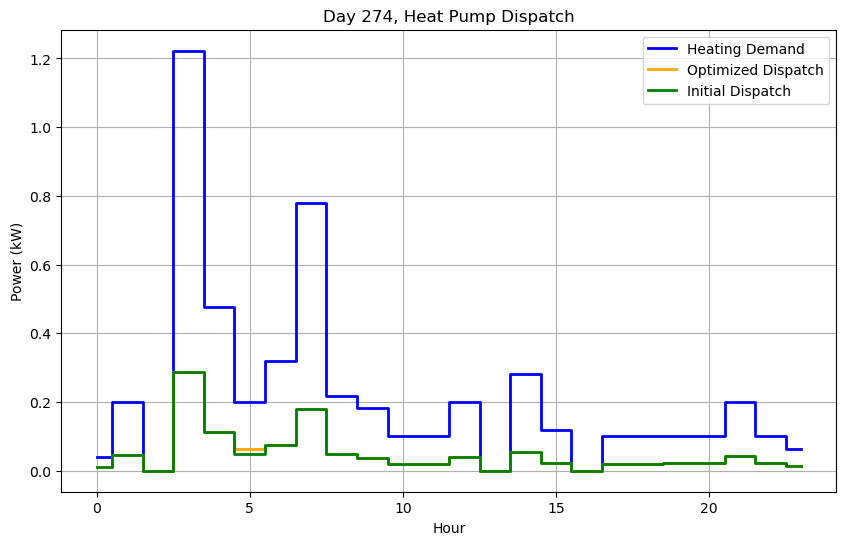


Day 275/365
Initial Guess Cost: €0.19
Optimized Daily Cost: €0.10
Total Heat Consumed (Qconsumption): 1.54 kWh
Total Heat Produced (Qproduction): 1.71 kWh
Buffer Tank Temperature at End of Day: 29.20°C
Optimized Dispatch: [2.99925286e-04 5.87426195e-03 1.88359854e-03 9.00622041e-02
 1.81081024e-02 1.27933115e-02 1.50605024e-15 1.47604873e-15
 2.08999434e-15 1.60691514e-15 1.29095124e-15 1.46972705e-15
 1.34061972e-15 1.35143612e-15 1.34442790e-15 1.16395608e-15
 1.38401801e-15 1.58408798e-15 1.43045014e-15 2.34016789e-15
 1.31374218e-15 1.58643327e-15 1.40023891e-15 1.37709718e-15]


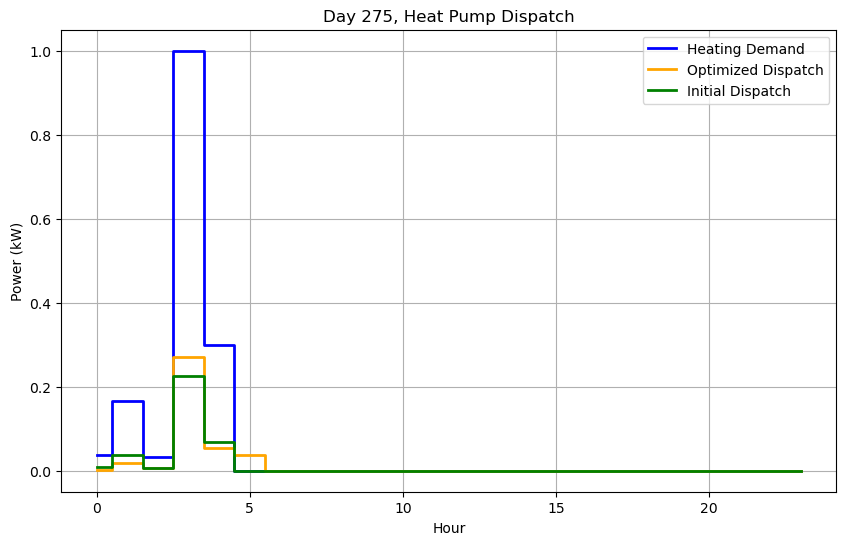


Day 276/365
Initial Guess Cost: €0.05
Optimized Daily Cost: €0.01
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.43 kWh
Buffer Tank Temperature at End of Day: 29.18°C
Optimized Dispatch: [1.25950866e-11 1.25629684e-11 1.25880085e-11 1.28707749e-11
 1.33136458e-11 4.67799511e-03 4.77981531e-12 3.00459923e-12
 9.81595500e-08 1.55237293e-06 3.28336613e-06 4.17660905e-06
 6.05761332e-06 2.27162199e-02 5.75587751e-06 4.48117365e-06
 3.32224450e-06 1.09320782e-06 2.19455656e-11 2.42984523e-11
 2.40483248e-11 1.87156130e-11 2.38213352e-11 7.40542698e-11]


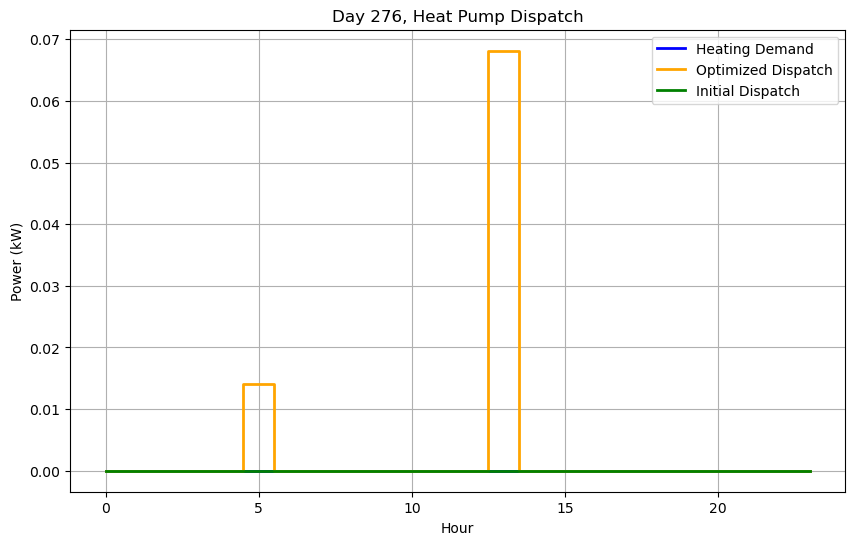


Day 277/365
Initial Guess Cost: €0.24
Optimized Daily Cost: €0.07
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 1.37 kWh
Buffer Tank Temperature at End of Day: 30.19°C
Optimized Dispatch: [1.21009769e-11 3.23879849e-05 1.22318598e-02 2.76737874e-02
 4.37333536e-03 1.63811553e-03 1.01327422e-11 8.81239444e-12
 7.61884160e-12 6.37733837e-12 9.34124961e-04 2.32817631e-03
 4.79615003e-03 4.69214720e-03 4.76071157e-03 3.60709124e-03
 1.96849917e-03 1.10180201e-04 6.34786246e-09 7.87401523e-09
 9.38605811e-09 4.63269420e-04 5.83930085e-04 8.00431103e-04]


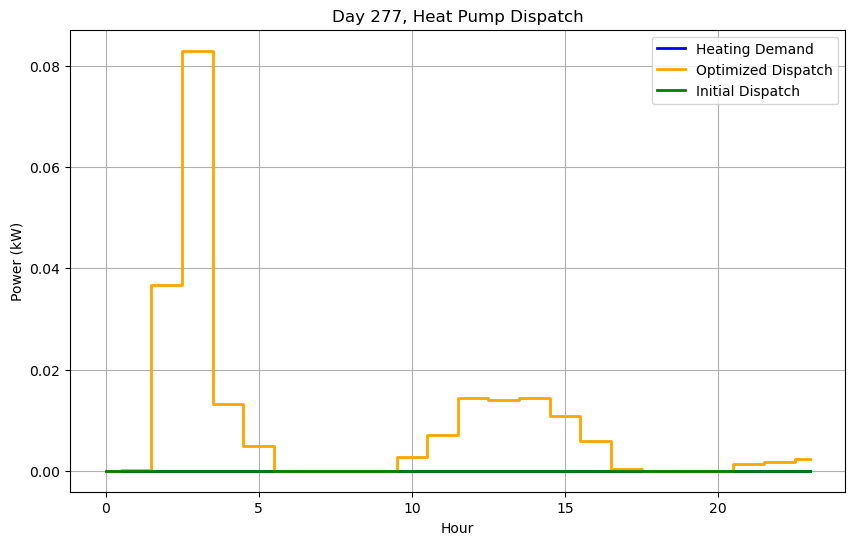


Day 278/365
Initial Guess Cost: €0.05
Optimized Daily Cost: €0.04
Total Heat Consumed (Qconsumption): 0.10 kWh
Total Heat Produced (Qproduction): 0.53 kWh
Buffer Tank Temperature at End of Day: 30.12°C
Optimized Dispatch: [1.37436161e-16 5.89433571e-10 1.26889861e-17 3.30509089e-04
 7.44298088e-03 1.05861326e-05 5.31120530e-07 4.14155694e-15
 6.16762441e-15 8.22255212e-15 5.82301115e-05 8.75306527e-05
 9.90859887e-05 1.00088874e-04 7.85994987e-05 6.31003408e-05
 2.34562517e-05 2.50639887e-14 2.71446560e-14 2.92219408e-14
 3.14679796e-14 7.79835565e-03 3.58129611e-14 2.37532084e-06]


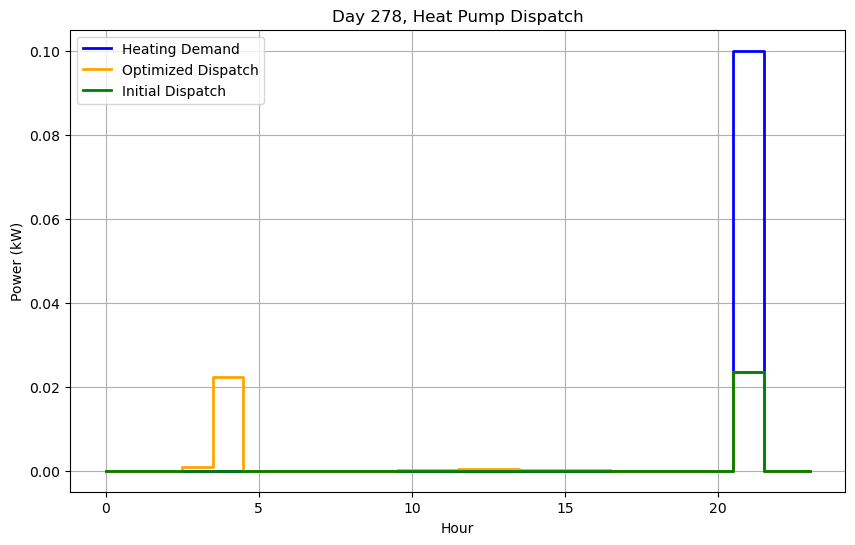


Day 279/365
Initial Guess Cost: €0.05
Optimized Daily Cost: €0.05
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.55 kWh
Buffer Tank Temperature at End of Day: 30.18°C
Optimized Dispatch: [2.90711733e-13 3.41606584e-08 1.37487342e-10 1.83954398e-07
 6.78587333e-08 1.29607543e-10 1.13966967e-03 5.30902185e-14
 3.15345205e-14 2.53147216e-12 1.89686681e-14 1.48631560e-11
 1.22629357e-12 1.16156607e-12 1.16437802e-12 1.45513066e-12
 1.60360854e-12 1.62949969e-14 1.71072245e-11 1.40012024e-12
 3.55146291e-11 1.83907112e-10 1.44687486e-14 5.77876447e-13]


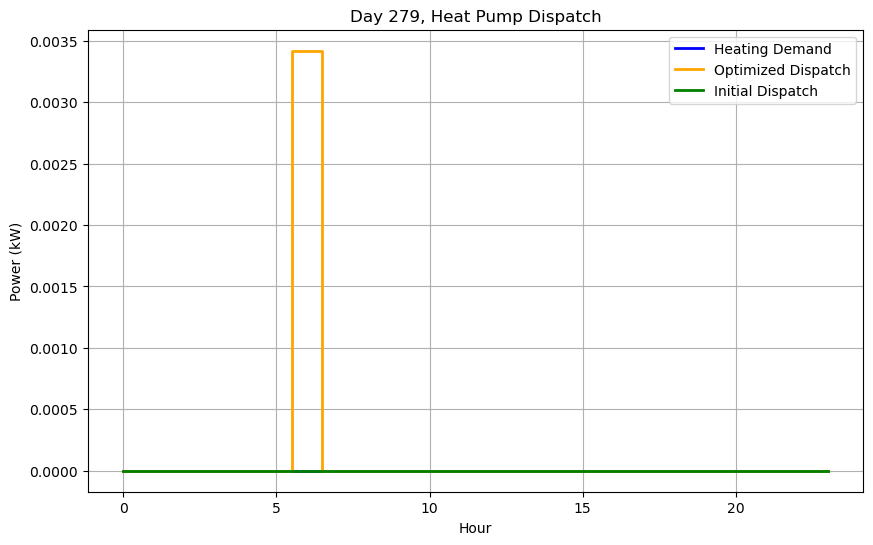


Day 280/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 29.63°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


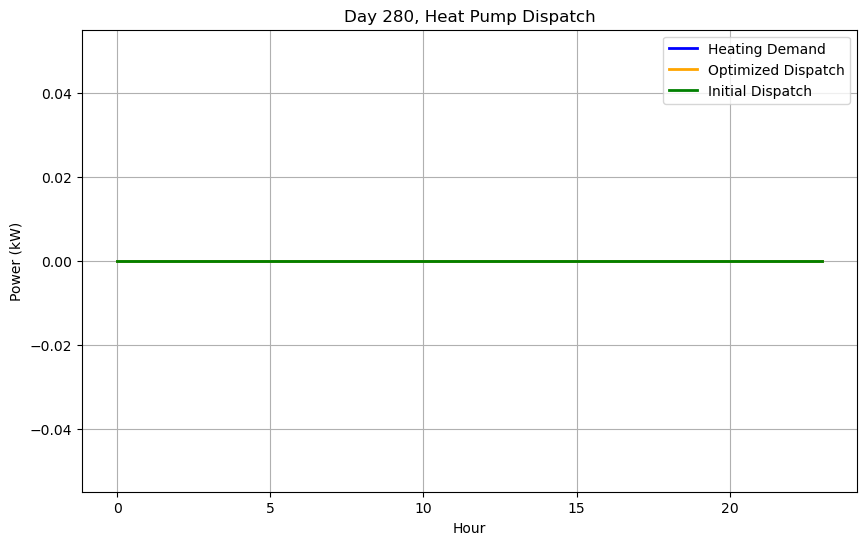


Day 281/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 29.12°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


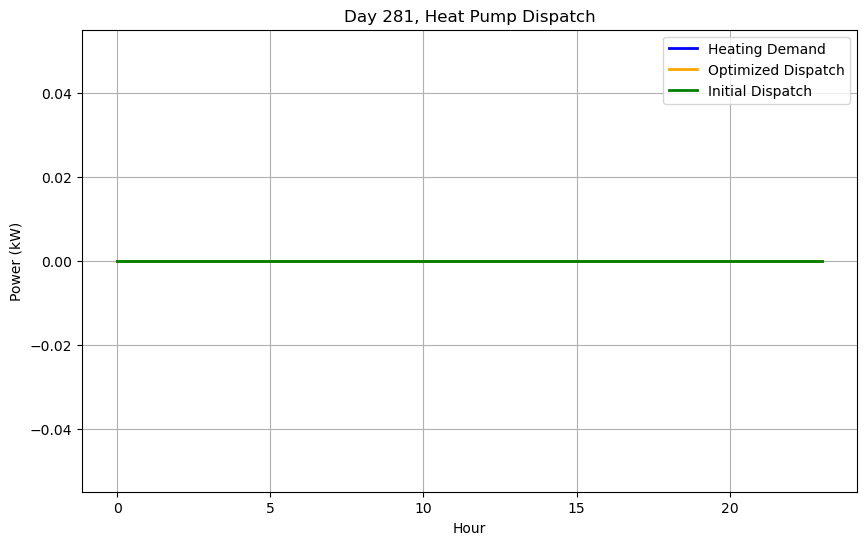


Day 282/365
Initial Guess Cost: €0.04
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.07 kWh
Buffer Tank Temperature at End of Day: 28.71°C
Optimized Dispatch: [3.37622475e-06 1.94692623e-03 1.72699326e-15 1.17088279e-17
 1.66505603e-15 2.33459730e-15 1.10969226e-15 1.08609858e-15
 8.87857385e-16 1.88673589e-15 3.33684167e-16 1.93451398e-15
 3.77649554e-16 1.66521151e-15 4.43928721e-16 1.36984672e-15
 1.59187728e-15 8.27433078e-16 1.03526548e-18 1.77716425e-15
 6.66333069e-16 7.77457598e-16 6.66643646e-16 1.03724955e-15]


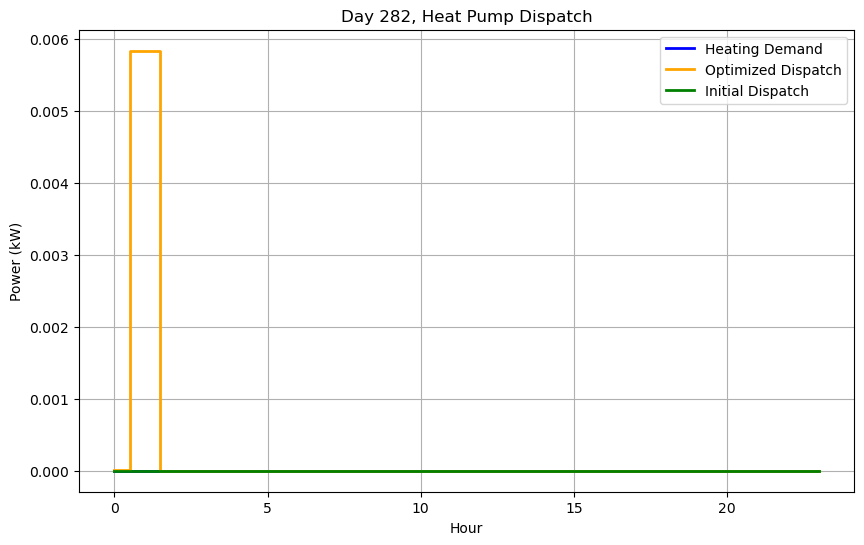


Day 283/365
Initial Guess Cost: €0.13
Optimized Daily Cost: €0.05
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.79 kWh
Buffer Tank Temperature at End of Day: 29.10°C
Optimized Dispatch: [2.53339569e-02 7.50305515e-03 2.57811797e-04 3.53887207e-04
 8.93012160e-03 1.29353215e-02 3.17018924e-03 4.08653263e-12
 4.04154570e-12 3.29219623e-12 2.99650303e-12 2.98056454e-12
 2.88493301e-12 2.82503667e-12 2.86102154e-12 2.94204877e-12
 2.89427248e-12 3.11794319e-12 3.20545278e-12 3.37100434e-12
 2.99831726e-12 2.77953732e-12 2.86826088e-12 2.58370398e-12]


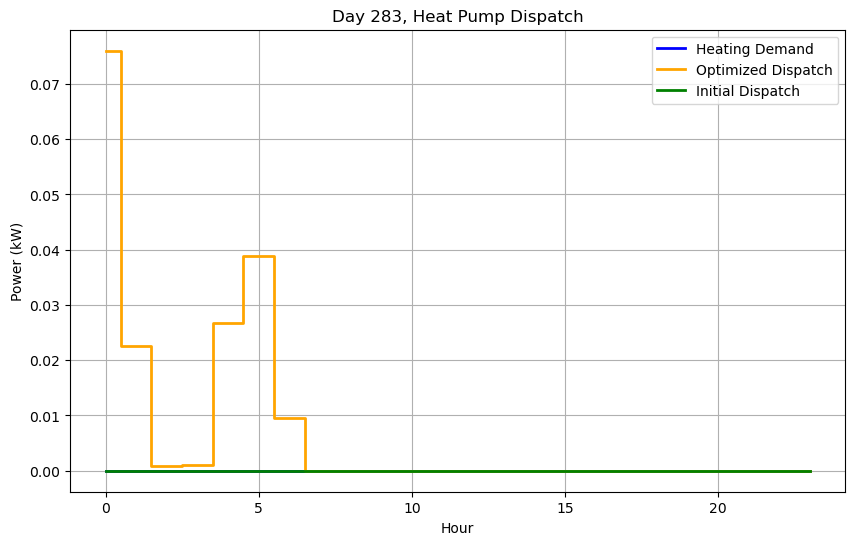


Day 284/365
Initial Guess Cost: €0.05
Optimized Daily Cost: €0.02
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.51 kWh
Buffer Tank Temperature at End of Day: 29.17°C
Optimized Dispatch: [1.81587160e-14 1.39539500e-14 1.26498771e-02 4.81305041e-03
 8.26418519e-03 8.90113990e-03 3.42209235e-03 8.81924920e-15
 8.82102470e-15 1.00844988e-14 5.78376228e-15 4.95663496e-15
 4.93971983e-15 4.76225524e-15 4.33395593e-15 7.15754974e-15
 6.68900807e-15 8.04687965e-15 1.11133878e-14 8.26232101e-15
 1.10872891e-14 1.01321861e-14 7.98216409e-15 9.91775318e-15]


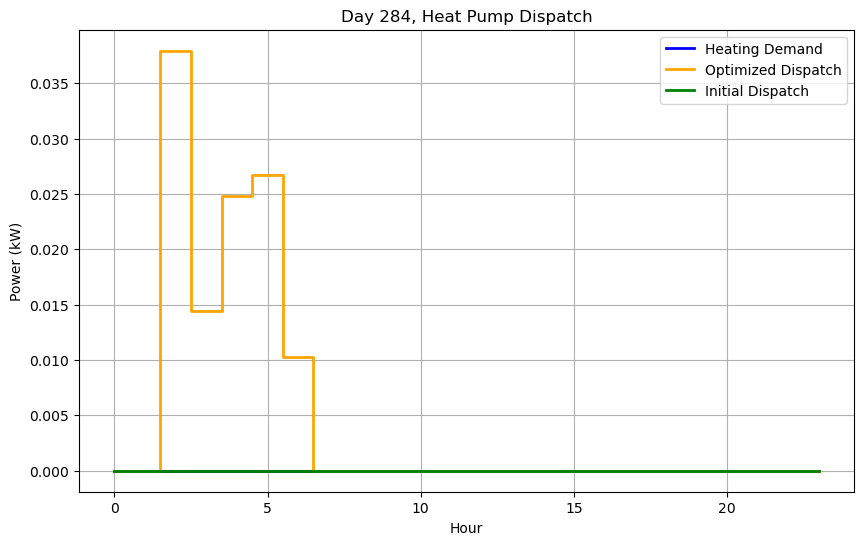


Day 285/365
Initial Guess Cost: €0.00
Optimized Daily Cost: €0.00
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.00 kWh
Buffer Tank Temperature at End of Day: 28.68°C
Optimized Dispatch: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


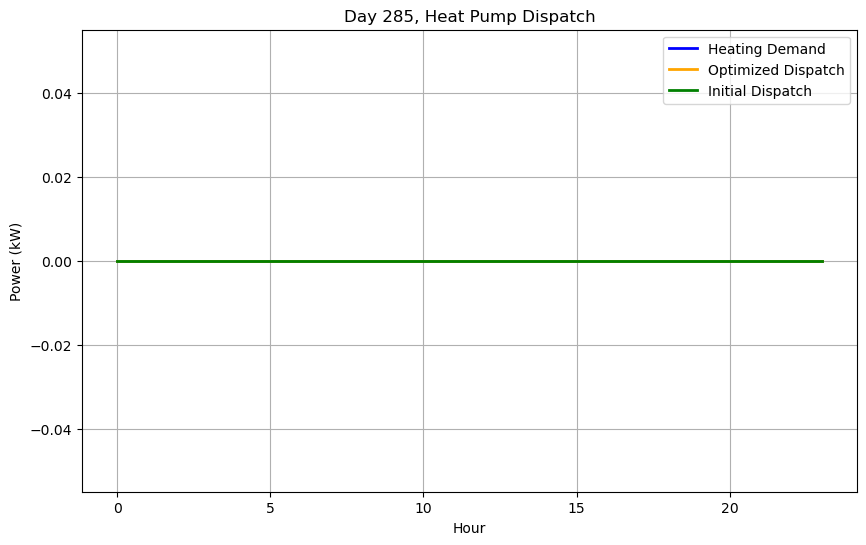


Day 286/365
Initial Guess Cost: €0.10
Optimized Daily Cost: €0.04
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 0.53 kWh
Buffer Tank Temperature at End of Day: 28.80°C
Optimized Dispatch: [1.03762349e-13 3.67790521e-14 4.05143880e-12 1.09370422e-08
 8.00460234e-06 3.73491635e-12 6.48144036e-03 1.30980724e-13
 2.08444857e-13 2.32544635e-13 1.11530742e-13 1.00371854e-13
 8.38609697e-14 7.23255512e-14 1.50108688e-13 7.10003519e-14
 7.27893872e-14 8.92753332e-14 1.79006828e-13 1.02223508e-13
 7.60646268e-14 7.14027549e-14 7.17076586e-14 6.91180925e-14]


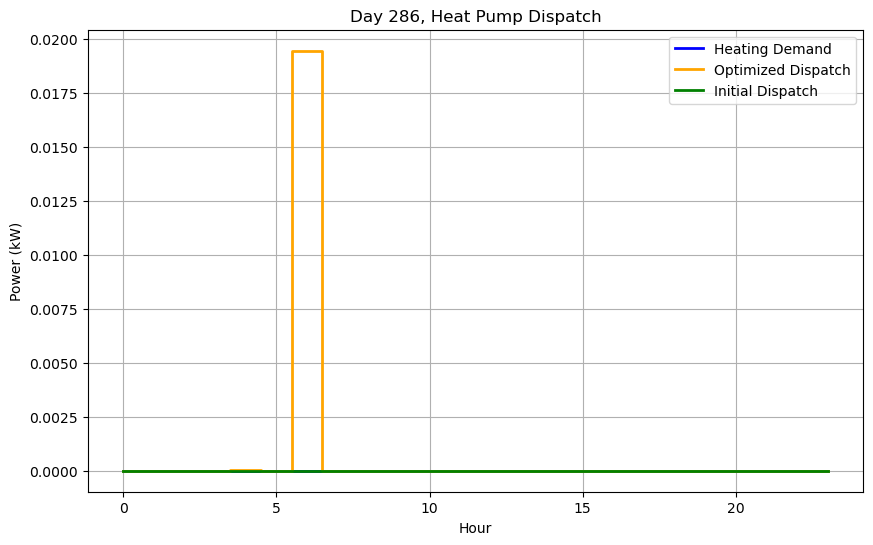


Day 287/365
Initial Guess Cost: €0.09
Optimized Daily Cost: €0.11
Total Heat Consumed (Qconsumption): 0.00 kWh
Total Heat Produced (Qproduction): 1.60 kWh
Buffer Tank Temperature at End of Day: 30.13°C
Optimized Dispatch: [1.02669282e-06 1.03113785e-06 1.04540232e-06 5.40771717e-04
 9.11143830e-04 9.07130387e-04 2.34360145e-04 1.17176387e-06
 1.13622449e-06 1.08060915e-06 1.19789062e-06 1.25728254e-06
 7.27817350e-04 7.62163489e-04 5.84740492e-04 1.35676708e-08
 4.16960972e-10 3.27996852e-09 1.29899679e-04 1.59260948e-10
 5.34558189e-09 1.60611414e-04 1.69266013e-02 1.10492294e-09]


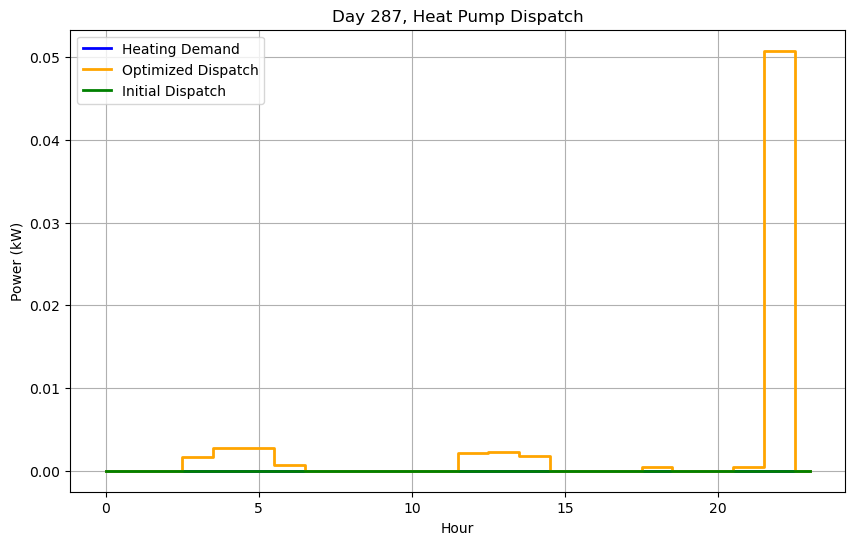


Day 288/365
Initial Guess Cost: €0.23
Optimized Daily Cost: €0.20
Total Heat Consumed (Qconsumption): 2.00 kWh
Total Heat Produced (Qproduction): 3.66 kWh
Buffer Tank Temperature at End of Day: 31.43°C
Optimized Dispatch: [5.92866005e-11 7.17881925e-05 3.62784802e-07 2.18565770e-08
 7.11715604e-03 2.13148674e-03 2.95049284e-03 3.88752324e-03
 1.52247870e-03 1.65092111e-03 5.94555783e-03 6.94112571e-03
 6.24460531e-03 6.60507253e-03 6.98433516e-03 6.75052698e-03
 8.60084917e-02 2.03381903e-02 6.82960798e-02 3.88597870e-08
 4.48313088e-08 2.20589214e-03 2.21934858e-03 2.06201333e-03]


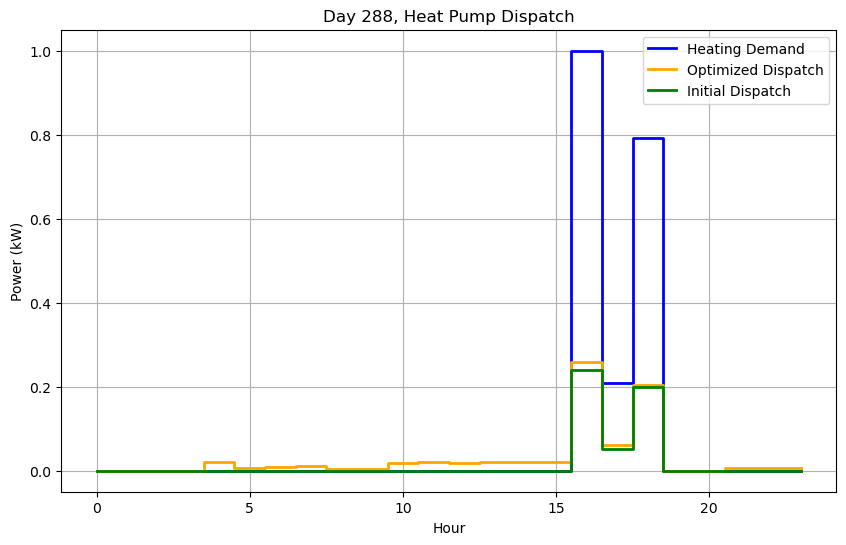


Day 289/365
Initial Guess Cost: €1.17
Optimized Daily Cost: €1.40
Total Heat Consumed (Qconsumption): 13.50 kWh
Total Heat Produced (Qproduction): 16.02 kWh
Buffer Tank Temperature at End of Day: 33.62°C
Optimized Dispatch: [2.59823852e-08 4.89385640e-08 4.12423362e-08 5.44737423e-02
 5.50292776e-02 3.68517790e-02 3.31894084e-01 2.65250514e-01
 5.24388552e-02 1.86765048e-14 7.99300333e-03 7.81851110e-03
 7.82495496e-03 7.71348800e-03 7.94805040e-14 2.34168834e-02
 1.58323994e-02 6.68374182e-02 1.22197025e-01 1.27181318e-02
 6.07711729e-02 3.63854903e-02 1.72714973e-02 8.65267301e-03]


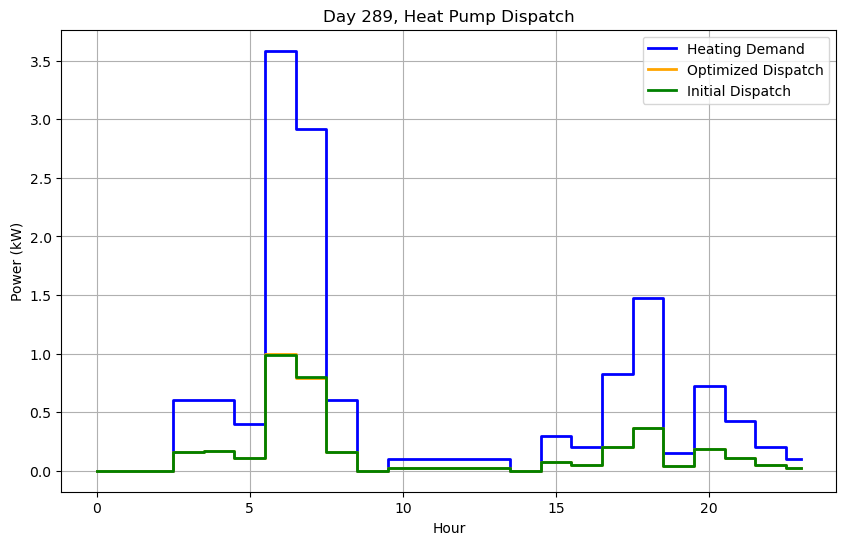


Day 290/365
Initial Guess Cost: €1.11
Optimized Daily Cost: €1.11
Total Heat Consumed (Qconsumption): 14.40 kWh
Total Heat Produced (Qproduction): 13.02 kWh
Buffer Tank Temperature at End of Day: 31.39°C
Optimized Dispatch: [2.75254857e-03 4.98810805e-12 5.04263122e-12 7.77270195e-02
 7.56065514e-02 3.47822700e-02 2.39584415e-02 9.30789283e-03
 2.97606338e-02 2.62452482e-03 6.07092890e-04 1.31087718e-02
 3.24406938e-02 7.74200514e-02 7.87662240e-02 3.50816349e-02
 4.95712905e-03 6.17175536e-02 1.43998114e-02 5.18818686e-02
 5.41113161e-03 5.43065934e-03 2.72504440e-03 2.78199648e-03]


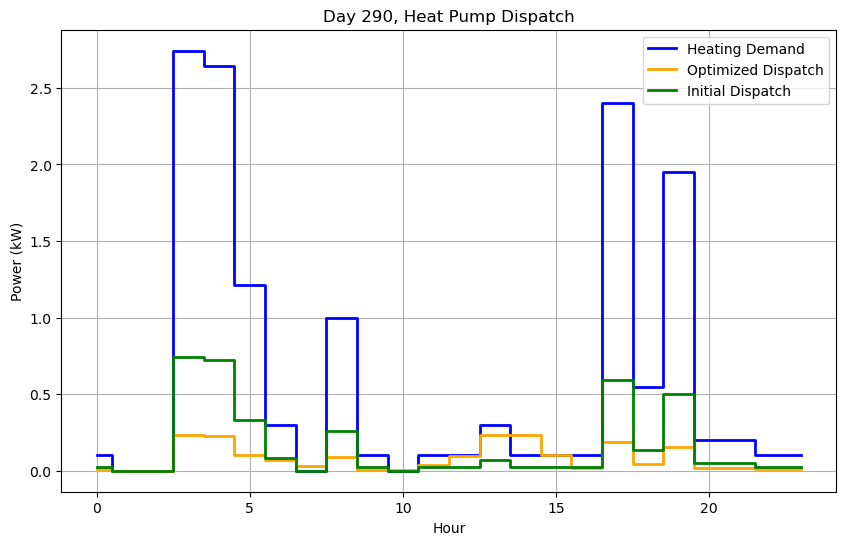


Day 291/365
Initial Guess Cost: €1.05
Optimized Daily Cost: €1.01
Total Heat Consumed (Qconsumption): 13.97 kWh
Total Heat Produced (Qproduction): 14.32 kWh
Buffer Tank Temperature at End of Day: 31.16°C
Optimized Dispatch: [1.59809735e-09 8.38947355e-08 3.26064172e-08 2.58787206e-01
 2.56238304e-01 1.15385152e-01 3.13594399e-02 1.70133876e-01
 4.32781806e-02 1.60139735e-17 8.04638385e-03 7.79825434e-03
 2.76853850e-03 1.20547280e-02 6.05471682e-16 2.21393191e-02
 1.48841613e-02 7.55736464e-03 7.60680863e-03 1.92316945e-01
 2.33026461e-02 7.78522160e-03 7.81439867e-03 1.31169673e-02]


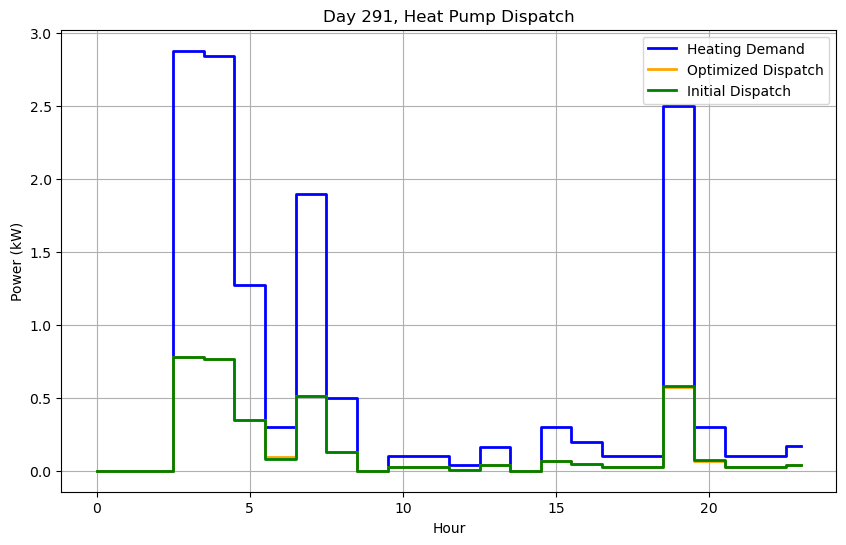


Day 292/365
Initial Guess Cost: €0.62
Optimized Daily Cost: €0.60
Total Heat Consumed (Qconsumption): 11.43 kWh
Total Heat Produced (Qproduction): 10.24 kWh
Buffer Tank Temperature at End of Day: 29.26°C
Optimized Dispatch: [0.00158333 0.00479201 0.00477791 0.18523104 0.02387462 0.02152819
 0.09834005 0.03767946 0.01400939 0.00461428 0.00632025 0.00855863
 0.01148581 0.00923729 0.01344018 0.01191656 0.0160663  0.00477039
 0.00930807 0.11654573 0.00840281 0.0129298  0.00810409 0.00830962]


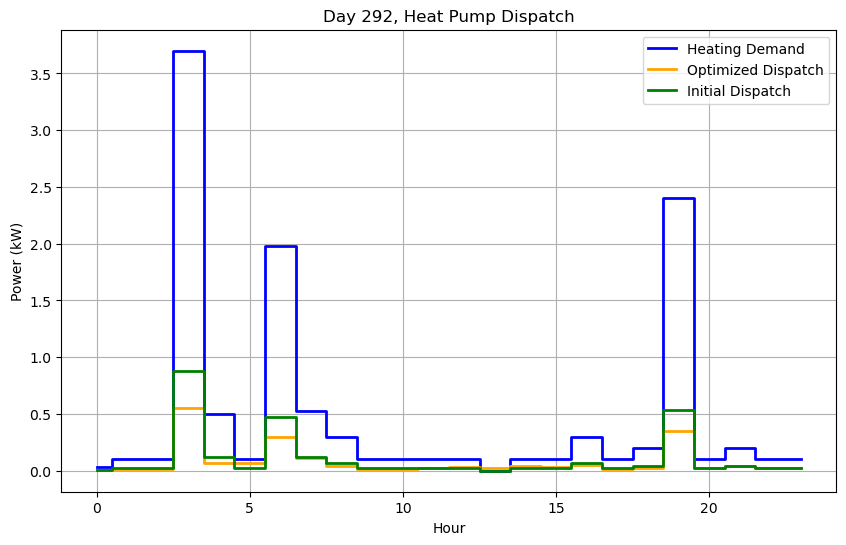


Day 293/365
Initial Guess Cost: €0.28
Optimized Daily Cost: €0.27
Total Heat Consumed (Qconsumption): 4.90 kWh
Total Heat Produced (Qproduction): 5.51 kWh
Buffer Tank Temperature at End of Day: 29.44°C
Optimized Dispatch: [4.77322596e-10 8.62294893e-03 7.43035688e-03 7.53713653e-03
 1.88887728e-01 6.99502232e-02 7.62544456e-03 9.84931697e-03
 7.49742896e-03 7.34686301e-03 7.27244714e-03 7.25689275e-03
 8.86420333e-04 8.48337734e-03 8.65037503e-03 1.62935885e-03
 8.27132763e-03 7.66743356e-03 5.35608776e-05 7.34389488e-03
 5.47163069e-04 9.03284022e-03 1.68001476e-03 1.99420322e-03]


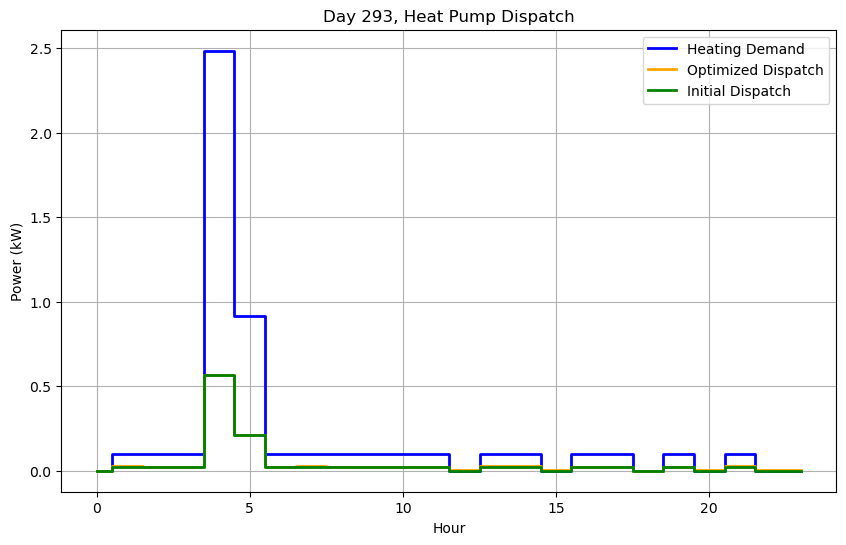


Day 294/365
Initial Guess Cost: €0.15
Optimized Daily Cost: €0.08
Total Heat Consumed (Qconsumption): 0.80 kWh
Total Heat Produced (Qproduction): 1.42 kWh
Buffer Tank Temperature at End of Day: 29.62°C
Optimized Dispatch: [7.57617487e-03 2.60314339e-08 7.74096295e-03 5.19942416e-14
 1.52406102e-02 1.64451262e-04 3.11633166e-05 7.65940100e-03
 1.84101891e-10 2.02021011e-05 7.73724010e-03 1.15125033e-03
 1.50972081e-03 1.64076569e-03 8.64742955e-03 1.33521528e-03
 4.32974440e-12 7.84648116e-12 7.40583401e-03 1.49331329e-11
 3.21782643e-05 5.41897950e-04 8.36308690e-03 1.03755577e-03]


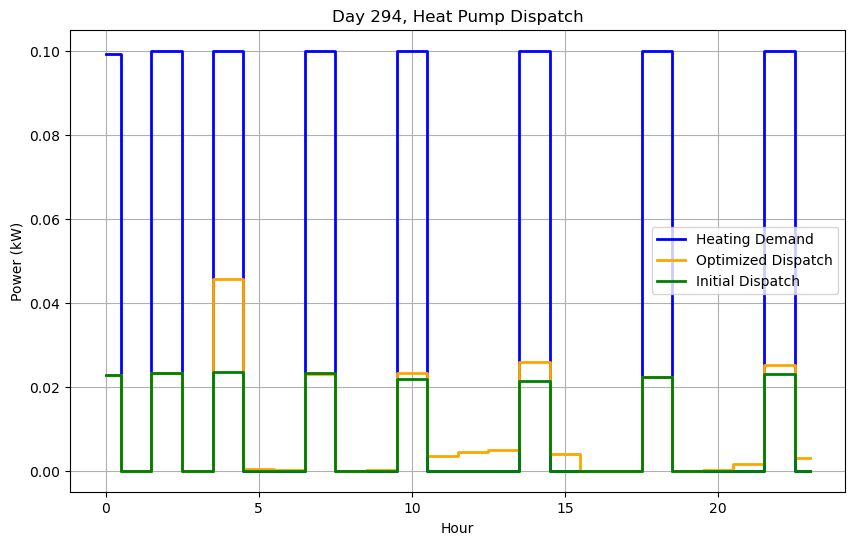


Day 295/365
Initial Guess Cost: €1.76
Optimized Daily Cost: €1.77
Total Heat Consumed (Qconsumption): 31.10 kWh
Total Heat Produced (Qproduction): 31.88 kWh
Buffer Tank Temperature at End of Day: 29.96°C
Optimized Dispatch: [2.12878052e-13 2.19780924e-14 7.81638717e-03 2.41482062e-17
 1.64087655e-13 2.36573732e-06 8.05979300e-03 1.88210303e-03
 8.09112406e-10 7.19822394e-10 6.29016487e-10 2.87516095e-04
 8.11227793e-03 1.44590690e-01 5.21348884e-01 1.74379562e-01
 3.88665871e-01 3.03715147e-01 1.62781799e-01 2.84058532e-01
 2.75142558e-01 2.05372598e-02 1.58160941e-02 7.91530716e-03]


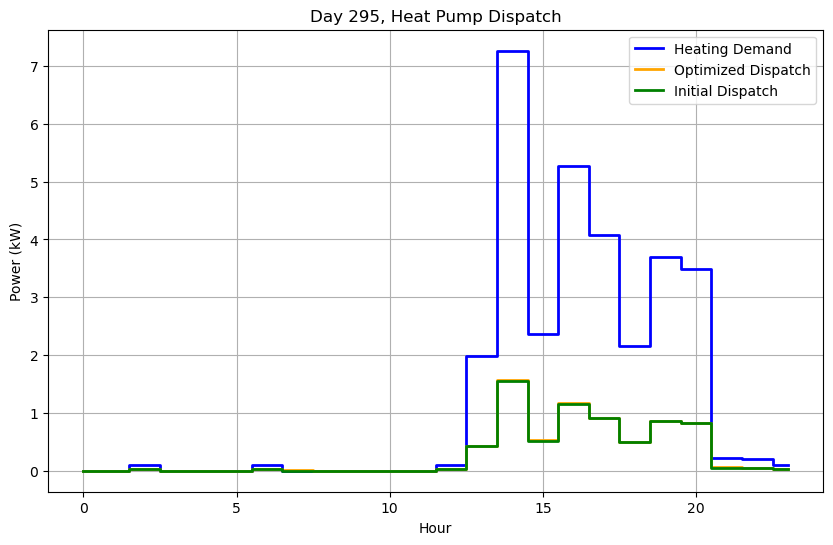


Day 296/365
Initial Guess Cost: €1.44
Optimized Daily Cost: €1.30
Total Heat Consumed (Qconsumption): 17.70 kWh
Total Heat Produced (Qproduction): 18.46 kWh
Buffer Tank Temperature at End of Day: 30.24°C
Optimized Dispatch: [2.36886524e-02 8.19243481e-03 8.21810900e-03 2.26547329e-01
 1.24954778e-01 2.22600199e-01 1.79369971e-01 7.36156095e-02
 1.52804801e-02 1.46763476e-02 2.12233023e-02 6.95143914e-03
 6.91925811e-03 6.95439070e-03 1.39273689e-02 3.49100328e-16
 1.70030454e-01 2.17069501e-02 2.14140289e-01 3.02003909e-02
 1.75171796e-02 7.29027490e-03 7.29084797e-03 1.46322482e-02]


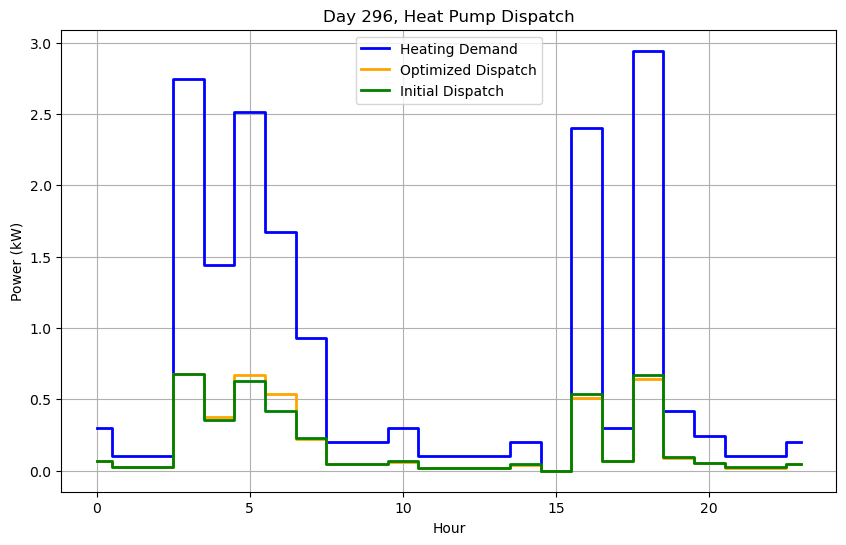


Day 297/365
Initial Guess Cost: €1.06
Optimized Daily Cost: €1.05
Total Heat Consumed (Qconsumption): 16.70 kWh
Total Heat Produced (Qproduction): 16.71 kWh
Buffer Tank Temperature at End of Day: 29.70°C
Optimized Dispatch: [0.0032559  0.00325332 0.00324868 0.19461205 0.08032536 0.28164939
 0.04274273 0.0065221  0.0751356  0.01217133 0.00314933 0.00370544
 0.0121319  0.10261862 0.06590452 0.0034296  0.23939032 0.00776101
 0.00641344 0.07416894 0.01494    0.00606861 0.00665741 0.01128653]


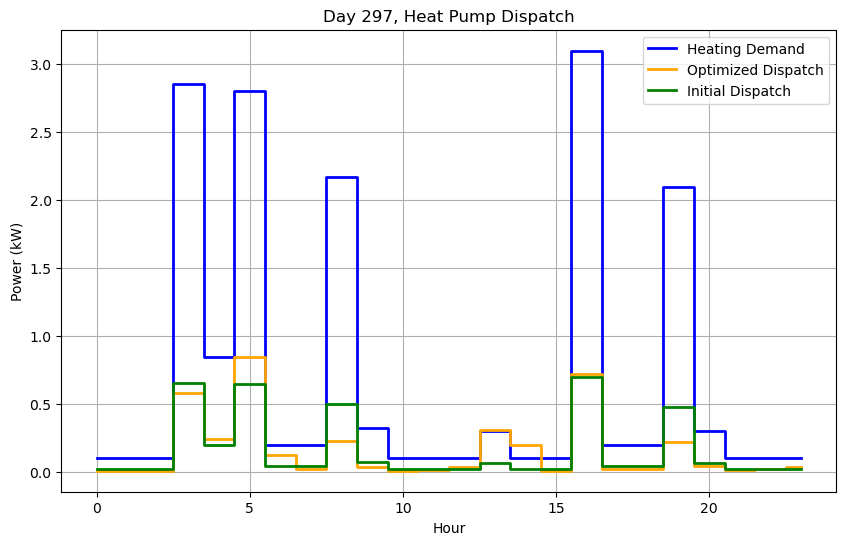


Day 298/365
Initial Guess Cost: €1.54
Optimized Daily Cost: €1.32
Total Heat Consumed (Qconsumption): 19.70 kWh
Total Heat Produced (Qproduction): 20.05 kWh
Buffer Tank Temperature at End of Day: 29.53°C
Optimized Dispatch: [0.01119298 0.0773412  0.06928382 0.2423352  0.19202039 0.17078293
 0.02125781 0.12932922 0.00598845 0.01171506 0.00572186 0.01048016
 0.01461526 0.01557766 0.02104345 0.14614667 0.01467066 0.03854513
 0.12643705 0.01156404 0.15781003 0.01648301 0.00958427 0.01011539]


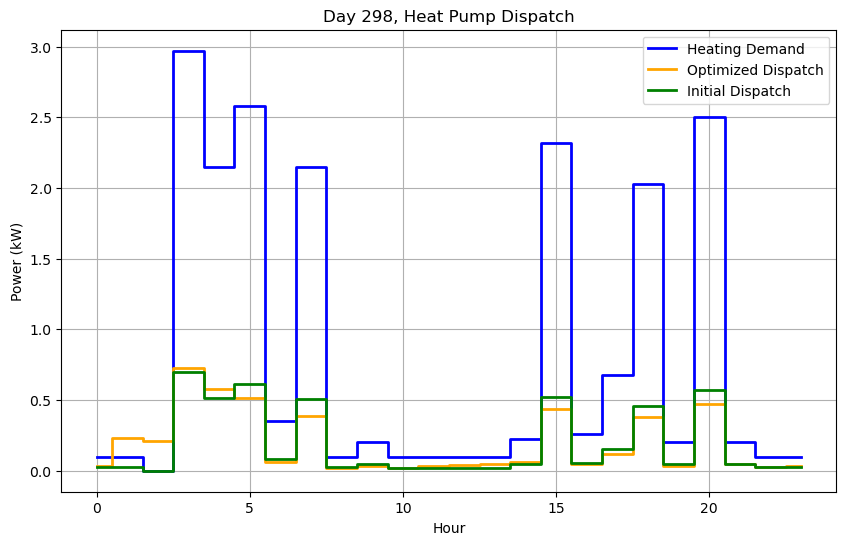


Day 299/365
Initial Guess Cost: €1.33
Optimized Daily Cost: €1.33
Total Heat Consumed (Qconsumption): 19.70 kWh
Total Heat Produced (Qproduction): 20.23 kWh
Buffer Tank Temperature at End of Day: 29.61°C
Optimized Dispatch: [0.00765272 0.0076546  0.00765679 0.19722702 0.07932988 0.06552899
 0.14992123 0.01620444 0.26768768 0.01490714 0.00742444 0.03654319
 0.00754993 0.00768516 0.00772905 0.05017132 0.21890255 0.0229222
 0.26135363 0.0152092  0.00765993 0.03082977 0.00802364 0.00818621]


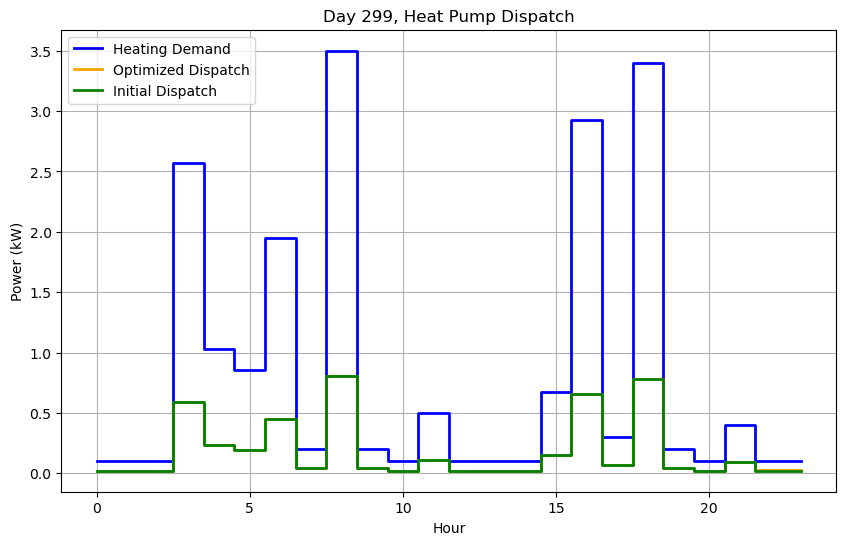


Day 300/365
Initial Guess Cost: €1.51
Optimized Daily Cost: €1.51
Total Heat Consumed (Qconsumption): 21.20 kWh
Total Heat Produced (Qproduction): 22.21 kWh
Buffer Tank Temperature at End of Day: 30.23°C
Optimized Dispatch: [0.00771605 0.0077481  0.00776616 0.0077835  0.11343901 0.0112884
 0.28383967 0.07260777 0.24853008 0.01524422 0.00744334 0.00736625
 0.02984115 0.00843465 0.15522548 0.06589422 0.02343321 0.18550112
 0.04046147 0.25372516 0.05783829 0.02218682 0.01688392 0.00884821]


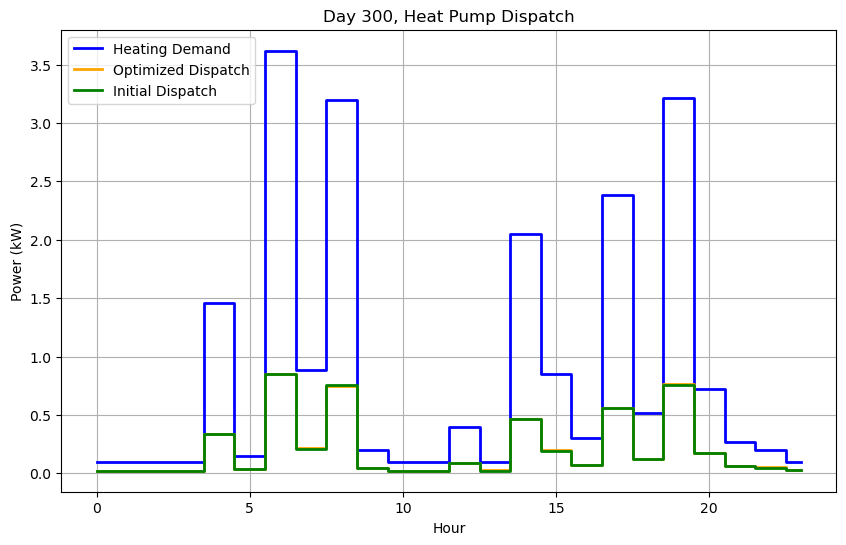


Day 301/365
Initial Guess Cost: €0.63
Optimized Daily Cost: €0.62
Total Heat Consumed (Qconsumption): 11.30 kWh
Total Heat Produced (Qproduction): 11.44 kWh
Buffer Tank Temperature at End of Day: 29.84°C
Optimized Dispatch: [7.29829877e-03 7.26268310e-03 1.42602352e-02 7.24803220e-03
 2.50839820e-01 1.91522447e-01 2.67859059e-01 1.82583589e-02
 2.76811242e-02 6.77074355e-03 6.57008080e-03 1.78193039e-02
 4.44929800e-03 1.25897806e-02 9.83884968e-03 6.26914125e-03
 6.65246150e-03 6.75577116e-03 6.79137716e-03 5.34931293e-17
 6.84278187e-03 6.87840262e-03 4.26426543e-17 7.42566583e-03]


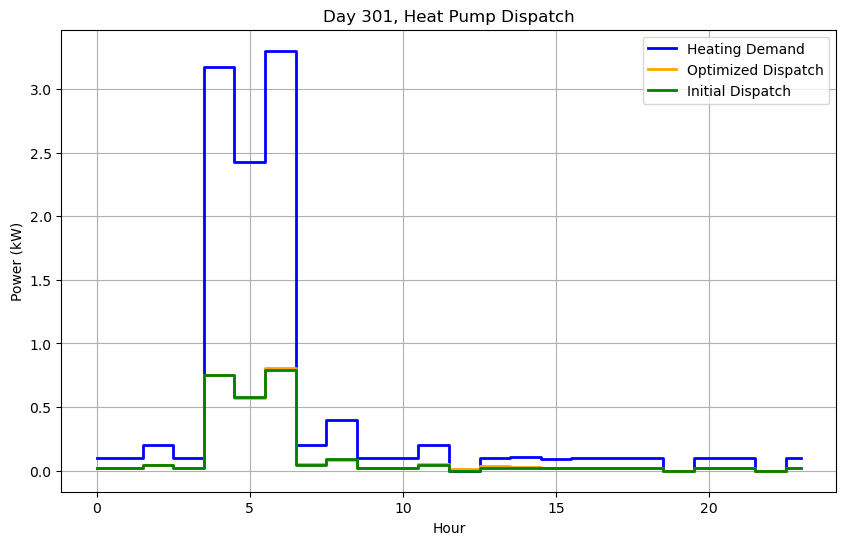


Day 302/365
Initial Guess Cost: €0.06
Optimized Daily Cost: €0.05
Total Heat Consumed (Qconsumption): 0.90 kWh
Total Heat Produced (Qproduction): 1.14 kWh
Buffer Tank Temperature at End of Day: 29.58°C
Optimized Dispatch: [3.37015554e-05 7.56229366e-03 3.45554306e-03 4.49022018e-03
 1.17136571e-07 7.88581914e-03 1.81719005e-03 7.82465989e-03
 5.92068954e-16 7.56400542e-03 4.73546784e-16 1.52578425e-15
 7.23552981e-03 4.23710322e-16 4.66305110e-16 7.13499917e-03
 4.31319263e-14 4.47104126e-14 7.44418010e-16 7.38792655e-03
 5.86097307e-16 1.20358031e-14 1.52415743e-15 7.60151570e-03]


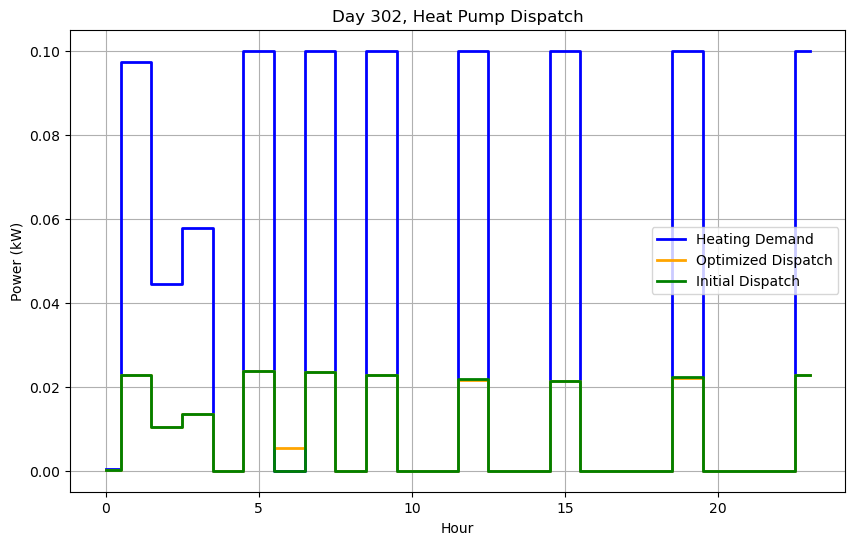


Day 303/365
Initial Guess Cost: €1.56
Optimized Daily Cost: €1.62
Total Heat Consumed (Qconsumption): 23.60 kWh
Total Heat Produced (Qproduction): 23.87 kWh
Buffer Tank Temperature at End of Day: 29.26°C
Optimized Dispatch: [5.09496740e-03 5.61142904e-03 1.91679234e-02 5.80829461e-03
 3.92467764e-04 5.01914556e-02 1.07968298e-01 1.19113746e-01
 8.68837856e-16 8.51175747e-16 6.90868954e-04 4.00243033e-04
 2.54519482e-03 9.22698576e-16 9.38480102e-16 1.09463771e-14
 1.00603808e-15 1.08228974e-15 1.21851544e-14 6.97915578e-02
 4.63857548e-01 3.17177410e-01 5.79371739e-02 1.56560968e-01]


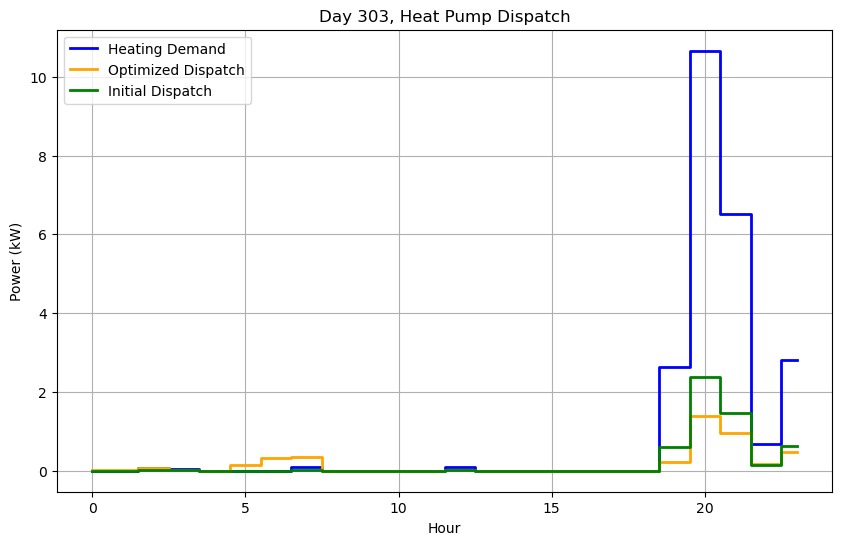


Day 304/365
Initial Guess Cost: €2.20
Optimized Daily Cost: €2.22
Total Heat Consumed (Qconsumption): 35.60 kWh
Total Heat Produced (Qproduction): 36.71 kWh
Buffer Tank Temperature at End of Day: 29.98°C
Optimized Dispatch: [2.25979896e-02 2.35066911e-01 4.66117258e-02 2.54485587e-01
 5.23539637e-01 2.94504101e-01 3.14680936e-01 3.85380887e-01
 1.57648124e-02 7.89729098e-03 2.34493479e-02 7.83757242e-03
 7.71409012e-03 7.66316407e-03 1.52459602e-02 9.53592770e-05
 1.31871722e-01 1.81286142e-01 8.46345601e-02 1.69685507e-01
 1.56829336e-02 2.34435552e-02 7.81505201e-03 7.83244867e-03]


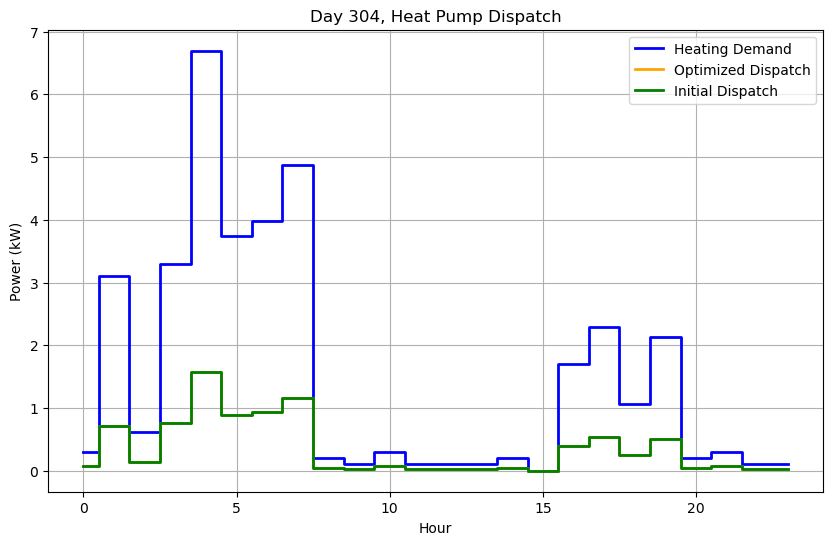


Day 305/365
Initial Guess Cost: €1.26
Optimized Daily Cost: €1.12
Total Heat Consumed (Qconsumption): 19.80 kWh
Total Heat Produced (Qproduction): 20.34 kWh
Buffer Tank Temperature at End of Day: 30.05°C
Optimized Dispatch: [1.44686194e-02 8.12187182e-02 2.85758214e-12 7.19337441e-03
 2.24798919e-01 2.35798793e-01 2.80180268e-01 1.65190278e-02
 3.57149033e-02 1.40344595e-02 7.58832372e-03 8.29529597e-03
 8.70291100e-03 8.54256297e-03 7.86050709e-03 6.84922097e-03
 9.71578634e-02 1.12150892e-01 1.00023856e-01 1.41130466e-02
 2.06687042e-01 1.88171599e-02 7.09083491e-03 7.37358485e-03]


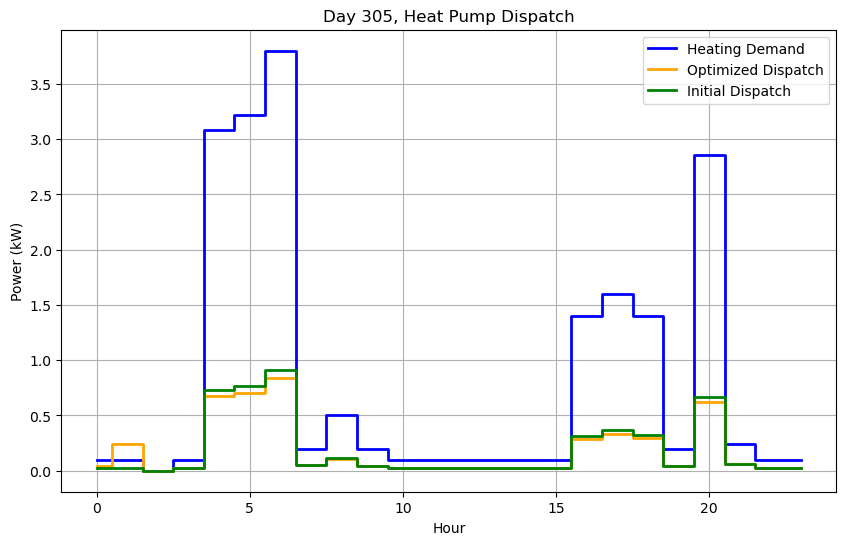


Day 306/365
Initial Guess Cost: €1.54
Optimized Daily Cost: €1.56
Total Heat Consumed (Qconsumption): 27.40 kWh
Total Heat Produced (Qproduction): 28.35 kWh
Buffer Tank Temperature at End of Day: 30.56°C
Optimized Dispatch: [1.63558541e-02 6.71832999e-19 8.24114333e-03 8.26273488e-03
 2.27912877e-01 2.31365956e-01 2.16083764e-01 2.38993543e-02
 2.53611218e-01 2.35688680e-02 8.40456721e-03 1.04808419e-01
 1.00146130e-01 2.48006101e-02 1.64761477e-02 2.59839944e-01
 1.67620969e-02 1.26236206e-01 2.81510055e-03 2.07135928e-01
 9.24139333e-02 2.13845553e-01 8.01914719e-03 2.48387348e-02]


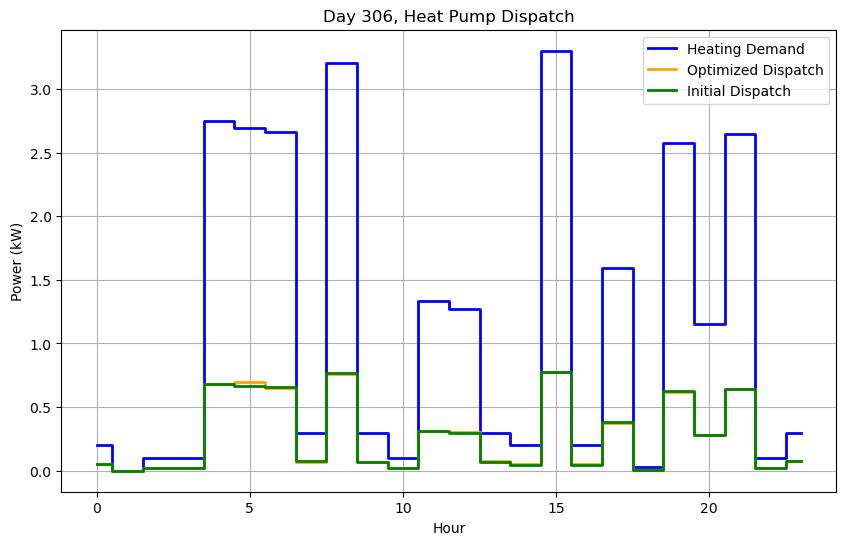


Day 307/365
Initial Guess Cost: €2.10
Optimized Daily Cost: €2.02
Total Heat Consumed (Qconsumption): 34.60 kWh
Total Heat Produced (Qproduction): 35.52 kWh
Buffer Tank Temperature at End of Day: 31.03°C
Optimized Dispatch: [0.00834425 0.00835433 0.00842063 0.10064947 0.1719178  0.24088704
 0.32764044 0.3294688  0.02453631 0.00809244 0.25142954 0.00845087
 0.01719262 0.00944821 0.24713187 0.02568876 0.22637274 0.12326947
 0.10032734 0.28322564 0.02633262 0.31926341 0.02637352 0.00112148]


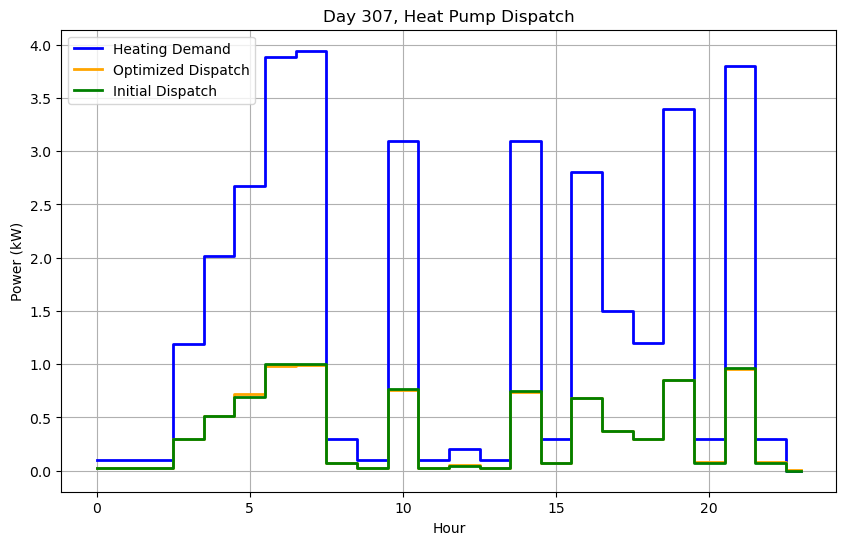


Day 308/365
Initial Guess Cost: €1.45
Optimized Daily Cost: €1.32
Total Heat Consumed (Qconsumption): 27.80 kWh
Total Heat Produced (Qproduction): 27.59 kWh
Buffer Tank Temperature at End of Day: 30.19°C
Optimized Dispatch: [1.73196435e-02 2.97392897e-05 4.39868826e-03 3.11034517e-01
 4.68889118e-02 2.65035791e-01 4.44584502e-01 1.21832310e-01
 2.94457307e-01 3.15350492e-02 7.74915645e-03 7.60287629e-03
 7.45514375e-03 2.20404792e-02 7.36579771e-03 1.47127290e-02
 1.95674714e-01 2.28795505e-02 2.28254187e-01 1.53117788e-02
 1.54655472e-02 1.82108439e-01 3.73354146e-02 8.95511947e-03]


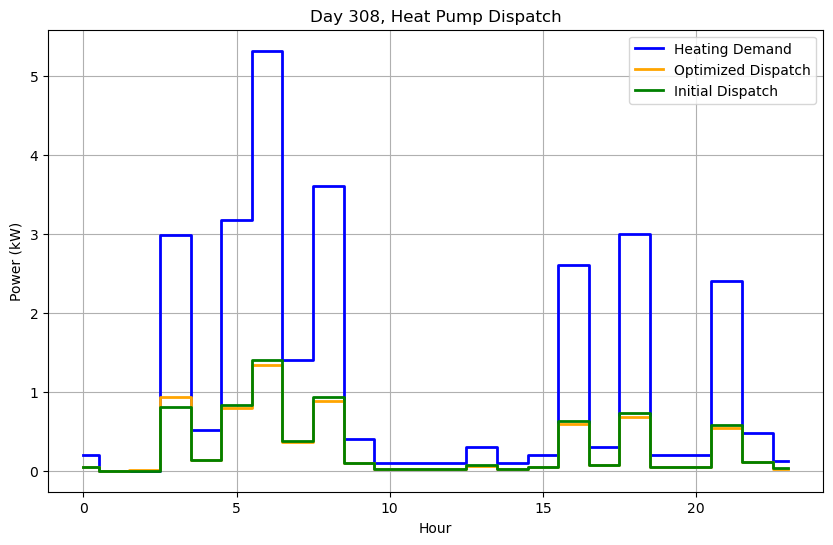


Day 309/365
Initial Guess Cost: €1.14
Optimized Daily Cost: €1.08
Total Heat Consumed (Qconsumption): 22.10 kWh
Total Heat Produced (Qproduction): 22.71 kWh
Buffer Tank Temperature at End of Day: 30.31°C
Optimized Dispatch: [0.00796421 0.00810747 0.01645028 0.01554022 0.22917619 0.08806506
 0.17701608 0.01599955 0.00795662 0.09281399 0.11445184 0.01496252
 0.01781801 0.00500075 0.03024535 0.0678695  0.27404777 0.05784328
 0.14792261 0.08772411 0.10897404 0.13130422 0.01582635 0.01795609]


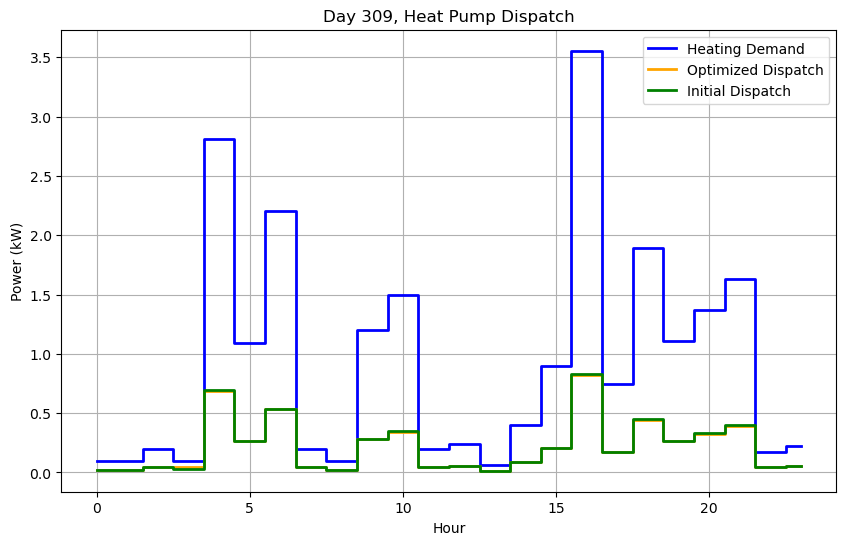


Day 310/365
Initial Guess Cost: €2.17
Optimized Daily Cost: €1.98
Total Heat Consumed (Qconsumption): 34.50 kWh
Total Heat Produced (Qproduction): 35.56 kWh
Buffer Tank Temperature at End of Day: 30.72°C
Optimized Dispatch: [3.82113142e-12 6.70051875e-03 8.29842730e-03 1.15522114e-02
 9.99519780e-01 1.83585110e-01 8.97013772e-02 2.25846585e-01
 6.33991754e-09 5.36612080e-03 4.69665982e-02 7.53643447e-02
 9.38599675e-02 5.90543177e-02 1.77015727e-02 1.02780516e-01
 3.01754358e-10 7.52401677e-10 8.44708489e-10 3.10450382e-01
 1.94455266e-01 4.60945179e-01 1.99501142e-02 1.93931398e-02]


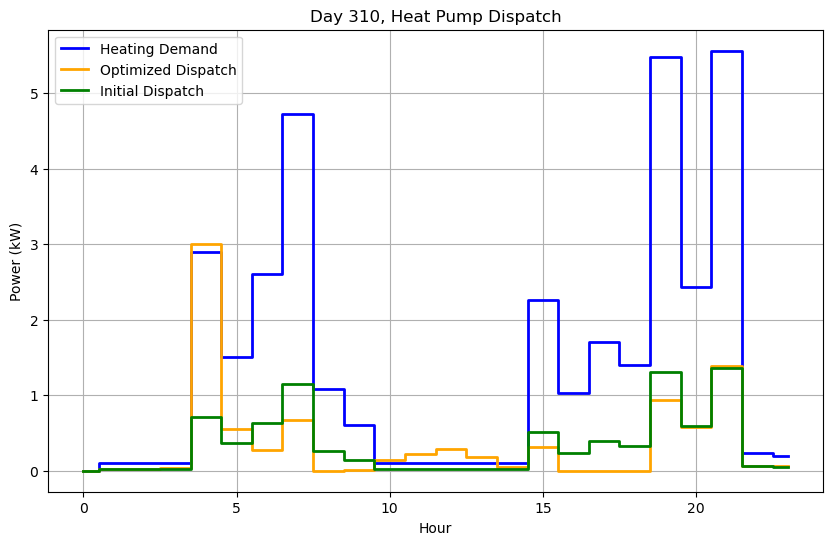


Day 311/365
Initial Guess Cost: €2.97
Optimized Daily Cost: €2.89
Total Heat Consumed (Qconsumption): 41.70 kWh
Total Heat Produced (Qproduction): 42.28 kWh
Buffer Tank Temperature at End of Day: 30.79°C
Optimized Dispatch: [8.42588631e-03 1.68658596e-02 8.49107769e-03 2.04637211e-01
 2.68393489e-01 4.11730980e-01 1.61954007e-01 3.80129959e-01
 1.41722458e-01 1.31933742e-05 1.56355932e-02 7.90031473e-03
 7.95568671e-03 1.55951817e-02 2.78709556e-01 1.81276384e-02
 2.43855724e-01 2.37824872e-01 2.83166239e-01 3.91772824e-01
 5.83051034e-02 2.57908887e-01 6.13763969e-02 1.64434967e-02]


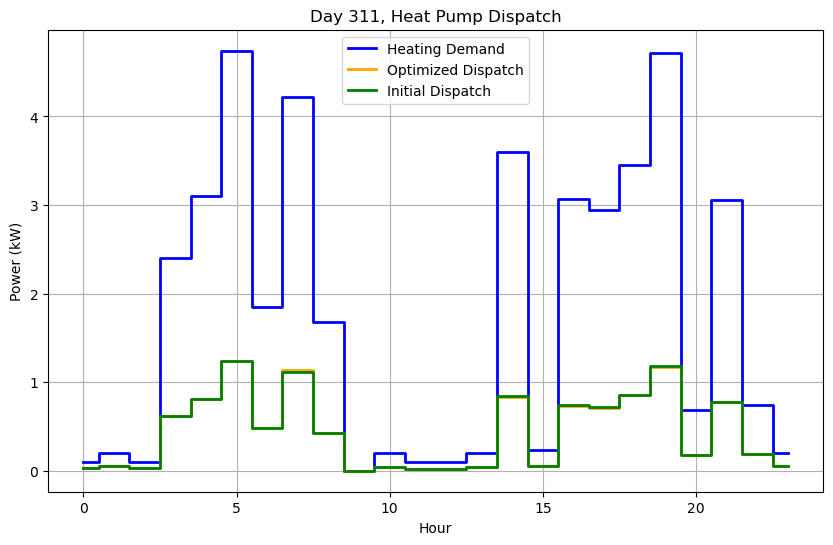


Day 312/365
Initial Guess Cost: €2.45
Optimized Daily Cost: €2.37
Total Heat Consumed (Qconsumption): 34.20 kWh
Total Heat Produced (Qproduction): 35.14 kWh
Buffer Tank Temperature at End of Day: 31.28°C
Optimized Dispatch: [1.81101762e-02 8.21266237e-03 8.37536251e-03 1.46223165e-02
 3.69775492e-01 2.48103676e-01 1.86159265e-01 2.09092169e-01
 2.45149495e-02 2.41175716e-01 2.06439921e-02 1.36714522e-02
 6.90542655e-03 8.13188001e-02 6.82457975e-03 2.50220281e-01
 2.06096875e-02 3.22699559e-01 2.57370862e-01 5.28358314e-02
 2.11390890e-01 2.75068014e-02 2.30794610e-06 1.51913297e-02]


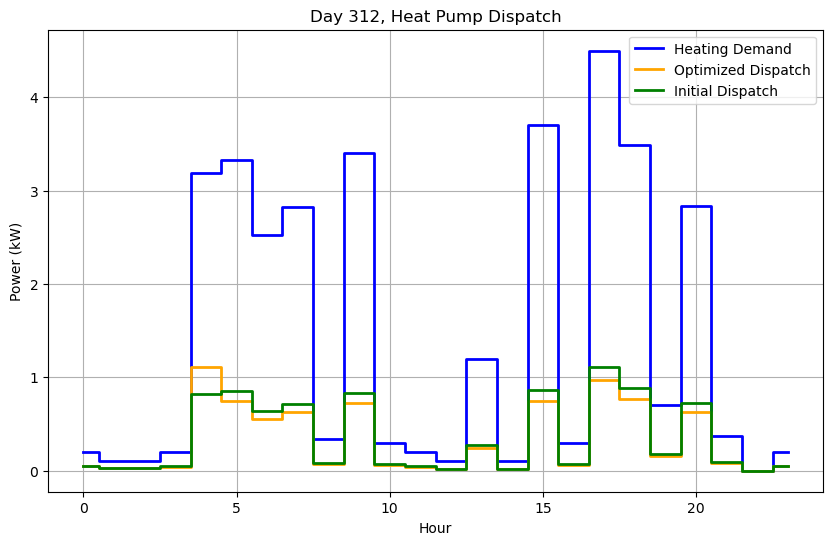


Day 313/365
Initial Guess Cost: €2.69
Optimized Daily Cost: €2.68
Total Heat Consumed (Qconsumption): 39.20 kWh
Total Heat Produced (Qproduction): 39.40 kWh
Buffer Tank Temperature at End of Day: 30.89°C
Optimized Dispatch: [1.60268738e-01 5.10774412e-02 2.75191966e-02 2.66418922e-01
 3.21785003e-01 4.05248447e-01 3.46873207e-01 2.75382439e-01
 3.63034255e-01 8.76194236e-02 8.00290011e-03 2.32028288e-15
 1.54810360e-02 7.60733792e-03 7.56346638e-03 7.70818016e-03
 3.51095542e-01 4.12807726e-02 3.12850939e-01 2.41017133e-02
 2.38365647e-01 3.02332692e-02 8.36558365e-03 8.32922278e-03]


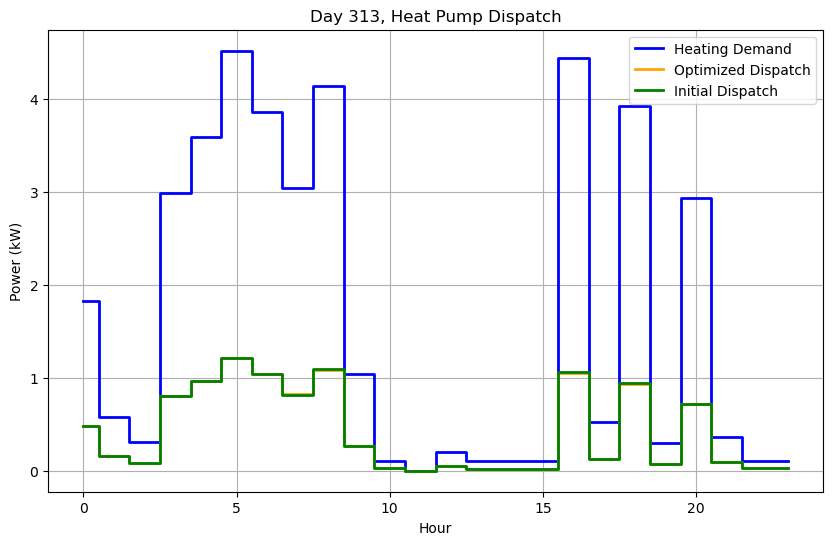


Day 314/365
Initial Guess Cost: €2.89
Optimized Daily Cost: €2.85
Total Heat Consumed (Qconsumption): 42.40 kWh
Total Heat Produced (Qproduction): 43.21 kWh
Buffer Tank Temperature at End of Day: 31.22°C
Optimized Dispatch: [7.60119835e-03 4.94899936e-11 1.50776255e-02 7.34647982e-02
 1.96364619e-01 2.38919230e-01 4.23447959e-01 1.04204466e-01
 2.42569859e-01 8.69148927e-02 8.25741510e-02 2.08266875e-01
 3.08843857e-02 1.58424415e-02 2.37901509e-01 2.70325126e-02
 4.25649385e-02 3.80199333e-01 1.41216541e-01 3.44752131e-01
 2.14117400e-01 3.38740531e-01 2.08749693e-02 1.60583233e-02]


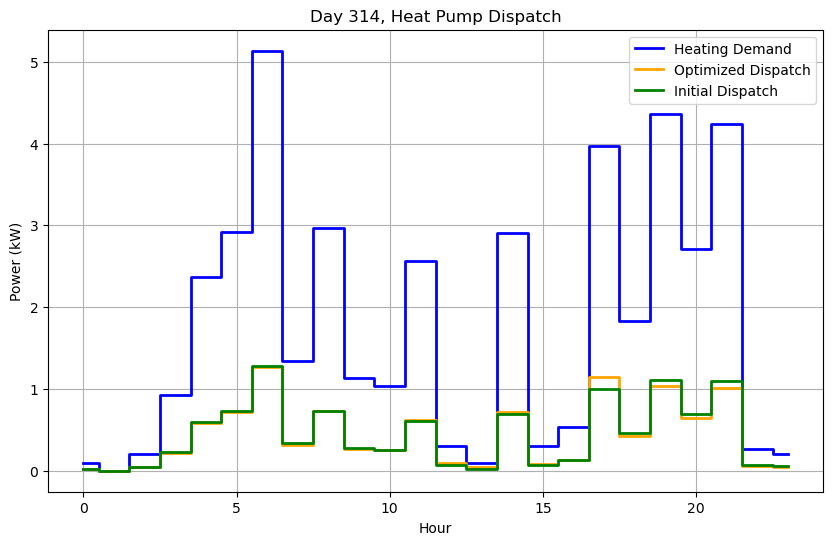


Day 315/365
Initial Guess Cost: €2.66
Optimized Daily Cost: €2.63
Total Heat Consumed (Qconsumption): 37.50 kWh
Total Heat Produced (Qproduction): 38.14 kWh
Buffer Tank Temperature at End of Day: 31.34°C
Optimized Dispatch: [0.02567481 0.0090649  0.0089971  0.00899162 0.00896178 0.17977586
 0.24915127 0.15706029 0.27403779 0.02789953 0.01627468 0.22336145
 0.17079635 0.17459166 0.18393043 0.04123861 0.02905672 0.32153351
 0.28358795 0.23513453 0.23976118 0.10161699 0.21892368 0.01714416]


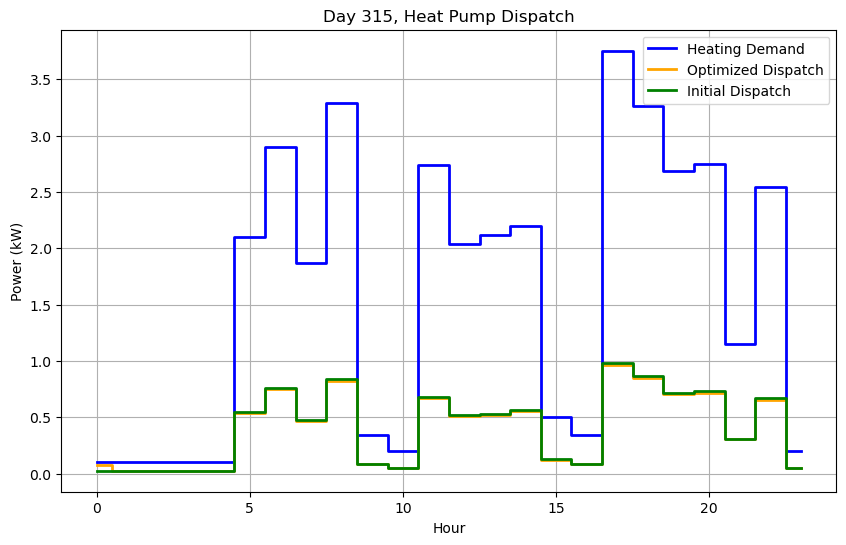


Day 316/365
Initial Guess Cost: €1.75
Optimized Daily Cost: €1.71
Total Heat Consumed (Qconsumption): 23.80 kWh
Total Heat Produced (Qproduction): 24.38 kWh
Buffer Tank Temperature at End of Day: 31.36°C
Optimized Dispatch: [4.97960453e-06 2.34332873e-03 3.67572443e-10 1.06663579e-11
 3.05154476e-01 3.36180918e-01 2.96772357e-01 2.42823765e-01
 9.06265769e-03 4.39400219e-13 7.30806527e-13 8.32025170e-03
 2.40912774e-02 4.49008334e-03 1.15899352e-02 8.24203896e-03
 1.64063966e-01 2.24158846e-01 5.10522482e-02 6.81185227e-02
 4.28613069e-02 2.80790761e-01 1.71370270e-02 8.57185652e-03]


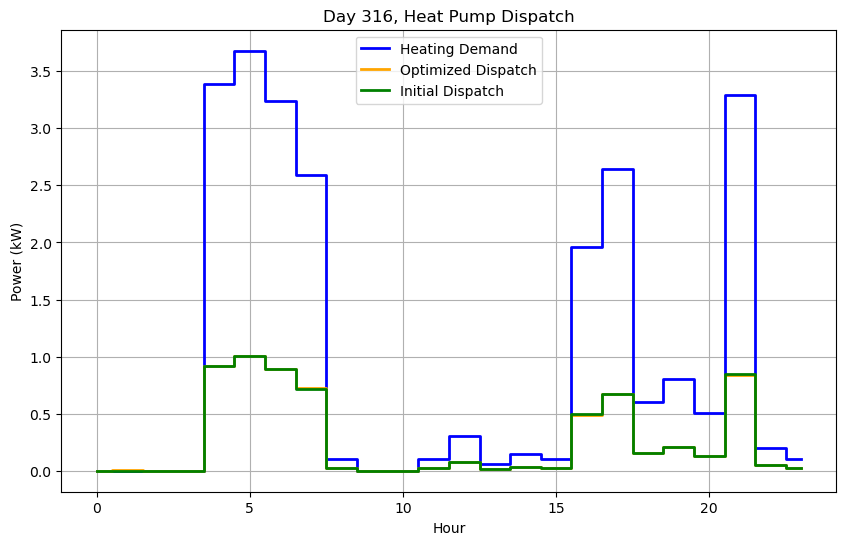


Day 317/365
Initial Guess Cost: €0.99
Optimized Daily Cost: €0.96
Total Heat Consumed (Qconsumption): 14.80 kWh
Total Heat Produced (Qproduction): 14.34 kWh
Buffer Tank Temperature at End of Day: 30.25°C
Optimized Dispatch: [1.66465987e-02 8.30684843e-03 8.29905560e-03 1.65745445e-02
 1.98640900e-01 4.11659627e-01 9.97193091e-02 2.15974523e-01
 7.69342351e-03 1.51852254e-02 7.56950699e-03 3.03289539e-02
 6.82363244e-02 7.51953222e-03 1.47317988e-02 7.27076558e-03
 7.22375794e-03 2.84763615e-03 1.15582615e-02 2.13060004e-18
 7.12702479e-03 1.56126886e-19 2.12951524e-02 7.25096294e-03]


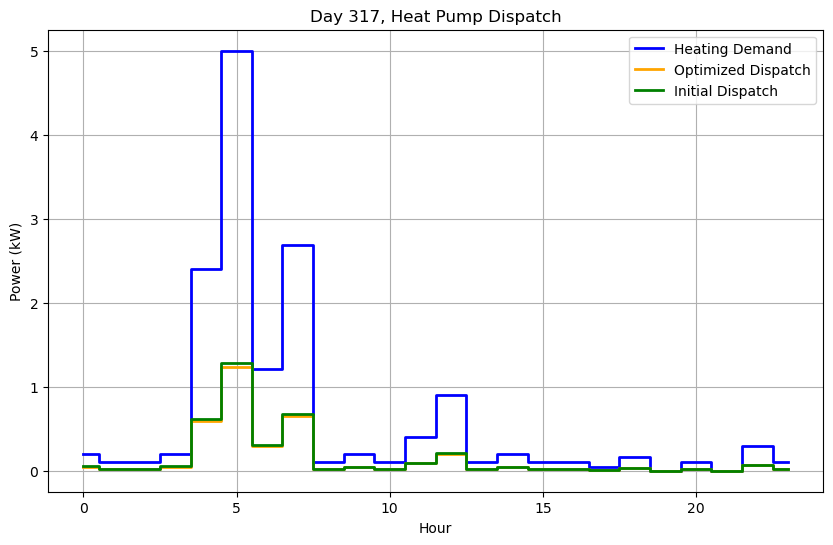


Day 318/365
Initial Guess Cost: €1.29
Optimized Daily Cost: €1.29
Total Heat Consumed (Qconsumption): 24.40 kWh
Total Heat Produced (Qproduction): 24.69 kWh
Buffer Tank Temperature at End of Day: 30.02°C
Optimized Dispatch: [0.00767957 0.00788011 0.00796235 0.00801284 0.26877411 0.4332787
 0.0089805  0.01613011 0.00812298 0.26312044 0.05780229 0.01667497
 0.0090305  0.00910951 0.00902932 0.00887684 0.28999344 0.08572758
 0.01671686 0.28903366 0.07069719 0.01592635 0.02359807 0.01569911]


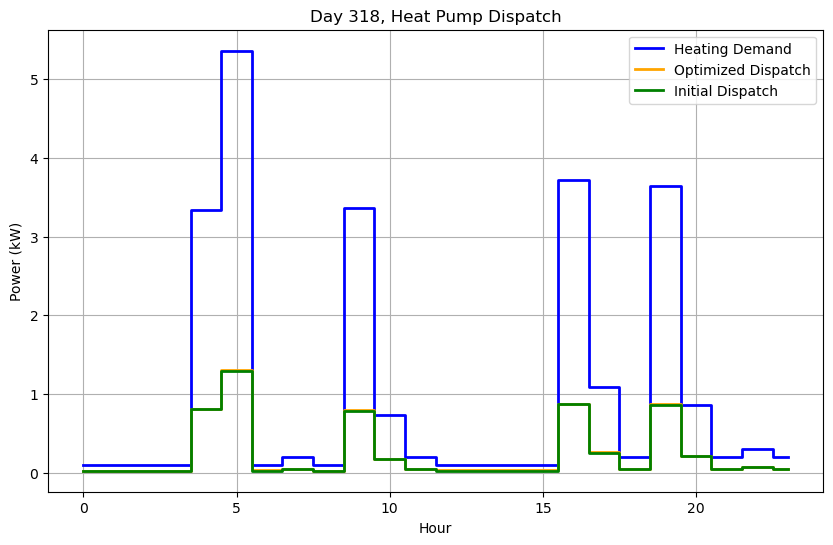


Day 319/365
Initial Guess Cost: €1.60
Optimized Daily Cost: €1.59
Total Heat Consumed (Qconsumption): 24.20 kWh
Total Heat Produced (Qproduction): 24.99 kWh
Buffer Tank Temperature at End of Day: 30.36°C
Optimized Dispatch: [0.00773172 0.00776907 0.00785352 0.00788823 0.27474756 0.17019736
 0.30505289 0.04466002 0.01565578 0.0076787  0.00763262 0.00991638
 0.01111133 0.02561914 0.26412022 0.03514448 0.05707535 0.25919664
 0.04060122 0.01795514 0.33838869 0.00838636 0.00842085 0.01656354]


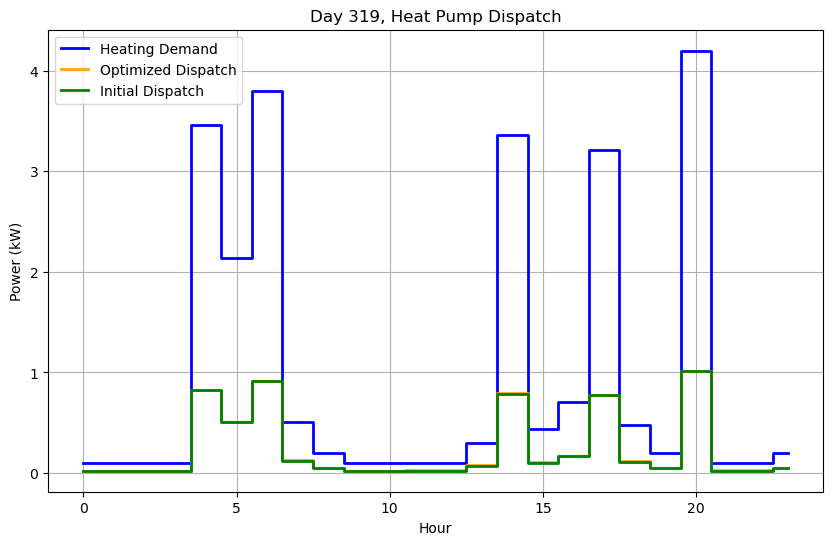


Day 320/365
Initial Guess Cost: €3.12
Optimized Daily Cost: €3.05
Total Heat Consumed (Qconsumption): 42.20 kWh
Total Heat Produced (Qproduction): 43.16 kWh
Buffer Tank Temperature at End of Day: 30.89°C
Optimized Dispatch: [0.00812567 0.00819262 0.00806311 0.00813969 0.23369591 0.44767272
 0.34803762 0.36949239 0.02464121 0.30895353 0.00802529 0.01578705
 0.02334864 0.23942394 0.08958537 0.18528004 0.14339213 0.28506985
 0.02727642 0.30222197 0.0496439  0.26546425 0.05044403 0.01677242]


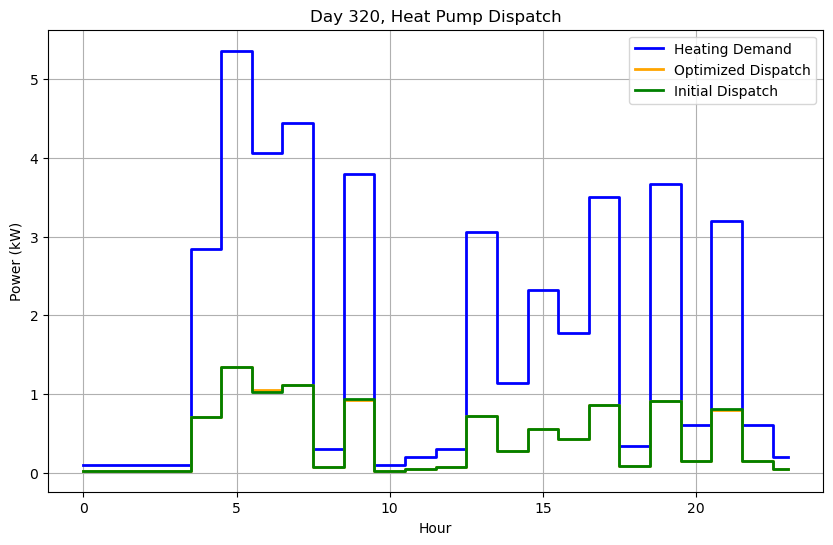


Day 321/365
Initial Guess Cost: €3.27
Optimized Daily Cost: €3.26
Total Heat Consumed (Qconsumption): 44.00 kWh
Total Heat Produced (Qproduction): 44.60 kWh
Buffer Tank Temperature at End of Day: 30.97°C
Optimized Dispatch: [0.0169964  0.00852767 0.00856758 0.01964057 0.00852003 0.39742306
 0.53713767 0.35722703 0.03481914 0.32926976 0.04177947 0.02474647
 0.06651804 0.17371518 0.04762734 0.07225234 0.41335535 0.12907341
 0.34567052 0.02627489 0.36534218 0.02558325 0.2463231  0.02549943]


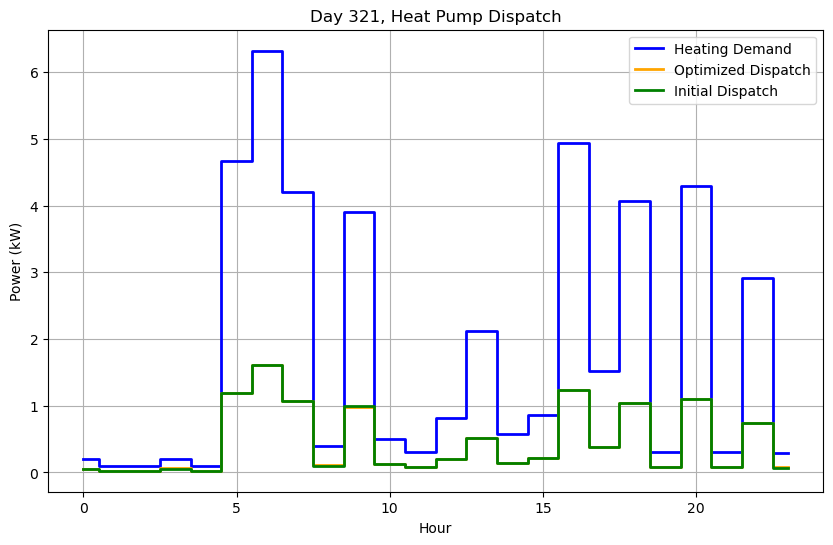


Day 322/365
Initial Guess Cost: €2.74
Optimized Daily Cost: €2.63
Total Heat Consumed (Qconsumption): 39.30 kWh
Total Heat Produced (Qproduction): 39.70 kWh
Buffer Tank Temperature at End of Day: 30.83°C
Optimized Dispatch: [0.0085964  0.00828843 0.01697267 0.00829601 0.00843392 0.1485574
 0.58601148 0.41238002 0.22029043 0.00615685 0.0068579  0.19228555
 0.02031435 0.06171144 0.01932567 0.26351534 0.01655885 0.32236096
 0.07841789 0.27683613 0.03971533 0.0286027  0.33169873 0.01351468]


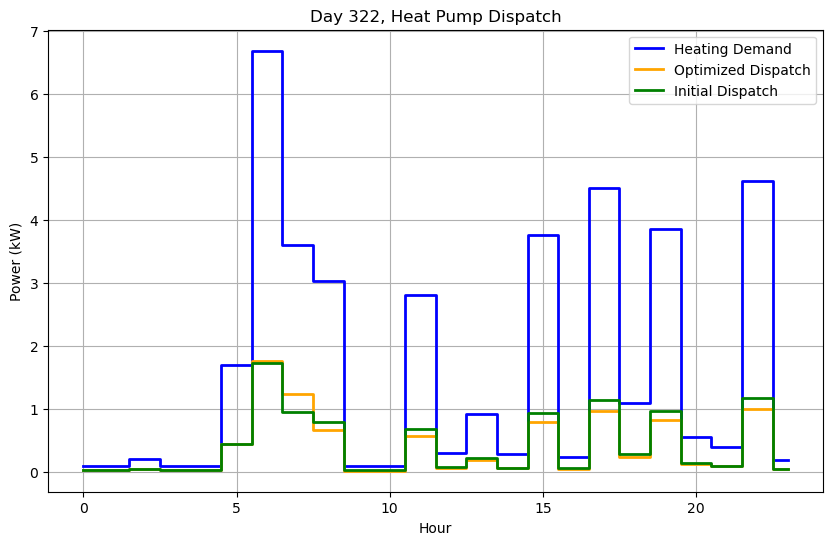


Day 323/365
Initial Guess Cost: €1.00
Optimized Daily Cost: €0.86
Total Heat Consumed (Qconsumption): 20.70 kWh
Total Heat Produced (Qproduction): 21.15 kWh
Buffer Tank Temperature at End of Day: 30.56°C
Optimized Dispatch: [3.93816056e-04 7.29059827e-03 2.94411069e-02 9.46918802e-03
 2.33072470e-01 1.27960565e-01 2.62881885e-01 1.29529118e-01
 3.12221654e-02 2.90496271e-02 9.99724710e-02 1.26060684e-01
 1.68998990e-01 3.03533320e-01 1.38390476e-01 1.56262391e-06
 1.86256092e-07 1.43717978e-06 2.75345219e-07 1.14755377e-07
 1.16502647e-07 1.92997048e-06 8.71218602e-08 4.61272022e-08]


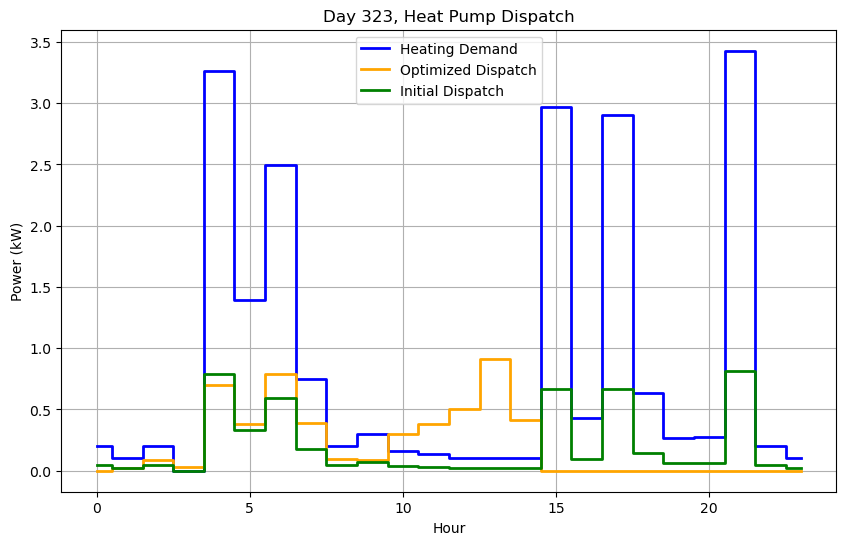


Day 324/365
Initial Guess Cost: €2.43
Optimized Daily Cost: €2.41
Total Heat Consumed (Qconsumption): 36.90 kWh
Total Heat Produced (Qproduction): 37.24 kWh
Buffer Tank Temperature at End of Day: 30.38°C
Optimized Dispatch: [0.01110577 0.00810222 0.00520627 0.01909625 0.25747797 0.37696687
 0.28186427 0.03402489 0.09213297 0.00536303 0.00562777 0.26266105
 0.08015652 0.02770047 0.01685679 0.27288529 0.08820599 0.07226157
 0.20753896 0.4022241  0.06519899 0.32655552 0.01824923 0.01458905]


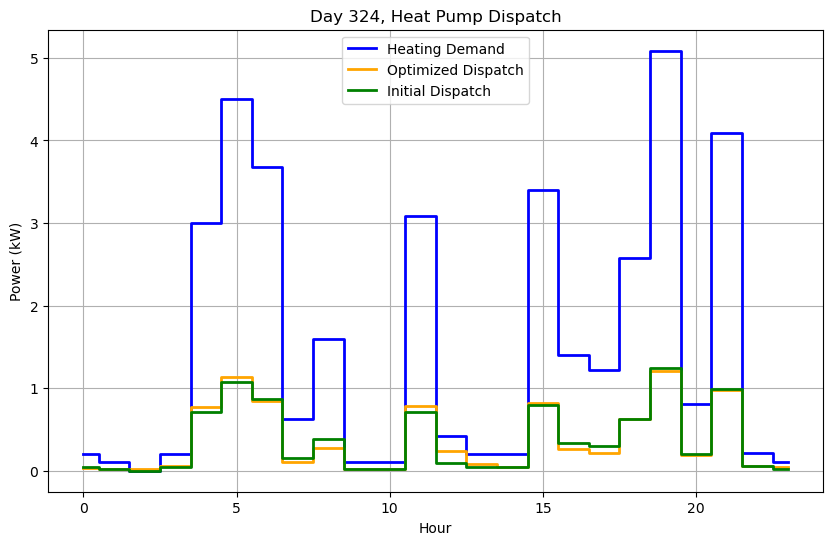


Day 325/365
Initial Guess Cost: €3.49
Optimized Daily Cost: €3.52
Total Heat Consumed (Qconsumption): 48.70 kWh
Total Heat Produced (Qproduction): 49.75 kWh
Buffer Tank Temperature at End of Day: 31.01°C
Optimized Dispatch: [0.01629794 0.00815918 0.0081707  0.00817581 0.05413877 0.74783762
 0.15176482 0.37002519 0.03422604 0.26548172 0.15956464 0.02380881
 0.11885635 0.22292073 0.02390672 0.16528301 0.02616782 0.40192777
 0.08005286 0.50386745 0.31026282 0.23218273 0.02589977 0.01711378]


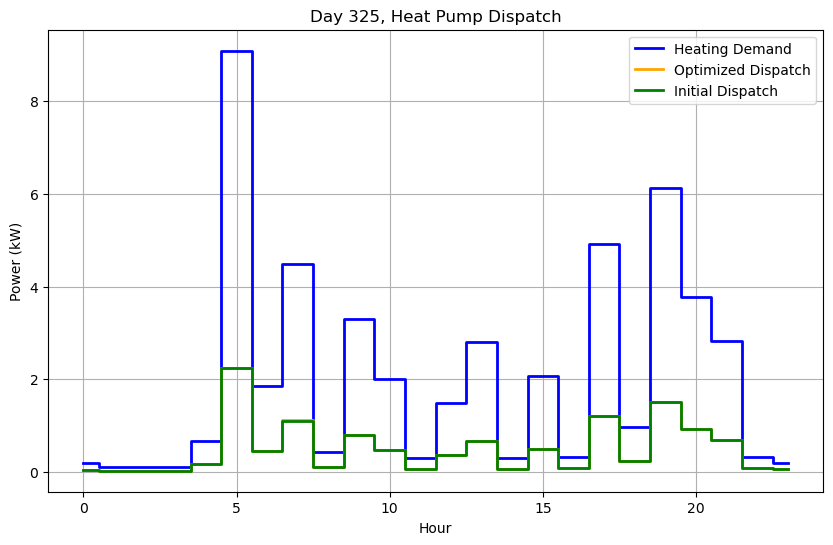


Day 326/365
Initial Guess Cost: €5.64
Optimized Daily Cost: €5.68
Total Heat Consumed (Qconsumption): 73.80 kWh
Total Heat Produced (Qproduction): 75.26 kWh
Buffer Tank Temperature at End of Day: 32.04°C
Optimized Dispatch: [8.66080486e-03 3.77057280e-01 2.01565521e-01 2.10209764e-01
 2.15560268e-01 4.82677285e-01 5.36473267e-01 6.07103564e-01
 1.75882445e-01 5.07289547e-01 1.13249724e-01 3.78626896e-01
 6.43580979e-02 4.26336912e-01 2.82419939e-01 2.81359997e-01
 5.63659505e-01 1.50818795e-01 5.49978571e-01 5.26241891e-02
 4.62731991e-01 4.89549162e-02 2.71642370e-22 5.84742608e-05]


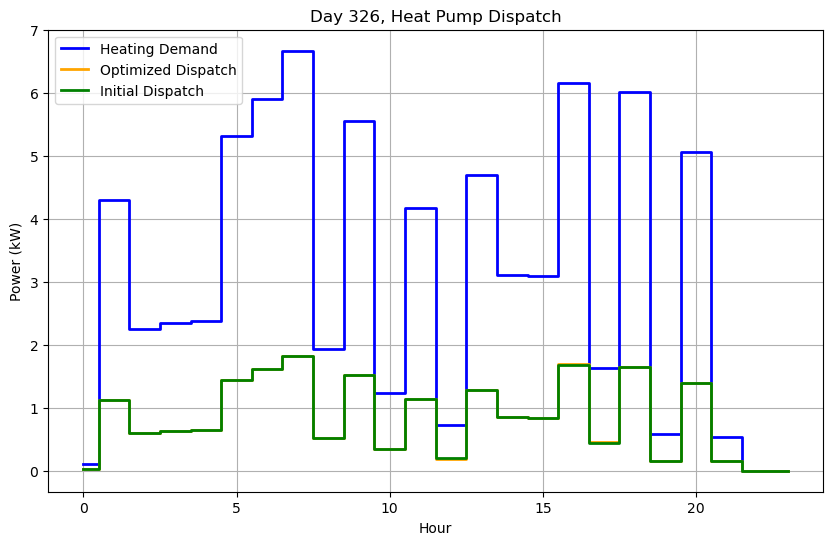


Day 327/365
Initial Guess Cost: €3.61
Optimized Daily Cost: €3.51
Total Heat Consumed (Qconsumption): 57.70 kWh
Total Heat Produced (Qproduction): 57.03 kWh
Buffer Tank Temperature at End of Day: 30.64°C
Optimized Dispatch: [4.01379254e-07 3.15421324e-01 1.02540347e-01 3.05105676e-01
 4.98732109e-01 6.89719637e-01 1.43837018e-01 5.35226254e-01
 3.03159005e-01 7.88216261e-02 2.74771371e-01 1.90949315e-01
 2.60101524e-01 9.16017613e-03 2.98500921e-01 5.44062875e-02
 3.01634851e-01 1.45463776e-01 2.05065308e-01 5.87019269e-03
 2.89213409e-01 1.79932062e-02 1.48322431e-16 1.48990159e-02]


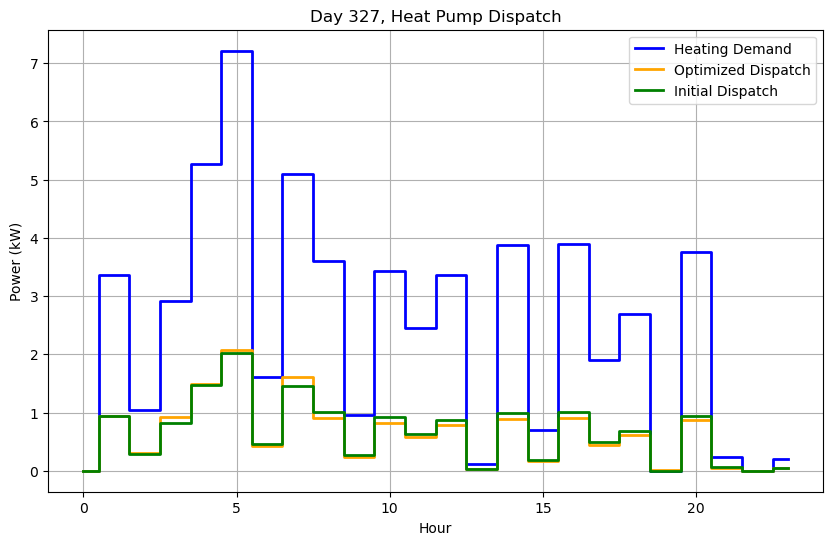


Day 328/365
Initial Guess Cost: €3.62
Optimized Daily Cost: €4.08
Total Heat Consumed (Qconsumption): 56.00 kWh
Total Heat Produced (Qproduction): 57.51 kWh
Buffer Tank Temperature at End of Day: 31.72°C
Optimized Dispatch: [8.66943155e-02 1.39889874e-01 1.57516394e-01 1.76271218e-01
 7.71124644e-01 4.16334708e-02 1.13411175e-01 1.69280954e-01
 4.83961230e-01 1.99025128e-11 1.37787893e-11 1.99658256e-11
 1.30085350e-11 1.54161761e-01 1.74742880e-01 9.80861571e-03
 3.96881843e-03 4.71970608e-03 3.65741223e-02 1.26433798e-02
 6.03717877e-02 2.31041726e-02 4.13082015e-02 2.36595226e-02]


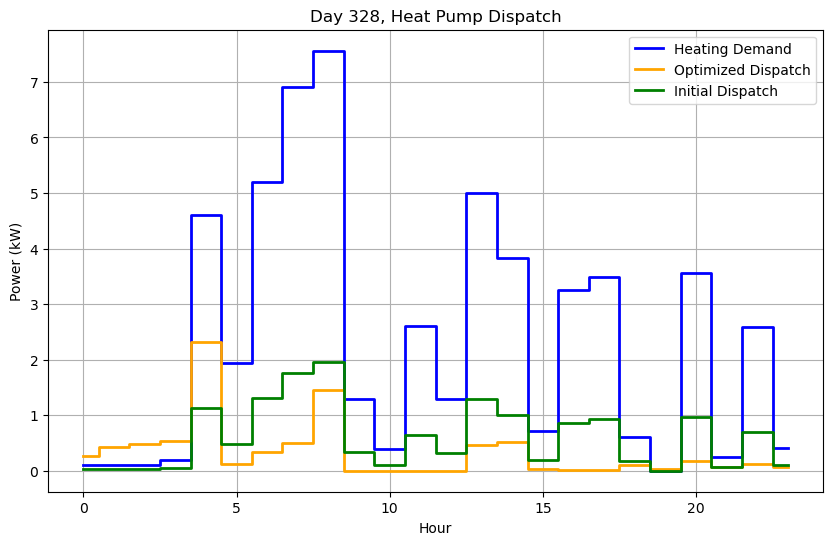


Day 329/365
Initial Guess Cost: €3.61
Optimized Daily Cost: €3.58
Total Heat Consumed (Qconsumption): 49.10 kWh
Total Heat Produced (Qproduction): 49.87 kWh
Buffer Tank Temperature at End of Day: 31.96°C
Optimized Dispatch: [8.94964059e-03 2.73443916e-02 3.18138405e-17 6.00025061e-17
 1.99137779e-02 5.36057791e-01 6.89630123e-01 2.39458696e-01
 2.00211528e-01 8.09985962e-02 2.15522424e-01 6.27338234e-04
 3.50170938e-01 8.66059320e-02 3.27683561e-01 2.61594027e-02
 2.31564601e-02 4.04800569e-01 1.87014356e-01 1.46562475e-01
 2.59246991e-01 1.86995705e-02 4.24954450e-01 4.36767512e-02]


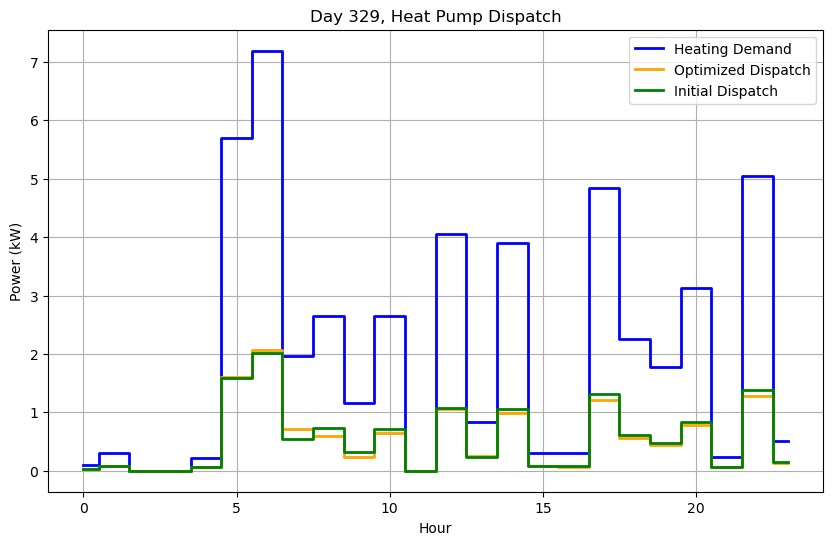


Day 330/365
Initial Guess Cost: €3.32
Optimized Daily Cost: €3.21
Total Heat Consumed (Qconsumption): 42.40 kWh
Total Heat Produced (Qproduction): 42.56 kWh
Buffer Tank Temperature at End of Day: 31.49°C
Optimized Dispatch: [8.95341431e-04 5.09490162e-02 1.35489344e-02 1.36915544e-02
 3.58350039e-01 6.09088768e-01 2.44388746e-01 4.49624574e-01
 2.72336707e-02 3.27167799e-01 5.18738951e-02 8.75722104e-03
 3.82214007e-01 3.45351519e-02 3.10266958e-16 4.02746439e-01
 5.79809308e-02 2.49810479e-01 1.70168732e-01 3.57572634e-02
 3.44781456e-01 2.54481235e-02 3.03860798e-03 2.93924139e-03]


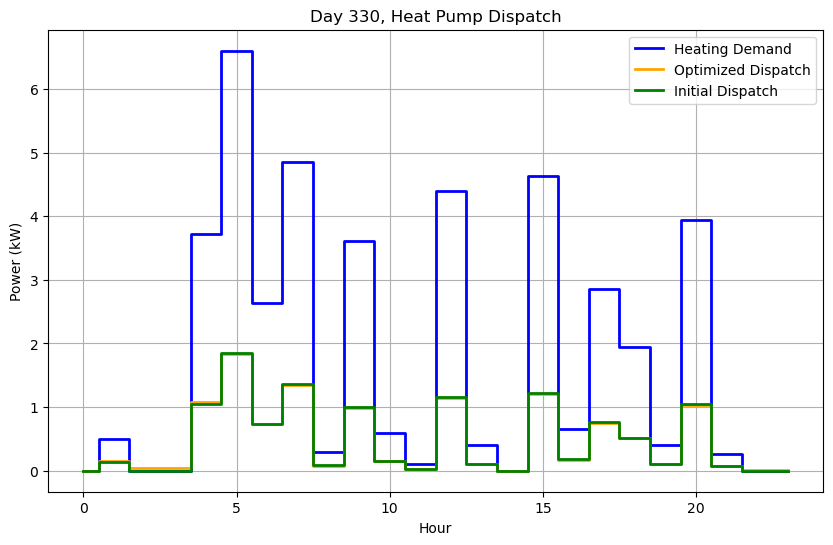


Day 331/365
Initial Guess Cost: €3.61
Optimized Daily Cost: €3.63
Total Heat Consumed (Qconsumption): 48.00 kWh
Total Heat Produced (Qproduction): 48.81 kWh
Buffer Tank Temperature at End of Day: 31.77°C
Optimized Dispatch: [2.42400229e-10 3.59090511e-10 5.92304742e-10 6.46283109e-10
 6.08650389e-01 6.26835461e-01 5.20616816e-02 4.59168829e-01
 8.93497819e-02 3.77760879e-11 3.94982988e-01 2.59695086e-02
 2.77493398e-05 2.54846597e-01 7.81508551e-02 3.89832755e-01
 1.53952322e-01 3.36682244e-01 1.96577359e-01 1.31671073e-01
 2.31492728e-01 2.32351062e-01 4.94819817e-02 2.18058800e-06]


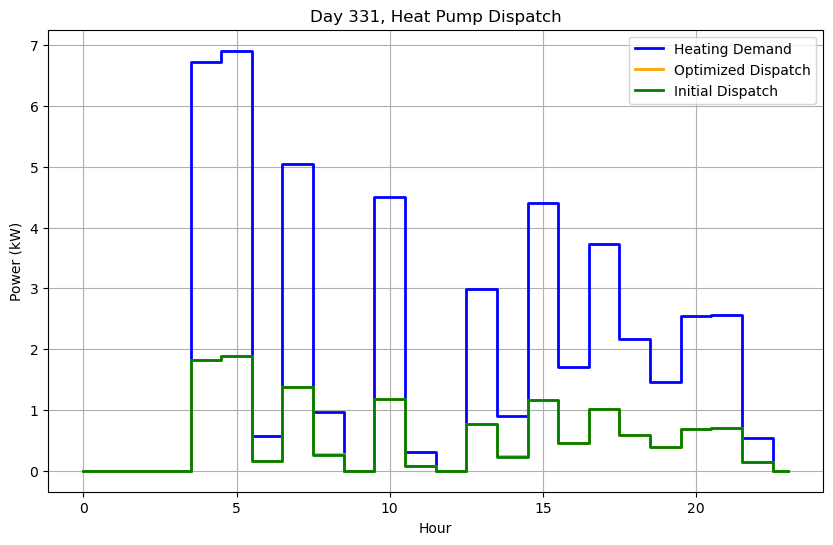


Day 332/365
Initial Guess Cost: €4.45
Optimized Daily Cost: €4.52
Total Heat Consumed (Qconsumption): 54.10 kWh
Total Heat Produced (Qproduction): 55.39 kWh
Buffer Tank Temperature at End of Day: 32.59°C
Optimized Dispatch: [2.04522032e-18 3.28969876e-20 3.10244551e-20 1.24981654e-20
 3.50513489e-01 6.55540116e-01 1.17346752e-01 4.26822051e-01
 4.28318141e-02 3.22626784e-01 2.53628893e-01 2.04850547e-18
 5.00219123e-01 1.48925133e-01 2.26356122e-01 2.67517447e-01
 2.38974981e-01 4.29492316e-01 3.26808462e-02 3.76301060e-01
 1.69404297e-01 2.55402151e-01 5.32255550e-02 6.70367724e-03]


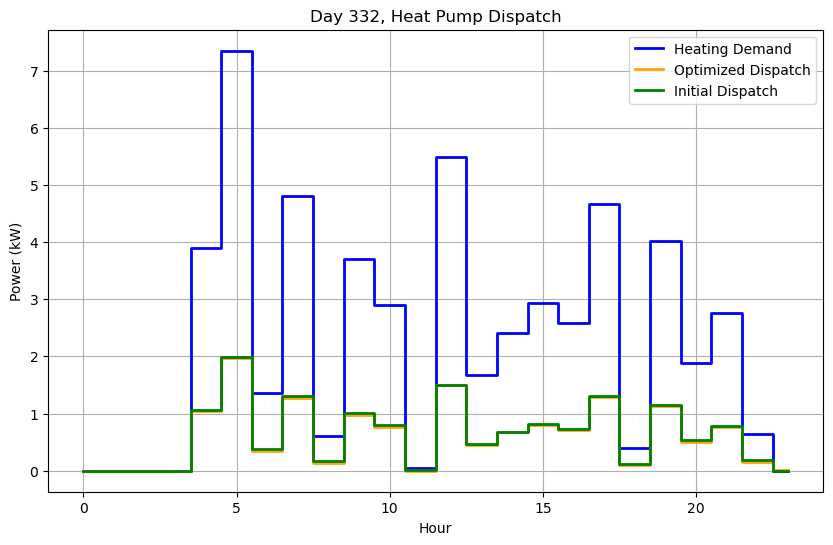


Day 333/365
Initial Guess Cost: €4.42
Optimized Daily Cost: €4.36
Total Heat Consumed (Qconsumption): 50.30 kWh
Total Heat Produced (Qproduction): 50.63 kWh
Buffer Tank Temperature at End of Day: 32.29°C
Optimized Dispatch: [3.79352184e-09 2.08660859e-14 4.97480106e-02 3.71007608e-01
 2.59474867e-01 7.13547847e-01 2.84982904e-01 5.27295211e-01
 4.65708388e-02 1.37772805e-01 2.62736224e-01 9.45929557e-03
 3.51601304e-01 9.00545598e-02 1.18369947e-01 3.53130888e-01
 1.30299209e-01 4.76272289e-01 2.99997646e-02 1.66487578e-01
 3.33305660e-01 1.98560049e-02 1.20906932e-03 1.11063105e-03]


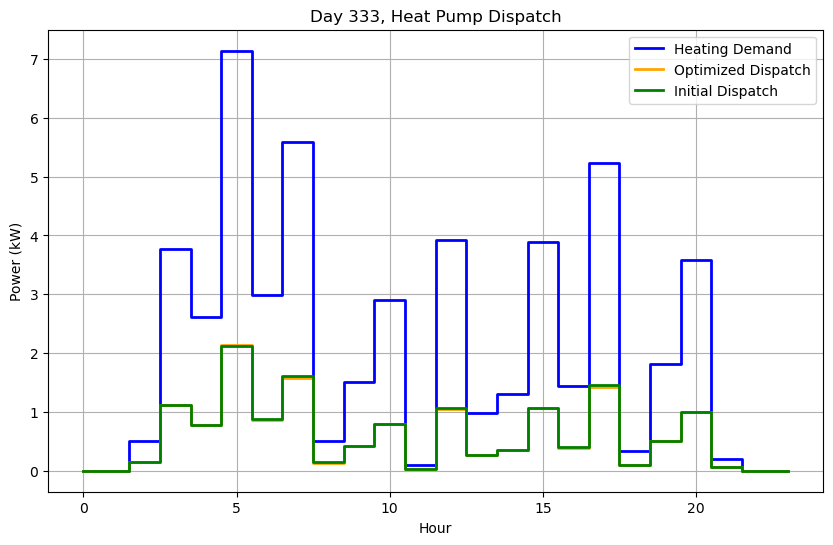


Day 334/365
Initial Guess Cost: €5.37
Optimized Daily Cost: €5.20
Total Heat Consumed (Qconsumption): 55.50 kWh
Total Heat Produced (Qproduction): 55.74 kWh
Buffer Tank Temperature at End of Day: 31.89°C
Optimized Dispatch: [5.30157234e-03 5.12413089e-02 4.25140557e-01 8.87372074e-03
 3.29457855e-01 6.56802999e-01 2.22047991e-01 5.34392175e-01
 4.15991483e-01 2.07047019e-02 2.23351893e-09 2.61742886e-01
 1.20166187e-01 7.39822391e-03 3.38067391e-01 1.62590216e-01
 2.73380503e-01 4.44010771e-01 9.46545980e-02 3.39010747e-01
 3.66959876e-02 2.87187678e-01 4.18726368e-02 9.93979084e-03]


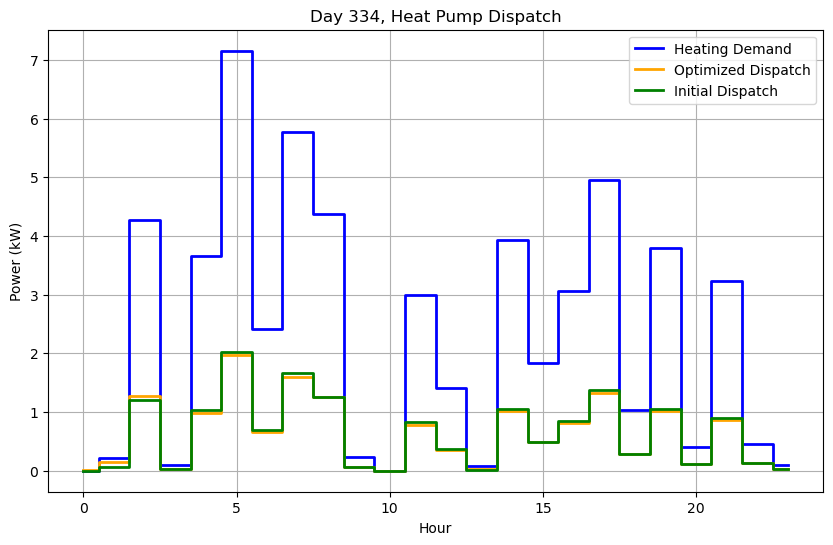


Day 335/365
Initial Guess Cost: €5.16
Optimized Daily Cost: €5.19
Total Heat Consumed (Qconsumption): 56.70 kWh
Total Heat Produced (Qproduction): 57.69 kWh
Buffer Tank Temperature at End of Day: 32.36°C
Optimized Dispatch: [2.84413455e-22 1.82753741e-02 2.05880767e-08 1.91905603e-08
 1.76942718e-01 4.27106663e-01 6.82800938e-01 1.80333707e-01
 2.33589133e-01 4.67004007e-01 3.32765130e-02 3.59059078e-01
 5.41632759e-02 3.39843683e-01 1.73670119e-01 2.03989519e-01
 4.38667801e-01 3.61441654e-02 4.67003595e-01 2.69890489e-02
 4.81225252e-01 6.99119198e-02 3.47182395e-01 7.50387812e-06]


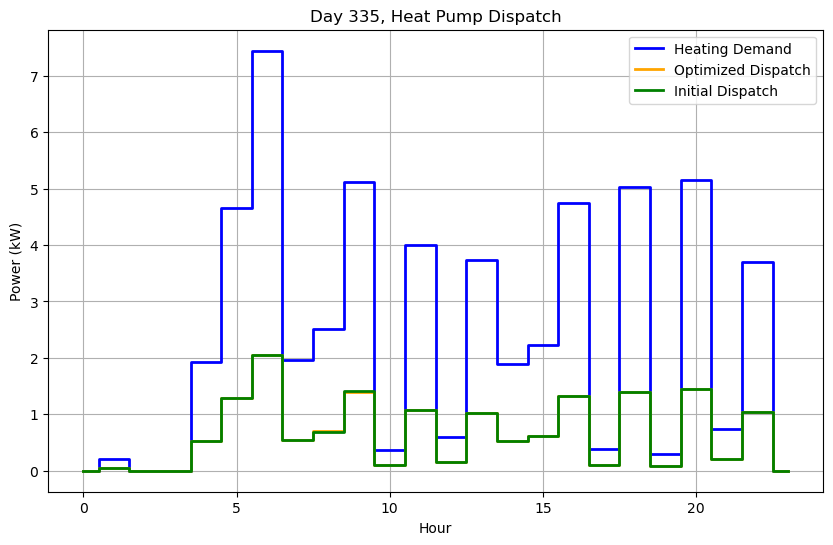


Day 336/365
Initial Guess Cost: €5.59
Optimized Daily Cost: €5.63
Total Heat Consumed (Qconsumption): 67.50 kWh
Total Heat Produced (Qproduction): 68.79 kWh
Buffer Tank Temperature at End of Day: 33.13°C
Optimized Dispatch: [3.48802021e-14 3.05551020e-12 3.01880699e-12 4.38306426e-01
 8.73502231e-02 1.88854251e-01 3.84188752e-01 6.16192194e-01
 4.90740221e-01 5.86190956e-01 1.87738911e-01 7.75627964e-02
 5.15672854e-01 4.09193797e-02 5.47483359e-01 7.74269316e-02
 3.42438649e-01 5.79284912e-01 7.17277925e-02 5.34911189e-01
 9.78161332e-02 4.74033924e-01 2.22824116e-01 7.70293010e-12]


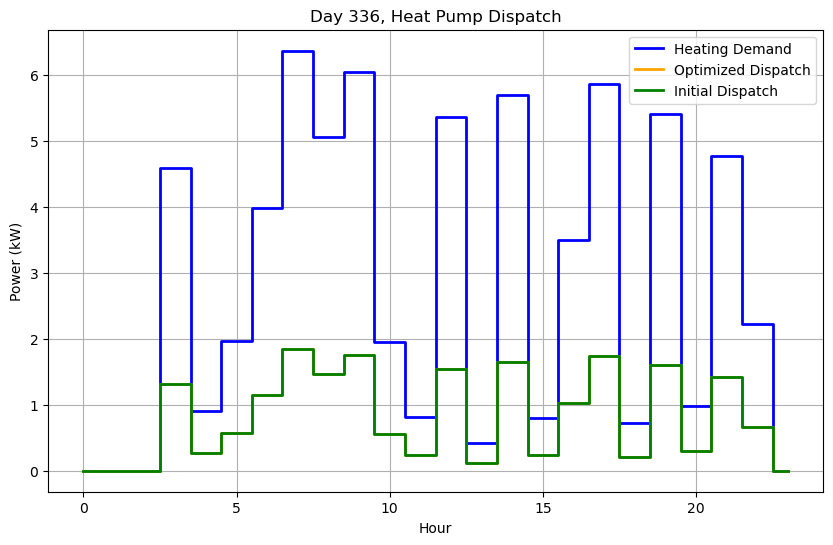


Day 337/365
Initial Guess Cost: €5.42
Optimized Daily Cost: €5.39
Total Heat Consumed (Qconsumption): 64.70 kWh
Total Heat Produced (Qproduction): 65.79 kWh
Buffer Tank Temperature at End of Day: 33.65°C
Optimized Dispatch: [4.16041682e-03 4.10505866e-03 2.26912961e-12 3.87769444e-01
 3.95001488e-01 7.45421626e-01 5.20365184e-01 4.36072084e-01
 5.58620056e-01 4.74784420e-02 3.28110515e-01 1.03081183e-01
 3.10176273e-01 8.04890169e-02 2.63285412e-01 1.48768685e-01
 2.12680811e-01 1.03904846e-01 2.64240385e-01 5.71516943e-01
 5.53572398e-01 2.30600755e-01 9.44453287e-03 2.46273486e-13]


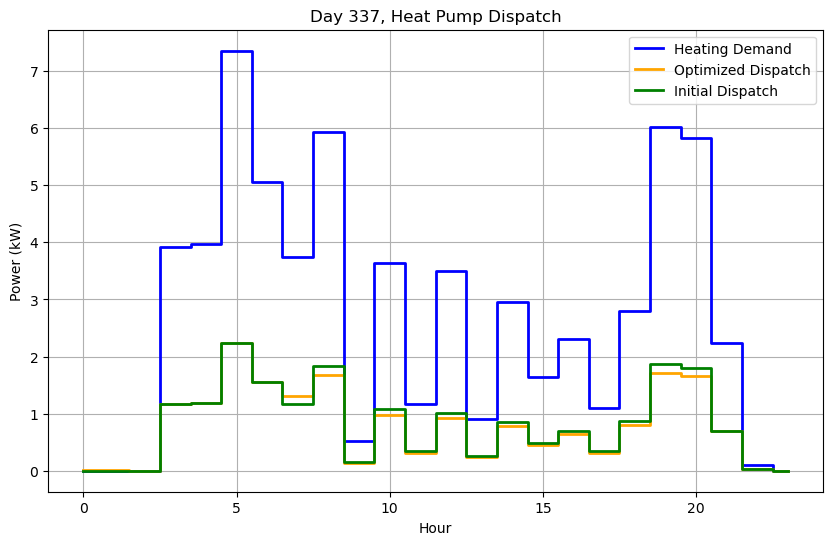


Day 338/365
Initial Guess Cost: €5.58
Optimized Daily Cost: €5.47
Total Heat Consumed (Qconsumption): 66.20 kWh
Total Heat Produced (Qproduction): 66.12 kWh
Buffer Tank Temperature at End of Day: 32.83°C
Optimized Dispatch: [1.33592000e-03 2.51636371e-01 3.68677113e-01 1.93940892e-02
 5.69295964e-01 5.56027430e-01 4.63629882e-01 3.71435126e-01
 4.69481451e-01 1.15728216e-01 1.69702014e-01 3.04162593e-01
 7.43955823e-02 4.99378912e-01 4.13211523e-02 4.21981745e-01
 3.89806241e-01 2.50785739e-01 1.86280016e-01 5.37240064e-01
 7.71351228e-02 3.00323828e-01 1.82645777e-02 2.18034802e-13]


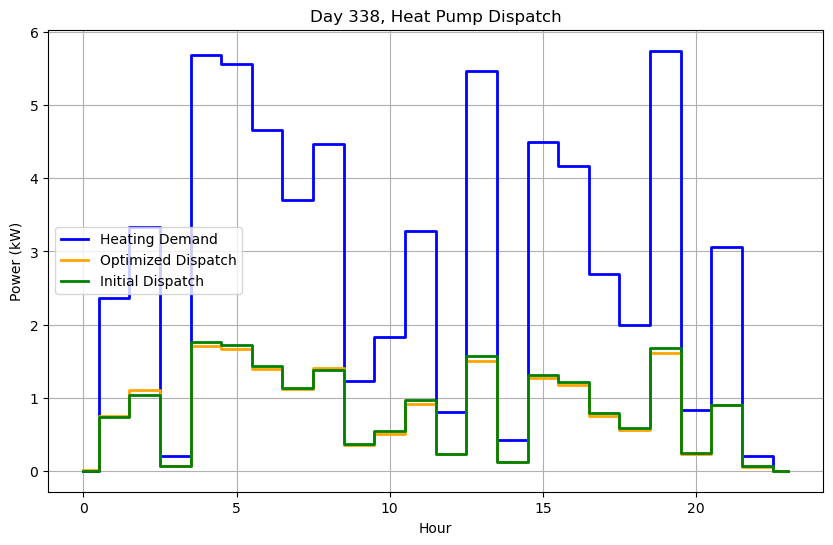


Day 339/365
Initial Guess Cost: €3.45
Optimized Daily Cost: €3.42
Total Heat Consumed (Qconsumption): 44.60 kWh
Total Heat Produced (Qproduction): 44.28 kWh
Buffer Tank Temperature at End of Day: 31.80°C
Optimized Dispatch: [0.00325812 0.02121914 0.27443331 0.01804556 0.20013679 0.61231628
 0.13993204 0.51425341 0.14930537 0.33981566 0.02580202 0.24350649
 0.01655374 0.23750838 0.03220341 0.26539114 0.02986363 0.28106404
 0.18507564 0.13691694 0.22635187 0.05469205 0.00944884 0.01151528]


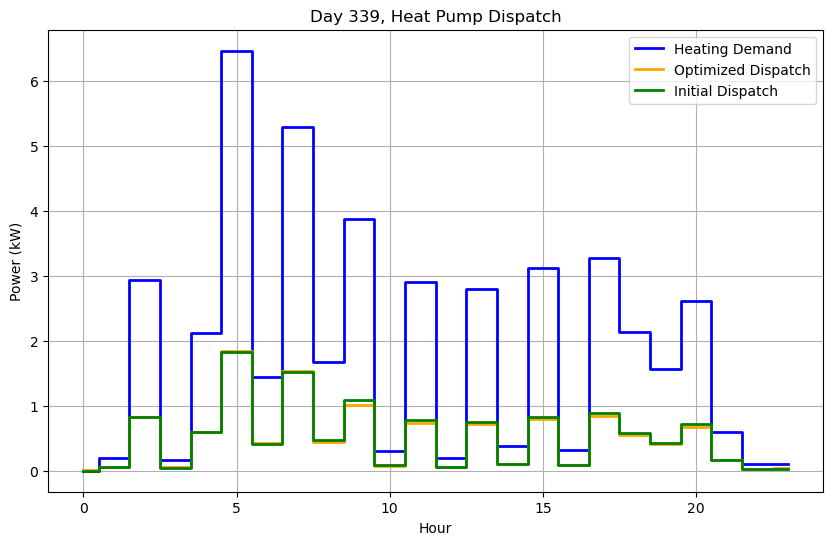


Day 340/365
Initial Guess Cost: €4.76
Optimized Daily Cost: €4.76
Total Heat Consumed (Qconsumption): 58.40 kWh
Total Heat Produced (Qproduction): 58.98 kWh
Buffer Tank Temperature at End of Day: 31.82°C
Optimized Dispatch: [4.50522499e-16 7.64480480e-17 3.13015237e-01 1.63082125e-02
 3.93234638e-01 4.79587253e-01 1.19827895e-01 4.28894179e-01
 1.82026972e-01 2.64934168e-01 4.30160852e-01 1.49316618e-01
 3.53197178e-01 9.72060476e-02 3.06037637e-01 1.00040865e-01
 3.65353227e-01 2.38199224e-01 3.14275253e-01 2.78629792e-01
 1.67190134e-01 1.79726325e-01 3.46584847e-02 2.01250280e-09]


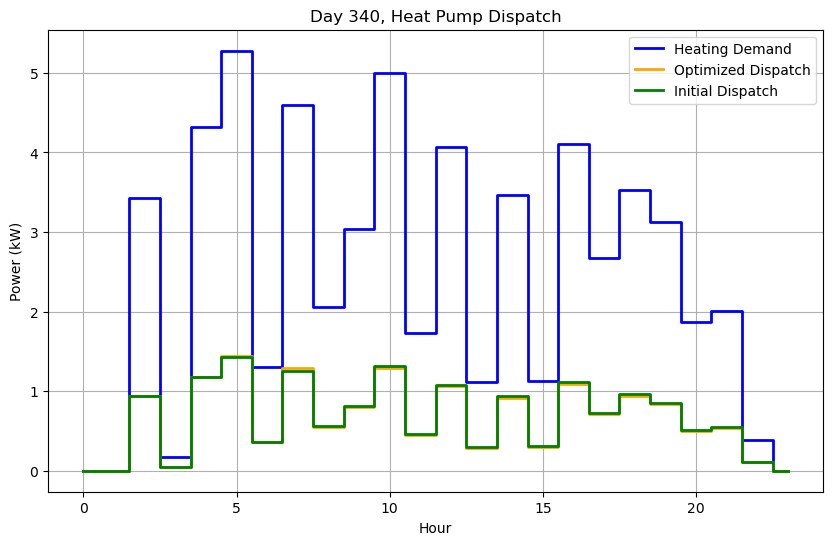


Day 341/365
Initial Guess Cost: €4.61
Optimized Daily Cost: €4.60
Total Heat Consumed (Qconsumption): 58.40 kWh
Total Heat Produced (Qproduction): 59.66 kWh
Buffer Tank Temperature at End of Day: 32.60°C
Optimized Dispatch: [2.70153157e-14 6.96780322e-03 2.75361132e-03 3.50653383e-01
 3.36857922e-01 7.22612250e-01 9.22865132e-02 3.71084800e-01
 1.17949944e-01 4.27711121e-01 2.63735131e-02 3.25637084e-01
 1.74427152e-02 2.07019608e-01 2.71102630e-01 2.33477870e-01
 1.61019126e-01 4.04375447e-01 3.79534667e-01 2.96789968e-01
 2.81604765e-01 2.98517646e-01 2.95980553e-02 1.35920634e-03]


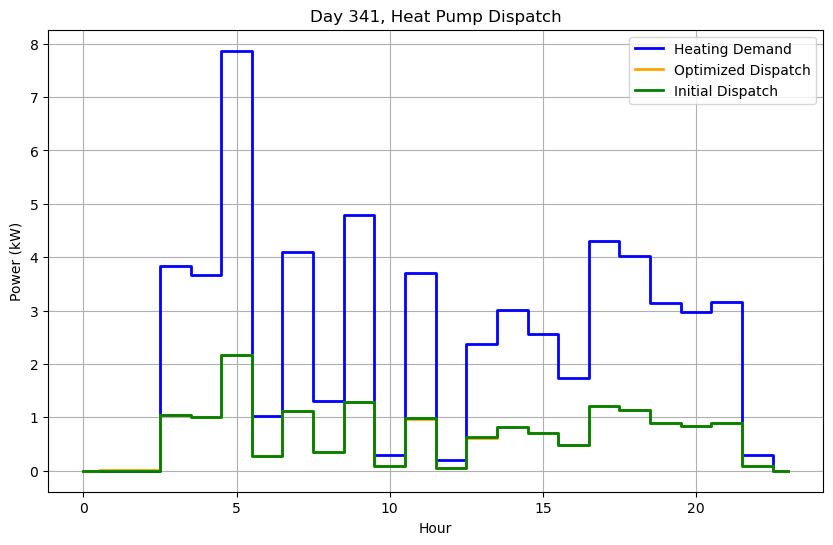


Day 342/365
Initial Guess Cost: €3.99
Optimized Daily Cost: €3.96
Total Heat Consumed (Qconsumption): 52.40 kWh
Total Heat Produced (Qproduction): 52.03 kWh
Buffer Tank Temperature at End of Day: 31.53°C
Optimized Dispatch: [5.95703934e-02 3.71072651e-17 1.93108007e-18 2.52424102e-01
 1.03961615e-01 1.64248401e-01 3.22552306e-01 5.24904752e-01
 2.98757261e-01 1.40960290e-01 2.59475051e-01 1.21975967e-01
 3.40375310e-01 7.99885632e-17 3.62032543e-01 4.99323111e-02
 2.98273274e-01 7.79296795e-02 2.89112961e-01 7.95061548e-02
 1.69664188e-01 1.83805760e-01 1.23627960e-01 3.68690558e-02]


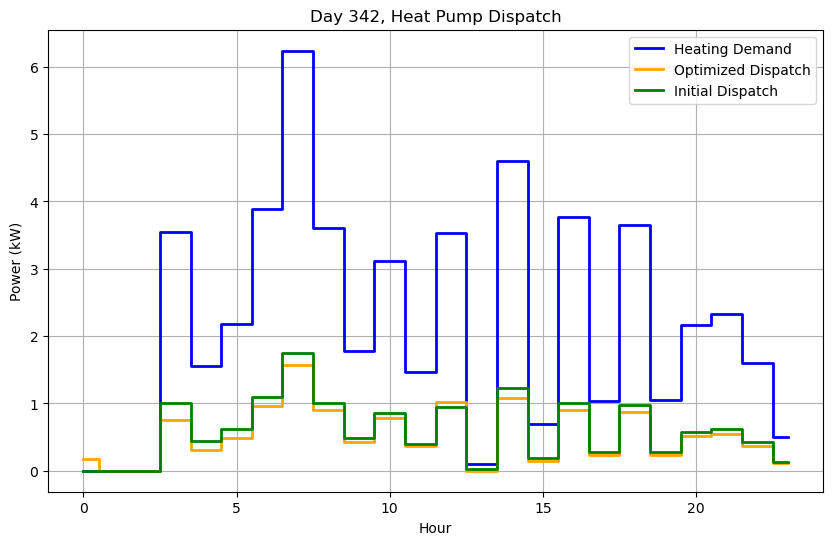


Day 343/365
Initial Guess Cost: €3.04
Optimized Daily Cost: €3.03
Total Heat Consumed (Qconsumption): 48.40 kWh
Total Heat Produced (Qproduction): 48.53 kWh
Buffer Tank Temperature at End of Day: 31.06°C
Optimized Dispatch: [3.16823527e-04 4.09534125e-04 5.20269032e-03 3.18385066e-05
 1.11238287e-02 6.52075655e-01 4.09960700e-01 2.00655808e-01
 4.23915536e-01 1.72266839e-02 2.59954622e-01 3.08465905e-02
 1.64405035e-01 2.39601000e-01 8.19230611e-02 3.07292293e-01
 2.66512458e-01 1.18257221e-01 2.43056166e-01 2.04604103e-01
 1.14841112e-01 4.12902882e-01 2.54688932e-02 8.37590648e-03]


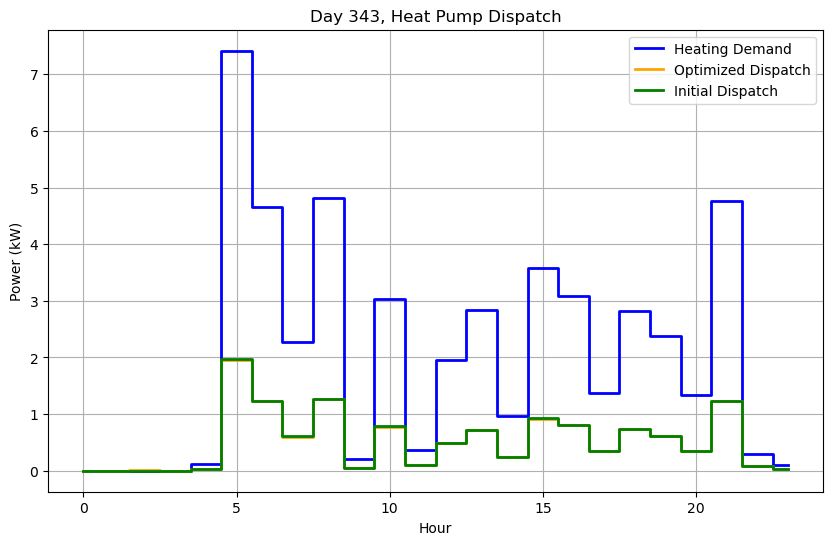


Day 344/365
Initial Guess Cost: €2.01
Optimized Daily Cost: €1.98
Total Heat Consumed (Qconsumption): 36.50 kWh
Total Heat Produced (Qproduction): 36.85 kWh
Buffer Tank Temperature at End of Day: 30.87°C
Optimized Dispatch: [1.52053673e-02 7.55671668e-03 7.99448882e-03 8.50132735e-03
 2.63054995e-01 2.88048904e-01 4.14723152e-01 6.03565073e-02
 3.08588291e-02 2.80564248e-01 2.06707792e-01 7.46872409e-03
 2.24161401e-02 2.39258204e-05 3.32199136e-01 1.51364024e-02
 3.53285506e-01 7.52578827e-02 7.53573748e-04 4.94429523e-01
 3.10090547e-02 7.20670581e-02 2.10306773e-02 1.53629233e-02]


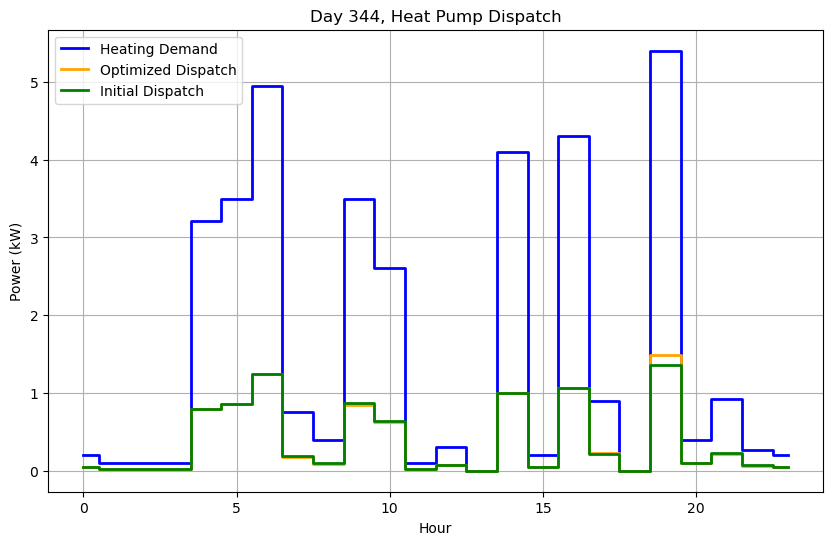


Day 345/365
Initial Guess Cost: €1.76
Optimized Daily Cost: €1.57
Total Heat Consumed (Qconsumption): 30.40 kWh
Total Heat Produced (Qproduction): 30.61 kWh
Buffer Tank Temperature at End of Day: 30.29°C
Optimized Dispatch: [9.82468661e-14 8.90770398e-04 4.42405510e-03 5.06408138e-01
 1.00000000e+00 4.01345356e-13 7.71222351e-15 8.18361114e-15
 8.24849641e-15 8.22664435e-15 1.15979960e-14 4.28095967e-13
 8.08216312e-13 8.92400548e-13 1.00000000e+00 1.98063200e-12
 9.68003727e-13 3.17855703e-13 9.29940715e-13 1.16515989e-12
 3.99277353e-12 5.50580105e-03 4.66398315e-03 2.18176009e-03]


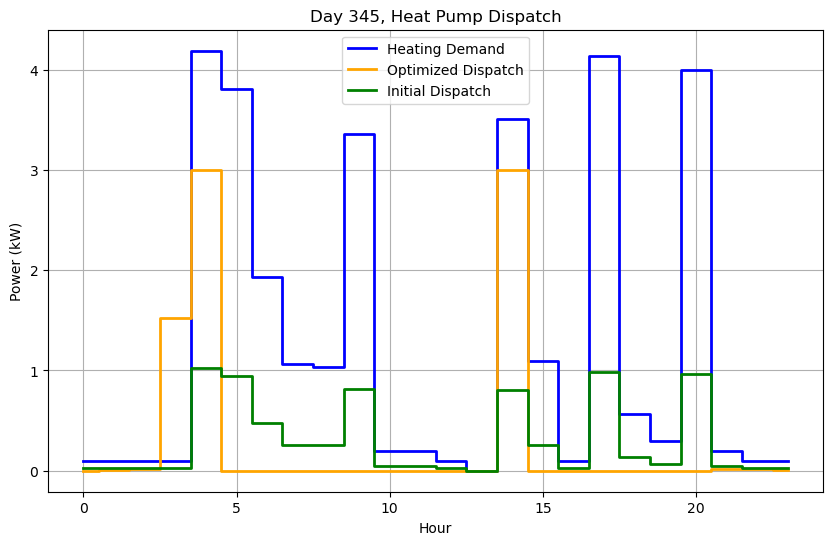


Day 346/365
Initial Guess Cost: €2.60
Optimized Daily Cost: €2.52
Total Heat Consumed (Qconsumption): 36.60 kWh
Total Heat Produced (Qproduction): 37.16 kWh
Buffer Tank Temperature at End of Day: 30.34°C
Optimized Dispatch: [8.03082040e-03 8.12554951e-03 3.73625483e-15 8.06558618e-03
 3.28674566e-01 5.35490771e-01 9.73752942e-02 3.57024750e-01
 6.82265302e-02 4.76614389e-01 1.55910439e-02 1.56344844e-02
 7.91032527e-04 2.18607045e-02 2.98827179e-01 3.92944621e-02
 1.24682816e-01 2.42130923e-01 1.84000359e-02 3.19349567e-01
 1.48503373e-02 7.37720820e-03 7.35828342e-03 1.29790487e-13]


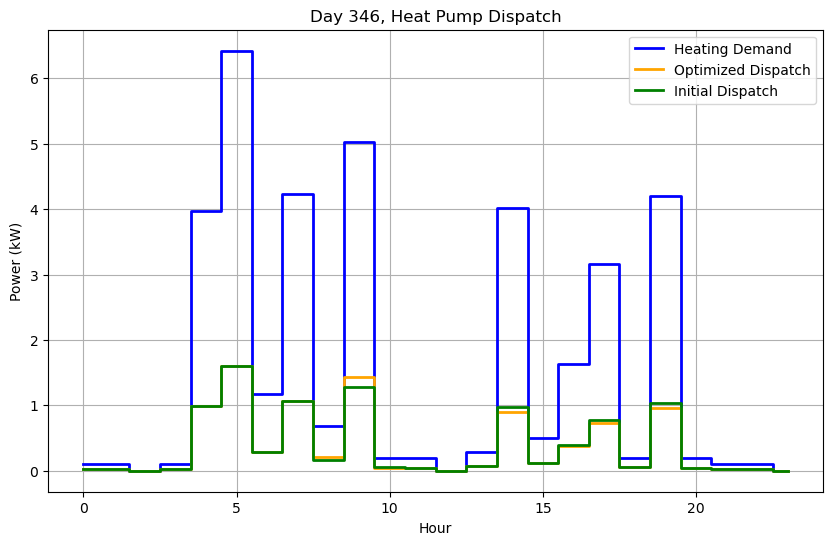


Day 347/365
Initial Guess Cost: €2.57
Optimized Daily Cost: €2.52
Total Heat Consumed (Qconsumption): 39.10 kWh
Total Heat Produced (Qproduction): 40.00 kWh
Buffer Tank Temperature at End of Day: 30.77°C
Optimized Dispatch: [1.81816707e-02 2.84555706e-04 8.80203425e-03 8.40266583e-03
 2.58311934e-01 5.03667714e-01 5.15783456e-02 3.89230654e-01
 3.04000768e-02 1.96593413e-02 9.59648124e-03 3.66420723e-01
 3.33362829e-02 9.63821495e-03 3.32631454e-01 6.52796428e-02
 2.67393151e-01 1.90835078e-01 2.44523166e-02 3.10510430e-01
 6.58625782e-02 2.42843023e-01 4.64383666e-02 1.70147868e-02]


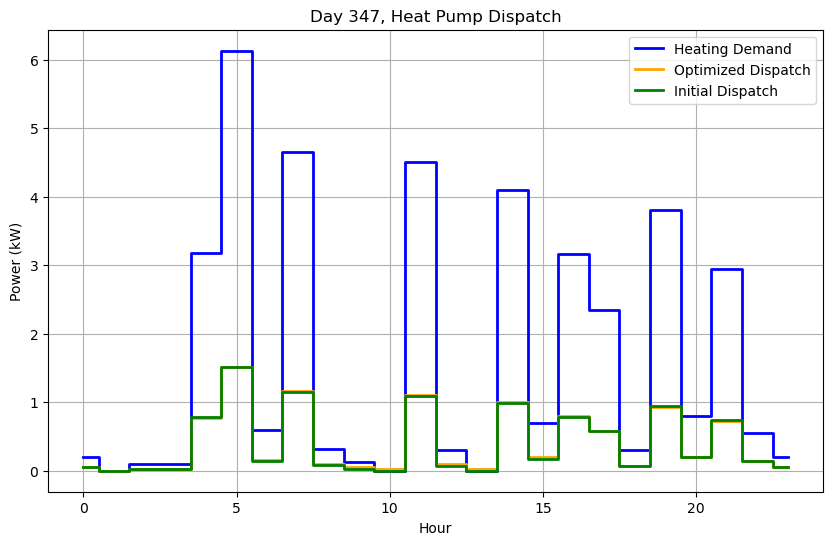


Day 348/365
Initial Guess Cost: €2.81
Optimized Daily Cost: €2.81
Total Heat Consumed (Qconsumption): 39.80 kWh
Total Heat Produced (Qproduction): 40.67 kWh
Buffer Tank Temperature at End of Day: 31.17°C
Optimized Dispatch: [0.00836243 0.00836238 0.00834584 0.00835326 0.03136379 0.68882143
 0.16456282 0.37088685 0.02786982 0.36378466 0.02445313 0.0078453
 0.00787876 0.02225081 0.36902782 0.1278323  0.2783229  0.0249518
 0.35298745 0.0617269  0.34958172 0.03712323 0.0114142  0.00270133]


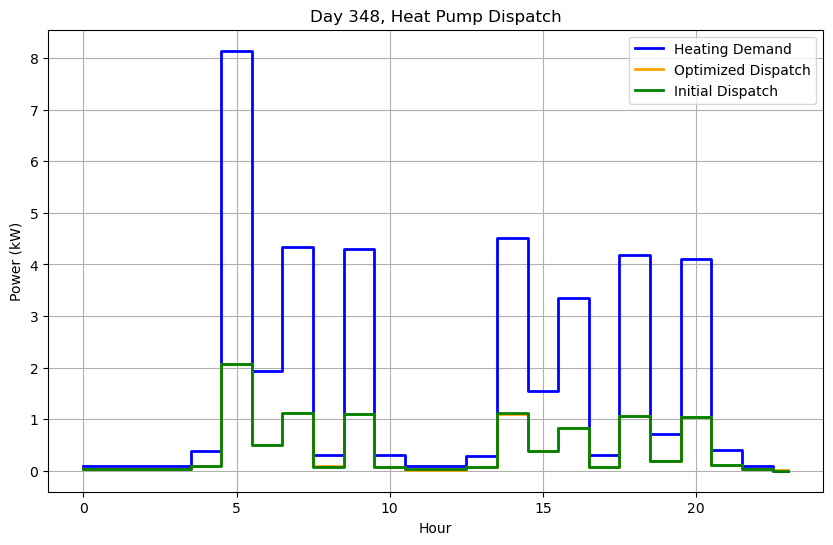


Day 349/365
Initial Guess Cost: €3.09
Optimized Daily Cost: €3.04
Total Heat Consumed (Qconsumption): 44.80 kWh
Total Heat Produced (Qproduction): 45.20 kWh
Buffer Tank Temperature at End of Day: 31.01°C
Optimized Dispatch: [1.73700352e-02 1.35865537e-06 1.11302243e-01 3.20770524e-01
 1.33047139e-02 2.40568411e-01 3.82340760e-01 3.98541902e-01
 2.69885741e-01 2.72968546e-01 8.55434620e-03 2.18607166e-16
 5.00906427e-02 3.01437997e-01 2.53787278e-02 1.88273091e-01
 2.59287849e-01 7.70205083e-02 3.13224713e-01 1.77544728e-02
 3.47797900e-01 3.50638452e-02 2.01481424e-01 3.90999588e-02]


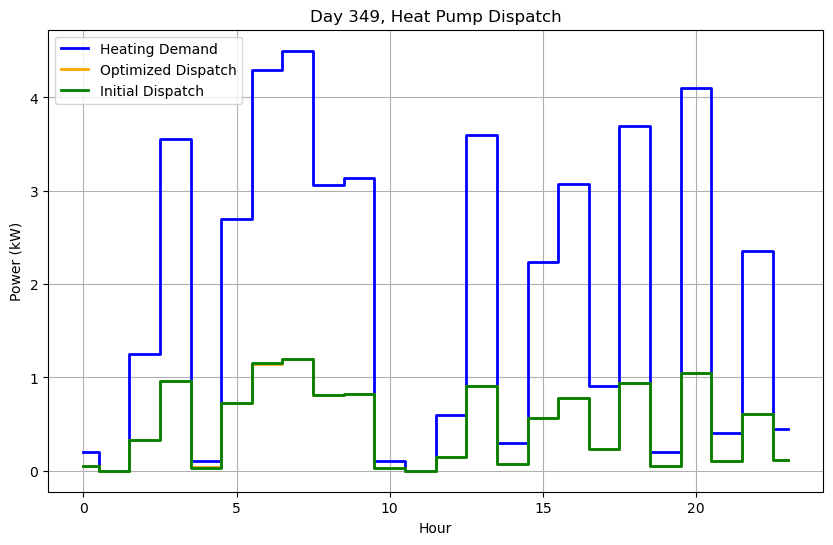


Day 350/365
Initial Guess Cost: €2.66
Optimized Daily Cost: €2.70
Total Heat Consumed (Qconsumption): 42.20 kWh
Total Heat Produced (Qproduction): 43.59 kWh
Buffer Tank Temperature at End of Day: 31.98°C
Optimized Dispatch: [1.66104554e-02 8.49959490e-03 8.50536681e-03 8.52477539e-03
 3.50984840e-20 7.71379774e-02 6.13052455e-01 1.45805222e-01
 4.18652906e-01 3.10465047e-02 2.05934081e-03 3.15516622e-01
 1.75506528e-02 9.50599178e-03 3.92713052e-01 6.20592481e-02
 4.27046535e-01 1.78607002e-02 3.18218580e-01 2.79618762e-01
 2.29116563e-01 2.74852014e-01 9.25628409e-20 2.24087304e-05]


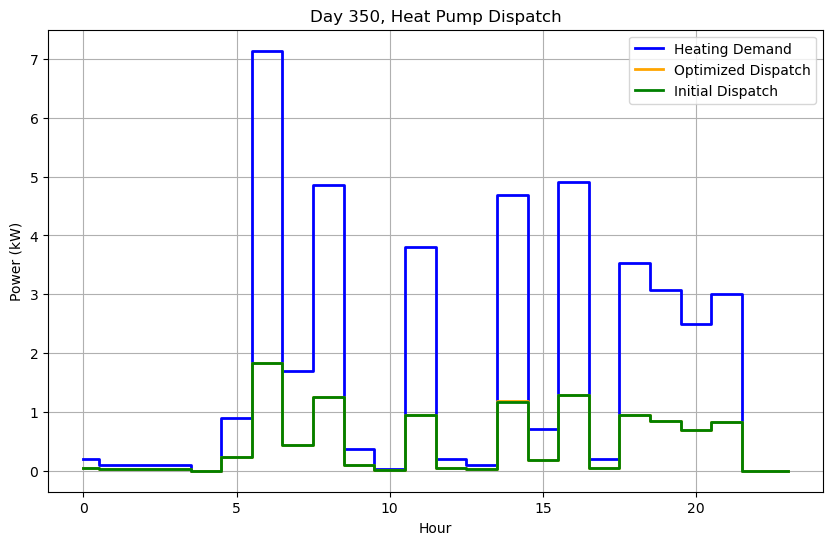


Day 351/365
Initial Guess Cost: €2.77
Optimized Daily Cost: €2.74
Total Heat Consumed (Qconsumption): 46.30 kWh
Total Heat Produced (Qproduction): 46.92 kWh
Buffer Tank Temperature at End of Day: 32.02°C
Optimized Dispatch: [2.11311761e-11 1.51376334e-09 6.00515423e-09 3.82930002e-03
 6.02126432e-01 7.05856237e-01 2.74467855e-01 2.82577096e-01
 2.78955827e-01 1.42158543e-01 8.63070099e-03 2.78089539e-05
 2.88421884e-01 6.99401228e-02 6.88683535e-04 1.69433465e-02
 3.23935778e-01 2.58031278e-01 3.33642606e-01 1.17898746e-01
 1.48300154e-01 3.22393638e-01 1.23219684e-02 2.79075958e-13]


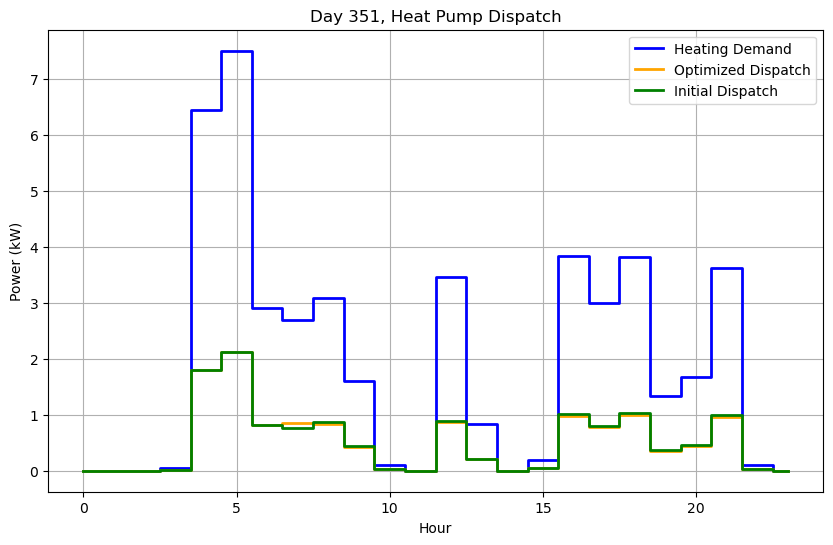


Day 352/365
Initial Guess Cost: €3.07
Optimized Daily Cost: €3.06
Total Heat Consumed (Qconsumption): 44.70 kWh
Total Heat Produced (Qproduction): 45.23 kWh
Buffer Tank Temperature at End of Day: 31.96°C
Optimized Dispatch: [1.91903485e-12 6.48836593e-15 6.34496809e-14 2.27310503e-09
 3.09216404e-01 7.19492280e-01 4.97989299e-01 9.94193840e-02
 3.88988863e-01 1.79593404e-02 1.79631034e-01 1.93756855e-01
 1.24803923e-04 1.59057988e-04 2.70116106e-01 9.10766150e-02
 2.30354982e-01 1.25798757e-01 2.34944089e-01 3.58069739e-02
 3.72626261e-01 2.87472545e-01 1.09931984e-02 1.16765462e-11]


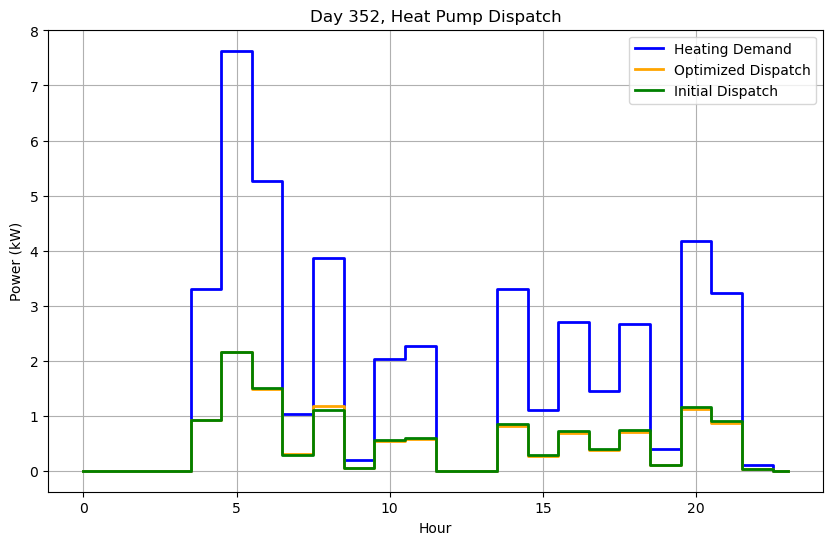


Day 353/365
Initial Guess Cost: €2.85
Optimized Daily Cost: €2.68
Total Heat Consumed (Qconsumption): 41.00 kWh
Total Heat Produced (Qproduction): 40.76 kWh
Buffer Tank Temperature at End of Day: 31.02°C
Optimized Dispatch: [1.29960938e-04 1.23417379e-02 2.80427251e-02 2.28820727e-04
 3.13451946e-01 7.21604144e-01 5.59524263e-01 1.12112152e-01
 2.65640272e-01 1.02727647e-02 3.03086621e-01 6.82065936e-02
 3.40639103e-02 1.09677579e-02 2.99854102e-01 6.29881042e-02
 2.38302401e-01 1.49758149e-01 3.40153449e-01 3.48708709e-02
 5.35270394e-08 9.46991018e-02 2.90421573e-02 1.46504410e-02]


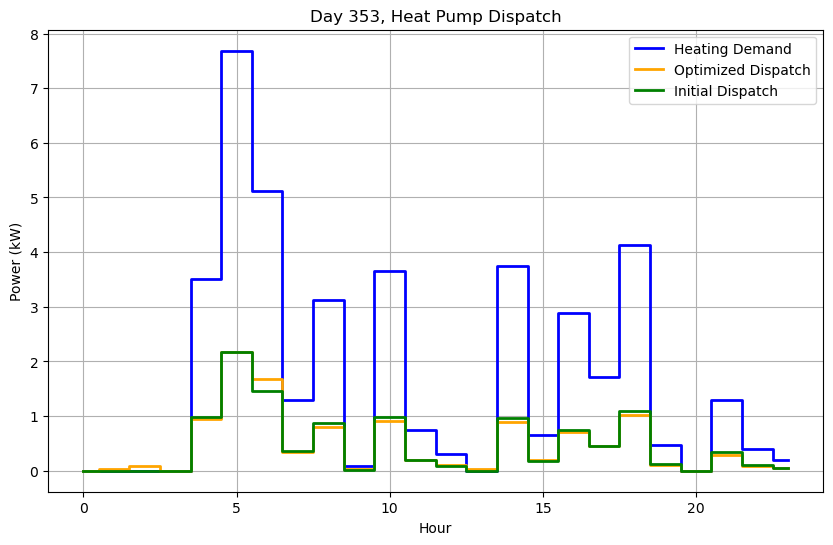


Day 354/365
Initial Guess Cost: €2.60
Optimized Daily Cost: €2.58
Total Heat Consumed (Qconsumption): 43.70 kWh
Total Heat Produced (Qproduction): 44.44 kWh
Buffer Tank Temperature at End of Day: 31.25°C
Optimized Dispatch: [2.65143087e-16 4.98813323e-08 3.13476812e-07 2.11025695e-16
 3.61874503e-01 6.38378668e-01 5.31174454e-02 3.88415852e-01
 1.74826955e-02 3.87549769e-01 4.28170465e-02 1.41842867e-06
 3.46367276e-01 8.48762100e-02 9.29182496e-02 3.27405787e-01
 8.41293618e-02 3.39396075e-01 6.05196849e-02 3.30686244e-01
 5.78221199e-02 1.30330350e-01 2.75708035e-02 5.10409126e-17]


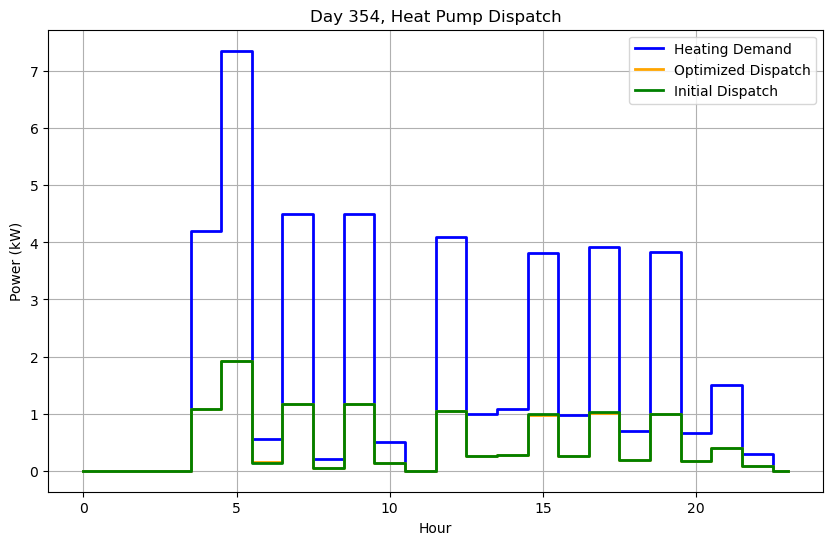


Day 355/365
Initial Guess Cost: €2.17
Optimized Daily Cost: €2.19
Total Heat Consumed (Qconsumption): 46.50 kWh
Total Heat Produced (Qproduction): 46.95 kWh
Buffer Tank Temperature at End of Day: 31.18°C
Optimized Dispatch: [7.59585115e-17 3.50087449e-17 3.10806318e-17 2.53297841e-17
 3.48346866e-01 5.19073597e-01 2.45331855e-01 1.48836885e-01
 1.12810228e-01 2.37146409e-01 1.77315974e-05 1.57319408e-01
 1.94893115e-01 2.38457002e-02 1.29306308e-01 2.56448047e-01
 2.53749461e-01 3.14228301e-01 2.05298335e-01 1.93153978e-01
 1.42797105e-01 2.94719298e-01 4.08812319e-02 1.05658847e-02]


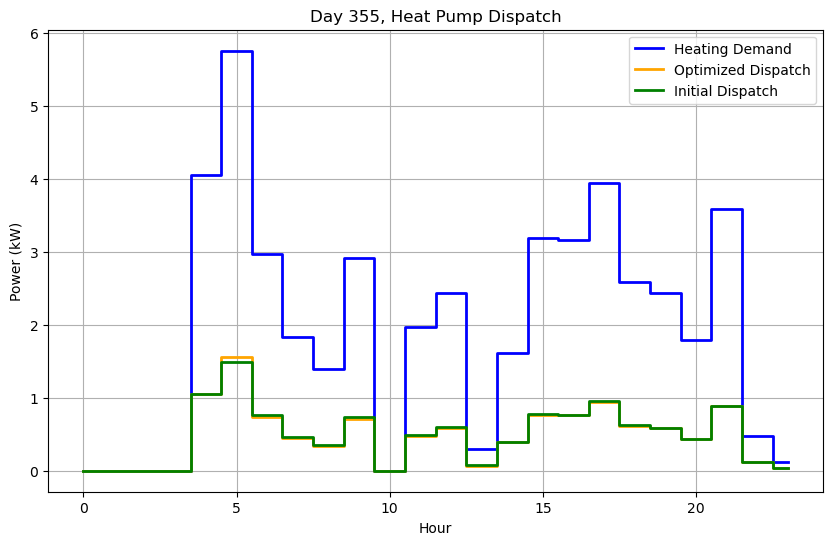


Day 356/365
Initial Guess Cost: €3.52
Optimized Daily Cost: €3.50
Total Heat Consumed (Qconsumption): 73.40 kWh
Total Heat Produced (Qproduction): 73.33 kWh
Buffer Tank Temperature at End of Day: 30.50°C
Optimized Dispatch: [1.75157989e-02 4.08227509e-01 1.66877331e-01 3.69950009e-18
 2.50805945e-01 6.29570421e-01 6.20443544e-01 6.23963188e-01
 8.76705695e-02 5.85810817e-01 3.17472350e-02 5.77481957e-02
 5.02977235e-01 4.99813408e-02 4.39304818e-01 3.11252793e-02
 1.85416062e-01 3.39822897e-01 1.51620314e-01 1.78865972e-01
 2.86864564e-01 4.75569832e-02 3.58631391e-01 2.31977453e-02]


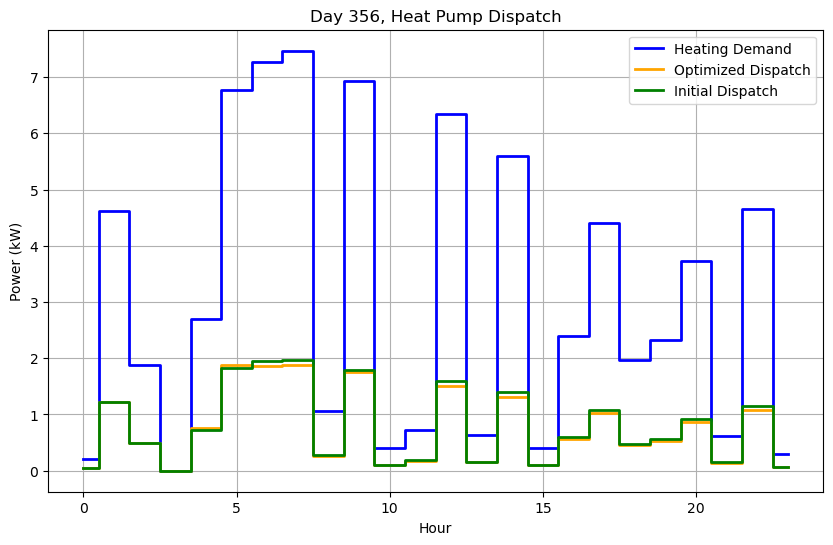


Day 357/365
Initial Guess Cost: €3.00
Optimized Daily Cost: €2.94
Total Heat Consumed (Qconsumption): 59.20 kWh
Total Heat Produced (Qproduction): 59.65 kWh
Buffer Tank Temperature at End of Day: 30.44°C
Optimized Dispatch: [0.04631964 0.02520094 0.11576512 0.38083127 0.01425239 0.2620318
 0.62028331 0.26373351 0.29888099 0.1496029  0.34922975 0.0265705
 0.16179456 0.11733636 0.25066359 0.23319902 0.07967029 0.00333506
 0.28593166 0.16380516 0.39847259 0.04100912 0.29589498 0.01369729]


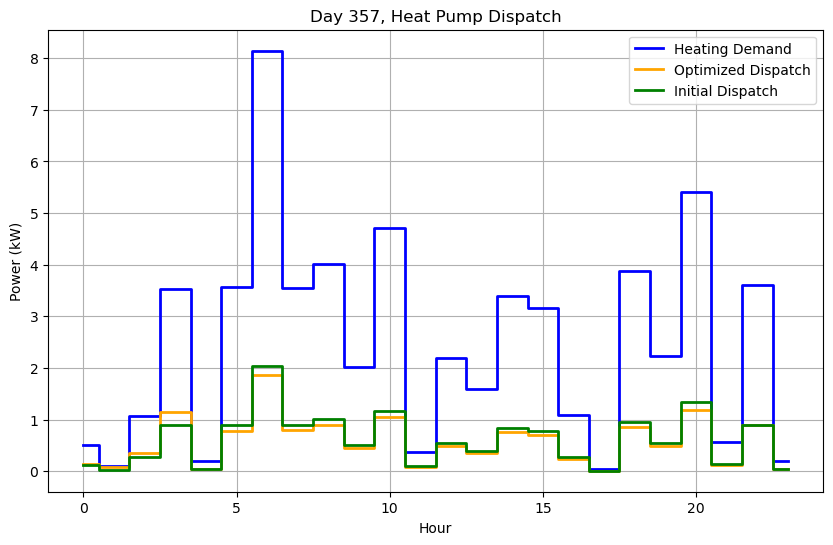


Day 358/365
Initial Guess Cost: €1.81
Optimized Daily Cost: €1.79
Total Heat Consumed (Qconsumption): 46.80 kWh
Total Heat Produced (Qproduction): 47.00 kWh
Buffer Tank Temperature at End of Day: 30.10°C
Optimized Dispatch: [9.06764503e-03 2.51474333e-02 1.66909479e-02 8.00290036e-03
 3.02386382e-01 6.71754542e-01 2.39540268e-01 1.98185635e-01
 7.41701630e-02 3.36537288e-01 2.96676190e-01 5.86164263e-02
 2.66493137e-01 5.25143064e-02 1.81712666e-01 1.29547651e-01
 6.17674586e-02 3.44822883e-01 4.90256144e-02 4.18143172e-01
 2.33202048e-02 7.72189635e-03 7.69872539e-03 5.21132813e-13]


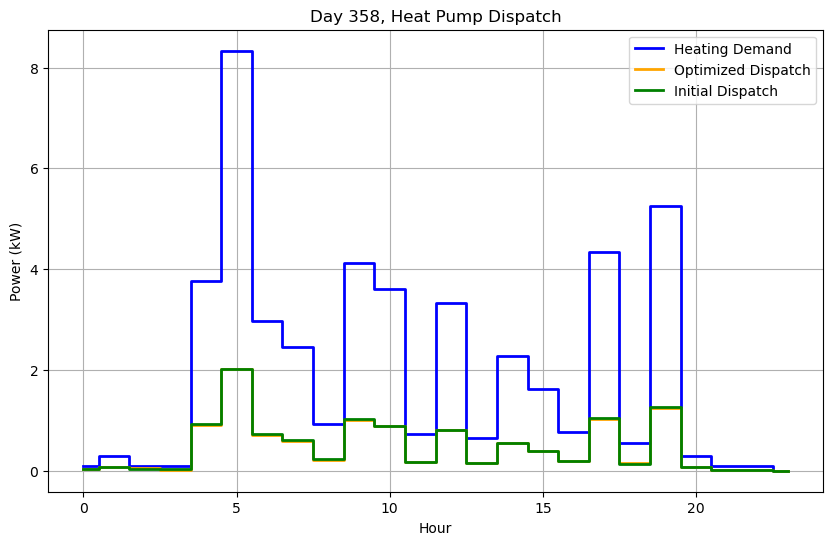


Day 359/365
Initial Guess Cost: €1.91
Optimized Daily Cost: €1.91
Total Heat Consumed (Qconsumption): 48.60 kWh
Total Heat Produced (Qproduction): 49.12 kWh
Buffer Tank Temperature at End of Day: 30.13°C
Optimized Dispatch: [0.00795038 0.00804736 0.00802088 0.24964149 0.25851414 0.43986707
 0.26640427 0.03223154 0.35745012 0.11906701 0.29184415 0.2325702
 0.21594351 0.02193244 0.1914156  0.11432627 0.23885961 0.07824456
 0.33970948 0.02346722 0.26699959 0.02366817 0.063465   0.02354894]


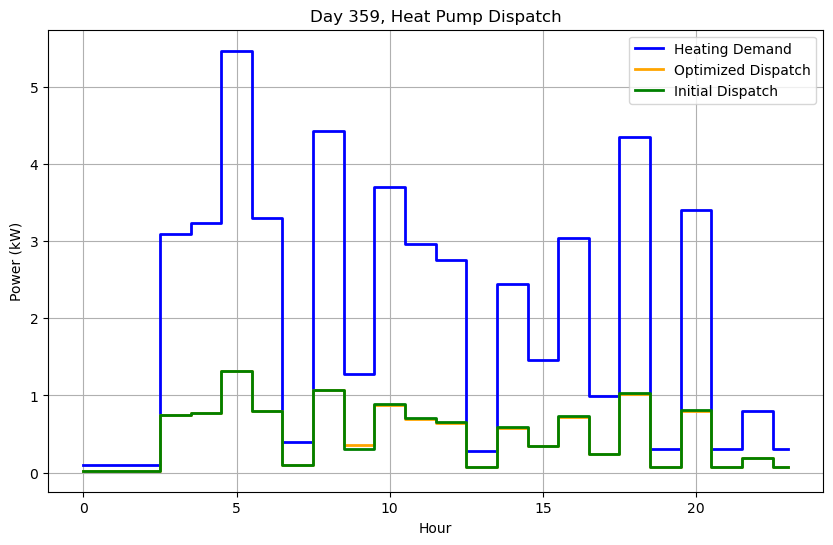


Day 360/365
Initial Guess Cost: €1.46
Optimized Daily Cost: €1.47
Total Heat Consumed (Qconsumption): 33.20 kWh
Total Heat Produced (Qproduction): 34.27 kWh
Buffer Tank Temperature at End of Day: 30.78°C
Optimized Dispatch: [0.0079416  0.00794284 0.00205793 0.01391335 0.27585814 0.48534956
 0.43089252 0.09781709 0.11976859 0.03137134 0.02020073 0.0127115
 0.25058834 0.0587403  0.08373903 0.01545098 0.33589547 0.01482218
 0.07185168 0.2649951  0.02384395 0.07528599 0.01653206 0.01696366]


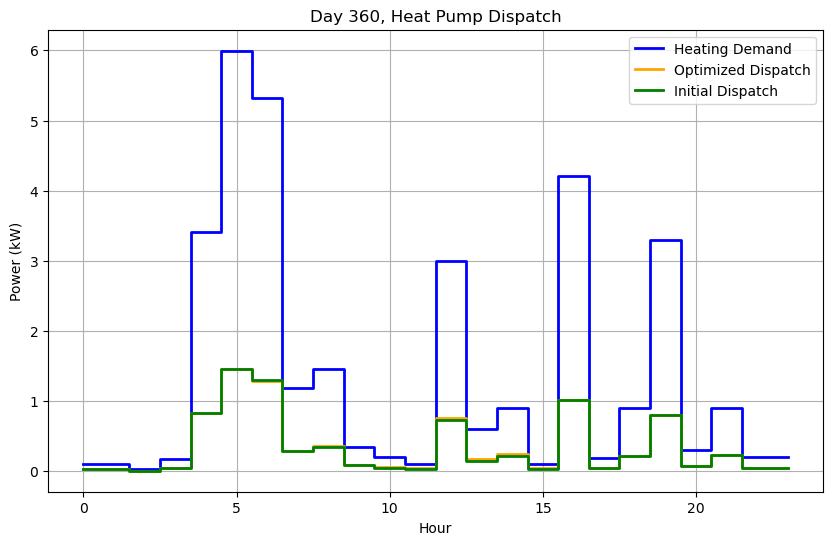


Day 361/365
Initial Guess Cost: €2.21
Optimized Daily Cost: €2.15
Total Heat Consumed (Qconsumption): 35.90 kWh
Total Heat Produced (Qproduction): 37.10 kWh
Buffer Tank Temperature at End of Day: 31.54°C
Optimized Dispatch: [8.53260344e-03 9.16384195e-03 8.43773256e-03 7.49438290e-18
 1.01260045e-01 6.68986779e-01 2.31094648e-01 2.86670615e-01
 3.74847331e-02 2.65063684e-01 8.15029421e-03 1.60299162e-02
 1.59796050e-02 1.40427586e-08 7.21107051e-02 1.59992305e-01
 1.71727117e-01 1.74415809e-01 1.76479533e-01 9.27577375e-02
 2.53326279e-01 2.47694173e-01 5.22730782e-02 1.25484273e-07]


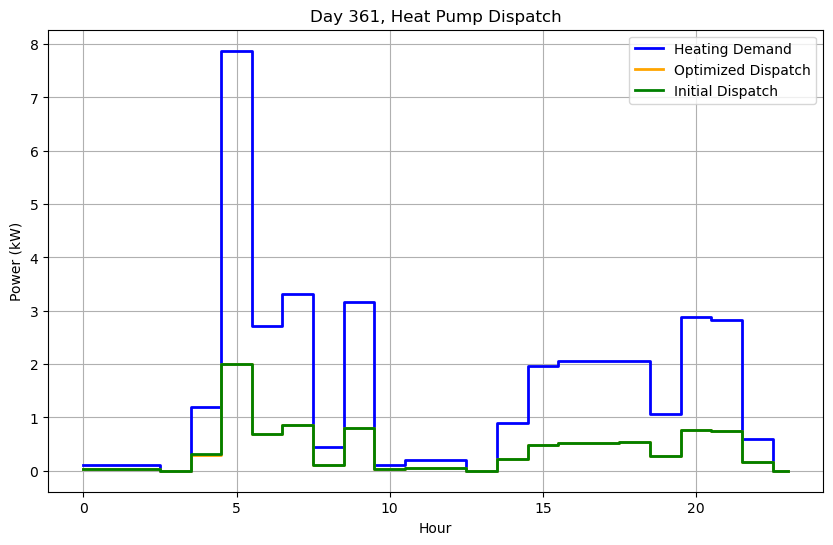


Day 362/365
Initial Guess Cost: €1.25
Optimized Daily Cost: €1.14
Total Heat Consumed (Qconsumption): 27.00 kWh
Total Heat Produced (Qproduction): 26.28 kWh
Buffer Tank Temperature at End of Day: 30.11°C
Optimized Dispatch: [0.00695973 0.00536352 0.00244281 0.06791471 0.3796947  0.33495284
 0.2523771  0.03090687 0.01466494 0.0073268  0.01151628 0.00306539
 0.08178818 0.00869729 0.0099476  0.27998904 0.02153819 0.02906944
 0.23098331 0.03712506 0.04586658 0.32250339 0.00723258 0.01442855]


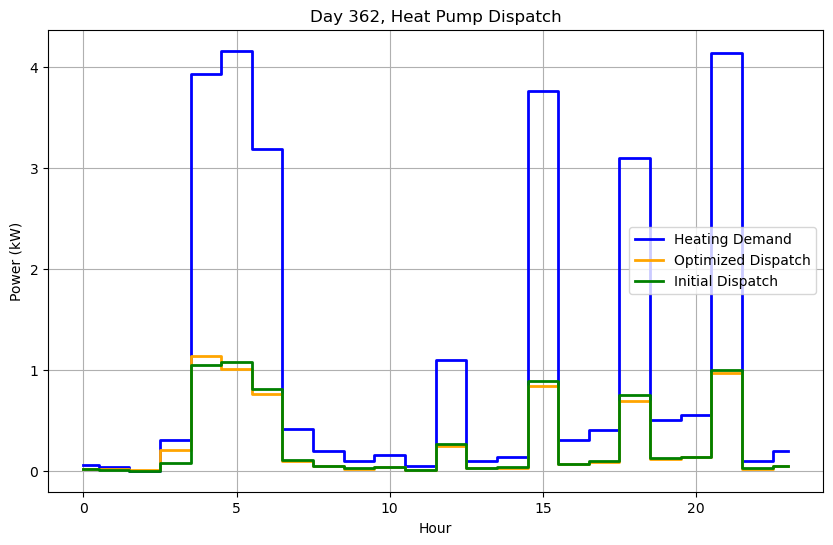


Day 363/365
Initial Guess Cost: €1.26
Optimized Daily Cost: €1.23
Total Heat Consumed (Qconsumption): 29.40 kWh
Total Heat Produced (Qproduction): 30.15 kWh
Buffer Tank Temperature at End of Day: 30.40°C
Optimized Dispatch: [0.01607281 0.00484442 0.00791588 0.00785621 0.00783883 0.25997448
 0.10600413 0.26360909 0.1758348  0.04078392 0.01686165 0.13648515
 0.10159703 0.00961439 0.00963583 0.00926209 0.37416334 0.02543011
 0.30152695 0.04330018 0.09399556 0.2724794  0.07201491 0.02402146]


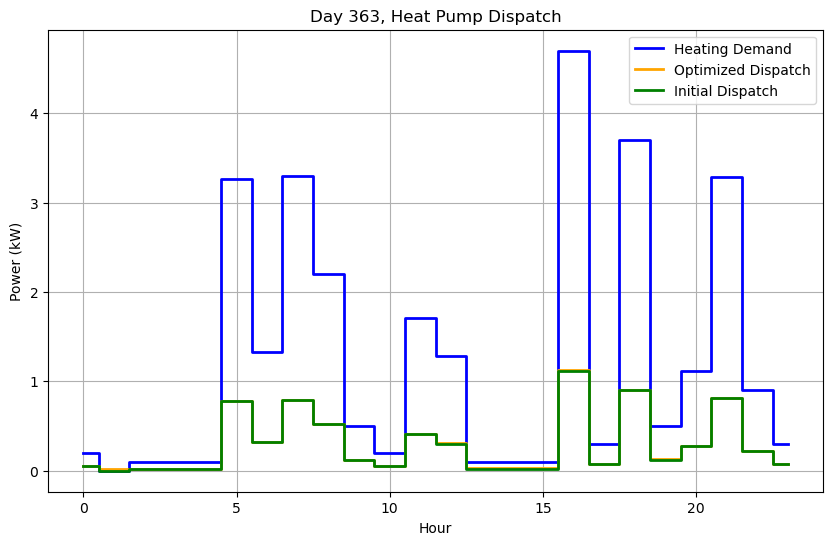


Day 364/365
Initial Guess Cost: €1.87
Optimized Daily Cost: €1.89
Total Heat Consumed (Qconsumption): 34.80 kWh
Total Heat Produced (Qproduction): 36.22 kWh
Buffer Tank Temperature at End of Day: 31.43°C
Optimized Dispatch: [0.0240849  0.00830879 0.00986166 0.01474469 0.01064593 0.2681625
 0.17164984 0.06772401 0.39631157 0.17222713 0.01561211 0.01763316
 0.01799301 0.06473294 0.02833487 0.33220374 0.12873568 0.40727672
 0.14454027 0.1592804  0.30982948 0.03359972 0.1133003  0.04426955]


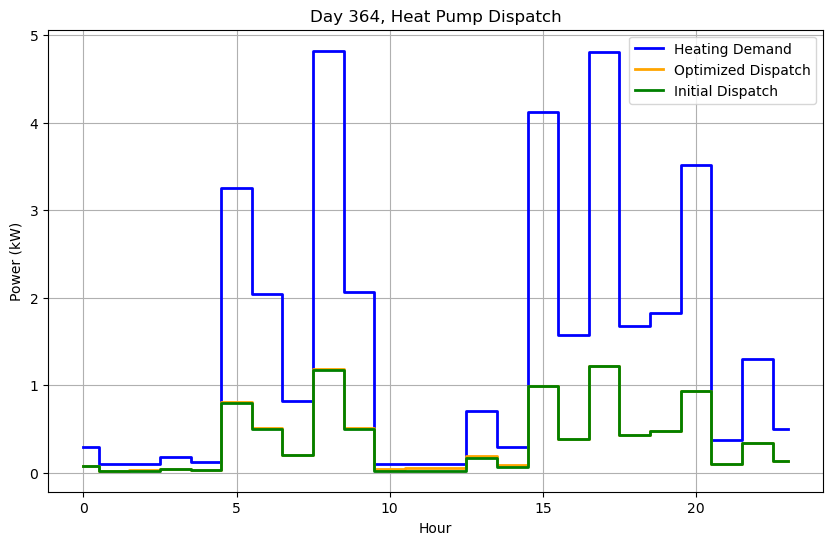


Day 365/365
Initial Guess Cost: €1.73
Optimized Daily Cost: €1.72
Total Heat Consumed (Qconsumption): 39.20 kWh
Total Heat Produced (Qproduction): 39.63 kWh
Buffer Tank Temperature at End of Day: 31.30°C
Optimized Dispatch: [5.30512315e-14 5.28073205e-09 1.10315432e-16 1.88638770e-01
 2.42048915e-01 4.66688632e-01 3.93079552e-01 2.18956078e-01
 1.63112910e-01 4.46958502e-02 1.20184538e-01 1.06373643e-01
 1.65865397e-02 2.54161482e-02 3.46506129e-01 2.64390720e-02
 1.18188760e-01 2.00538592e-01 1.81457572e-02 3.24260791e-01
 2.11260538e-02 3.08281736e-01 3.58977163e-02 2.25564532e-02]


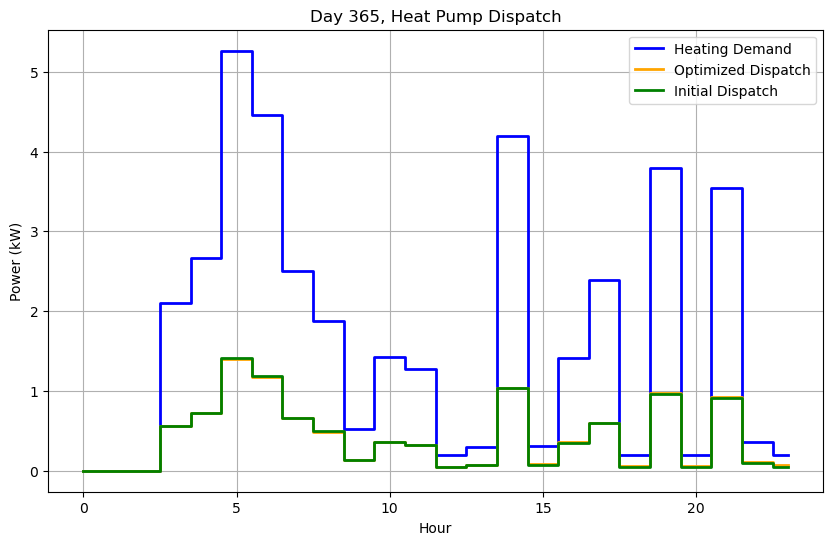

In [7]:
num_days = len(yearly_data) // 24
Tbuffer = Tinit
results = []
dispatch_list = []  
buffer_temp_list = []
flow_temp_list = []

for day in range(num_days):
    start_idx, end_idx = day * 24, (day + 1) * 24
    Tout_day = yearly_data["Tout"].iloc[start_idx:end_idx].values
    Qhouse_day = yearly_data["Qhouse"].iloc[start_idx:end_idx].values
    p_day = yearly_data["Price_el"].iloc[start_idx:end_idx].values
    Tflow_day = heatingcurve_slope * Tout_day + heatingcurve_offset + spread_temp

    # Initial Guess and Bounds
    x0 = np.clip(Qhouse_day / (Pel * cop_interp((Tflow_day, Tout_day))), 0, 1)
    bounds = [(0, 1)] * len(x0)

    # Initial Cost Calculation
    initial_cost = hp_costs(x0, Tbuffer, Tout_day, Tflow_day, Qhouse_day, p_day)
    
    # Perform Optimization
    result = minimize(hp_costs, x0, args=(Tbuffer, Tout_day, Tflow_day, Qhouse_day, p_day), method="SLSQP", bounds=bounds)

    # Evaluate Optimized Results
    cost, real_cost, penalty_cost, Tbuffer_history, Qproduced = hp_sim(result.x, Tbuffer, Tout_day, Tflow_day, Qhouse_day, p_day)

    # Store Optimized Dispatch
    dispatch_list.append(result.x)

    # Store Results
    Qproduction = Qproduced.sum()
    Qconsumption = Qhouse_day.sum()
    buffer_temp_end = Tbuffer_history[-1]

    results.append([initial_cost, cost, real_cost, penalty_cost, Qconsumption, Qproduction])
    buffer_temp_list.append(Tbuffer_history)
    flow_temp_list.append(Tflow_day)

    # Print Daily Optimization Summary
    print(f"\nDay {day+1}/{num_days}")
    print(f"Initial Guess Cost: €{initial_cost:.2f}")
    print(f"Optimized Daily Cost: €{cost:.2f}")
    print(f"Total Heat Consumed (Qconsumption): {Qconsumption:.2f} kWh")
    print(f"Total Heat Produced (Qproduction): {Qproduction:.2f} kWh")
    print(f"Buffer Tank Temperature at End of Day: {buffer_temp_end:.2f}°C")
    print(f"Optimized Dispatch: {result.x}")

    # Plots
    plt.figure(figsize=(10, 6))
    plt.step(range(24), Qhouse_day, label="Heating Demand", where="mid", linewidth=2, color="blue")
    plt.step(range(24), result.x * Pel, label="Optimized Dispatch", where="mid", linewidth=2, color="orange")
    plt.step(range(24), x0 * Pel, label="Initial Dispatch", where="mid", linewidth=2, color="green")
    plt.title(f"Day {day+1}, Heat Pump Dispatch")
    plt.xlabel("Hour")
    plt.ylabel("Power (kW)")
    plt.legend()
    plt.grid()
    plt.show()

    # Update Tbuffer for next day
    Tbuffer = buffer_temp_end

# Convert results to DataFrame
yearly_results = pd.DataFrame(results, columns=[
    "Initial Cost (€)", "Total Cost (€)", "Real Cost (€)", "Penalty Cost (€)",
    "Total Consumed Heat (kWh)", "Total Produced Heat (kWh)"
])

# Store Buffer and Flow Temperatures
yearly_results["Buffer Temperature (°C)"] = np.concatenate(buffer_temp_list)[:len(yearly_results)]
yearly_results["Flow Temperature (°C)"] = np.concatenate(flow_temp_list)[:len(yearly_results)]

# Store optimized dispatch values as a separate DataFrame
dispatch_df = pd.DataFrame(np.vstack(dispatch_list), columns=[f"Hour_{i}" for i in range(24)])

# 8. Results

In [8]:
total_initial_guess_cost = yearly_results["Initial Cost (€)"].sum()
total_optimized_cost = yearly_results["Total Cost (€)"].sum()

print(f"Total Initial Guess Cost: €{total_initial_guess_cost:.2f}")
print(f"Total Optimized Daily Cost: €{total_optimized_cost:.2f}")
print(f"Total Cost Reduction: €{total_initial_guess_cost - total_optimized_cost:.2f}")

Total Initial Guess Cost: €555.39
Total Optimized Daily Cost: €542.17
Total Cost Reduction: €13.22


In [9]:
print(f"Total Yearly Cost (real + penalty): €{yearly_results['Total Cost (€)'].sum():.2f}")
print(f"Total Real Electricity Cost (electric energy only): €{yearly_results['Real Cost (€)'].sum():.2f}")
print(f"Total Penalty Cost: €{yearly_results['Penalty Cost (€)'].sum():.2f}")
print(f"Total Heat Consumed: {yearly_results['Total Consumed Heat (kWh)'].sum():.2f} kWh")
print(f"Total Heat Produced: {yearly_results['Total Produced Heat (kWh)'].sum():.2f} kWh")

Total Yearly Cost (real + penalty): €542.17
Total Real Electricity Cost (electric energy only): €532.11
Total Penalty Cost: €10.05
Total Heat Consumed: 7400.60 kWh
Total Heat Produced: 7611.18 kWh


# 9. Conclusion

The simulation results indicate that oversizing the heat pump and buffer tank system is not economically beneficial. When higher investment costs are considered, the additional operational savings from larger systems are too small to justify the cost. This conclusion is backed by structured simulations using real dynamic electricity price data and aligns with modern cost-optimization strategies in decentralized heating.
.
